In [36]:
import os
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from scipy import stats
import random
import math
import time
import os
list2=['ECUMS.65482.SPEED_KMPH','ECUMS.65482.EV Bus SOC','BMS_A.63509.SOC','BMS_B.63509.SOC','BMS_C.63509.SOC','BMS_D.63509.SOC','BMS_E.63509.SOC','BMS_F.63509.SOC']
list=['DateTime','ECUMS.65482.SPEED_KMPH','ECUMS.65482.EV Bus SOC','BMS_A.63509.SOC','BMS_B.63509.SOC','BMS_C.63509.SOC','BMS_D.63509.SOC','BMS_E.63509.SOC','BMS_F.63509.SOC','ECUMS.65482.Veh Total Dist Cuml','DipEmergencyStop','DipForward','DipNeutral','DipReverse','DipBoost','DipDigitalBrake','DipCrank','DipIgnition']

In [37]:
os.chdir(r'C:\Users\GauravS21\Desktop\KPIT WORK\temp')

In [38]:
os.listdir()

['four', 'one', 'three']

In [39]:
parent_dir=os.getcwd()

In [40]:
parent_dir

'C:\\Users\\GauravS21\\Desktop\\KPIT WORK\\temp'

In [41]:
class hmm2:
    def __init__(self,sequence,number_states=3,number_output=3,epochs=750):
        
        self.seq=sequence
        self.states=number_states
        self.output=number_output
        self.T=len(sequence)
        self.maxiter=epochs
        self.iter=0
        self.oldlogprob=-math.inf
        self.epochs=epochs
        self.sum_trans=[]
        self.sum_emiss=[]
        ## Initialize transition, Emmision, Initial Prob matrix
        
        #self.pie=np.empty(number_states)
        #self.pie.fill(1/number_states)
        self.pie=np.random.dirichlet(np.ones(number_states),size=1)[0] #row statistics
        #self.pie=np.random.uniform(0,1,(number_states)) 
        
        self.transition=np.empty((number_states,number_states))       #row statistics
        for i in range(number_states):
            self.transition[i]=np.random.dirichlet(np.ones(number_states),size=1)
        #self.transition=np.random.uniform(0,1,(number_states,number_states)) 
        #self.transition.fill(1/number_states)
        
        self.emmision=np.empty((number_states,number_output))
        
        for i in range(number_states):
            self.emmision[i]=np.random.dirichlet(np.ones(number_output),size=1) #row statistics
            
        #self.emmision=np.random.uniform(0,1,(number_states,number_output)) 
        #self.emmision.fill(1/number_output)
        
        print("pie")
        print(self.pie)
        print("Transition Matrix")
        print(self.transition)
        print("Emmission Matrix")
        print(self.emmision)
        
        ## Initialize the Alpha, Beta, C matrix
        self.alpha=np.zeros(shape=(number_states,self.T))
        self.beta=np.zeros(shape=(number_states,self.T))
        self.C=np.zeros(self.T)
        
        ##Intitialize the gamma and dual gamma matrix
        
        self.dual_gamma=np.zeros(shape=(number_states,number_states,self.T))
        self.gamma=np.zeros(shape=(number_states,self.T))
        
        
    def alpha_pass(self):
        S=self.states
        T=self.T
        
        
        for time in range(T):
            c=0
            for states in range(S):
                self.alpha[states][time]=0
                if(time==0):
                    self.alpha[states][time]=self.pie[states]*self.emmision[states][self.seq[time]]
                else:
                    for pre_state in range(S):
                        self.alpha[states][time]+=self.transition[pre_state][states]*self.alpha[pre_state][time-1]*self.emmision[states][self.seq[time]]
            for states in range(S):
                c+=self.alpha[states][time]
                        
            for states in range(S):
                self.alpha[states][time]=self.alpha[states][time]/c
                
            self.C[time]=1/c  
                
        #print("Alpha")
        #print(self.alpha)
        #print("C")
        #print(self.C)
        
    def beta_pass(self):
        
        S=self.states
        T=self.T
        
        for time in range(T-1,-1,-1):
            c=0
            for states in range(S):
                self.beta[states][time]=0
                if(time==T-1):
                    self.beta[states][time]=self.C[time]  
                    continue
                for nxt_state in range(S):
                       self.beta[states][time]+=self.beta[nxt_state][time+1]*self.transition[states][nxt_state]*self.emmision[nxt_state][self.seq[time+1]]*self.C[time]
        
        #print("BETA")        
        #print(self.beta)
        
    def gamma_pass(self):
        S=self.states
        T=self.T
        
        for t in range(T-1):
            c=0
            c1=0
            for state in range(S):
                self.gamma[state][t]=0
                c1=0
                for state2 in range(S):
                    self.dual_gamma[state][state2][t]=self.alpha[state][t]*self.transition[state][state2]*self.emmision[state2][self.seq[t+1]]*self.beta[state2][t+1]
                    self.gamma[state][t]+=self.dual_gamma[state][state2][t]
                
        for state in range(S):
            self.gamma[state][T-1]=self.alpha[state][T-1]
            
        #print(self.dual_gamma)
        #print(" ")
        #print(" ")
        #print(self.gamma)
        
        
    
        
    def forward_backward(self):
        S=self.states
        T=self.T
        out=self.output
        deno=0
        numo=0
        k=0
        for state in range(S):
            self.pie[state]=self.gamma[state][0]
        
        
        for state_i in range(S):
            deno=0
            for time in range(T-1):
                deno+=self.gamma[state_i][time]
                
            for state_j in range(S):
                numo=0
                for time in range(T-1):
                    numo+=self.dual_gamma[state_i][state_j][time]
                m=self.transition[state_i][state_j]
                self.transition[state_i][state_j]=numo/deno
                k+=m-self.transition[state_i][state_j]
                
        self.sum_trans.append(k)
        
        k=0
        
        for state in range(S):
            for v in range(out):
                numo=0
                deno=0
                for time in range(T):
                    if(self.seq[time]==v):
                        numo+=self.gamma[state][time]
                    deno+=self.gamma[state][time]
                m=self.emmision[state][v]
                self.emmision[state][v]=numo/deno
                k+=(m-self.emmision[state][v])
                
        self.sum_emiss.append(k)
        #print("Transition_Matrix")
        #print(self.transition)
        #print("Emission_Matrix")
        #print(self.emmision)
        
    def parameter(self):
        return self.emmision
    
    def give_prob(self):
        S=self.states
        T=self.T
        logprob=0
        for time in range(T):
            logprob+=math.log10(self.C[time])
        logprob=-1*logprob
        return logprob
    
    def train(self):
        for epoch in range(self.epochs):
               
            
            self.alpha_pass()
            self.beta_pass()
            self.gamma_pass()
            self.forward_backward()
            newlogprob=self.give_prob()
            self.oldlogprob=newlogprob
            #print("Training Epoch {} done".format(epoch))
        #print("Training Done, Model Converged")
        #print("Transition Matrix")
        #print(self.transition)
        #print("")
        #print("Emmision Matrix")
        #print(self.emmision)
        #print("")
        #print("Initial Matrix")
        #print(self.pie)
        
    def return_losses(self):
        return self.sum_trans,self.sum_emiss
    
    def decoding(self):
        
        return np.argmax(self.gamma, axis=0)
                
    def display(self):
        print("Transition")
        print(self.transition)
        
        print("emmission")
        print(self.emmision)
        
        print("Alpha")
        print(self.alpha)
        print("Beta")
        print(self.beta)
        
        print("gamma")
        print(self.gamma)
        #return self.transition,self.emmision,self.alpha,self.alpha_pass

Following class does the data preprocessing work 
a) Removing NaN and null values from the data
b) convert string to floats
c) preprocessing the speed data to convert into sequence of discrete states for applying hmm

In [42]:
class cleaning:
    def __init__(self,train1,list1,hmm):
        self.train1=train1
        self.list1=list1
        self.train1=self.train1[list1]
        self.hmm=hmm
    def drop_na(self):
        for i in self.list1:
            self.train1=self.train1[self.train1[i] != '-']
        return self.train1
    
    def dt(self):
        self.train1[['ds','DateTime']] = self.train1.DateTime.str.split("'",expand=True)
        self.train1 = self.train1.drop('ds', axis=1)
        return self.train1
    
    def Pro_time(self):
        date=[]
        time=[]
        time_con=[i for i in range(len(self.train1))]
        index_t=np.where((np.array(self.train1.columns))=='DateTime')[0][0]
        
        for i in range(len(self.train1)):
            date.append(self.train1.iloc[i,index_t].split(" ")[0])
            time.append(self.train1.iloc[i,index_t].split(" ")[1])
        time_con=np.array(time_con)
        time_con = time_con -time_con[0]
        self.train1['Date']=date
        self.train1['Time']=time
        self.train1['Time_con']=time_con
        list_states=self.speed()
        self.train1['Visible_states']=list_states
        return self.train1
    
    def speed(self):
        
        speed=self.train1[['ECUMS.65482.SPEED_KMPH']]
        list5=[]
        vs=[]
    
        for i in range(len(speed)):
            list5.append(float(speed.values[i][0]))
            
        # deciding the bounds for data discretization
        
        k=np.percentile(list5, [25,50,75])
        print(k)
        for i in list5 :
            if(i<=k[0]):
                vs.append(0)
            elif(i<=k[2]):
                vs.append(1)
            else:
                vs.append(2)
        return vs
    #conveting the speed to high,low and medium states
    def cleaned(self):
        self.train1=self.drop_na()
        self.train1=self.dt()
        self.train1=self.Pro_time()
        vs=self.speed()
        k=self.hmm(vs)
        k.train()
        h_states=k.decoding()
        matrix=k.parameter()
        k=np.argmax(matrix, axis=1)
        traffic=[]
        for states in h_states:
            if(k[states]==0):
                traffic.append("HIGH")
            elif(k[states]==2):
                traffic.append("LOW")
            else:
                traffic.append("MEDIUM")
                
        self.train1['Hidden_states']=traffic
        return self.train1

Folowing class gives the output of the drive files 

In [43]:
class VA_DRIVE:
    def __init__(self, train2,ws):
        self.train2 = train2
        self.ws=ws
        self.socwrttime=[]
        self.socwrtdist=[]
        self.socwrtspeed=[]
        self.distwrtsoc=[]
    ## breaking the data in bucket
    ## bucket contain the data points between the points where the bus had stopped 
    
    def conti_blocks(self):
        k=np.array(self.train2['ECUMS.65482.SPEED_KMPH'])
        h=np.where(k==0)
        List_conti=[]
        if(len(h[0])==0):
            List_conti.append([0,len(self.train2)-1])
        else:
            for i in range(1,len(h[0])):
                x=h[0][i-1]
                y=h[0][i]
                if(y-x>10):
                    List_conti.append([h[0][i-1]+1,h[0][i]-1])
            if(h[0][len(h[0])-1]!=len(self.train2)-1):
                y=len(self.train2)-1
                x=h[0][len(h[0])-1]
                if(y-x>1):
                    List_conti.append([x+1,y-1])
        return List_conti
        
    ## GRAPH OF SOC VS SPEED
    
    def graph_SOC_SPEED(self):
        conti_list=self.conti_blocks()
        index_S=np.where((np.array(self.train2.columns))=='ECUMS.65482.SPEED_KMPH')[0][0]
        index_SOC=np.where((np.array(self.train2.columns))==self.ws)[0][0]
        index_speed=np.where((np.array(self.train2.columns))=='ECUMS.65482.SPEED_KMPH')[0][0]
        index_hs=np.where((np.array(self.train2.columns))=='ECUMS.65482.SPEED_KMPH')[0][0]
        index_hs=np.where((np.array(self.train2.columns))=='Hidden_states')[0][0]
        
        for i in range(len(conti_list)):
            if(conti_list[i][1]-conti_list[i][0]>=10):
                x=conti_list[i][0]
                y=conti_list[i][1]
                SPEED=np.array(self.train2.iloc[x:(y),index_S])
                SOC=np.array(self.train2.iloc[x:(y),index_SOC])
                
                
                SOC=SOC.astype(np.float)
                SPEED=SPEED.astype(np.float)
                delta_soc=SOC[-1]-SOC[0]
                delta_speed=SPEED[-1]-SPEED[0]
                
                S=np.array(self.train2.iloc[x:(y),index_speed])
                S=S.astype(np.float32)
                mean_s=np.mean(S)
                dev_s=np.std(S)
                
                HS=np.array(self.train2.iloc[x:(y),index_hs])
                unique, counts = np.unique(HS,return_counts=True)
                high=0
                low=0
                medium=0
                
                total1=np.sum(counts)
                for i in range(len(unique)):
                    if(unique[i]=="HIGH"):
                        high=counts[i]/total1
                    elif(unique[i]=="LOW"):
                        low=counts[i]/total1
                    else:
                        medium=counts[i]/total1
                
                
                plt.figure()
                #plt.plot(SPEED,SOC)
                plt.scatter(SPEED,SOC,alpha=0.5)
                plt.show()
                print("Number of Data Points in Bucket is :  {}".format((y-x)))
                print("Change in SOC WRT speed {:.5f}".format(delta_soc/delta_speed))
                self.socwrtspeed.append([(y-x),(delta_soc/delta_speed),mean_s,dev_s,high,medium,low])
        return self.socwrtspeed
    
    ## GRAPH OF SOC VS TIME 
    
    def graph_SOC_TIME(self):
        conti_list=self.conti_blocks()
        index_S=np.where((np.array(self.train2.columns))=='Time_con')[0][0]
        index_SOC=np.where((np.array(self.train2.columns))==self.ws)[0][0]
        index_speed=np.where((np.array(self.train2.columns))=='ECUMS.65482.SPEED_KMPH')[0][0]
        index_hs=np.where((np.array(self.train2.columns))=='Hidden_states')[0][0]
        for i in range(len(conti_list)):
            if(conti_list[i][1]-conti_list[i][0]>=10):
                x=conti_list[i][0]
                y=conti_list[i][1]
                
                SPEED=np.array(self.train2.iloc[x:(y),index_S])
                
                SOC=np.array(self.train2.iloc[x:(y),index_SOC])
                SOC=SOC.astype(np.float)
                SPEED=SPEED.astype(np.float)
                delta_soc=SOC[-1]-SOC[0]
                delta_speed=SPEED[-1]-SPEED[0]
                
                S=np.array(self.train2.iloc[x:(y),index_speed])
                S=S.astype(np.float32)
                mean_s=np.mean(S)
                dev_s=np.std(S)
                
                HS=np.array(self.train2.iloc[x:(y),index_hs])
                unique, counts = np.unique(HS,return_counts=True)
                high=0
                low=0
                medium=0
                
                total1=np.sum(counts)
                for i in range(len(unique)):
                    if(unique[i]=="HIGH"):
                        high=counts[i]/total1
                    elif(unique[i]=="LOW"):
                        low=counts[i]/total1
                    else:
                        medium=counts[i]/total1
                
                
                
                plt.figure()
                #plt.plot(SPEED,SOC)
                plt.scatter(SPEED,SOC,alpha=0.5)
                plt.show()
                print("Number of Data Points in Bucket is :  {}".format((y-x)))
                print("Change in SOC WRT Time {:.5f}".format(delta_soc/delta_speed))
                self.socwrttime.append([(y-x),(delta_soc/delta_speed),mean_s,dev_s,high,medium,low])
        return self.socwrttime
     ## GRAPH OF SOC VS DISTANCE 
    
    def graph_SOC_DISTACE(self):
        conti_list=self.conti_blocks()
        index_S=np.where((np.array(self.train2.columns))=='ECUMS.65482.Veh Total Dist Cuml')[0][0]
        index_SOC=np.where((np.array(self.train2.columns))==self.ws)[0][0]
        index_speed=np.where((np.array(self.train2.columns))=='ECUMS.65482.SPEED_KMPH')[0][0]
        index_hs=np.where((np.array(self.train2.columns))=='Hidden_states')[0][0]
        for i in range(len(conti_list)):
            if(conti_list[i][1]-conti_list[i][0]>=10):
                x=conti_list[i][0]
                y=conti_list[i][1]
                
                
                SPEED=np.array(self.train2.iloc[x:(y),index_S])
                SOC=np.array(self.train2.iloc[x:(y),index_SOC])
                SOC=SOC.astype(np.float)
                SPEED=SPEED.astype(np.float)
                delta_soc=SOC[-1]-SOC[0]
                delta_speed=SPEED[-1]-SPEED[0]
                
                S=np.array(self.train2.iloc[x:(y),index_speed])
                S=S.astype(np.float32)

                mean_s=np.mean(S)
                dev_s=np.std(S)
                
                HS=np.array(self.train2.iloc[x:(y),index_hs])
                unique, counts = np.unique(HS,return_counts=True)
                high=0
                low=0
                medium=0
                
                total1=np.sum(counts)
                for i in range(len(unique)):
                    if(unique[i]=="HIGH"):
                        high=counts[i]/total1
                    elif(unique[i]=="LOW"):
                        low=counts[i]/total1
                    else:
                        medium=counts[i]/total1
                
                
                
                plt.figure()
                #plt.plot(SPEED,SOC)
                plt.scatter(SPEED,SOC,alpha=0.5)
                plt.show()
                print("Number of Data Points in Bucket is :  {}".format((y-x)))
                print("Change in SOC WRT distance {:.5f}".format(delta_soc/delta_speed))
                
                if(delta_soc!=0):
                    print("Change in distance WRT SOC {:.5f}".format(delta_speed/delta_soc))
                    self.distwrtsoc.append([(y-x),(delta_speed/delta_soc),mean_s,dev_s,high,medium,low])
                self.socwrtdist.append([(y-x),(delta_soc/delta_speed),mean_s,dev_s])
                
        return (self.socwrtdist,self.distwrtsoc)


In [44]:
class VA_CHARGE:
    def __init__(self, train2,x):
        self.train2 = train2
        self.x=x
        SOC=train2[x]
        SOC=np.array(SOC)
        SOC=SOC.astype(np.float)
        Time=train2['Time_con']
        Time=np.array(Time)
        Time=Time.astype(float)
        plt.plot(Time,SOC,alpha=0.5)
        self.index=np.where((np.array(self.train2.columns))==x)[0][0]
        self.store_time_charge=[]
        
        self.file= open("Report.txt","w+")
        
    #subsetting the values when soc was same
    
    def bucket(self):
        i=0
        buc_list=[]
        while(i<len(self.train2)):
            j=i
            while(j<len(self.train2) and float(self.train2.iloc[j,self.index])==float(self.train2.iloc[i,self.index])):
                j=j+1
            buc_list.append([i,j-1])
            i=j
        return buc_list
    
    def analysis(self):
        buc_list=self.bucket()
        list=[]
        for i in range(len(buc_list)):
            time=buc_list[i][1]-buc_list[i][0]
            if(time>200):
                list.append(buc_list[i])
            
            k=float(self.train2.iloc[buc_list[i][0],self.index])
            #print("Time Required to charge Battery from {} to {} is {} Sec ".format(k,k+1,time))
            self.store_time_charge.append([k,time])
        return self.store_time_charge
    
    def Plothist(self):
        buc_list=self.bucket()
        list=[]
        for i in buc_list:
            list.append(i[1]-i[0])
        list=np.array(list)
         
        k=np.percentile(list,75)
        list=list[list<=k]
        plt.hist(list, bins=5)
        
    def describe(self):
        buc_list=self.bucket()
        list=[]
        for i in buc_list:
            list.append(i[1]-i[0])
        list=np.array(list)
         
        k=np.percentile(list,75)
        list=list[list<=k]
        self.file.write("Choosing 75 Percentile as Threshold Value\n")
        self.file.write("Mean time for chargin a unit soc is %d\r\n" % (np.mean(list)))
        self.file.write("Mode time for chargin a unit soc is %d\r\n" % (stats.mode(list)[0]))
        self.file.write("Median time for chargin a unit soc is  %d\r\n" % (np.median(list)))
        self.file.close()
        

In [45]:
list3=['BMS_A.63509.SOC','BMS_B.63509.SOC','BMS_C.63509.SOC','BMS_D.63509.SOC','BMS_E.63509.SOC','BMS_F.63509.SOC']

following class does the automation thing 

[16.91 25.09 28.31]
[16.91 25.09 28.31]
pie
[0.49912363 0.10045781 0.40041856]
Transition Matrix
[[0.14417447 0.02556427 0.83026125]
 [0.06888752 0.29364219 0.63747029]
 [0.17176982 0.49581485 0.33241533]]
Emmission Matrix
[[0.13319695 0.55251691 0.31428615]
 [0.16762704 0.48542405 0.34694891]
 [0.17823622 0.1780483  0.64371549]]
[21.38 27.18 30.01]
[21.38 27.18 30.01]
pie
[0.44464793 0.26384191 0.29151016]
Transition Matrix
[[0.0620779  0.53676145 0.40116065]
 [0.04419263 0.84848641 0.10732096]
 [0.42011359 0.51686086 0.06302555]]
Emmission Matrix
[[0.15667883 0.18883594 0.65448523]
 [0.09342301 0.76030183 0.14627515]
 [0.26400638 0.53515907 0.20083454]]
[18.17  25.23  27.685]
[18.17  25.23  27.685]
pie
[0.17825023 0.2810788  0.54067097]
Transition Matrix
[[0.0557721  0.20773502 0.73649288]
 [0.21542885 0.07811999 0.70645115]
 [0.49367529 0.28172557 0.22459914]]
Emmission Matrix
[[0.50102747 0.27861832 0.22035421]
 [0.52798078 0.40003018 0.07198903]
 [0.20890894 0.01395734 0.77713371]

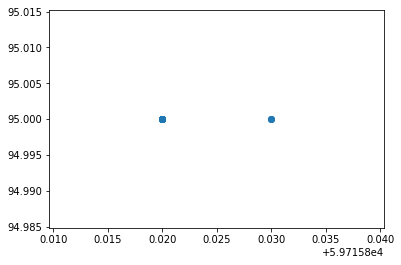

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


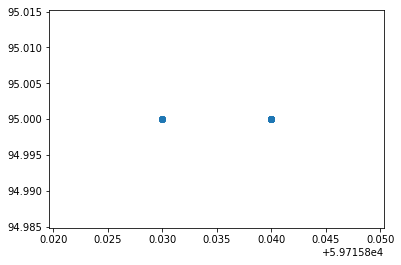

Number of Data Points in Bucket is :  29
Change in SOC WRT distance 0.00000


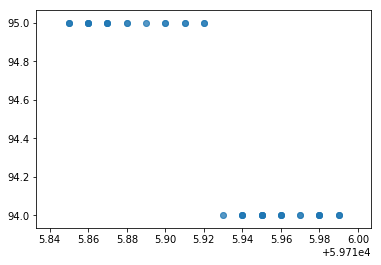

Number of Data Points in Bucket is :  61
Change in SOC WRT distance -7.14286
Change in distance WRT SOC -0.14000


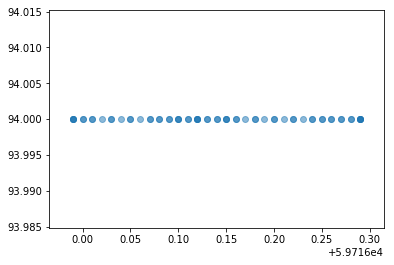

Number of Data Points in Bucket is :  64
Change in SOC WRT distance 0.00000


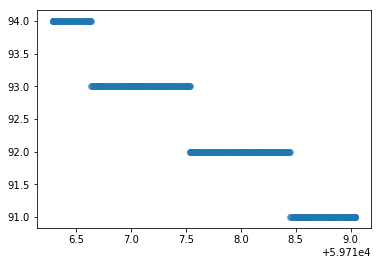

Number of Data Points in Bucket is :  442
Change in SOC WRT distance -1.09091
Change in distance WRT SOC -0.91667


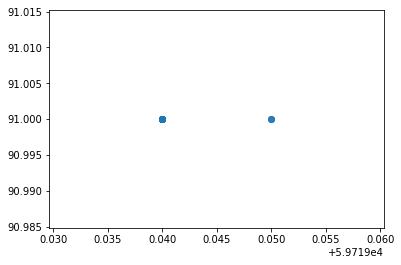

Number of Data Points in Bucket is :  20
Change in SOC WRT distance 0.00000


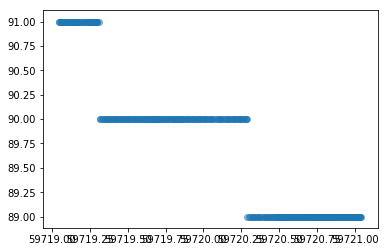

Number of Data Points in Bucket is :  382
Change in SOC WRT distance -1.00503
Change in distance WRT SOC -0.99500


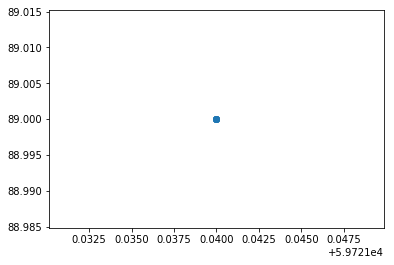

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


C:\Users\GauravS21\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:184: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\GauravS21\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:189: RuntimeWarning: invalid value encountered in double_scalars


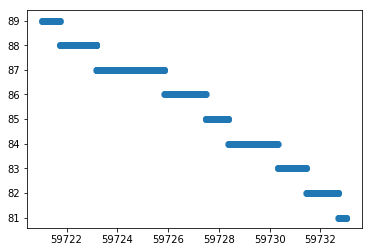

Number of Data Points in Bucket is :  1796
Change in SOC WRT distance -0.66778
Change in distance WRT SOC -1.49750


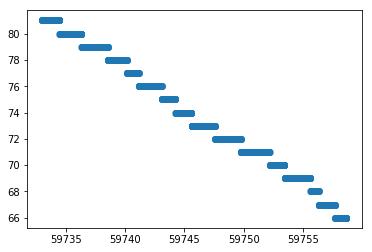

Number of Data Points in Bucket is :  3762
Change in SOC WRT distance -0.58548
Change in distance WRT SOC -1.70800


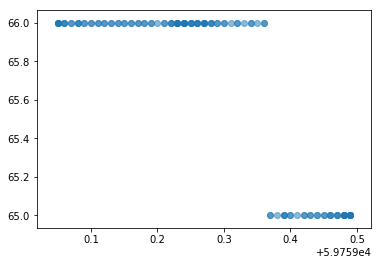

Number of Data Points in Bucket is :  118
Change in SOC WRT distance -2.27273
Change in distance WRT SOC -0.44000


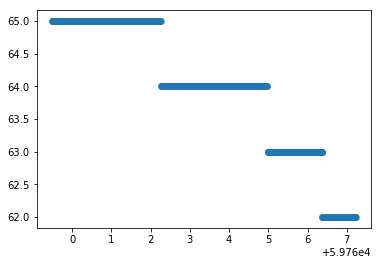

Number of Data Points in Bucket is :  1162
Change in SOC WRT distance -0.38760
Change in distance WRT SOC -2.58000


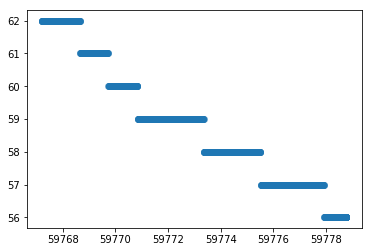

Number of Data Points in Bucket is :  1717
Change in SOC WRT distance -0.51993
Change in distance WRT SOC -1.92333


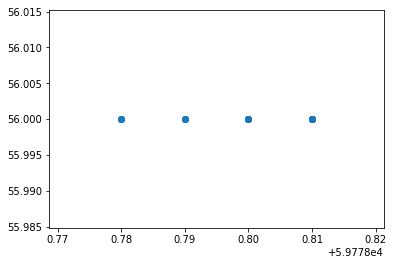

Number of Data Points in Bucket is :  32
Change in SOC WRT distance 0.00000


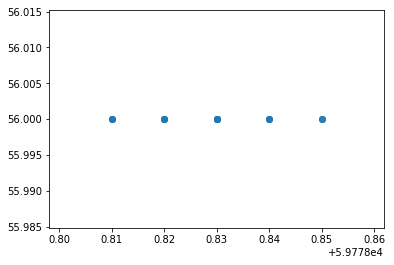

Number of Data Points in Bucket is :  28
Change in SOC WRT distance 0.00000


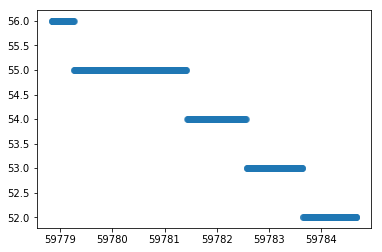

Number of Data Points in Bucket is :  847
Change in SOC WRT distance -0.68847
Change in distance WRT SOC -1.45250


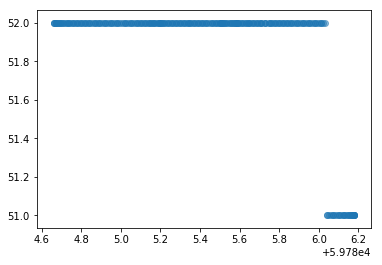

Number of Data Points in Bucket is :  243
Change in SOC WRT distance -0.65789
Change in distance WRT SOC -1.52000


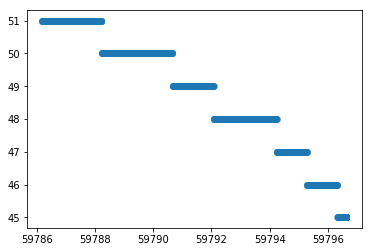

Number of Data Points in Bucket is :  1570
Change in SOC WRT distance -0.57361
Change in distance WRT SOC -1.74333


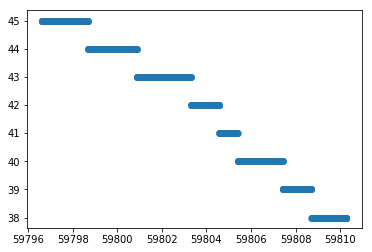

Number of Data Points in Bucket is :  1966
Change in SOC WRT distance -0.51357
Change in distance WRT SOC -1.94714


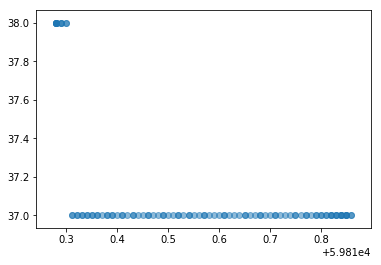

Number of Data Points in Bucket is :  103
Change in SOC WRT distance -1.72414
Change in distance WRT SOC -0.58000


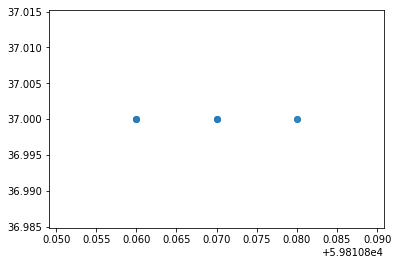

Number of Data Points in Bucket is :  11
Change in SOC WRT distance 0.00000


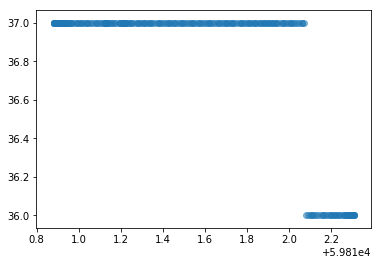

Number of Data Points in Bucket is :  239
Change in SOC WRT distance -0.69930
Change in distance WRT SOC -1.43000


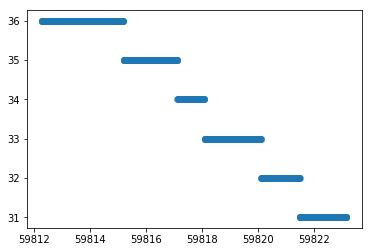

Number of Data Points in Bucket is :  1598
Change in SOC WRT distance -0.46125
Change in distance WRT SOC -2.16800


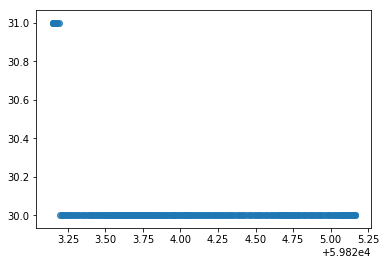

Number of Data Points in Bucket is :  348
Change in SOC WRT distance -0.49751
Change in distance WRT SOC -2.01000


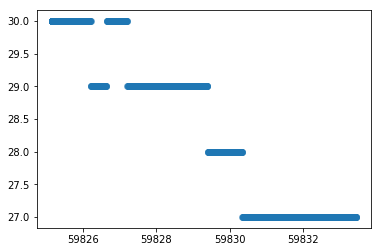

Number of Data Points in Bucket is :  1279
Change in SOC WRT distance -0.36276
Change in distance WRT SOC -2.75667


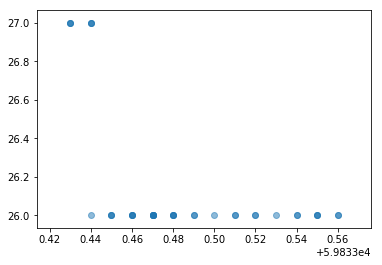

Number of Data Points in Bucket is :  40
Change in SOC WRT distance -7.69231
Change in distance WRT SOC -0.13000


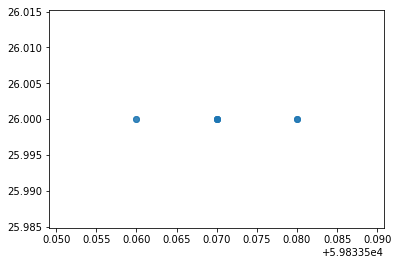

Number of Data Points in Bucket is :  14
Change in SOC WRT distance 0.00000


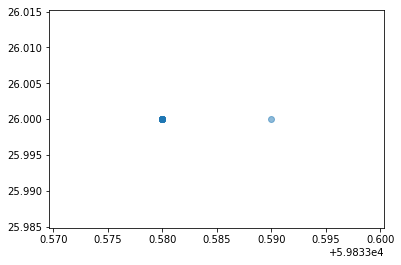

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


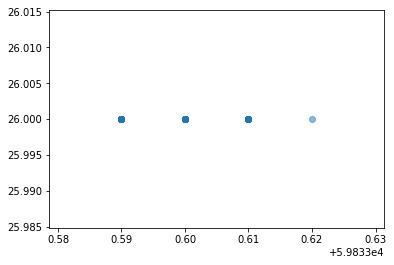

Number of Data Points in Bucket is :  49
Change in SOC WRT distance 0.00000


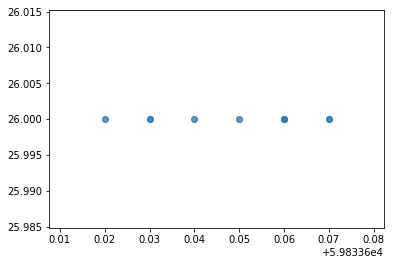

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


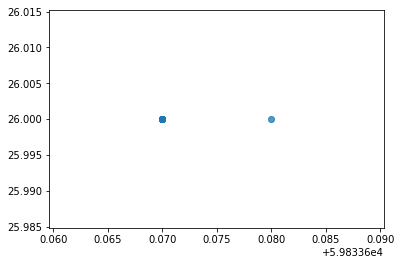

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


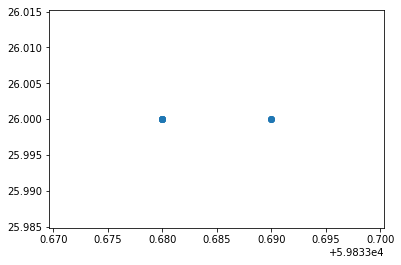

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


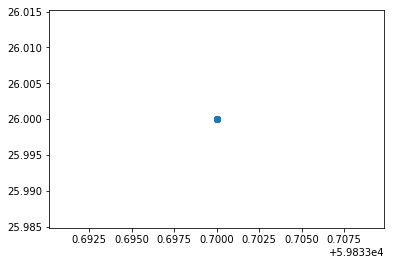

Number of Data Points in Bucket is :  12
Change in SOC WRT distance nan


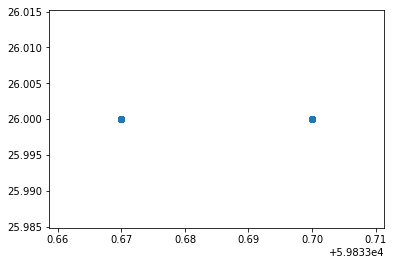

Number of Data Points in Bucket is :  42
Change in SOC WRT distance -0.00000


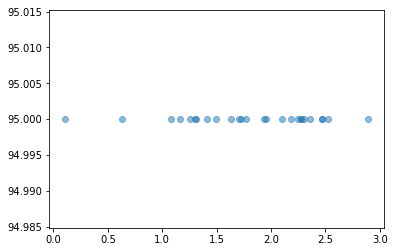

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


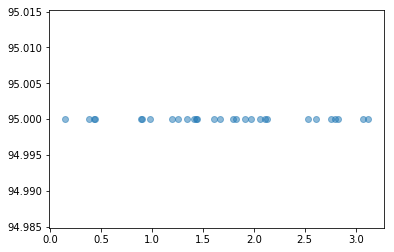

Number of Data Points in Bucket is :  29
Change in SOC WRT speed 0.00000


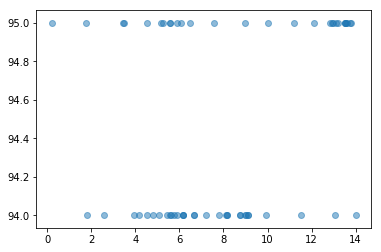

Number of Data Points in Bucket is :  61
Change in SOC WRT speed -0.62500


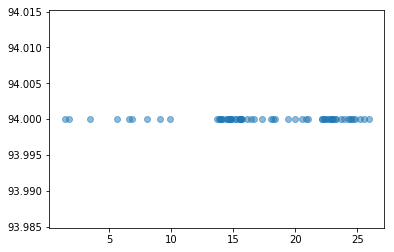

Number of Data Points in Bucket is :  64
Change in SOC WRT speed 0.00000


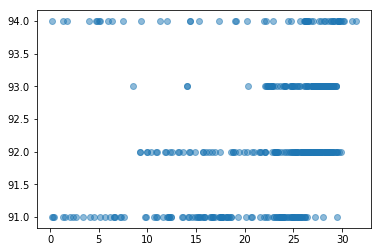

Number of Data Points in Bucket is :  442
Change in SOC WRT speed -2.30769


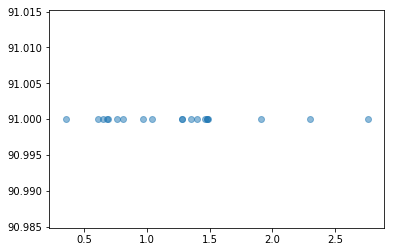

Number of Data Points in Bucket is :  20
Change in SOC WRT speed 0.00000


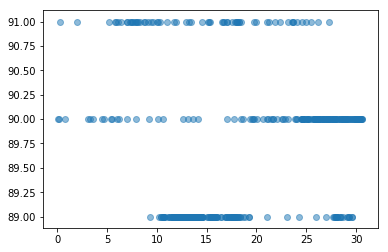

Number of Data Points in Bucket is :  382
Change in SOC WRT speed -0.22026


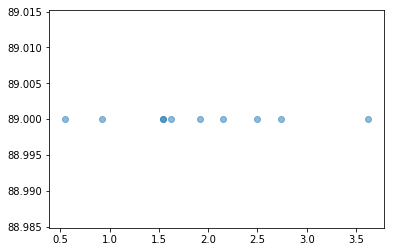

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


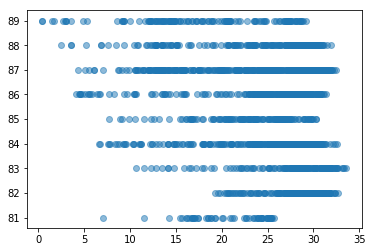

Number of Data Points in Bucket is :  1796
Change in SOC WRT speed -1.20846


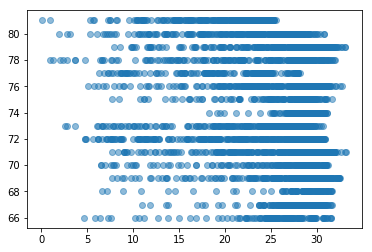

Number of Data Points in Bucket is :  3762
Change in SOC WRT speed -3.29670


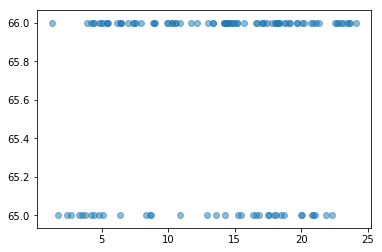

Number of Data Points in Bucket is :  118
Change in SOC WRT speed -2.12766


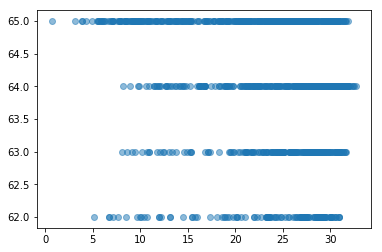

Number of Data Points in Bucket is :  1162
Change in SOC WRT speed -0.66815


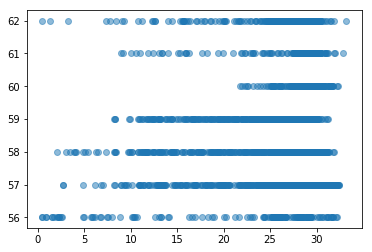

Number of Data Points in Bucket is :  1717
Change in SOC WRT speed -inf


C:\Users\GauravS21\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:80: RuntimeWarning: divide by zero encountered in double_scalars
C:\Users\GauravS21\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:81: RuntimeWarning: divide by zero encountered in double_scalars


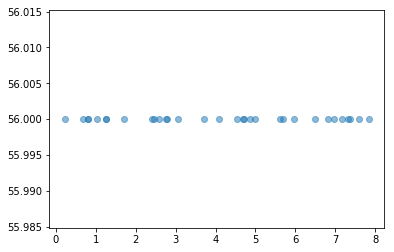

Number of Data Points in Bucket is :  32
Change in SOC WRT speed 0.00000


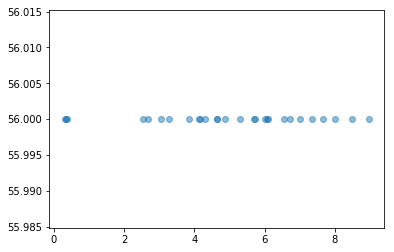

Number of Data Points in Bucket is :  28
Change in SOC WRT speed 0.00000


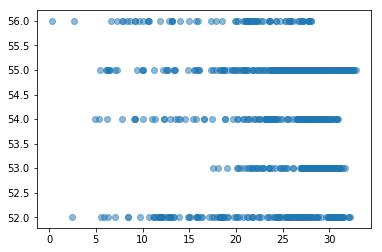

Number of Data Points in Bucket is :  847
Change in SOC WRT speed -1.87793


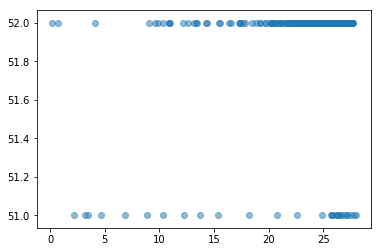

Number of Data Points in Bucket is :  243
Change in SOC WRT speed -0.50505


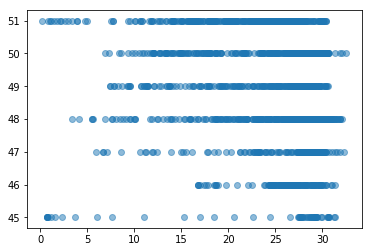

Number of Data Points in Bucket is :  1570
Change in SOC WRT speed -12.00000


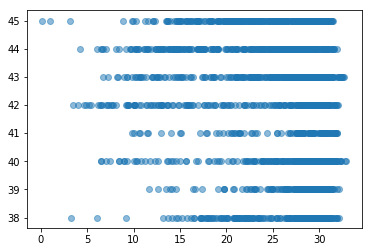

Number of Data Points in Bucket is :  1966
Change in SOC WRT speed -2.28758


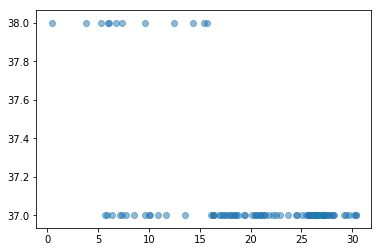

Number of Data Points in Bucket is :  103
Change in SOC WRT speed -0.16835


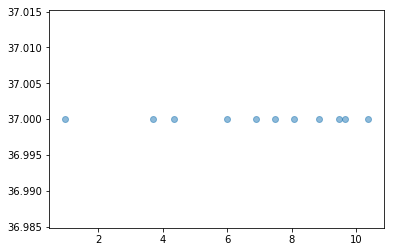

Number of Data Points in Bucket is :  11
Change in SOC WRT speed 0.00000


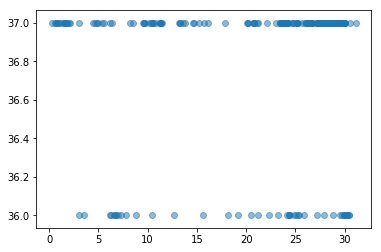

Number of Data Points in Bucket is :  239
Change in SOC WRT speed -0.36496


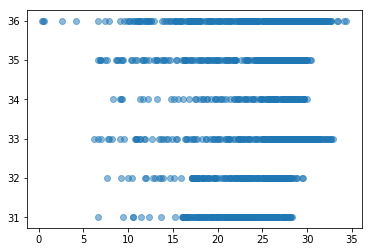

Number of Data Points in Bucket is :  1598
Change in SOC WRT speed -0.80906


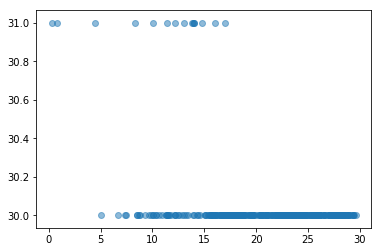

Number of Data Points in Bucket is :  348
Change in SOC WRT speed -0.21186


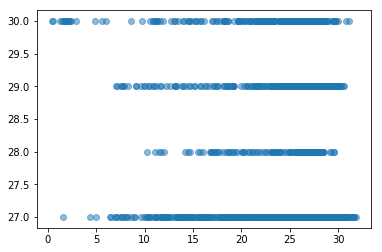

Number of Data Points in Bucket is :  1279
Change in SOC WRT speed -17.64706


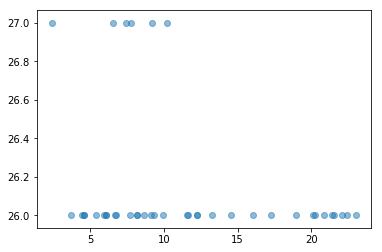

Number of Data Points in Bucket is :  40
Change in SOC WRT speed -0.77519


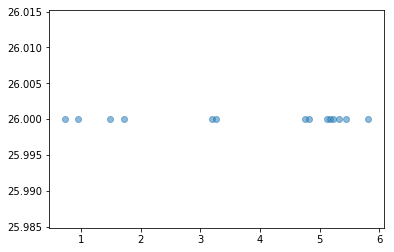

Number of Data Points in Bucket is :  14
Change in SOC WRT speed 0.00000


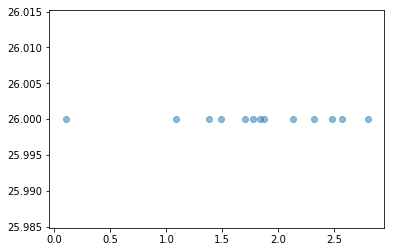

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


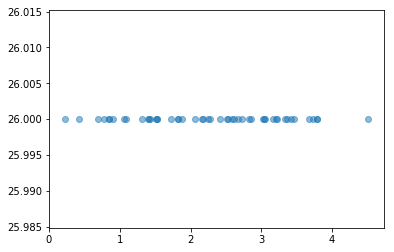

Number of Data Points in Bucket is :  49
Change in SOC WRT speed 0.00000


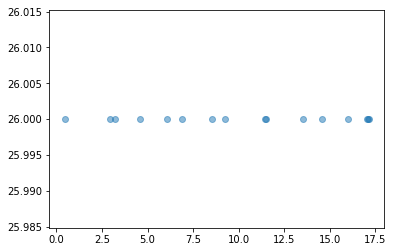

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


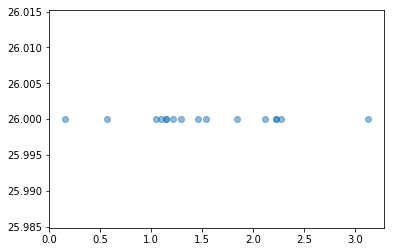

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


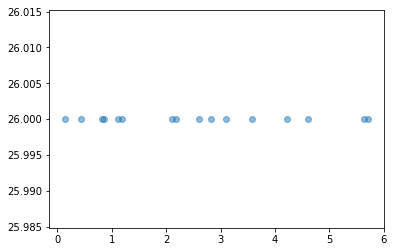

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


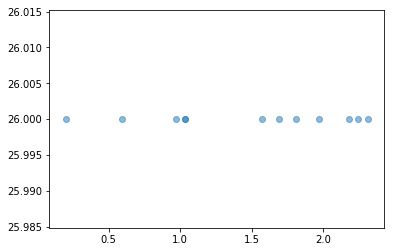

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


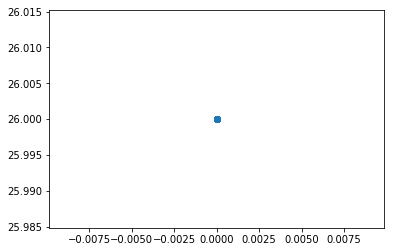

Number of Data Points in Bucket is :  42
Change in SOC WRT speed nan


C:\Users\GauravS21\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:80: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\GauravS21\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:81: RuntimeWarning: invalid value encountered in double_scalars


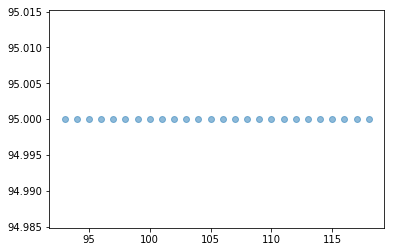

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


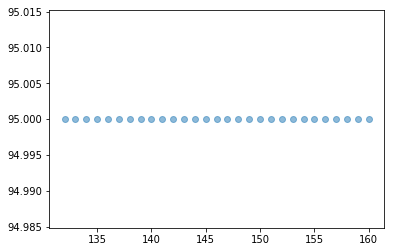

Number of Data Points in Bucket is :  29
Change in SOC WRT Time 0.00000


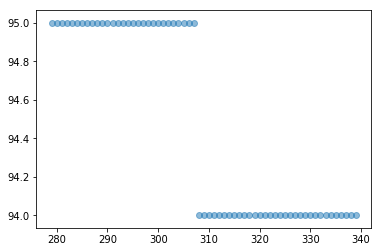

Number of Data Points in Bucket is :  61
Change in SOC WRT Time -0.01667


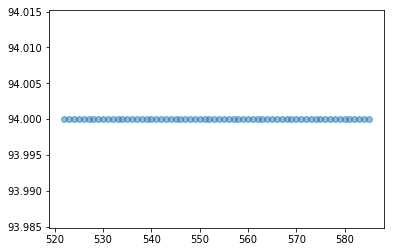

Number of Data Points in Bucket is :  64
Change in SOC WRT Time 0.00000


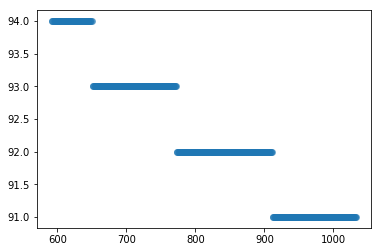

Number of Data Points in Bucket is :  442
Change in SOC WRT Time -0.00680


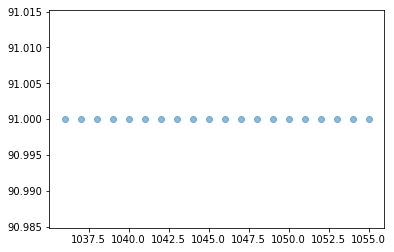

Number of Data Points in Bucket is :  20
Change in SOC WRT Time 0.00000


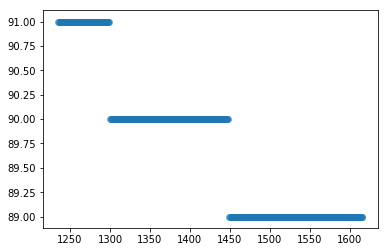

Number of Data Points in Bucket is :  382
Change in SOC WRT Time -0.00525


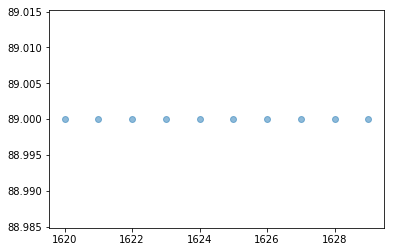

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


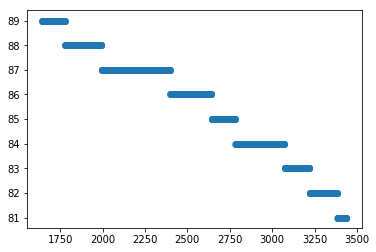

Number of Data Points in Bucket is :  1796
Change in SOC WRT Time -0.00446


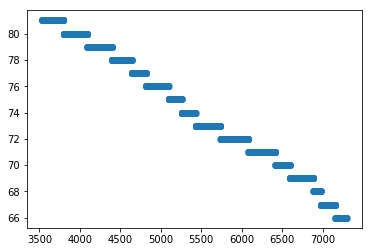

Number of Data Points in Bucket is :  3762
Change in SOC WRT Time -0.00399


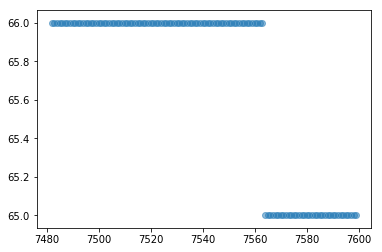

Number of Data Points in Bucket is :  118
Change in SOC WRT Time -0.00855


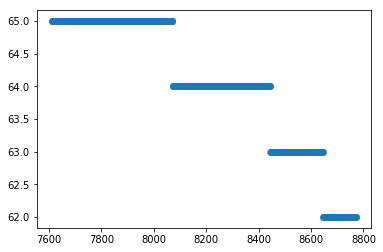

Number of Data Points in Bucket is :  1162
Change in SOC WRT Time -0.00258


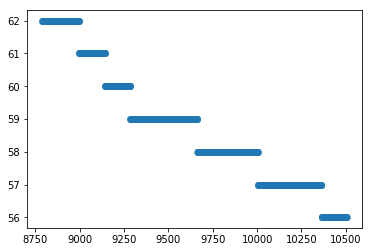

Number of Data Points in Bucket is :  1717
Change in SOC WRT Time -0.00350


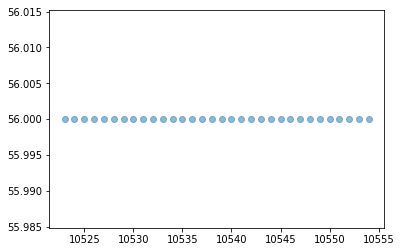

Number of Data Points in Bucket is :  32
Change in SOC WRT Time 0.00000


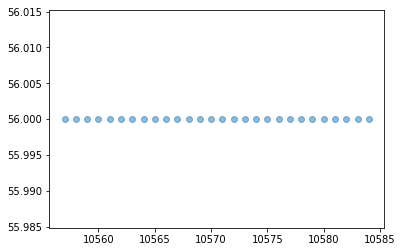

Number of Data Points in Bucket is :  28
Change in SOC WRT Time 0.00000


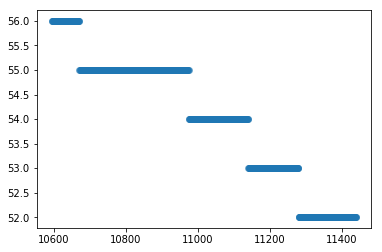

Number of Data Points in Bucket is :  847
Change in SOC WRT Time -0.00473


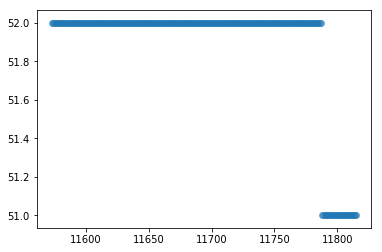

Number of Data Points in Bucket is :  243
Change in SOC WRT Time -0.00413


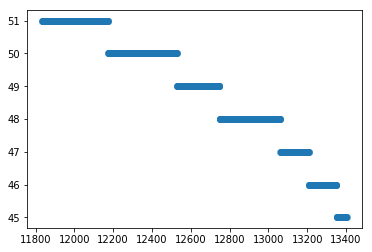

Number of Data Points in Bucket is :  1570
Change in SOC WRT Time -0.00382


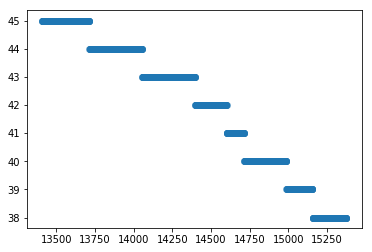

Number of Data Points in Bucket is :  1966
Change in SOC WRT Time -0.00356


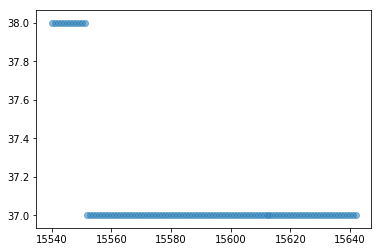

Number of Data Points in Bucket is :  103
Change in SOC WRT Time -0.00980


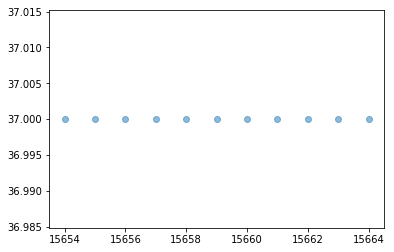

Number of Data Points in Bucket is :  11
Change in SOC WRT Time 0.00000


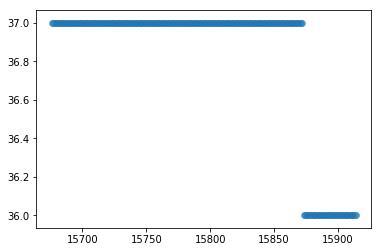

Number of Data Points in Bucket is :  239
Change in SOC WRT Time -0.00420


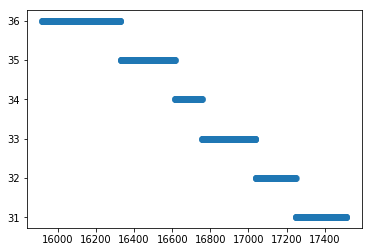

Number of Data Points in Bucket is :  1598
Change in SOC WRT Time -0.00313


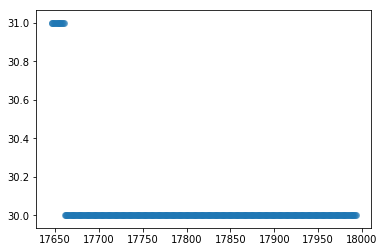

Number of Data Points in Bucket is :  348
Change in SOC WRT Time -0.00288


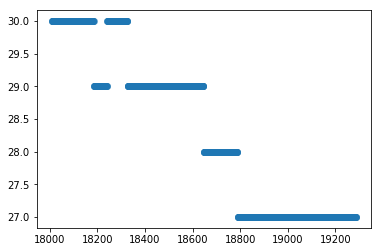

Number of Data Points in Bucket is :  1279
Change in SOC WRT Time -0.00235


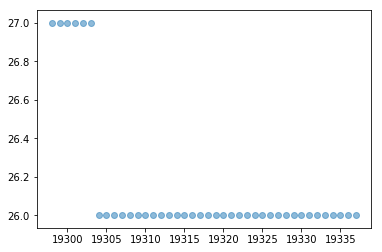

Number of Data Points in Bucket is :  40
Change in SOC WRT Time -0.02564


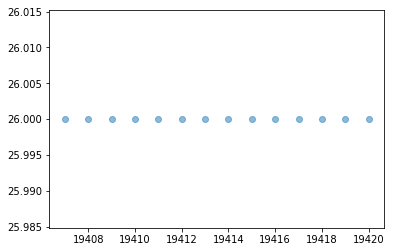

Number of Data Points in Bucket is :  14
Change in SOC WRT Time 0.00000


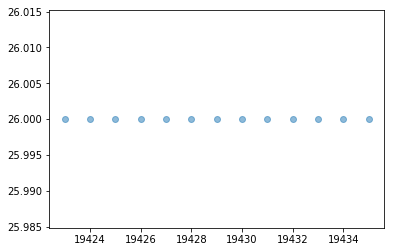

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


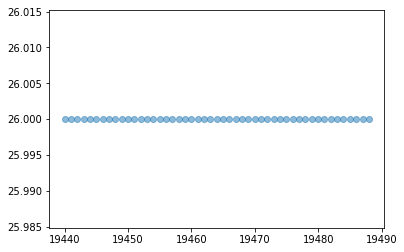

Number of Data Points in Bucket is :  49
Change in SOC WRT Time 0.00000


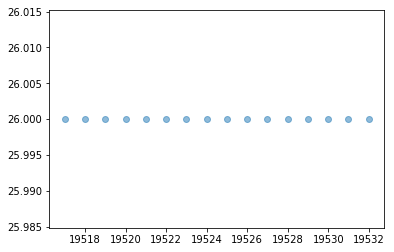

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


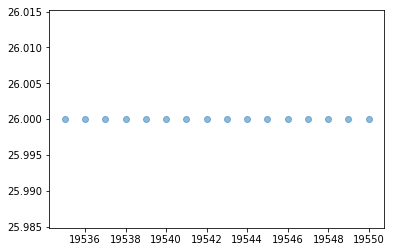

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


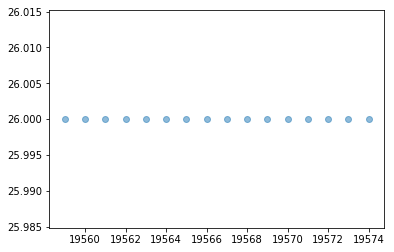

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


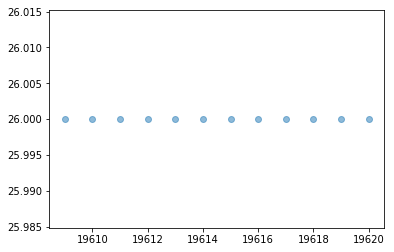

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


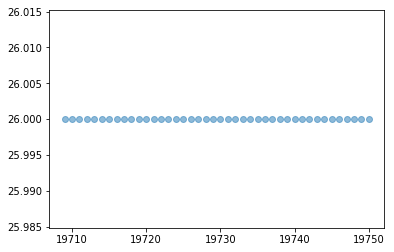

Number of Data Points in Bucket is :  42
Change in SOC WRT Time 0.00000


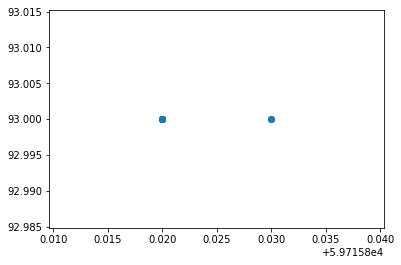

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


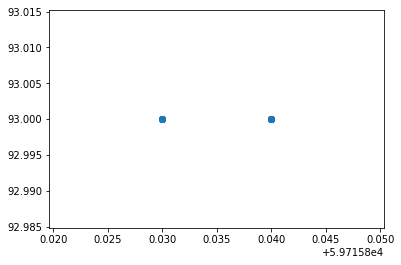

Number of Data Points in Bucket is :  29
Change in SOC WRT distance 0.00000


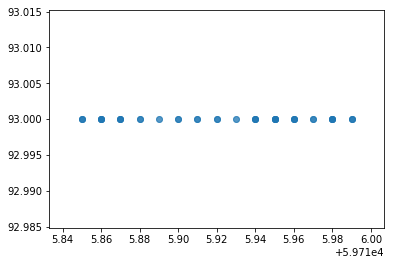

Number of Data Points in Bucket is :  61
Change in SOC WRT distance 0.00000


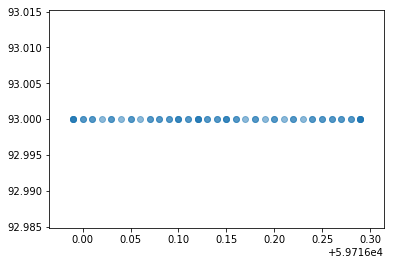

Number of Data Points in Bucket is :  64
Change in SOC WRT distance 0.00000


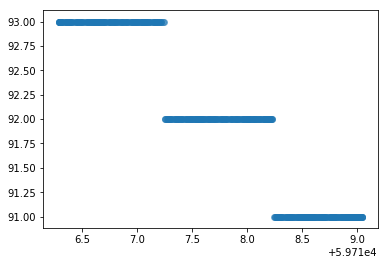

Number of Data Points in Bucket is :  442
Change in SOC WRT distance -0.72727
Change in distance WRT SOC -1.37500


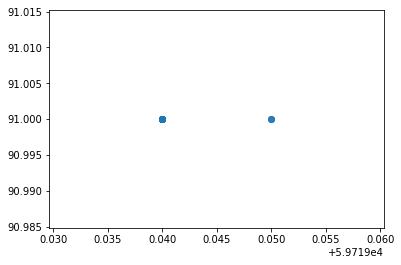

Number of Data Points in Bucket is :  20
Change in SOC WRT distance 0.00000


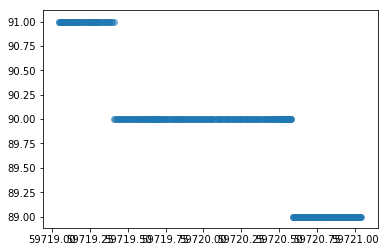

Number of Data Points in Bucket is :  382
Change in SOC WRT distance -1.00503
Change in distance WRT SOC -0.99500


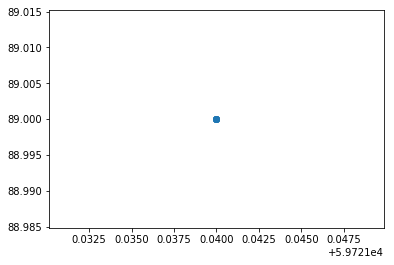

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


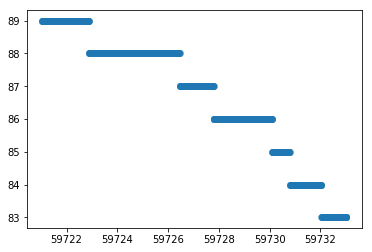

Number of Data Points in Bucket is :  1796
Change in SOC WRT distance -0.50083
Change in distance WRT SOC -1.99667


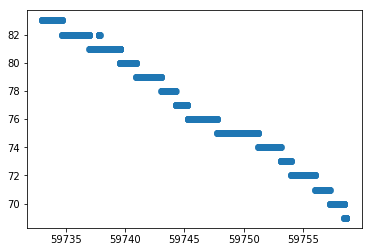

Number of Data Points in Bucket is :  3762
Change in SOC WRT distance -0.54645
Change in distance WRT SOC -1.83000


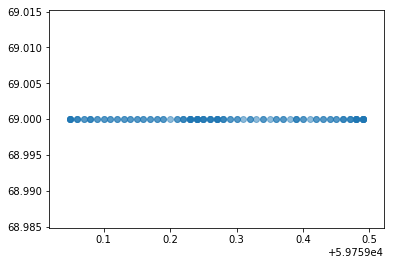

Number of Data Points in Bucket is :  118
Change in SOC WRT distance 0.00000


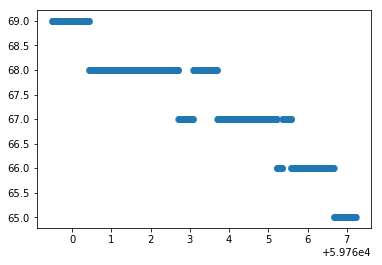

Number of Data Points in Bucket is :  1162
Change in SOC WRT distance -0.51680
Change in distance WRT SOC -1.93500


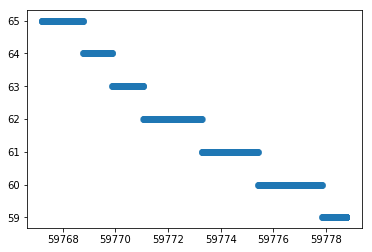

Number of Data Points in Bucket is :  1717
Change in SOC WRT distance -0.51993
Change in distance WRT SOC -1.92333


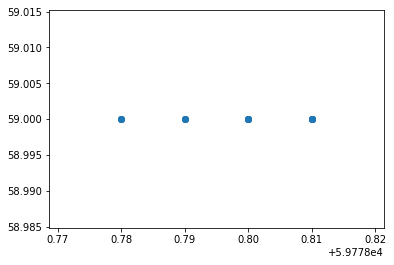

Number of Data Points in Bucket is :  32
Change in SOC WRT distance 0.00000


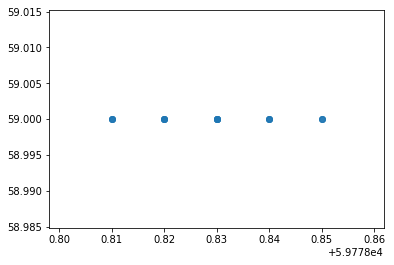

Number of Data Points in Bucket is :  28
Change in SOC WRT distance 0.00000


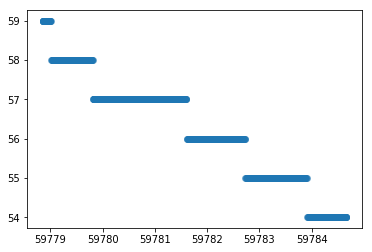

Number of Data Points in Bucket is :  847
Change in SOC WRT distance -0.86059
Change in distance WRT SOC -1.16200


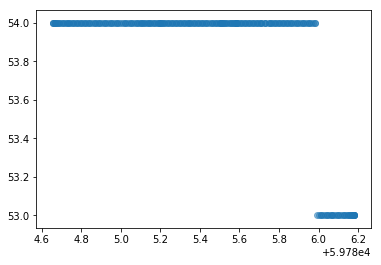

Number of Data Points in Bucket is :  243
Change in SOC WRT distance -0.65789
Change in distance WRT SOC -1.52000


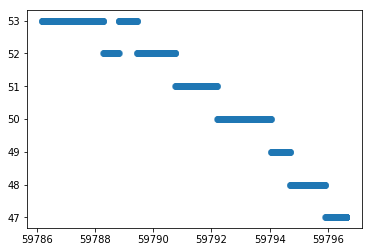

Number of Data Points in Bucket is :  1570
Change in SOC WRT distance -0.57361
Change in distance WRT SOC -1.74333


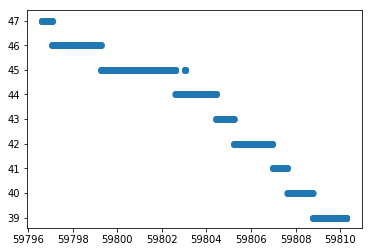

Number of Data Points in Bucket is :  1966
Change in SOC WRT distance -0.58694
Change in distance WRT SOC -1.70375


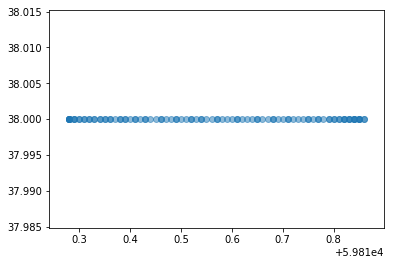

Number of Data Points in Bucket is :  103
Change in SOC WRT distance 0.00000


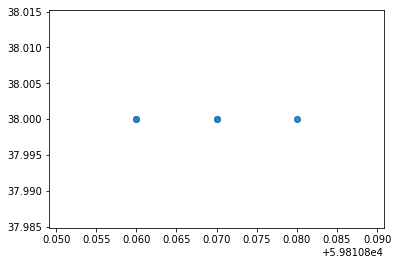

Number of Data Points in Bucket is :  11
Change in SOC WRT distance 0.00000


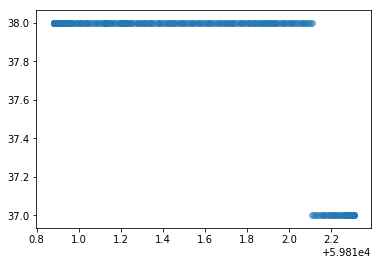

Number of Data Points in Bucket is :  239
Change in SOC WRT distance -0.69930
Change in distance WRT SOC -1.43000


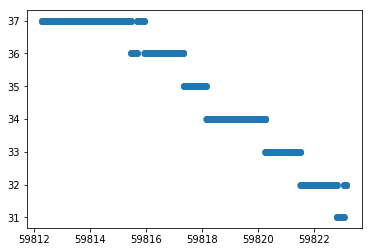

Number of Data Points in Bucket is :  1598
Change in SOC WRT distance -0.46125
Change in distance WRT SOC -2.16800


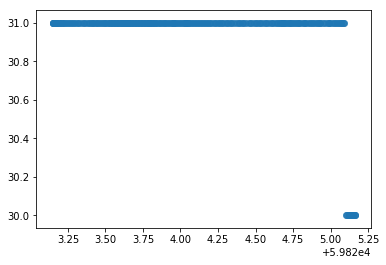

Number of Data Points in Bucket is :  348
Change in SOC WRT distance -0.49751
Change in distance WRT SOC -2.01000


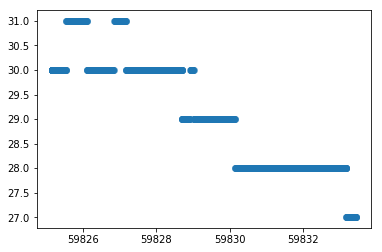

Number of Data Points in Bucket is :  1279
Change in SOC WRT distance -0.36276
Change in distance WRT SOC -2.75667


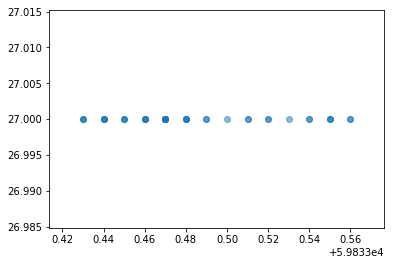

Number of Data Points in Bucket is :  40
Change in SOC WRT distance 0.00000


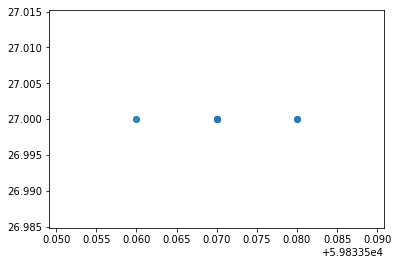

Number of Data Points in Bucket is :  14
Change in SOC WRT distance 0.00000


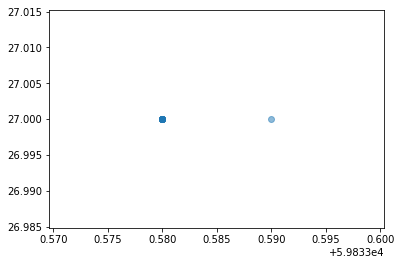

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


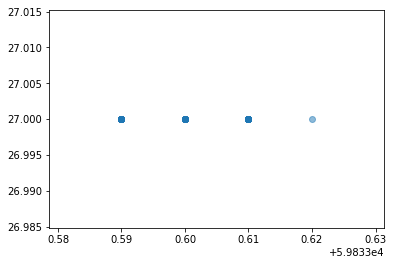

Number of Data Points in Bucket is :  49
Change in SOC WRT distance 0.00000


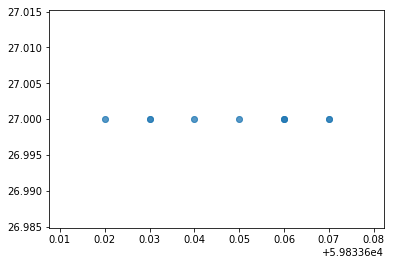

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


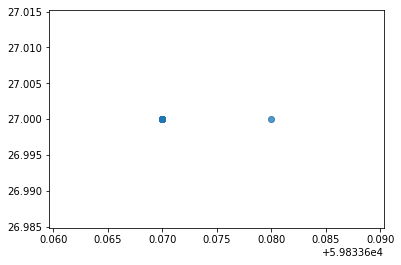

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


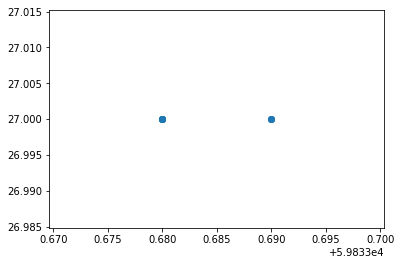

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


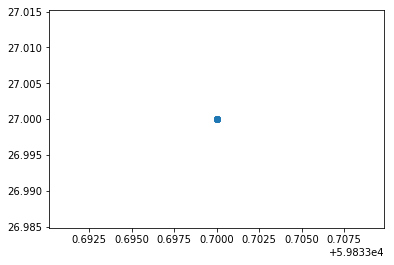

Number of Data Points in Bucket is :  12
Change in SOC WRT distance nan


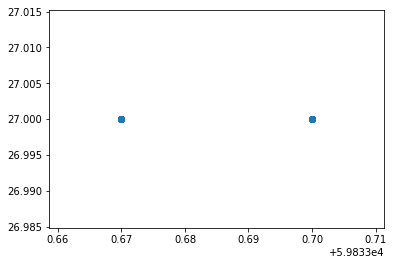

Number of Data Points in Bucket is :  42
Change in SOC WRT distance -0.00000


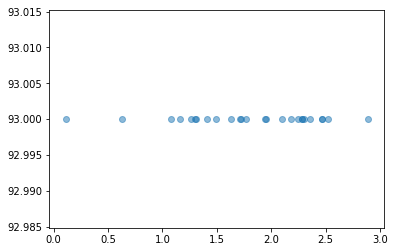

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


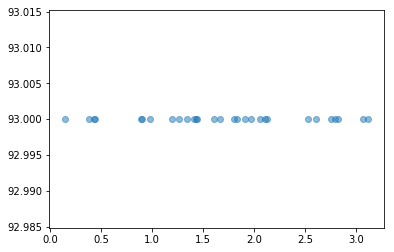

Number of Data Points in Bucket is :  29
Change in SOC WRT speed 0.00000


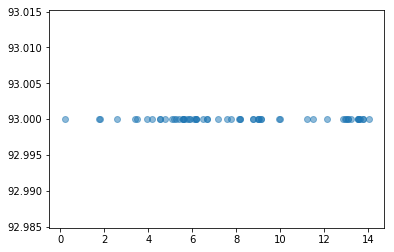

Number of Data Points in Bucket is :  61
Change in SOC WRT speed 0.00000


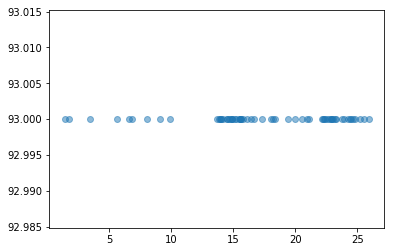

Number of Data Points in Bucket is :  64
Change in SOC WRT speed 0.00000


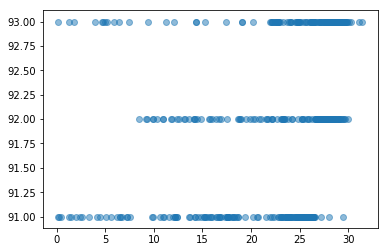

Number of Data Points in Bucket is :  442
Change in SOC WRT speed -1.53846


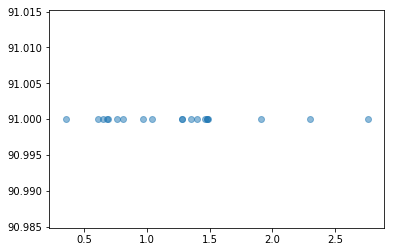

Number of Data Points in Bucket is :  20
Change in SOC WRT speed 0.00000


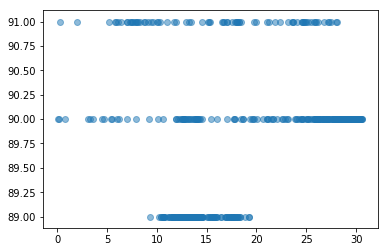

Number of Data Points in Bucket is :  382
Change in SOC WRT speed -0.22026


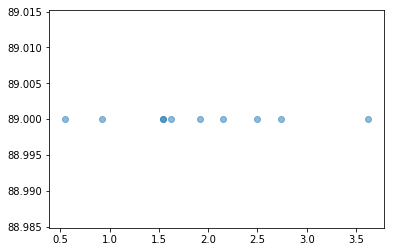

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


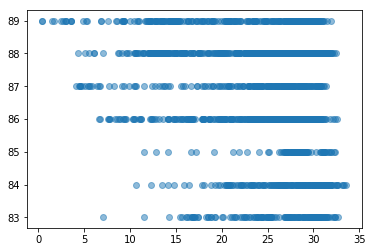

Number of Data Points in Bucket is :  1796
Change in SOC WRT speed -0.90634


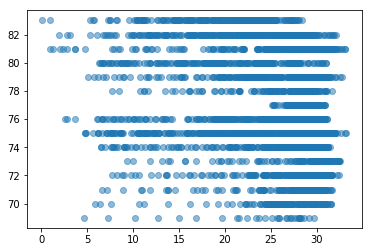

Number of Data Points in Bucket is :  3762
Change in SOC WRT speed -3.07692


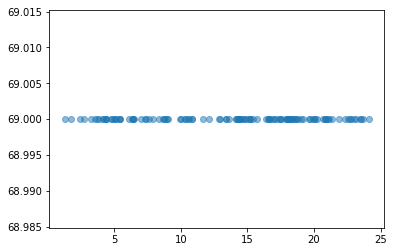

Number of Data Points in Bucket is :  118
Change in SOC WRT speed 0.00000


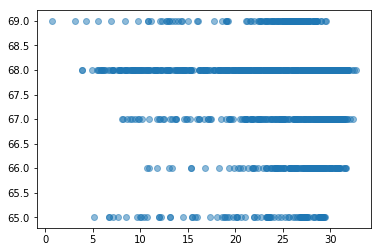

Number of Data Points in Bucket is :  1162
Change in SOC WRT speed -0.89087


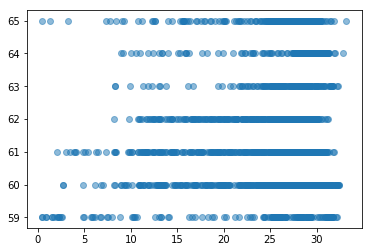

Number of Data Points in Bucket is :  1717
Change in SOC WRT speed -inf


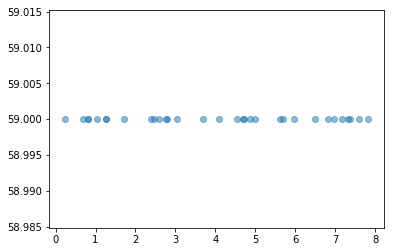

Number of Data Points in Bucket is :  32
Change in SOC WRT speed 0.00000


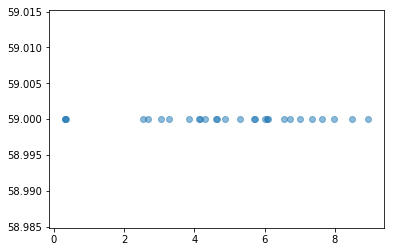

Number of Data Points in Bucket is :  28
Change in SOC WRT speed 0.00000


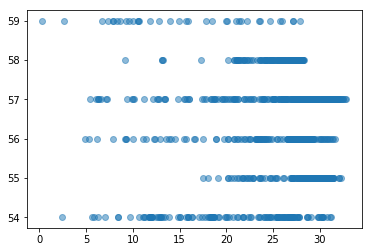

Number of Data Points in Bucket is :  847
Change in SOC WRT speed -2.34742


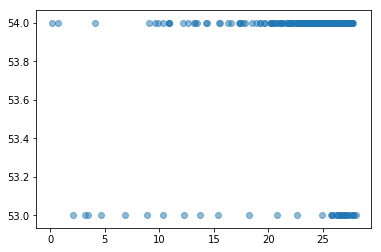

Number of Data Points in Bucket is :  243
Change in SOC WRT speed -0.50505


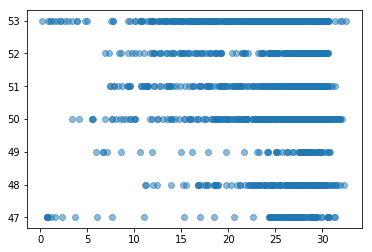

Number of Data Points in Bucket is :  1570
Change in SOC WRT speed -12.00000


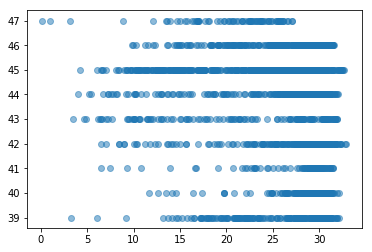

Number of Data Points in Bucket is :  1966
Change in SOC WRT speed -2.61438


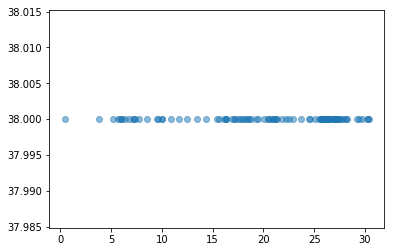

Number of Data Points in Bucket is :  103
Change in SOC WRT speed 0.00000


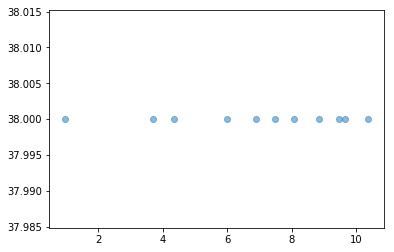

Number of Data Points in Bucket is :  11
Change in SOC WRT speed 0.00000


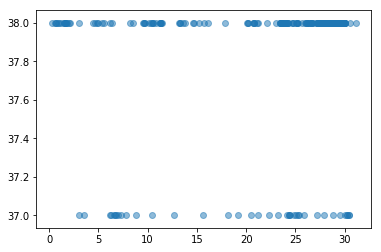

Number of Data Points in Bucket is :  239
Change in SOC WRT speed -0.36496


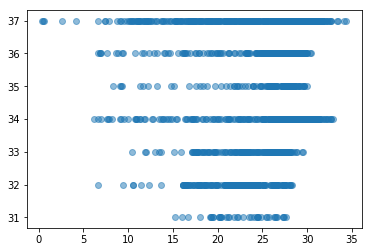

Number of Data Points in Bucket is :  1598
Change in SOC WRT speed -0.80906


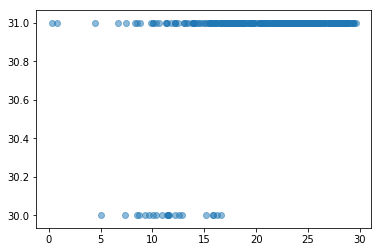

Number of Data Points in Bucket is :  348
Change in SOC WRT speed -0.21186


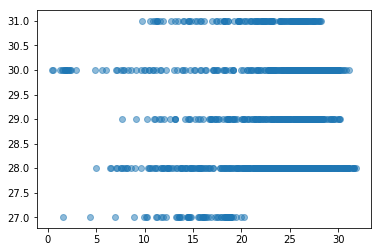

Number of Data Points in Bucket is :  1279
Change in SOC WRT speed -17.64706


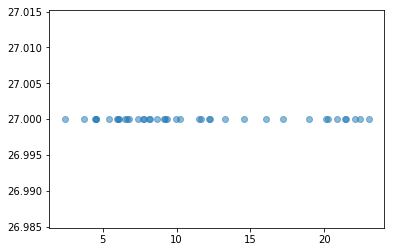

Number of Data Points in Bucket is :  40
Change in SOC WRT speed 0.00000


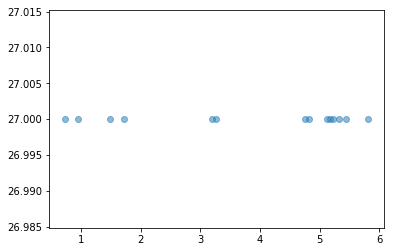

Number of Data Points in Bucket is :  14
Change in SOC WRT speed 0.00000


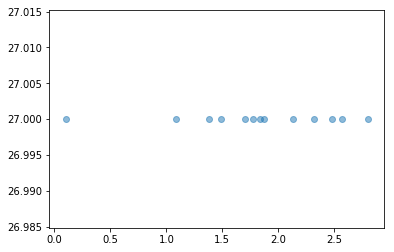

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


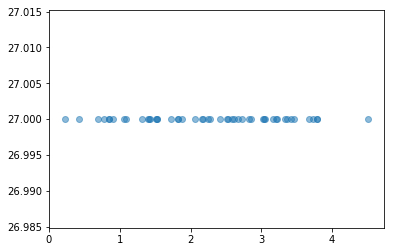

Number of Data Points in Bucket is :  49
Change in SOC WRT speed 0.00000


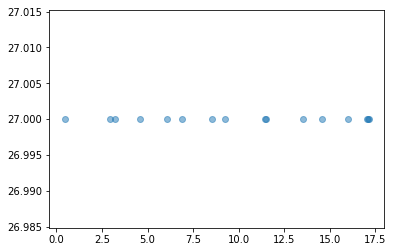

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


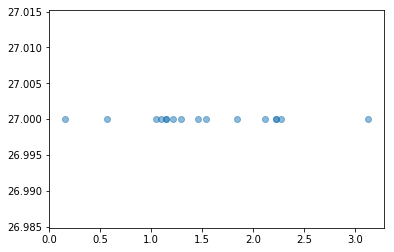

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


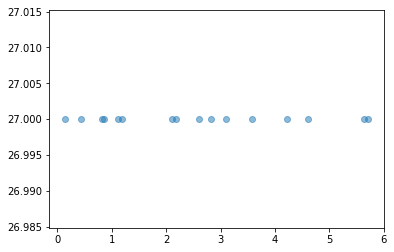

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


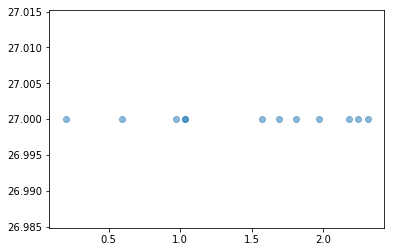

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


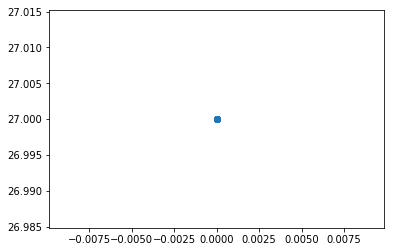

Number of Data Points in Bucket is :  42
Change in SOC WRT speed nan


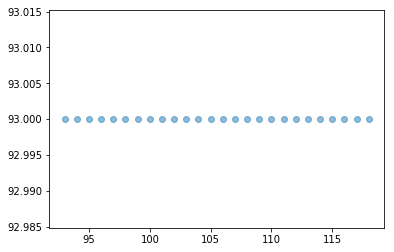

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


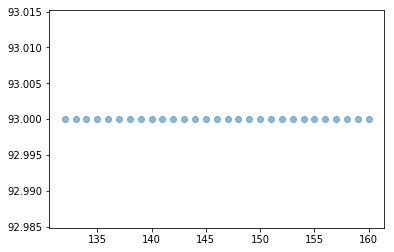

Number of Data Points in Bucket is :  29
Change in SOC WRT Time 0.00000


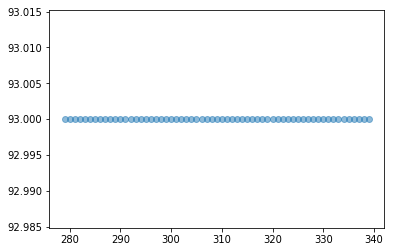

Number of Data Points in Bucket is :  61
Change in SOC WRT Time 0.00000


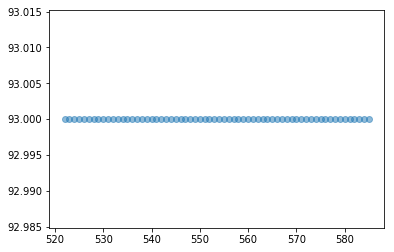

Number of Data Points in Bucket is :  64
Change in SOC WRT Time 0.00000


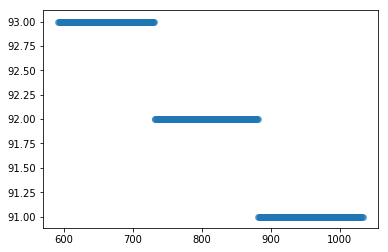

Number of Data Points in Bucket is :  442
Change in SOC WRT Time -0.00454


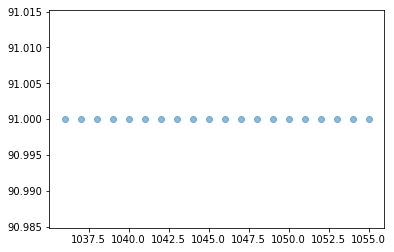

Number of Data Points in Bucket is :  20
Change in SOC WRT Time 0.00000


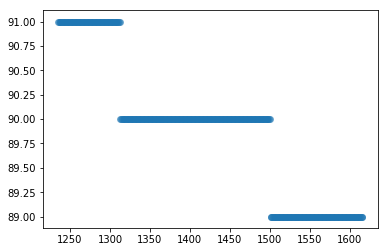

Number of Data Points in Bucket is :  382
Change in SOC WRT Time -0.00525


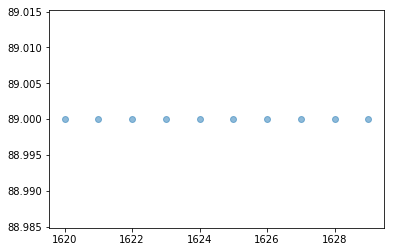

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


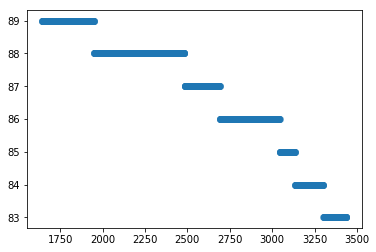

Number of Data Points in Bucket is :  1796
Change in SOC WRT Time -0.00334


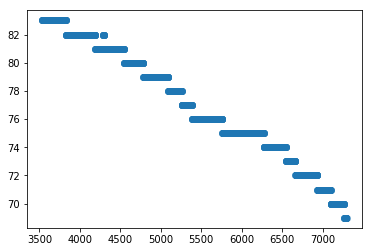

Number of Data Points in Bucket is :  3762
Change in SOC WRT Time -0.00372


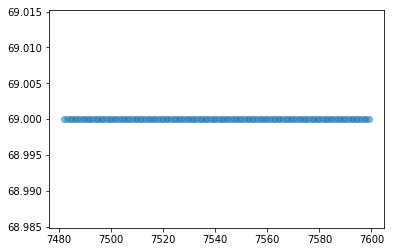

Number of Data Points in Bucket is :  118
Change in SOC WRT Time 0.00000


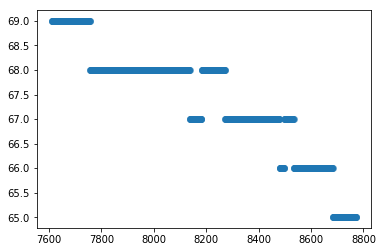

Number of Data Points in Bucket is :  1162
Change in SOC WRT Time -0.00345


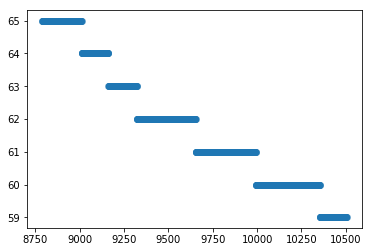

Number of Data Points in Bucket is :  1717
Change in SOC WRT Time -0.00350


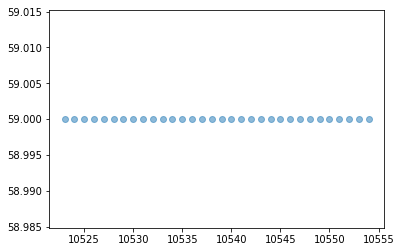

Number of Data Points in Bucket is :  32
Change in SOC WRT Time 0.00000


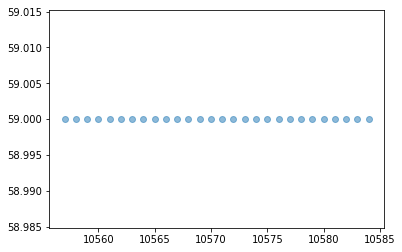

Number of Data Points in Bucket is :  28
Change in SOC WRT Time 0.00000


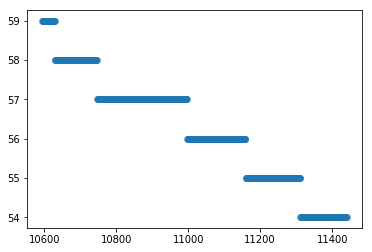

Number of Data Points in Bucket is :  847
Change in SOC WRT Time -0.00591


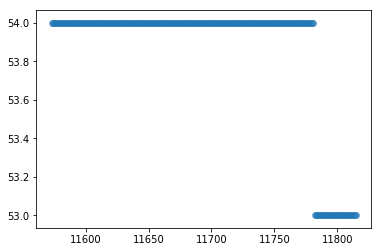

Number of Data Points in Bucket is :  243
Change in SOC WRT Time -0.00413


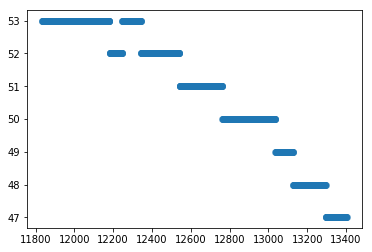

Number of Data Points in Bucket is :  1570
Change in SOC WRT Time -0.00382


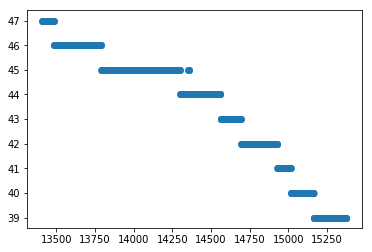

Number of Data Points in Bucket is :  1966
Change in SOC WRT Time -0.00407


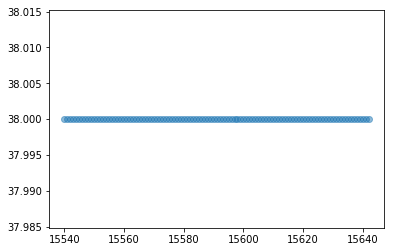

Number of Data Points in Bucket is :  103
Change in SOC WRT Time 0.00000


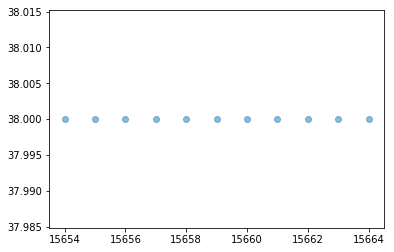

Number of Data Points in Bucket is :  11
Change in SOC WRT Time 0.00000


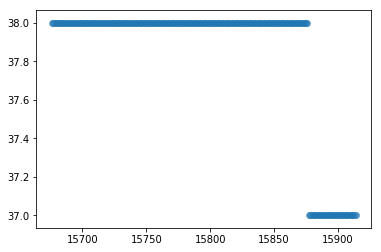

Number of Data Points in Bucket is :  239
Change in SOC WRT Time -0.00420


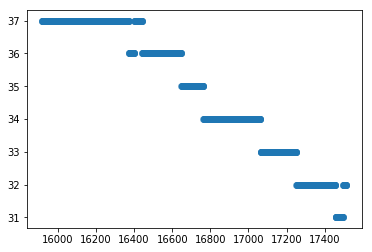

Number of Data Points in Bucket is :  1598
Change in SOC WRT Time -0.00313


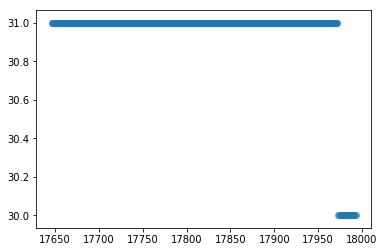

Number of Data Points in Bucket is :  348
Change in SOC WRT Time -0.00288


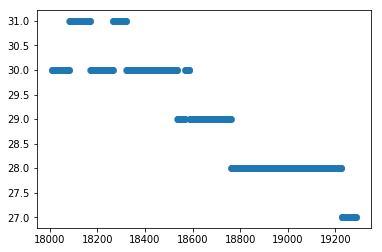

Number of Data Points in Bucket is :  1279
Change in SOC WRT Time -0.00235


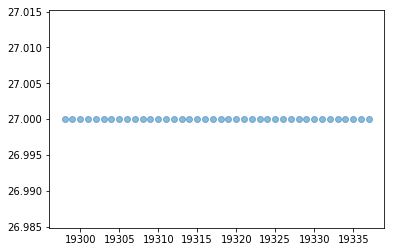

Number of Data Points in Bucket is :  40
Change in SOC WRT Time 0.00000


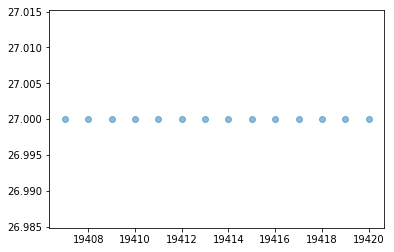

Number of Data Points in Bucket is :  14
Change in SOC WRT Time 0.00000


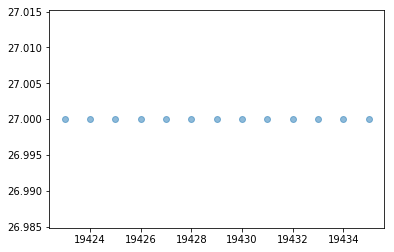

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


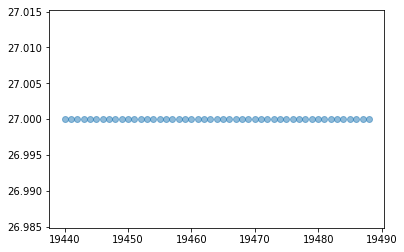

Number of Data Points in Bucket is :  49
Change in SOC WRT Time 0.00000


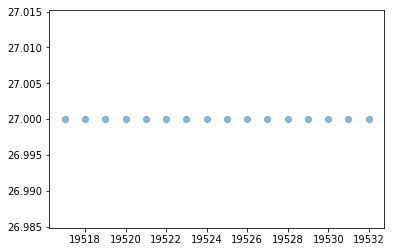

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


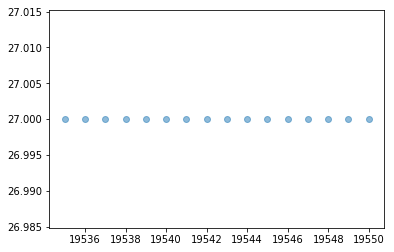

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


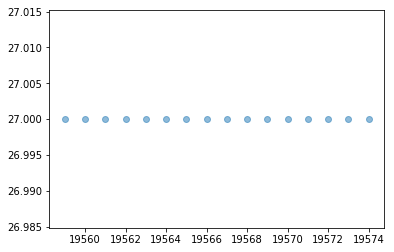

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


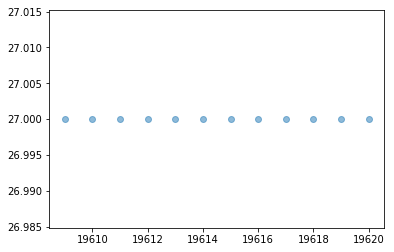

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


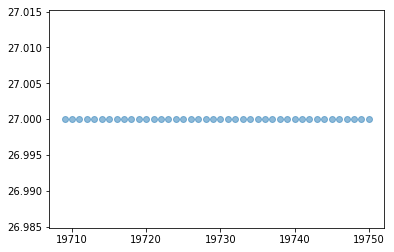

Number of Data Points in Bucket is :  42
Change in SOC WRT Time 0.00000


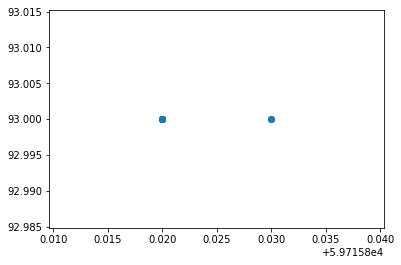

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


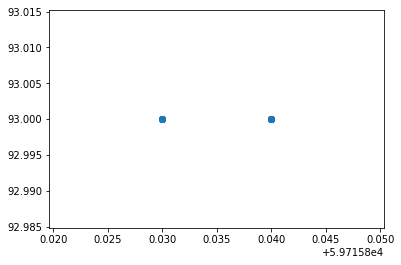

Number of Data Points in Bucket is :  29
Change in SOC WRT distance 0.00000


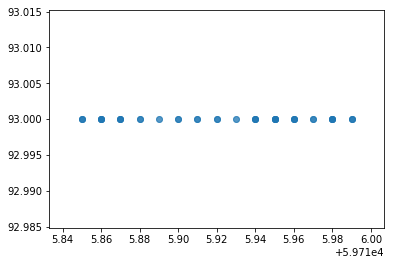

Number of Data Points in Bucket is :  61
Change in SOC WRT distance 0.00000


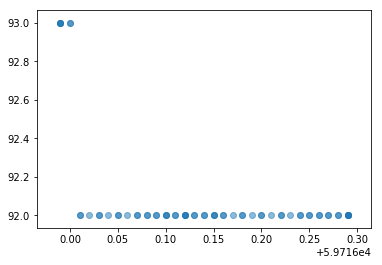

Number of Data Points in Bucket is :  64
Change in SOC WRT distance -3.33333
Change in distance WRT SOC -0.30000


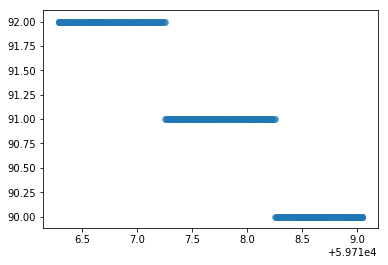

Number of Data Points in Bucket is :  442
Change in SOC WRT distance -0.72727
Change in distance WRT SOC -1.37500


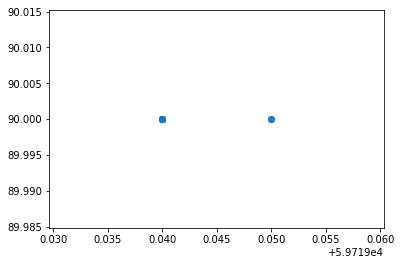

Number of Data Points in Bucket is :  20
Change in SOC WRT distance 0.00000


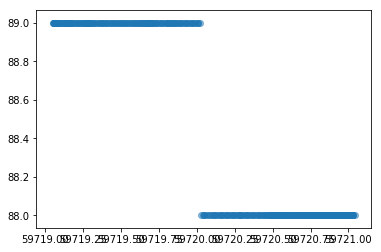

Number of Data Points in Bucket is :  382
Change in SOC WRT distance -0.50251
Change in distance WRT SOC -1.99000


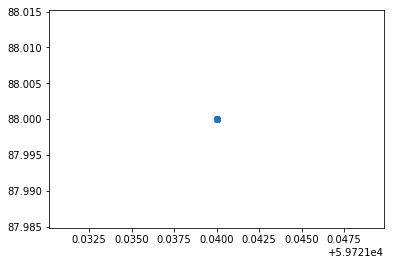

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


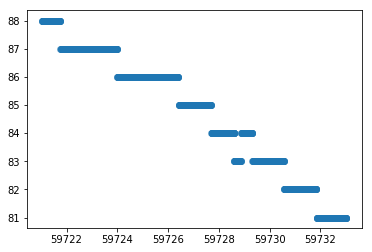

Number of Data Points in Bucket is :  1796
Change in SOC WRT distance -0.58431
Change in distance WRT SOC -1.71143


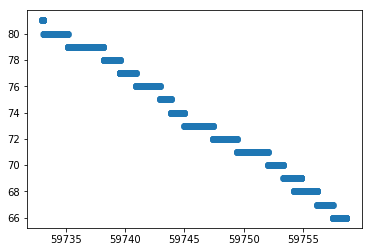

Number of Data Points in Bucket is :  3762
Change in SOC WRT distance -0.58548
Change in distance WRT SOC -1.70800


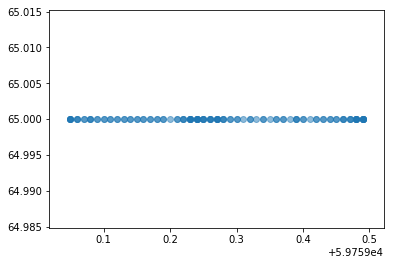

Number of Data Points in Bucket is :  118
Change in SOC WRT distance 0.00000


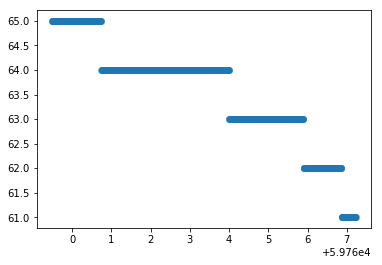

Number of Data Points in Bucket is :  1162
Change in SOC WRT distance -0.51680
Change in distance WRT SOC -1.93500


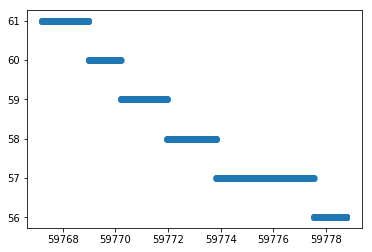

Number of Data Points in Bucket is :  1717
Change in SOC WRT distance -0.43328
Change in distance WRT SOC -2.30800


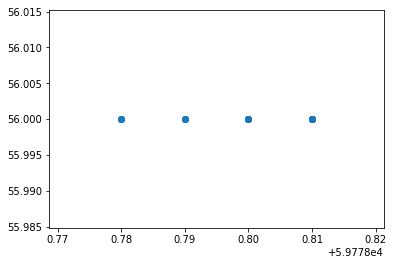

Number of Data Points in Bucket is :  32
Change in SOC WRT distance 0.00000


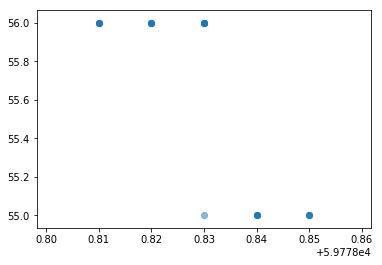

Number of Data Points in Bucket is :  28
Change in SOC WRT distance -25.00000
Change in distance WRT SOC -0.04000


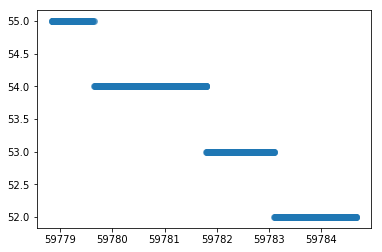

Number of Data Points in Bucket is :  847
Change in SOC WRT distance -0.51635
Change in distance WRT SOC -1.93667


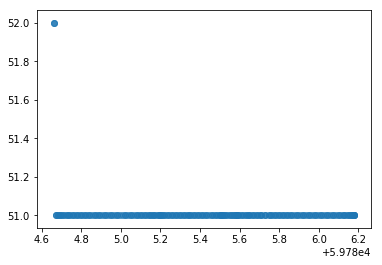

Number of Data Points in Bucket is :  243
Change in SOC WRT distance -0.65789
Change in distance WRT SOC -1.52000


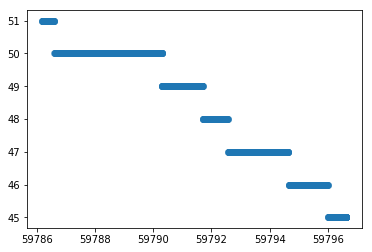

Number of Data Points in Bucket is :  1570
Change in SOC WRT distance -0.57361
Change in distance WRT SOC -1.74333


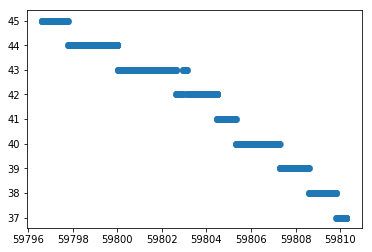

Number of Data Points in Bucket is :  1966
Change in SOC WRT distance -0.58694
Change in distance WRT SOC -1.70375


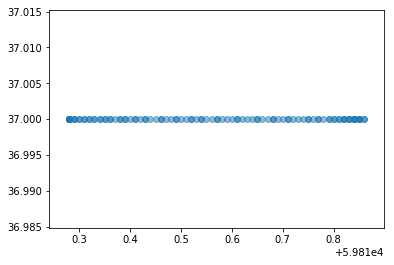

Number of Data Points in Bucket is :  103
Change in SOC WRT distance 0.00000


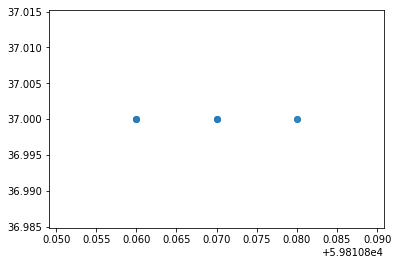

Number of Data Points in Bucket is :  11
Change in SOC WRT distance 0.00000


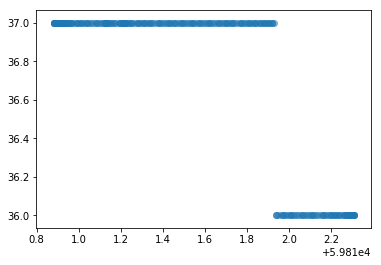

Number of Data Points in Bucket is :  239
Change in SOC WRT distance -0.69930
Change in distance WRT SOC -1.43000


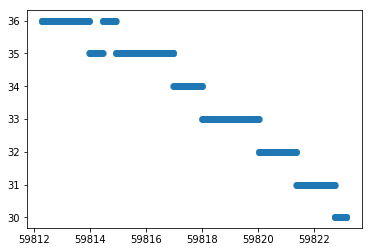

Number of Data Points in Bucket is :  1598
Change in SOC WRT distance -0.55351
Change in distance WRT SOC -1.80667


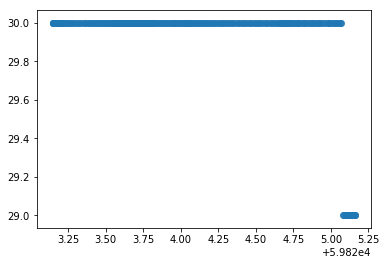

Number of Data Points in Bucket is :  348
Change in SOC WRT distance -0.49751
Change in distance WRT SOC -2.01000


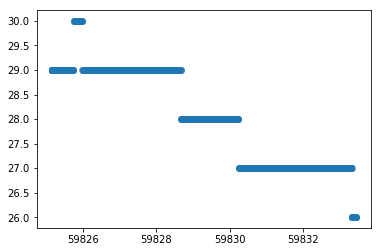

Number of Data Points in Bucket is :  1279
Change in SOC WRT distance -0.36276
Change in distance WRT SOC -2.75667


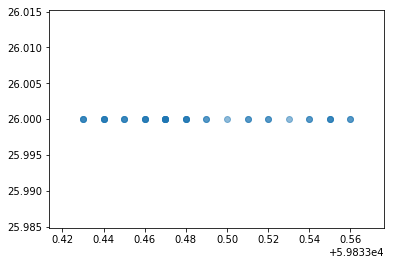

Number of Data Points in Bucket is :  40
Change in SOC WRT distance 0.00000


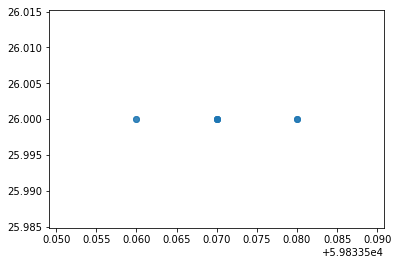

Number of Data Points in Bucket is :  14
Change in SOC WRT distance 0.00000


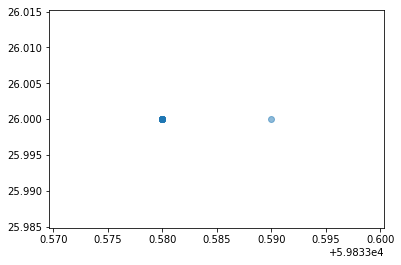

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


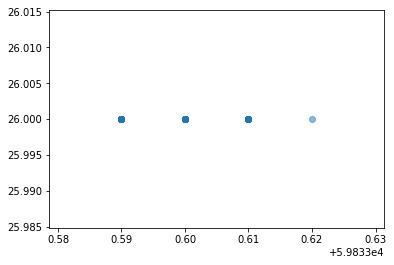

Number of Data Points in Bucket is :  49
Change in SOC WRT distance 0.00000


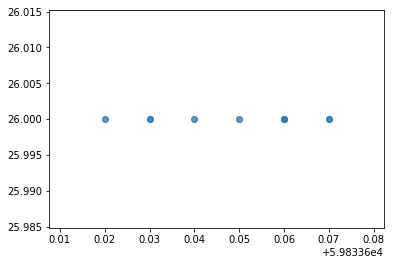

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


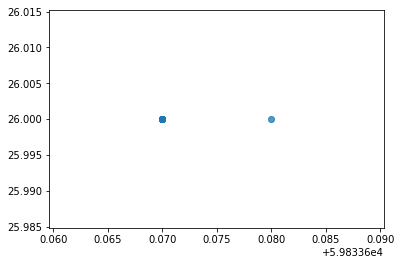

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


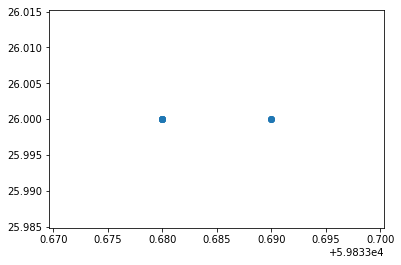

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


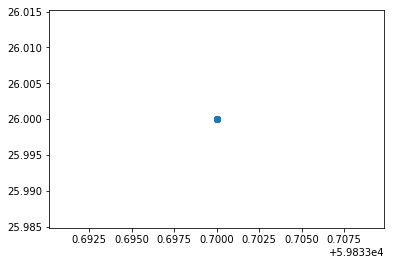

Number of Data Points in Bucket is :  12
Change in SOC WRT distance nan


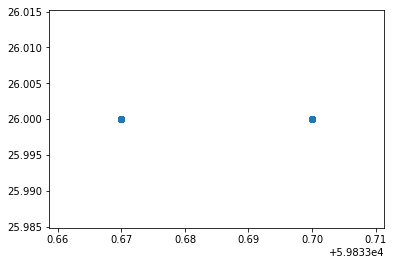

Number of Data Points in Bucket is :  42
Change in SOC WRT distance -0.00000


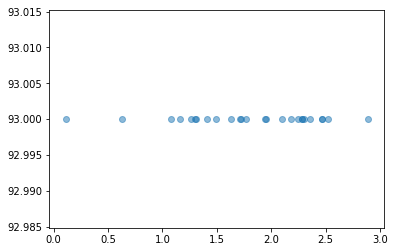

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


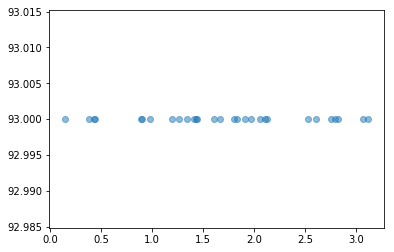

Number of Data Points in Bucket is :  29
Change in SOC WRT speed 0.00000


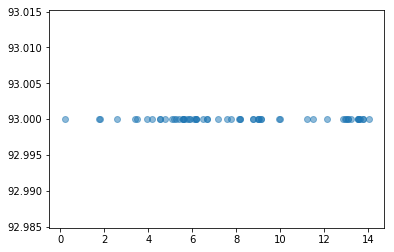

Number of Data Points in Bucket is :  61
Change in SOC WRT speed 0.00000


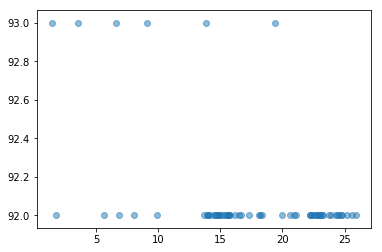

Number of Data Points in Bucket is :  64
Change in SOC WRT speed -3.03030


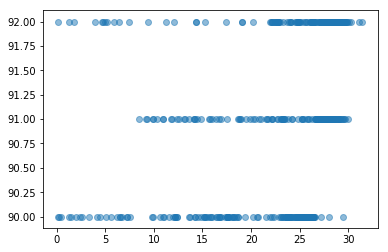

Number of Data Points in Bucket is :  442
Change in SOC WRT speed -1.53846


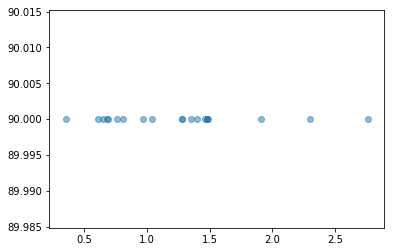

Number of Data Points in Bucket is :  20
Change in SOC WRT speed 0.00000


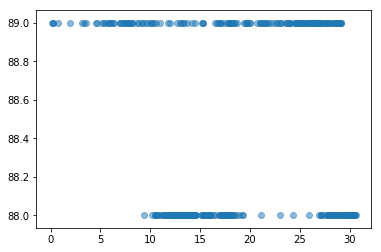

Number of Data Points in Bucket is :  382
Change in SOC WRT speed -0.11013


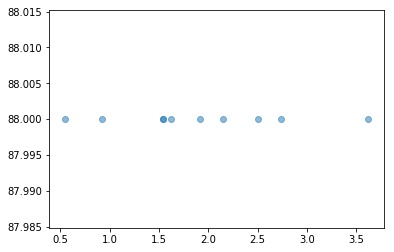

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


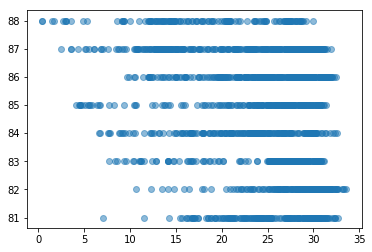

Number of Data Points in Bucket is :  1796
Change in SOC WRT speed -1.05740


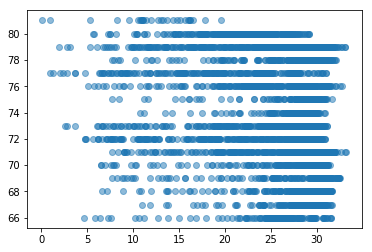

Number of Data Points in Bucket is :  3762
Change in SOC WRT speed -3.29670


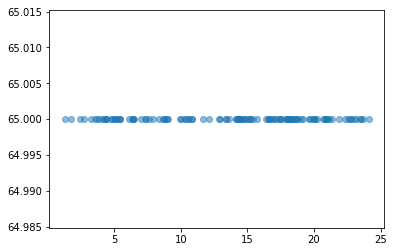

Number of Data Points in Bucket is :  118
Change in SOC WRT speed 0.00000


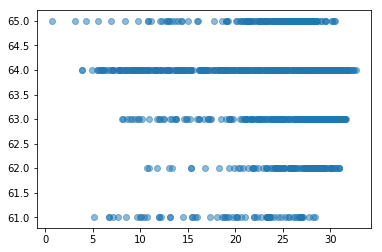

Number of Data Points in Bucket is :  1162
Change in SOC WRT speed -0.89087


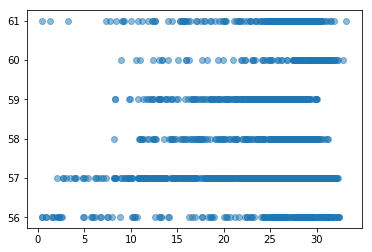

Number of Data Points in Bucket is :  1717
Change in SOC WRT speed -inf


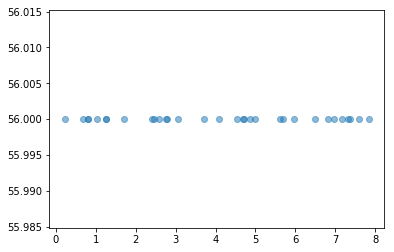

Number of Data Points in Bucket is :  32
Change in SOC WRT speed 0.00000


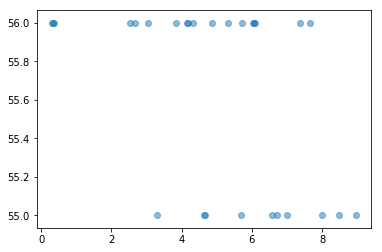

Number of Data Points in Bucket is :  28
Change in SOC WRT speed -0.34130


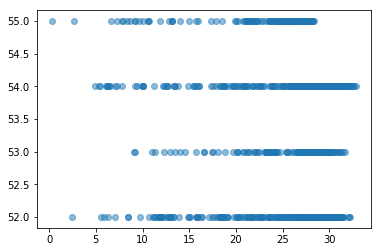

Number of Data Points in Bucket is :  847
Change in SOC WRT speed -1.40845


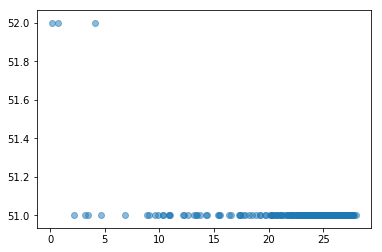

Number of Data Points in Bucket is :  243
Change in SOC WRT speed -0.50505


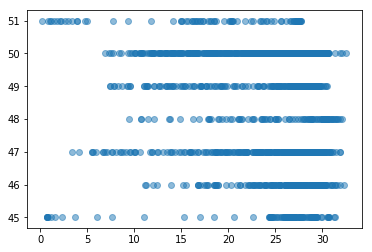

Number of Data Points in Bucket is :  1570
Change in SOC WRT speed -12.00000


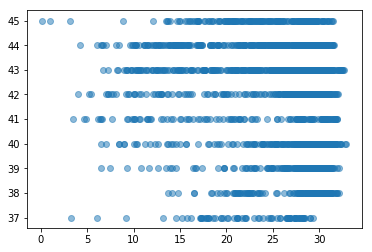

Number of Data Points in Bucket is :  1966
Change in SOC WRT speed -2.61438


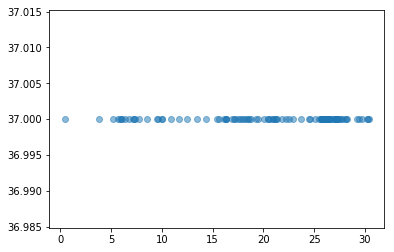

Number of Data Points in Bucket is :  103
Change in SOC WRT speed 0.00000


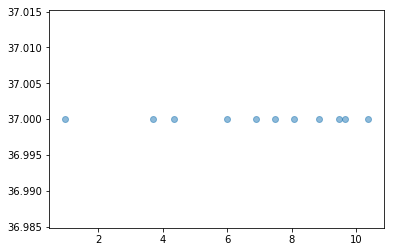

Number of Data Points in Bucket is :  11
Change in SOC WRT speed 0.00000


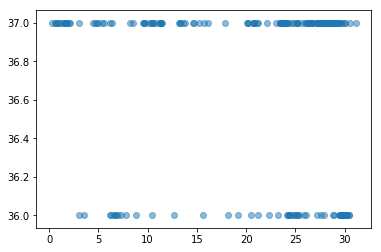

Number of Data Points in Bucket is :  239
Change in SOC WRT speed -0.36496


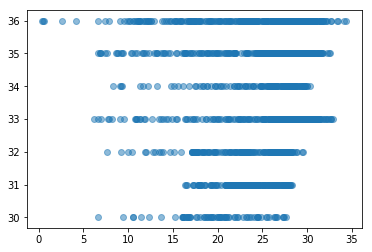

Number of Data Points in Bucket is :  1598
Change in SOC WRT speed -0.97087


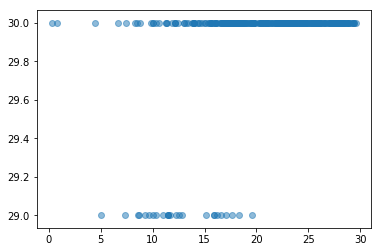

Number of Data Points in Bucket is :  348
Change in SOC WRT speed -0.21186


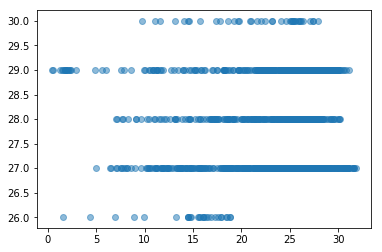

Number of Data Points in Bucket is :  1279
Change in SOC WRT speed -17.64706


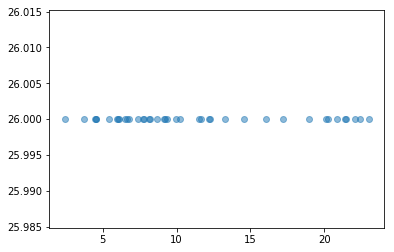

Number of Data Points in Bucket is :  40
Change in SOC WRT speed 0.00000


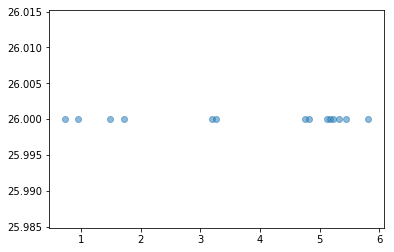

Number of Data Points in Bucket is :  14
Change in SOC WRT speed 0.00000


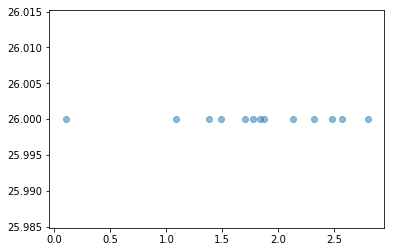

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


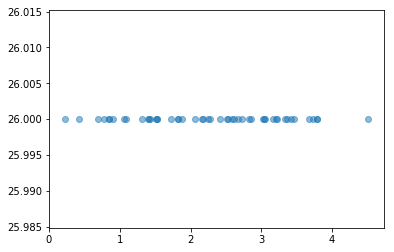

Number of Data Points in Bucket is :  49
Change in SOC WRT speed 0.00000


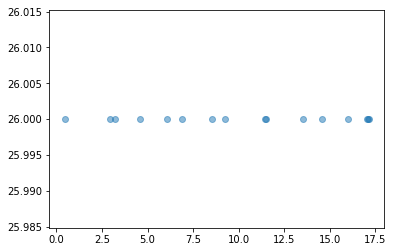

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


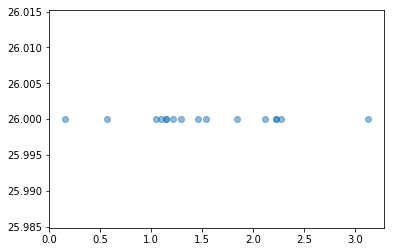

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


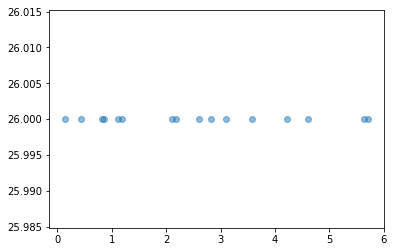

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


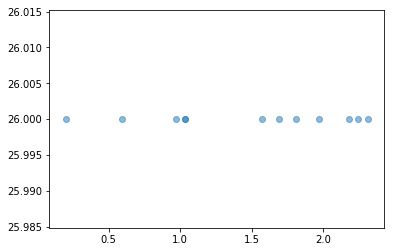

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


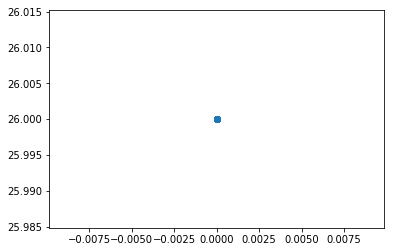

Number of Data Points in Bucket is :  42
Change in SOC WRT speed nan


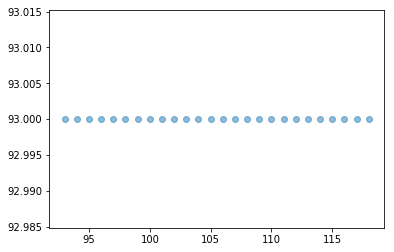

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


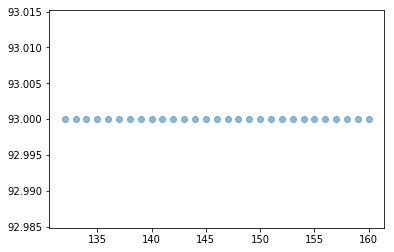

Number of Data Points in Bucket is :  29
Change in SOC WRT Time 0.00000


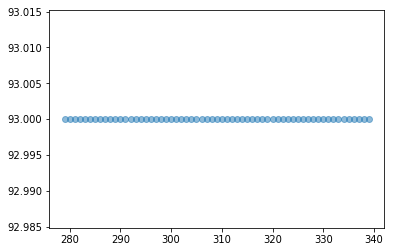

Number of Data Points in Bucket is :  61
Change in SOC WRT Time 0.00000


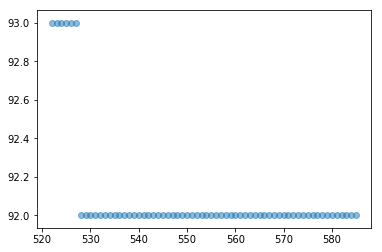

Number of Data Points in Bucket is :  64
Change in SOC WRT Time -0.01587


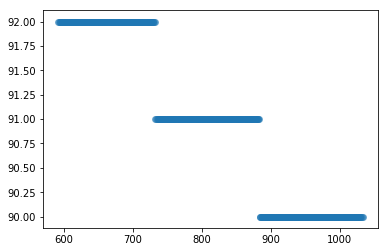

Number of Data Points in Bucket is :  442
Change in SOC WRT Time -0.00454


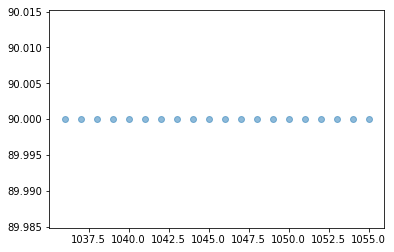

Number of Data Points in Bucket is :  20
Change in SOC WRT Time 0.00000


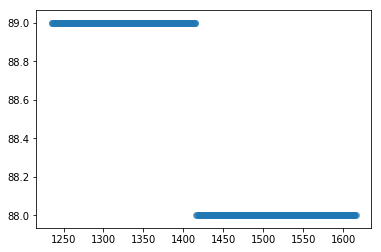

Number of Data Points in Bucket is :  382
Change in SOC WRT Time -0.00262


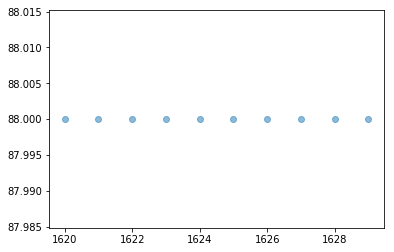

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


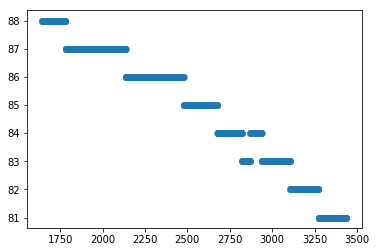

Number of Data Points in Bucket is :  1796
Change in SOC WRT Time -0.00390


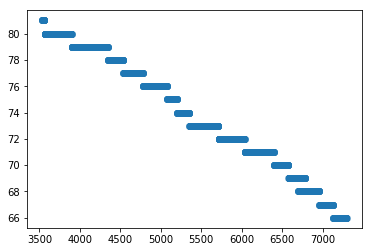

Number of Data Points in Bucket is :  3762
Change in SOC WRT Time -0.00399


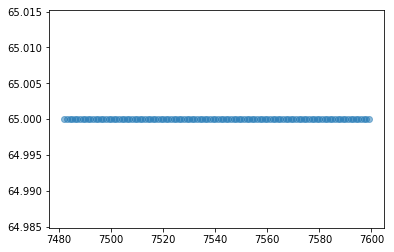

Number of Data Points in Bucket is :  118
Change in SOC WRT Time 0.00000


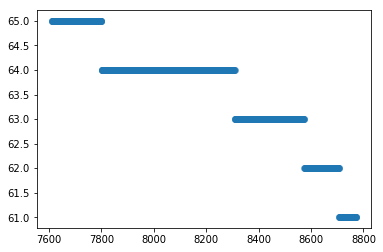

Number of Data Points in Bucket is :  1162
Change in SOC WRT Time -0.00345


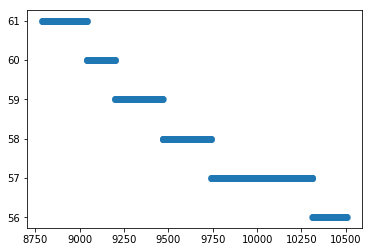

Number of Data Points in Bucket is :  1717
Change in SOC WRT Time -0.00291


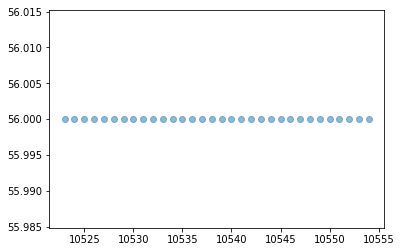

Number of Data Points in Bucket is :  32
Change in SOC WRT Time 0.00000


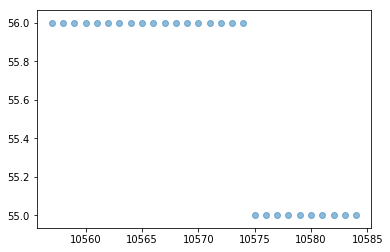

Number of Data Points in Bucket is :  28
Change in SOC WRT Time -0.03704


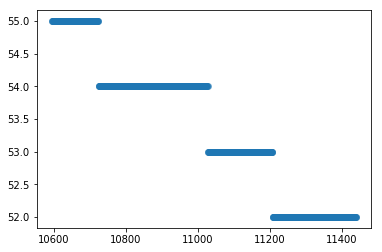

Number of Data Points in Bucket is :  847
Change in SOC WRT Time -0.00355


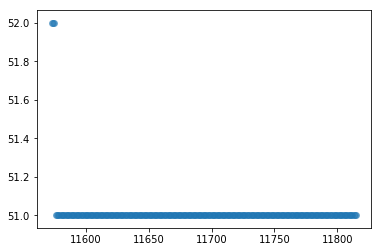

Number of Data Points in Bucket is :  243
Change in SOC WRT Time -0.00413


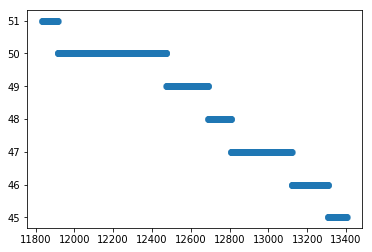

Number of Data Points in Bucket is :  1570
Change in SOC WRT Time -0.00382


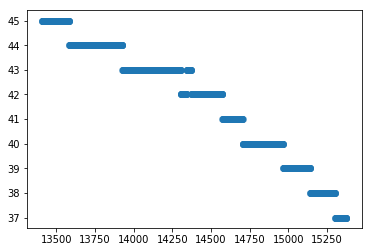

Number of Data Points in Bucket is :  1966
Change in SOC WRT Time -0.00407


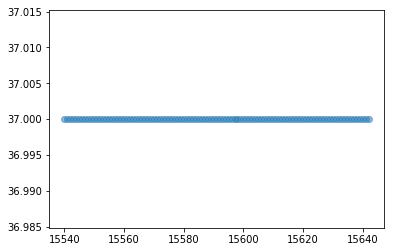

Number of Data Points in Bucket is :  103
Change in SOC WRT Time 0.00000


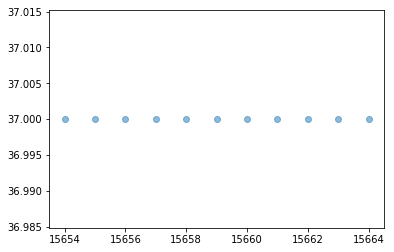

Number of Data Points in Bucket is :  11
Change in SOC WRT Time 0.00000


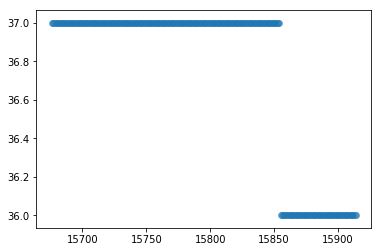

Number of Data Points in Bucket is :  239
Change in SOC WRT Time -0.00420


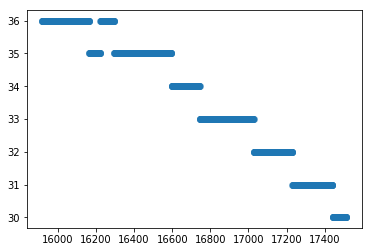

Number of Data Points in Bucket is :  1598
Change in SOC WRT Time -0.00376


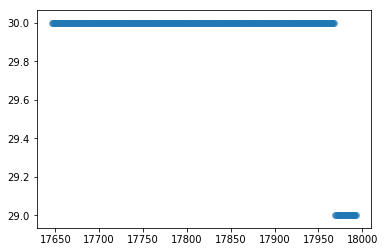

Number of Data Points in Bucket is :  348
Change in SOC WRT Time -0.00288


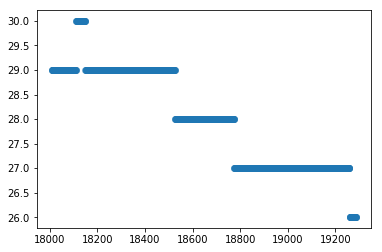

Number of Data Points in Bucket is :  1279
Change in SOC WRT Time -0.00235


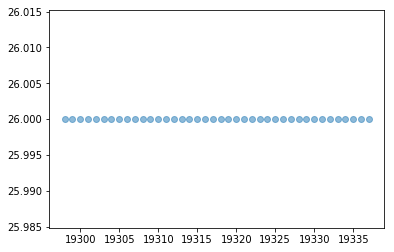

Number of Data Points in Bucket is :  40
Change in SOC WRT Time 0.00000


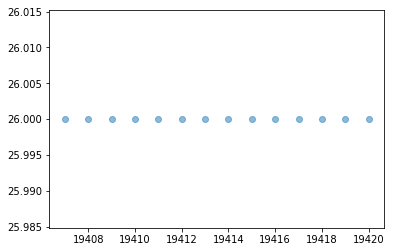

Number of Data Points in Bucket is :  14
Change in SOC WRT Time 0.00000


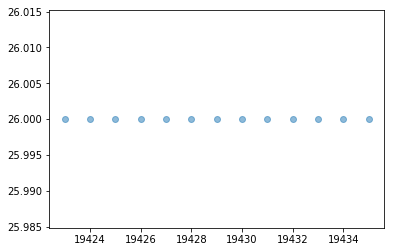

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


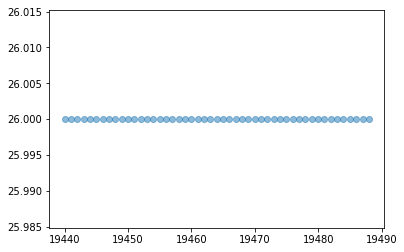

Number of Data Points in Bucket is :  49
Change in SOC WRT Time 0.00000


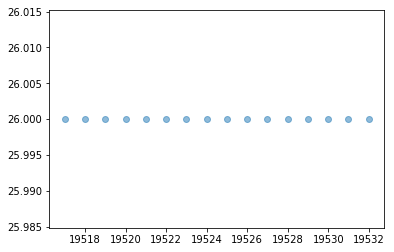

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


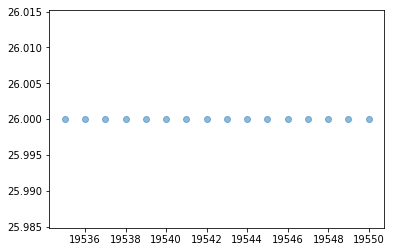

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


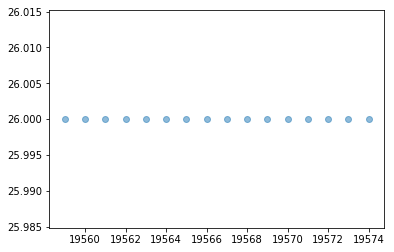

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


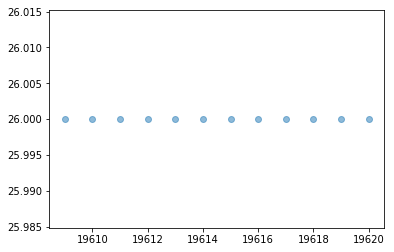

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


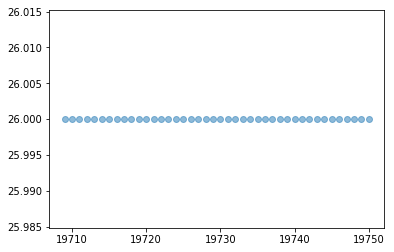

Number of Data Points in Bucket is :  42
Change in SOC WRT Time 0.00000


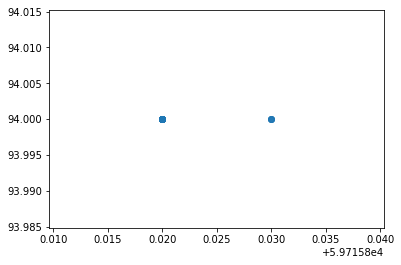

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


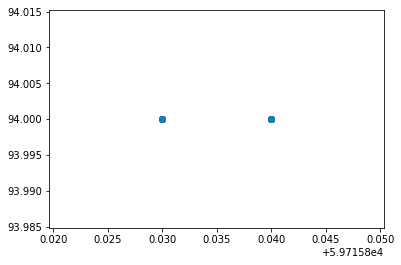

Number of Data Points in Bucket is :  29
Change in SOC WRT distance 0.00000


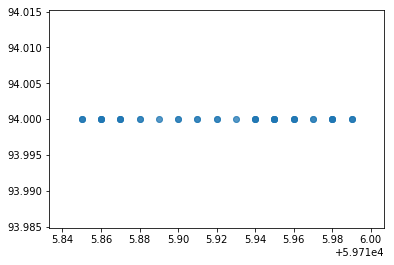

Number of Data Points in Bucket is :  61
Change in SOC WRT distance 0.00000


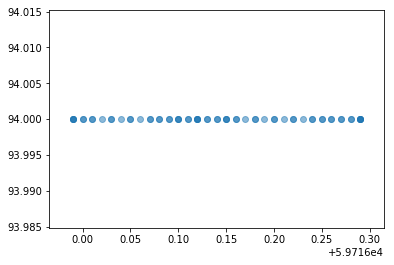

Number of Data Points in Bucket is :  64
Change in SOC WRT distance 0.00000


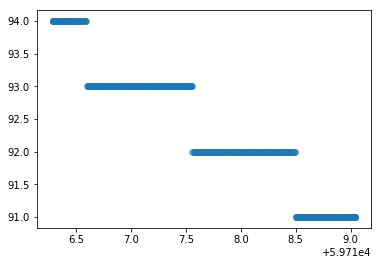

Number of Data Points in Bucket is :  442
Change in SOC WRT distance -1.09091
Change in distance WRT SOC -0.91667


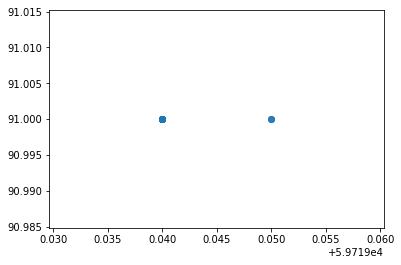

Number of Data Points in Bucket is :  20
Change in SOC WRT distance 0.00000


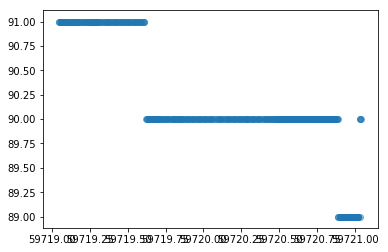

Number of Data Points in Bucket is :  382
Change in SOC WRT distance -0.50251
Change in distance WRT SOC -1.99000


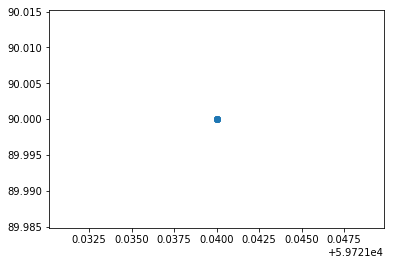

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


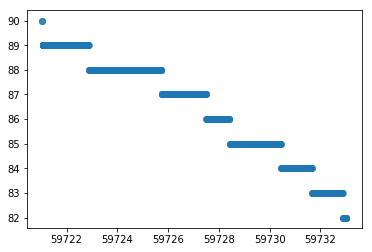

Number of Data Points in Bucket is :  1796
Change in SOC WRT distance -0.66778
Change in distance WRT SOC -1.49750


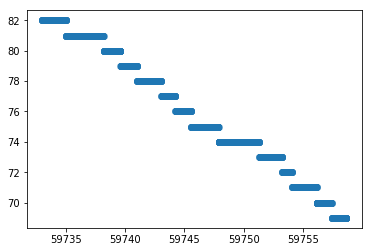

Number of Data Points in Bucket is :  3762
Change in SOC WRT distance -0.50742
Change in distance WRT SOC -1.97077


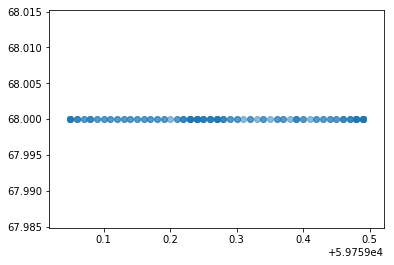

Number of Data Points in Bucket is :  118
Change in SOC WRT distance 0.00000


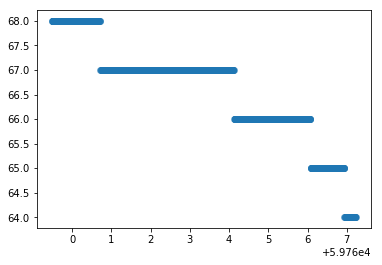

Number of Data Points in Bucket is :  1162
Change in SOC WRT distance -0.51680
Change in distance WRT SOC -1.93500


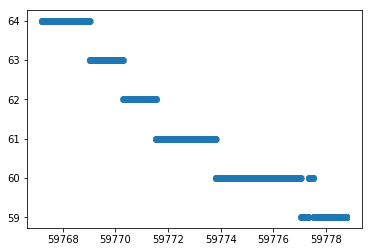

Number of Data Points in Bucket is :  1717
Change in SOC WRT distance -0.43328
Change in distance WRT SOC -2.30800


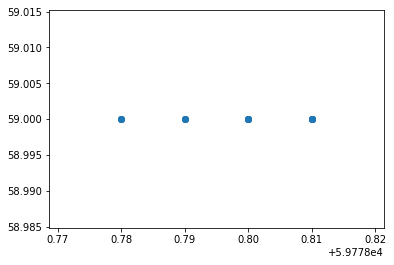

Number of Data Points in Bucket is :  32
Change in SOC WRT distance 0.00000


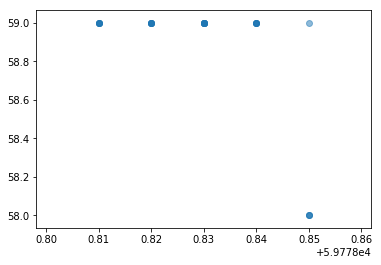

Number of Data Points in Bucket is :  28
Change in SOC WRT distance -25.00000
Change in distance WRT SOC -0.04000


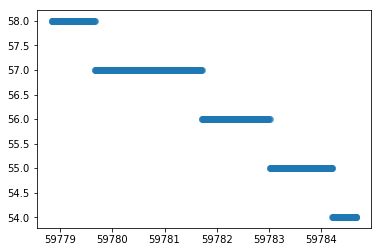

Number of Data Points in Bucket is :  847
Change in SOC WRT distance -0.68847
Change in distance WRT SOC -1.45250


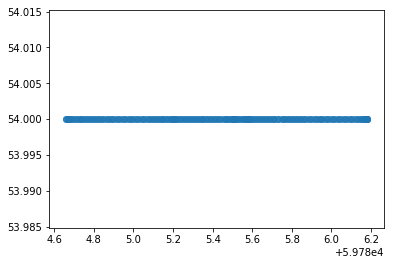

Number of Data Points in Bucket is :  243
Change in SOC WRT distance 0.00000


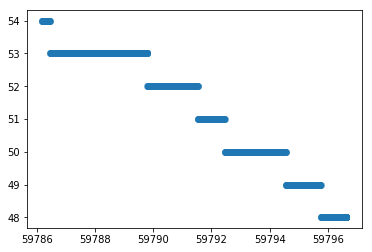

Number of Data Points in Bucket is :  1570
Change in SOC WRT distance -0.57361
Change in distance WRT SOC -1.74333


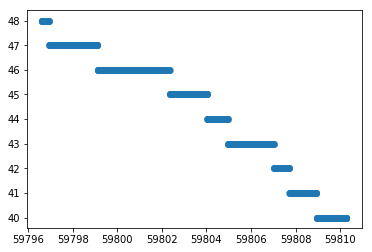

Number of Data Points in Bucket is :  1966
Change in SOC WRT distance -0.58694
Change in distance WRT SOC -1.70375


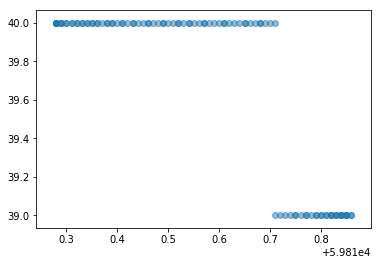

Number of Data Points in Bucket is :  103
Change in SOC WRT distance -1.72414
Change in distance WRT SOC -0.58000


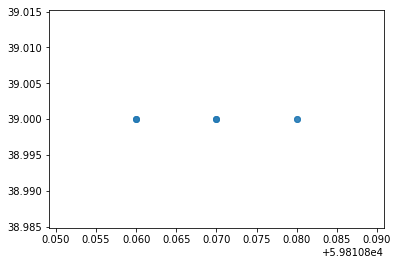

Number of Data Points in Bucket is :  11
Change in SOC WRT distance 0.00000


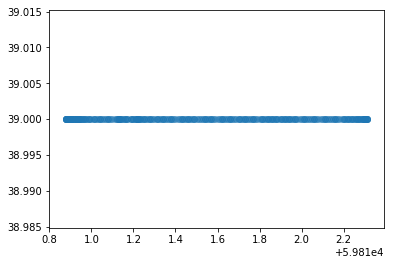

Number of Data Points in Bucket is :  239
Change in SOC WRT distance 0.00000


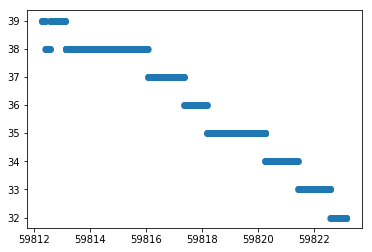

Number of Data Points in Bucket is :  1598
Change in SOC WRT distance -0.64576
Change in distance WRT SOC -1.54857


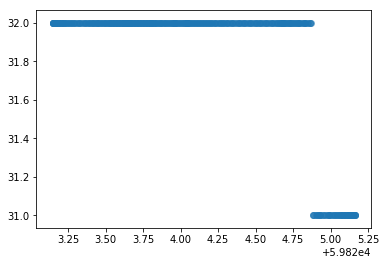

Number of Data Points in Bucket is :  348
Change in SOC WRT distance -0.49751
Change in distance WRT SOC -2.01000


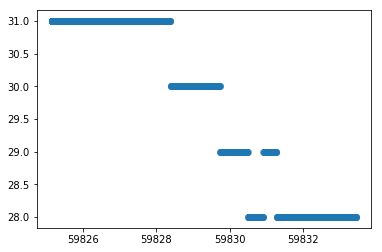

Number of Data Points in Bucket is :  1279
Change in SOC WRT distance -0.36276
Change in distance WRT SOC -2.75667


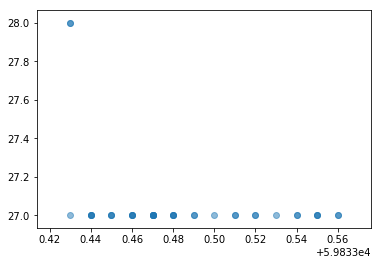

Number of Data Points in Bucket is :  40
Change in SOC WRT distance -7.69231
Change in distance WRT SOC -0.13000


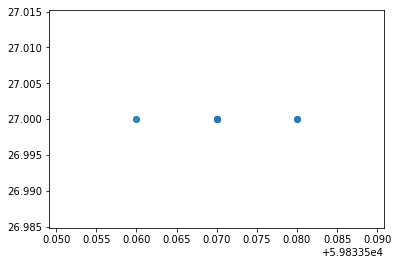

Number of Data Points in Bucket is :  14
Change in SOC WRT distance 0.00000


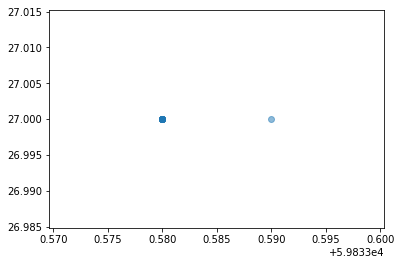

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


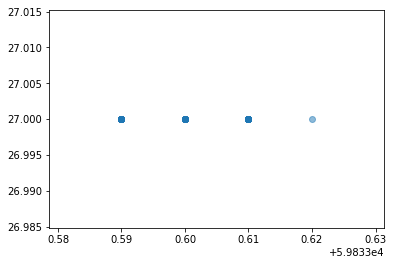

Number of Data Points in Bucket is :  49
Change in SOC WRT distance 0.00000


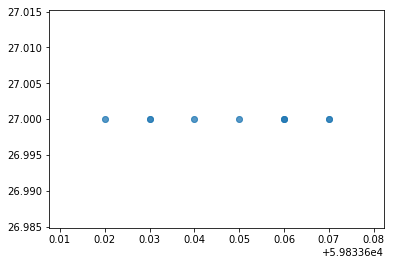

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


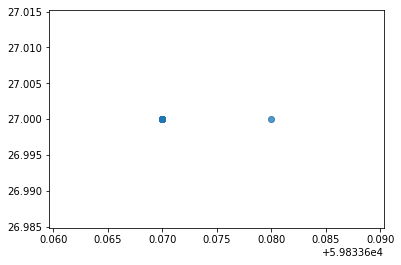

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


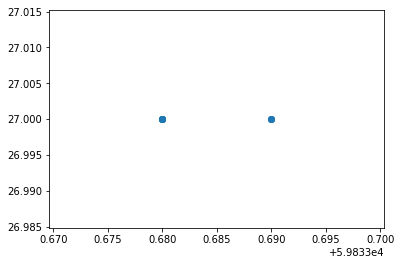

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


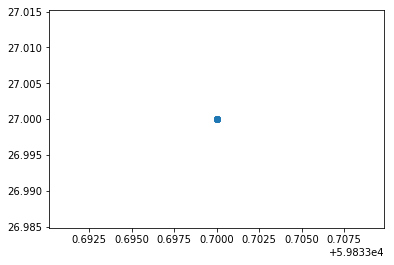

Number of Data Points in Bucket is :  12
Change in SOC WRT distance nan


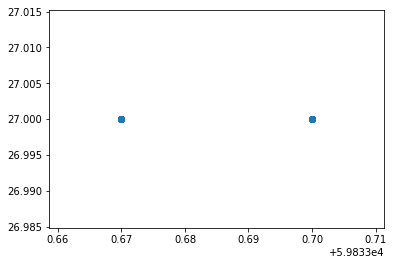

Number of Data Points in Bucket is :  42
Change in SOC WRT distance -0.00000


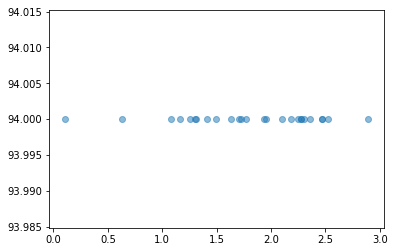

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


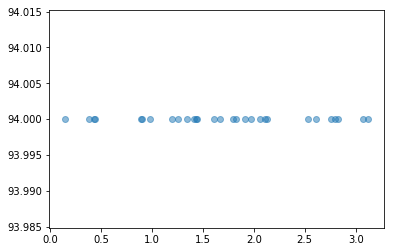

Number of Data Points in Bucket is :  29
Change in SOC WRT speed 0.00000


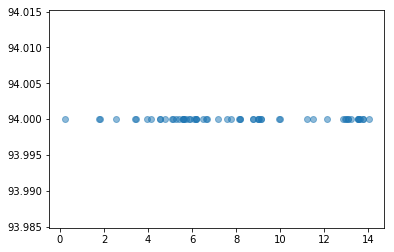

Number of Data Points in Bucket is :  61
Change in SOC WRT speed 0.00000


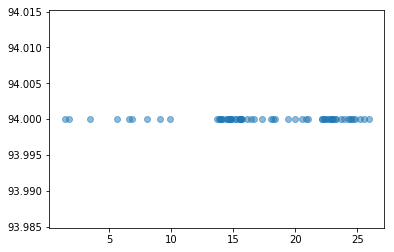

Number of Data Points in Bucket is :  64
Change in SOC WRT speed 0.00000


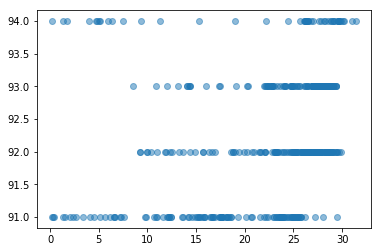

Number of Data Points in Bucket is :  442
Change in SOC WRT speed -2.30769


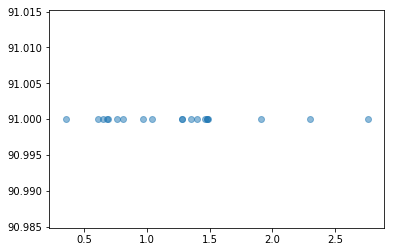

Number of Data Points in Bucket is :  20
Change in SOC WRT speed 0.00000


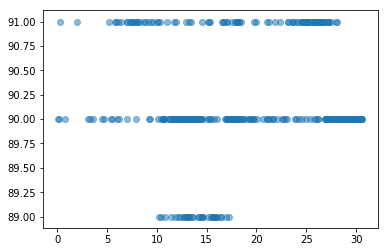

Number of Data Points in Bucket is :  382
Change in SOC WRT speed -0.11013


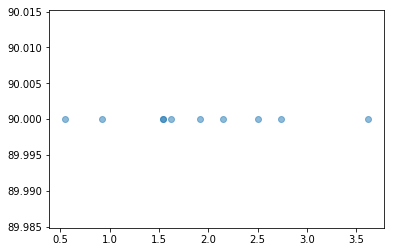

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


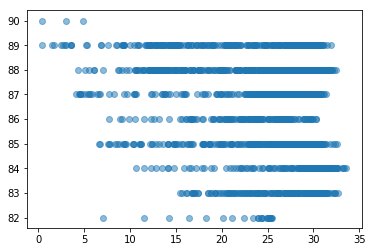

Number of Data Points in Bucket is :  1796
Change in SOC WRT speed -1.20846


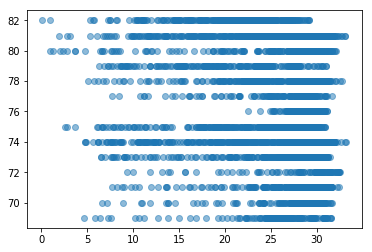

Number of Data Points in Bucket is :  3762
Change in SOC WRT speed -2.85714


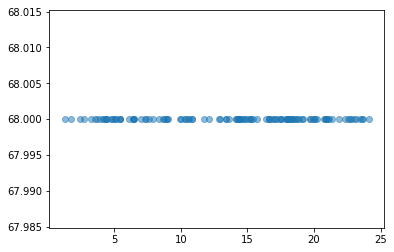

Number of Data Points in Bucket is :  118
Change in SOC WRT speed 0.00000


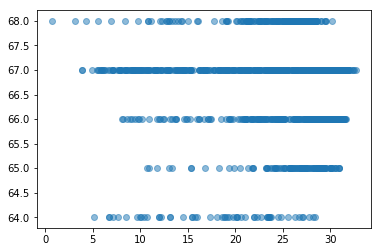

Number of Data Points in Bucket is :  1162
Change in SOC WRT speed -0.89087


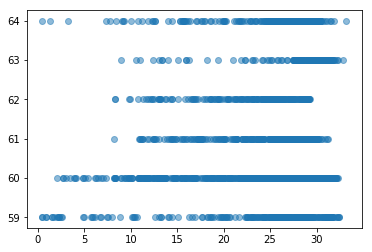

Number of Data Points in Bucket is :  1717
Change in SOC WRT speed -inf


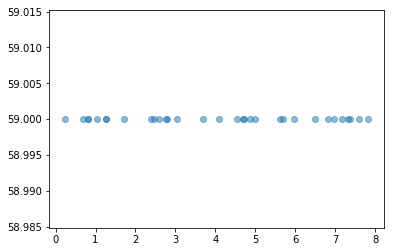

Number of Data Points in Bucket is :  32
Change in SOC WRT speed 0.00000


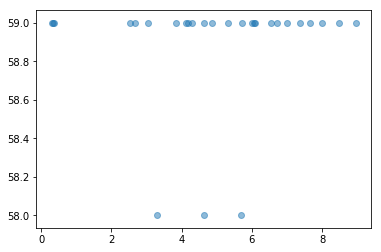

Number of Data Points in Bucket is :  28
Change in SOC WRT speed -0.34130


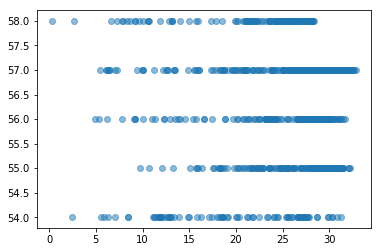

Number of Data Points in Bucket is :  847
Change in SOC WRT speed -1.87793


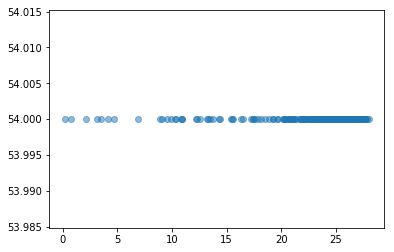

Number of Data Points in Bucket is :  243
Change in SOC WRT speed 0.00000


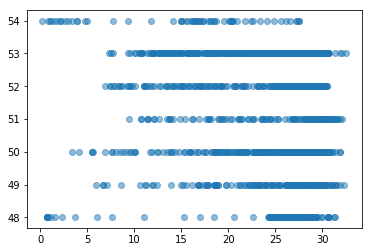

Number of Data Points in Bucket is :  1570
Change in SOC WRT speed -12.00000


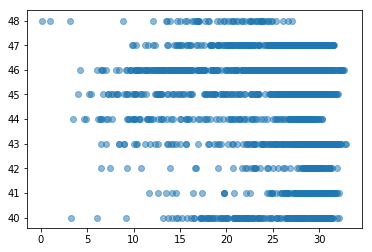

Number of Data Points in Bucket is :  1966
Change in SOC WRT speed -2.61438


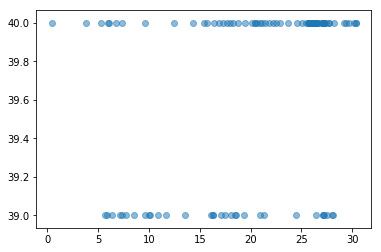

Number of Data Points in Bucket is :  103
Change in SOC WRT speed -0.16835


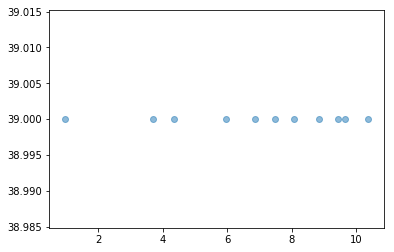

Number of Data Points in Bucket is :  11
Change in SOC WRT speed 0.00000


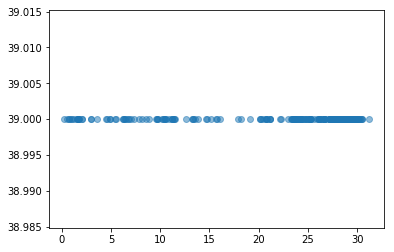

Number of Data Points in Bucket is :  239
Change in SOC WRT speed 0.00000


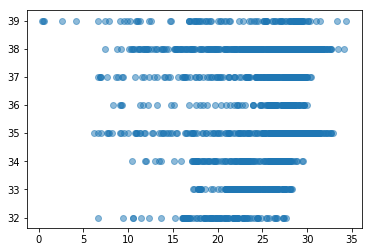

Number of Data Points in Bucket is :  1598
Change in SOC WRT speed -1.13269


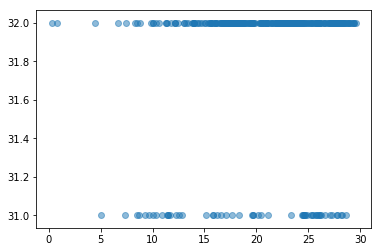

Number of Data Points in Bucket is :  348
Change in SOC WRT speed -0.21186


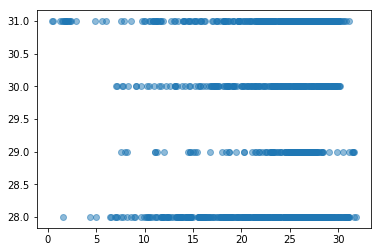

Number of Data Points in Bucket is :  1279
Change in SOC WRT speed -17.64706


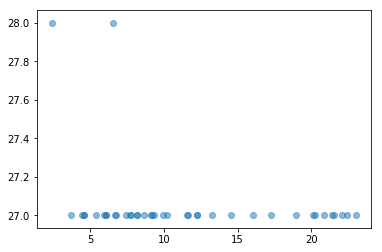

Number of Data Points in Bucket is :  40
Change in SOC WRT speed -0.77519


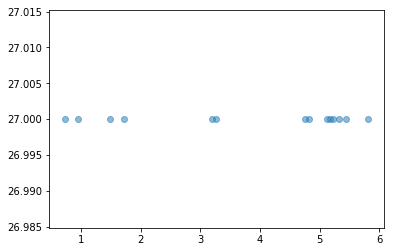

Number of Data Points in Bucket is :  14
Change in SOC WRT speed 0.00000


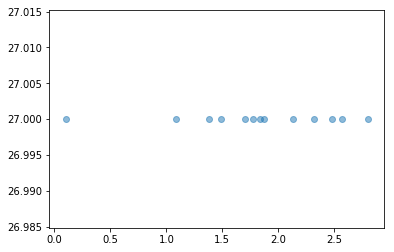

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


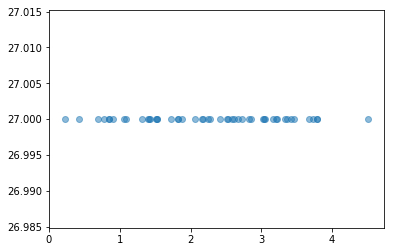

Number of Data Points in Bucket is :  49
Change in SOC WRT speed 0.00000


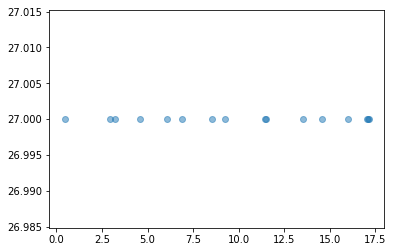

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


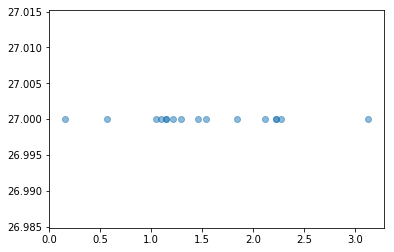

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


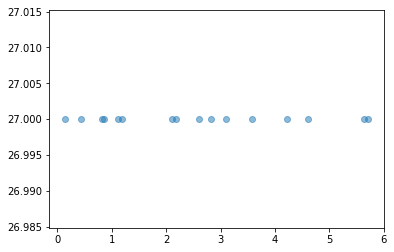

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


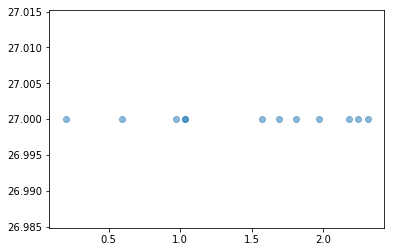

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


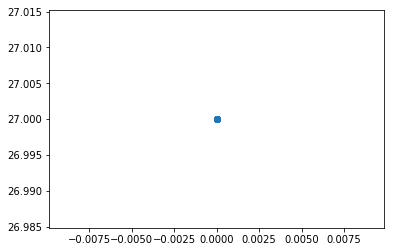

Number of Data Points in Bucket is :  42
Change in SOC WRT speed nan


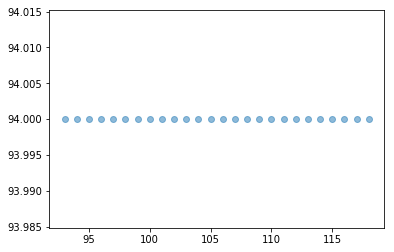

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


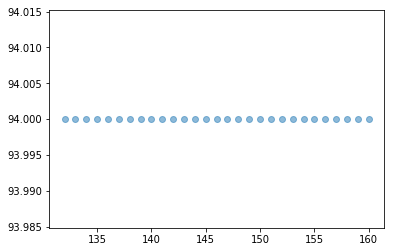

Number of Data Points in Bucket is :  29
Change in SOC WRT Time 0.00000


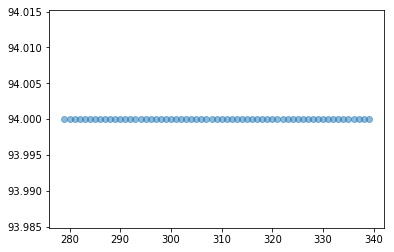

Number of Data Points in Bucket is :  61
Change in SOC WRT Time 0.00000


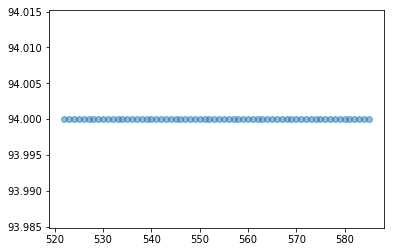

Number of Data Points in Bucket is :  64
Change in SOC WRT Time 0.00000


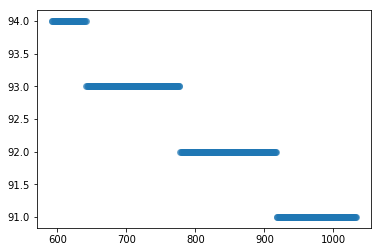

Number of Data Points in Bucket is :  442
Change in SOC WRT Time -0.00680


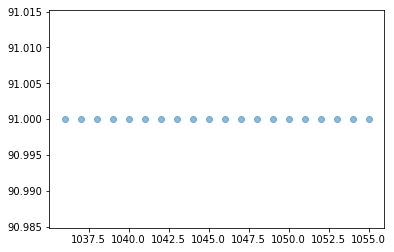

Number of Data Points in Bucket is :  20
Change in SOC WRT Time 0.00000


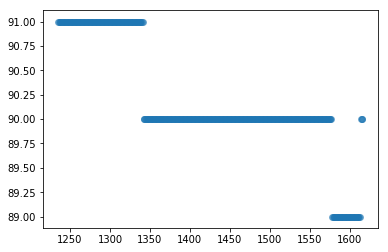

Number of Data Points in Bucket is :  382
Change in SOC WRT Time -0.00262


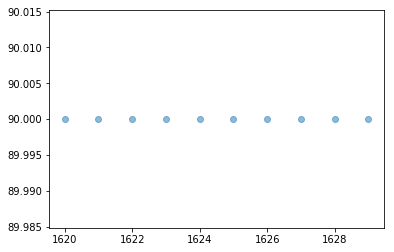

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


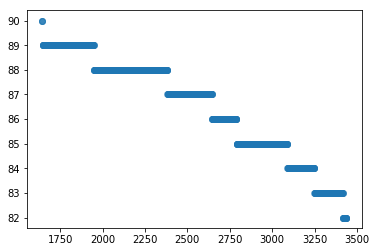

Number of Data Points in Bucket is :  1796
Change in SOC WRT Time -0.00446


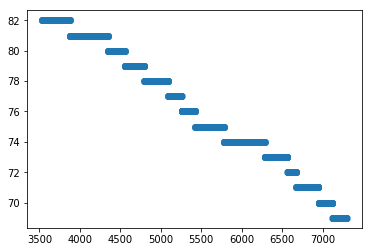

Number of Data Points in Bucket is :  3762
Change in SOC WRT Time -0.00346


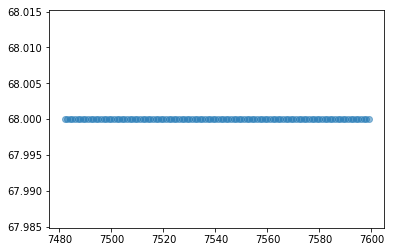

Number of Data Points in Bucket is :  118
Change in SOC WRT Time 0.00000


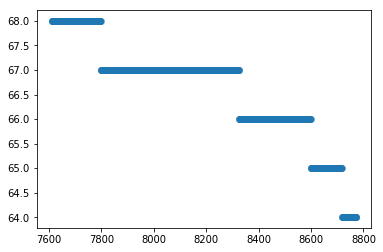

Number of Data Points in Bucket is :  1162
Change in SOC WRT Time -0.00345


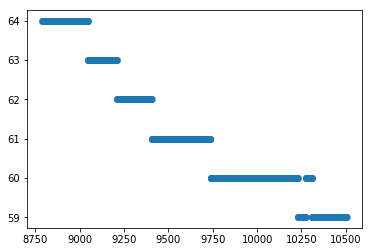

Number of Data Points in Bucket is :  1717
Change in SOC WRT Time -0.00291


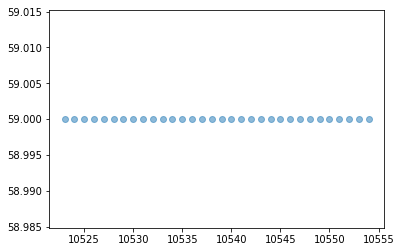

Number of Data Points in Bucket is :  32
Change in SOC WRT Time 0.00000


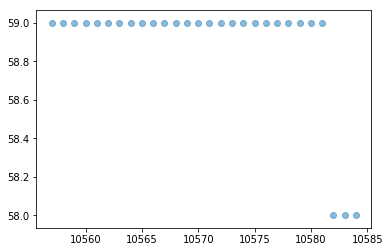

Number of Data Points in Bucket is :  28
Change in SOC WRT Time -0.03704


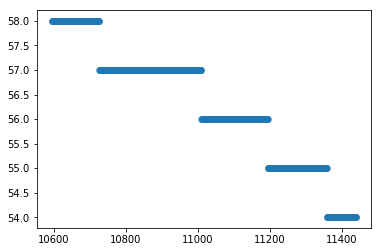

Number of Data Points in Bucket is :  847
Change in SOC WRT Time -0.00473


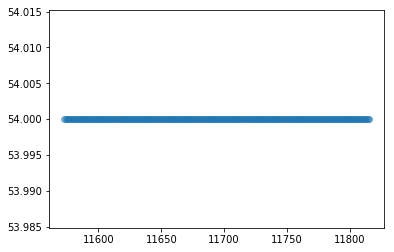

Number of Data Points in Bucket is :  243
Change in SOC WRT Time 0.00000


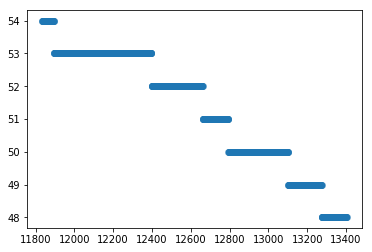

Number of Data Points in Bucket is :  1570
Change in SOC WRT Time -0.00382


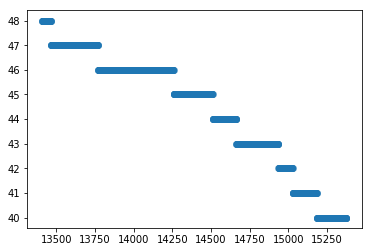

Number of Data Points in Bucket is :  1966
Change in SOC WRT Time -0.00407


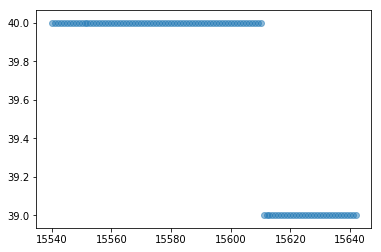

Number of Data Points in Bucket is :  103
Change in SOC WRT Time -0.00980


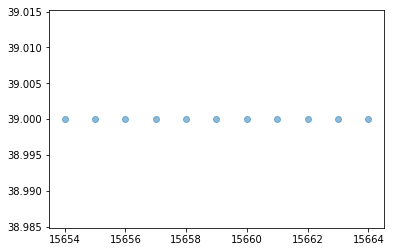

Number of Data Points in Bucket is :  11
Change in SOC WRT Time 0.00000


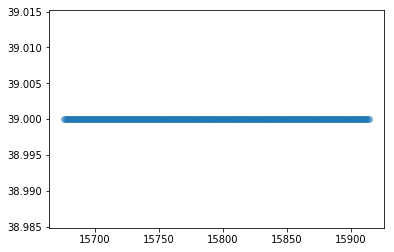

Number of Data Points in Bucket is :  239
Change in SOC WRT Time 0.00000


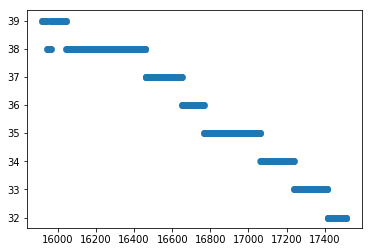

Number of Data Points in Bucket is :  1598
Change in SOC WRT Time -0.00438


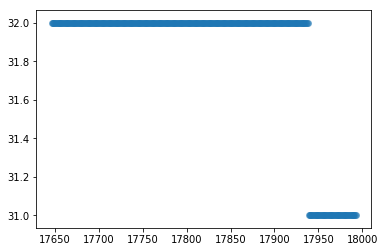

Number of Data Points in Bucket is :  348
Change in SOC WRT Time -0.00288


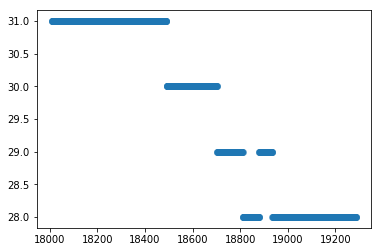

Number of Data Points in Bucket is :  1279
Change in SOC WRT Time -0.00235


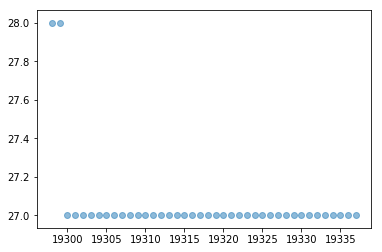

Number of Data Points in Bucket is :  40
Change in SOC WRT Time -0.02564


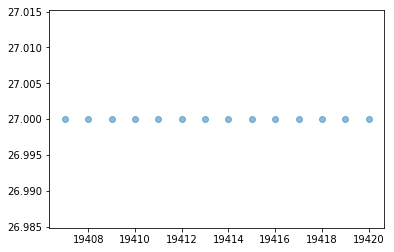

Number of Data Points in Bucket is :  14
Change in SOC WRT Time 0.00000


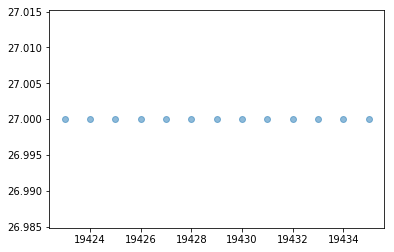

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


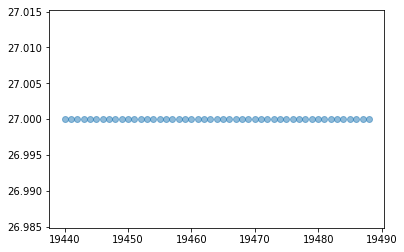

Number of Data Points in Bucket is :  49
Change in SOC WRT Time 0.00000


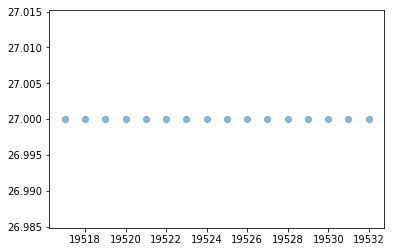

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


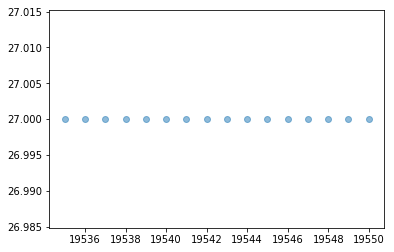

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


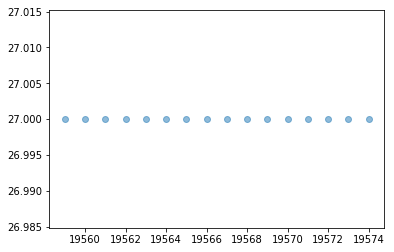

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


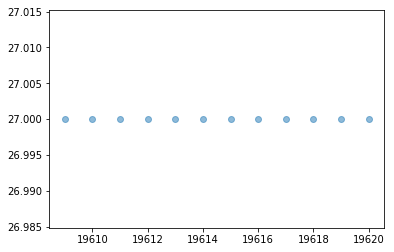

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


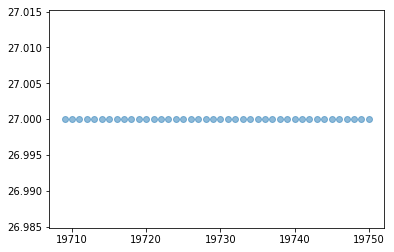

Number of Data Points in Bucket is :  42
Change in SOC WRT Time 0.00000


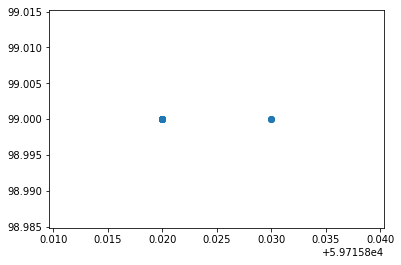

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


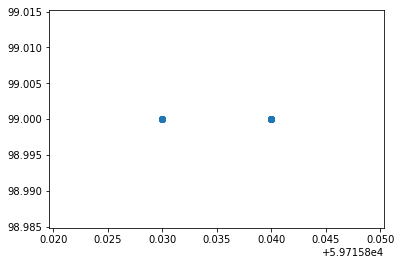

Number of Data Points in Bucket is :  29
Change in SOC WRT distance 0.00000


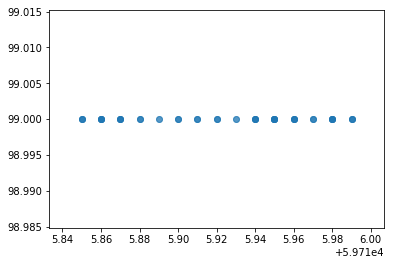

Number of Data Points in Bucket is :  61
Change in SOC WRT distance 0.00000


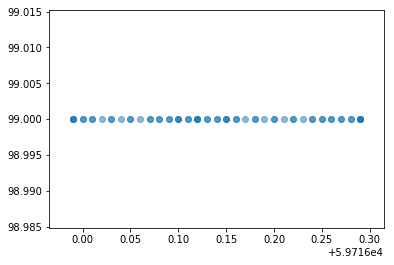

Number of Data Points in Bucket is :  64
Change in SOC WRT distance 0.00000


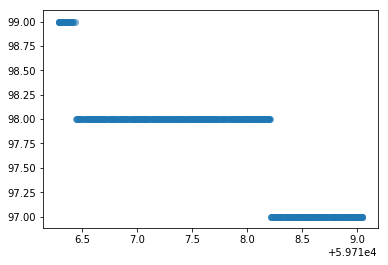

Number of Data Points in Bucket is :  442
Change in SOC WRT distance -0.72727
Change in distance WRT SOC -1.37500


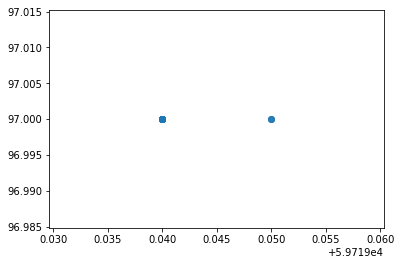

Number of Data Points in Bucket is :  20
Change in SOC WRT distance 0.00000


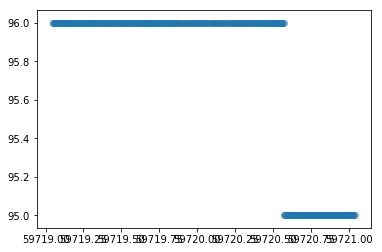

Number of Data Points in Bucket is :  382
Change in SOC WRT distance -0.50251
Change in distance WRT SOC -1.99000


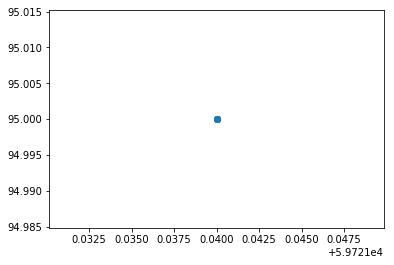

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


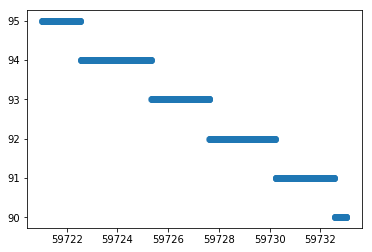

Number of Data Points in Bucket is :  1796
Change in SOC WRT distance -0.41736
Change in distance WRT SOC -2.39600


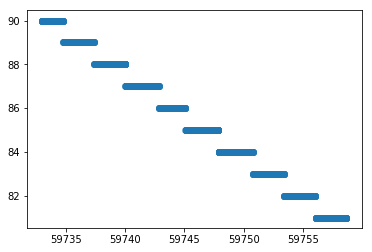

Number of Data Points in Bucket is :  3762
Change in SOC WRT distance -0.35129
Change in distance WRT SOC -2.84667


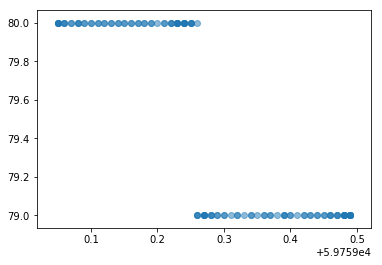

Number of Data Points in Bucket is :  118
Change in SOC WRT distance -2.27273
Change in distance WRT SOC -0.44000


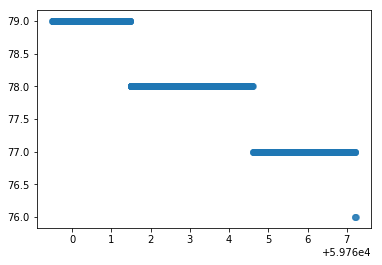

Number of Data Points in Bucket is :  1162
Change in SOC WRT distance -0.38760
Change in distance WRT SOC -2.58000


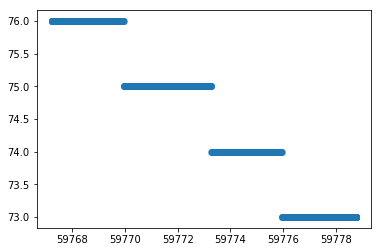

Number of Data Points in Bucket is :  1717
Change in SOC WRT distance -0.25997
Change in distance WRT SOC -3.84667


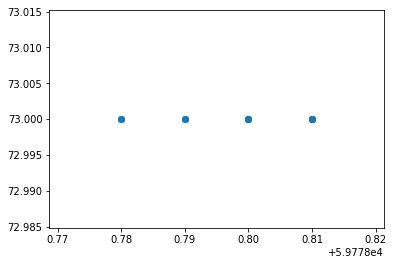

Number of Data Points in Bucket is :  32
Change in SOC WRT distance 0.00000


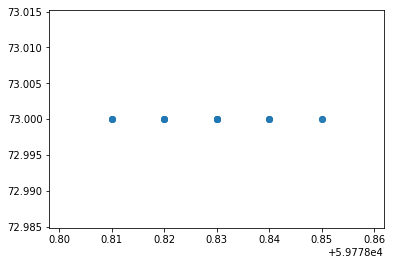

Number of Data Points in Bucket is :  28
Change in SOC WRT distance 0.00000


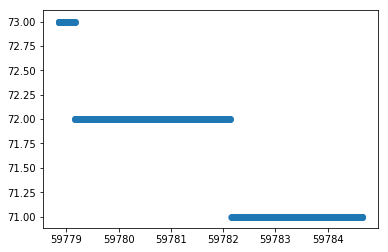

Number of Data Points in Bucket is :  847
Change in SOC WRT distance -0.34423
Change in distance WRT SOC -2.90500


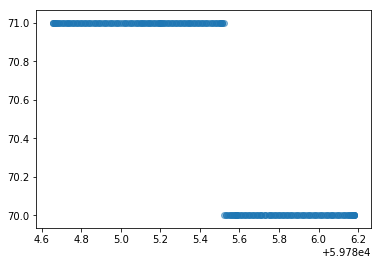

Number of Data Points in Bucket is :  243
Change in SOC WRT distance -0.65789
Change in distance WRT SOC -1.52000


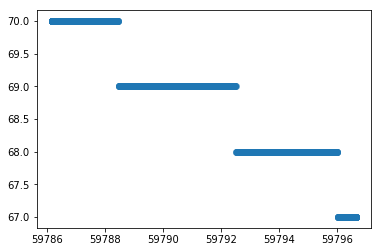

Number of Data Points in Bucket is :  1570
Change in SOC WRT distance -0.28681
Change in distance WRT SOC -3.48667


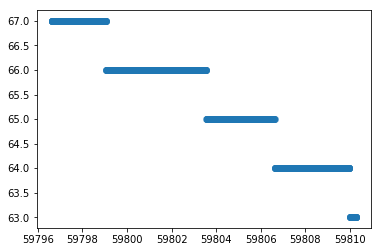

Number of Data Points in Bucket is :  1966
Change in SOC WRT distance -0.29347
Change in distance WRT SOC -3.40750


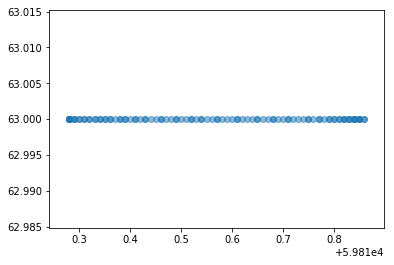

Number of Data Points in Bucket is :  103
Change in SOC WRT distance 0.00000


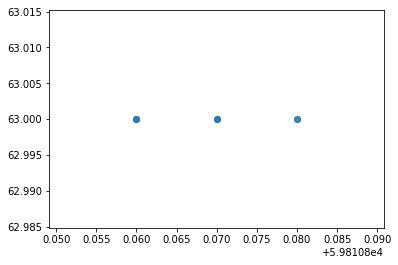

Number of Data Points in Bucket is :  11
Change in SOC WRT distance 0.00000


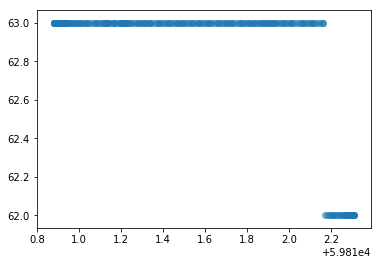

Number of Data Points in Bucket is :  239
Change in SOC WRT distance -0.69930
Change in distance WRT SOC -1.43000


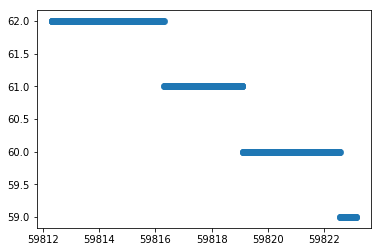

Number of Data Points in Bucket is :  1598
Change in SOC WRT distance -0.27675
Change in distance WRT SOC -3.61333


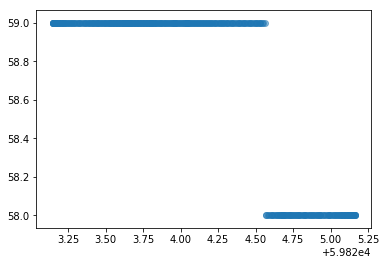

Number of Data Points in Bucket is :  348
Change in SOC WRT distance -0.49751
Change in distance WRT SOC -2.01000


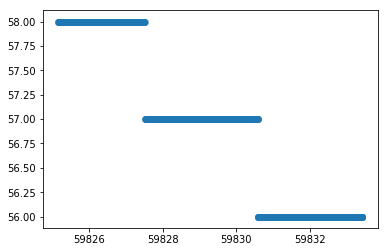

Number of Data Points in Bucket is :  1279
Change in SOC WRT distance -0.24184
Change in distance WRT SOC -4.13500


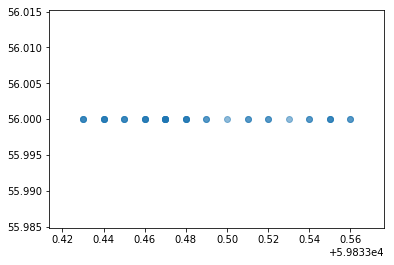

Number of Data Points in Bucket is :  40
Change in SOC WRT distance 0.00000


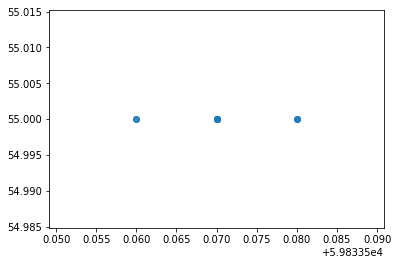

Number of Data Points in Bucket is :  14
Change in SOC WRT distance 0.00000


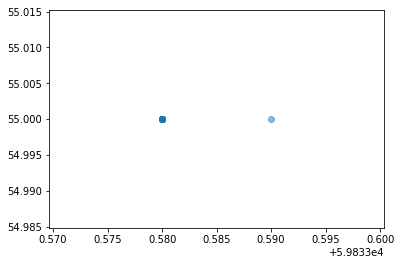

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


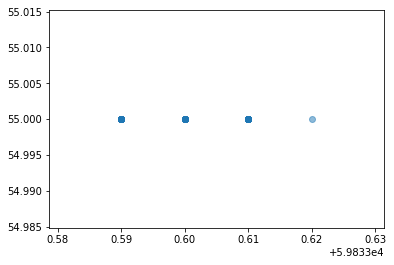

Number of Data Points in Bucket is :  49
Change in SOC WRT distance 0.00000


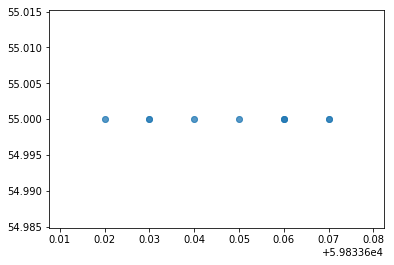

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


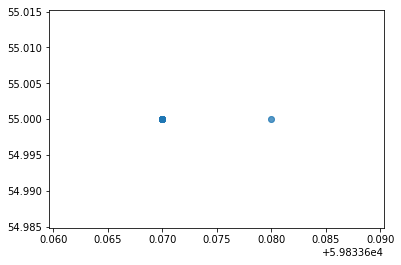

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


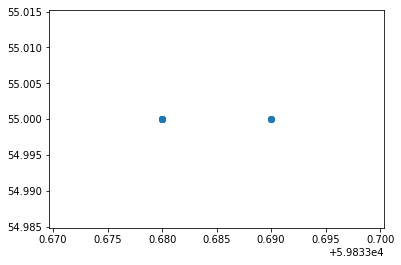

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


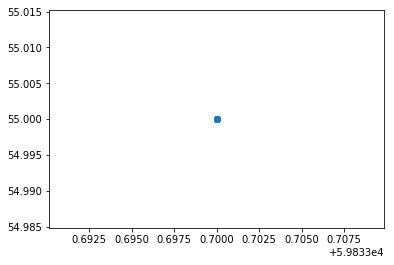

Number of Data Points in Bucket is :  12
Change in SOC WRT distance nan


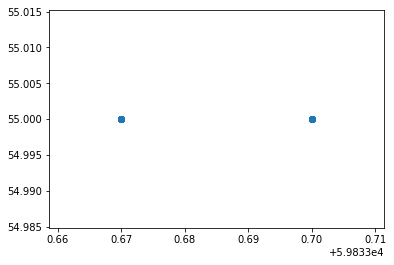

Number of Data Points in Bucket is :  42
Change in SOC WRT distance -0.00000


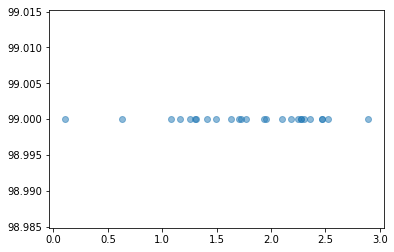

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


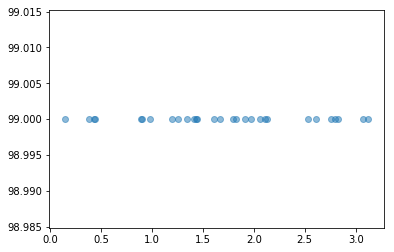

Number of Data Points in Bucket is :  29
Change in SOC WRT speed 0.00000


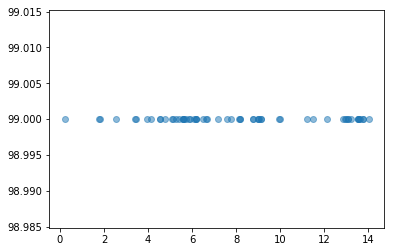

Number of Data Points in Bucket is :  61
Change in SOC WRT speed 0.00000


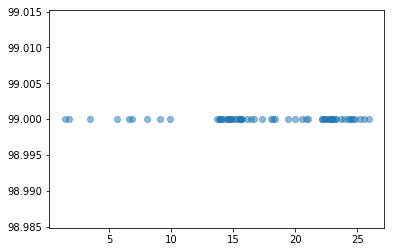

Number of Data Points in Bucket is :  64
Change in SOC WRT speed 0.00000


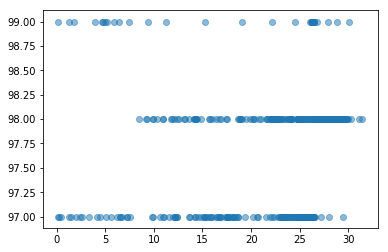

Number of Data Points in Bucket is :  442
Change in SOC WRT speed -1.53846


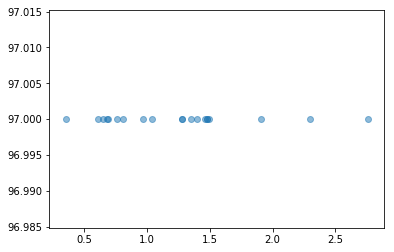

Number of Data Points in Bucket is :  20
Change in SOC WRT speed 0.00000


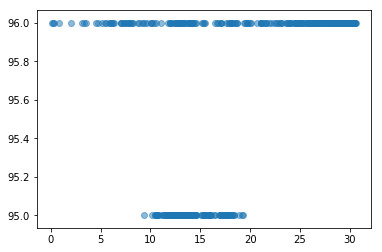

Number of Data Points in Bucket is :  382
Change in SOC WRT speed -0.11013


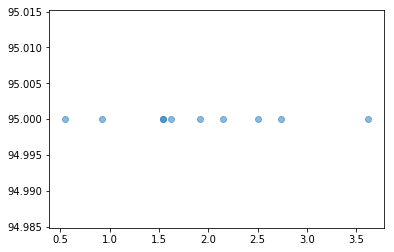

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


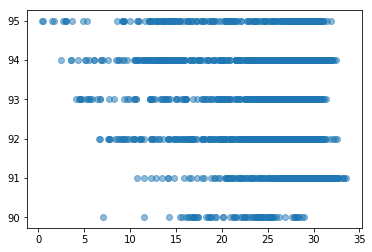

Number of Data Points in Bucket is :  1796
Change in SOC WRT speed -0.75529


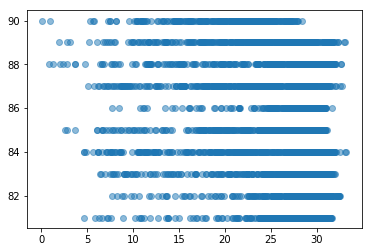

Number of Data Points in Bucket is :  3762
Change in SOC WRT speed -1.97802


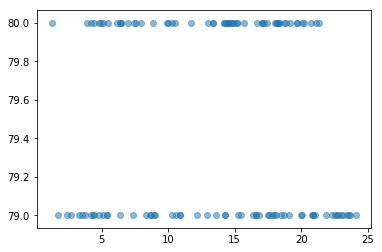

Number of Data Points in Bucket is :  118
Change in SOC WRT speed -2.12766


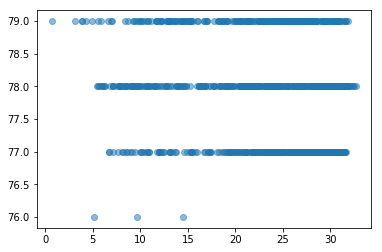

Number of Data Points in Bucket is :  1162
Change in SOC WRT speed -0.66815


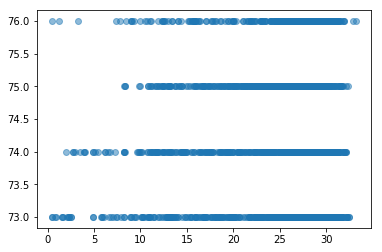

Number of Data Points in Bucket is :  1717
Change in SOC WRT speed -inf


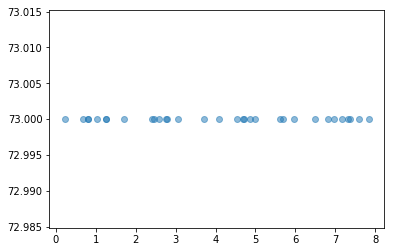

Number of Data Points in Bucket is :  32
Change in SOC WRT speed 0.00000


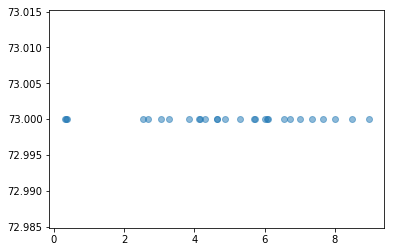

Number of Data Points in Bucket is :  28
Change in SOC WRT speed 0.00000


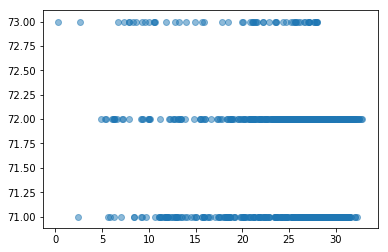

Number of Data Points in Bucket is :  847
Change in SOC WRT speed -0.93897


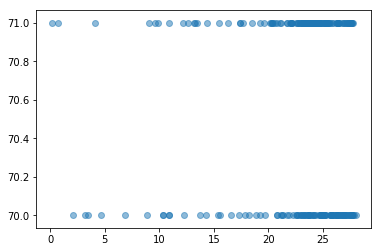

Number of Data Points in Bucket is :  243
Change in SOC WRT speed -0.50505


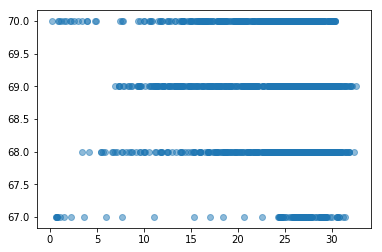

Number of Data Points in Bucket is :  1570
Change in SOC WRT speed -6.00000


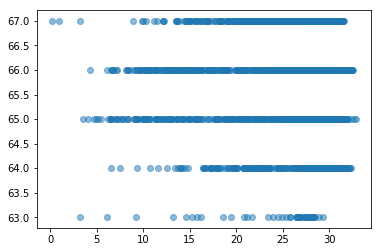

Number of Data Points in Bucket is :  1966
Change in SOC WRT speed -1.30719


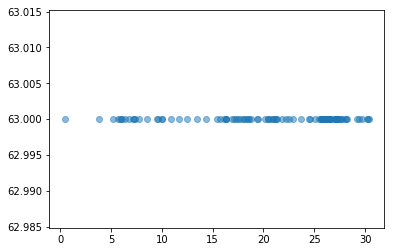

Number of Data Points in Bucket is :  103
Change in SOC WRT speed 0.00000


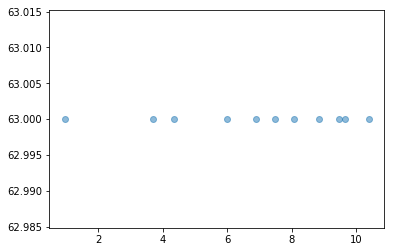

Number of Data Points in Bucket is :  11
Change in SOC WRT speed 0.00000


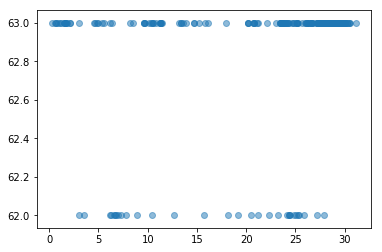

Number of Data Points in Bucket is :  239
Change in SOC WRT speed -0.36496


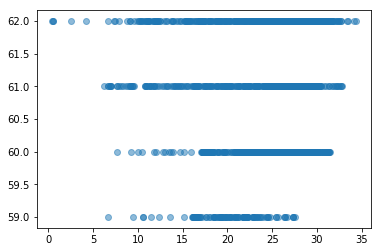

Number of Data Points in Bucket is :  1598
Change in SOC WRT speed -0.48544


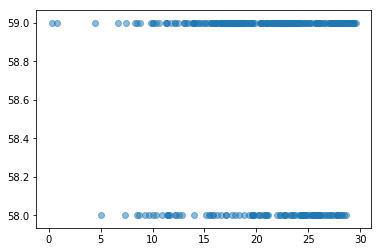

Number of Data Points in Bucket is :  348
Change in SOC WRT speed -0.21186


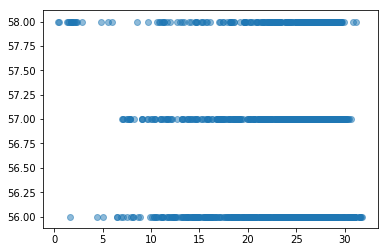

Number of Data Points in Bucket is :  1279
Change in SOC WRT speed -11.76471


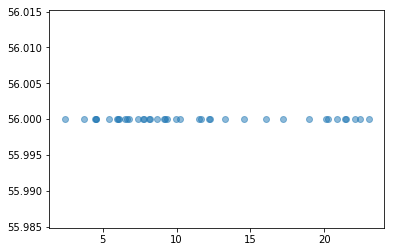

Number of Data Points in Bucket is :  40
Change in SOC WRT speed 0.00000


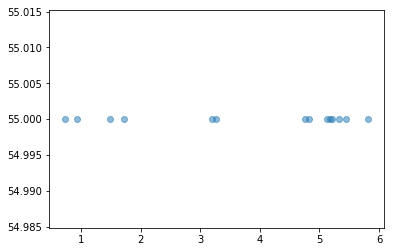

Number of Data Points in Bucket is :  14
Change in SOC WRT speed 0.00000


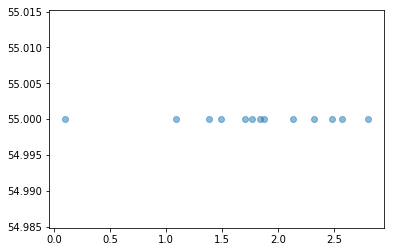

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


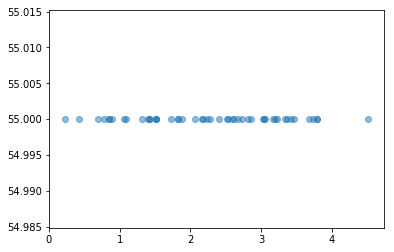

Number of Data Points in Bucket is :  49
Change in SOC WRT speed 0.00000


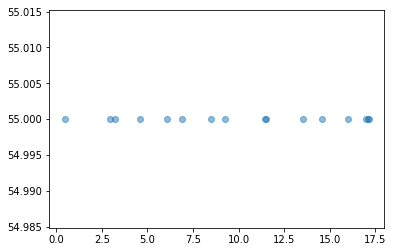

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


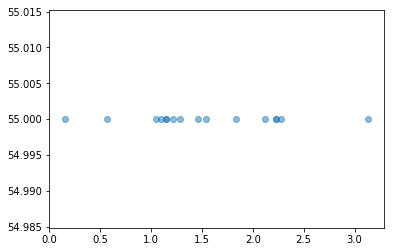

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


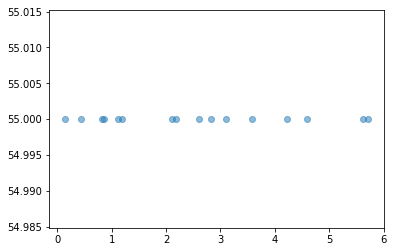

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


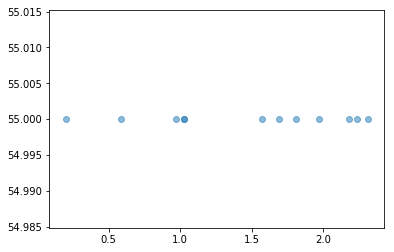

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


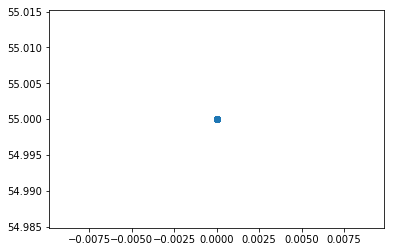

Number of Data Points in Bucket is :  42
Change in SOC WRT speed nan


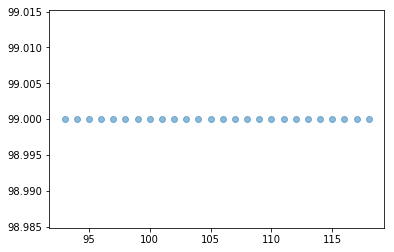

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


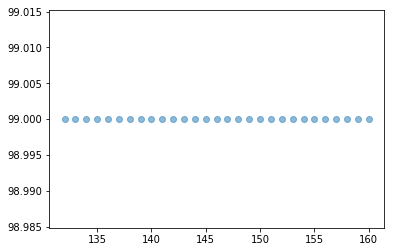

Number of Data Points in Bucket is :  29
Change in SOC WRT Time 0.00000


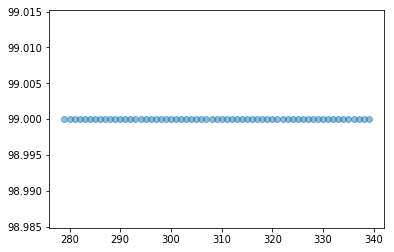

Number of Data Points in Bucket is :  61
Change in SOC WRT Time 0.00000


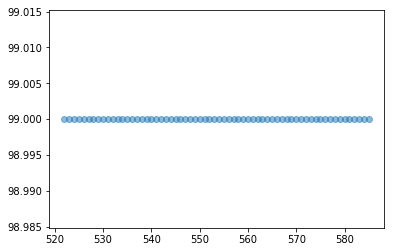

Number of Data Points in Bucket is :  64
Change in SOC WRT Time 0.00000


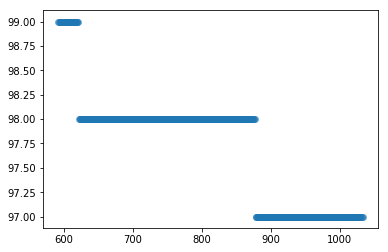

Number of Data Points in Bucket is :  442
Change in SOC WRT Time -0.00454


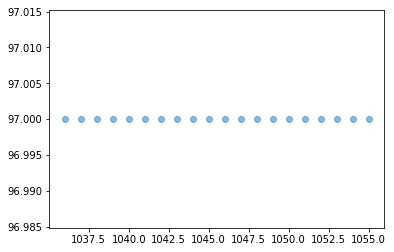

Number of Data Points in Bucket is :  20
Change in SOC WRT Time 0.00000


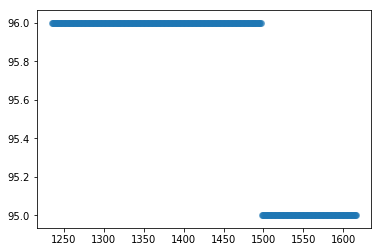

Number of Data Points in Bucket is :  382
Change in SOC WRT Time -0.00262


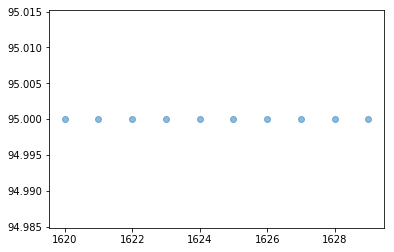

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


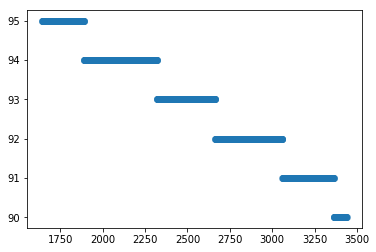

Number of Data Points in Bucket is :  1796
Change in SOC WRT Time -0.00279


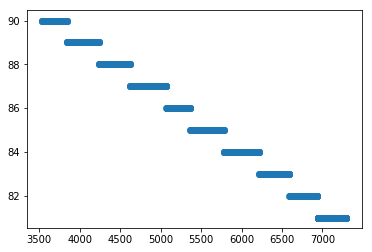

Number of Data Points in Bucket is :  3762
Change in SOC WRT Time -0.00239


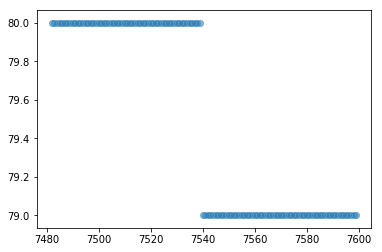

Number of Data Points in Bucket is :  118
Change in SOC WRT Time -0.00855


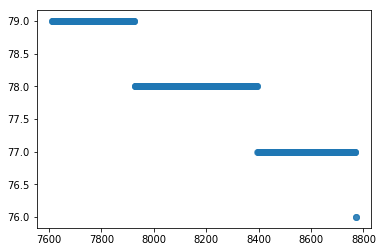

Number of Data Points in Bucket is :  1162
Change in SOC WRT Time -0.00258


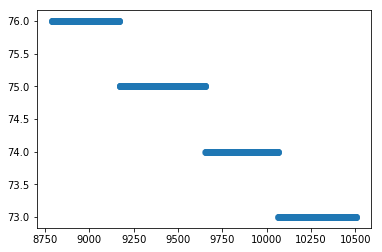

Number of Data Points in Bucket is :  1717
Change in SOC WRT Time -0.00175


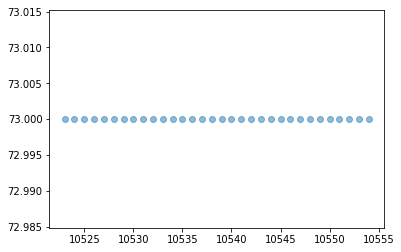

Number of Data Points in Bucket is :  32
Change in SOC WRT Time 0.00000


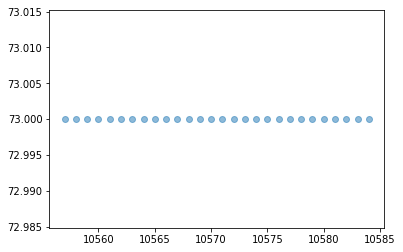

Number of Data Points in Bucket is :  28
Change in SOC WRT Time 0.00000


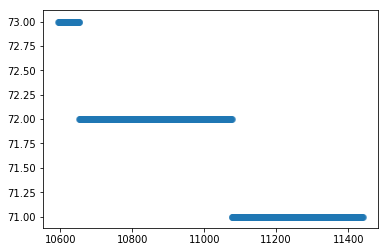

Number of Data Points in Bucket is :  847
Change in SOC WRT Time -0.00236


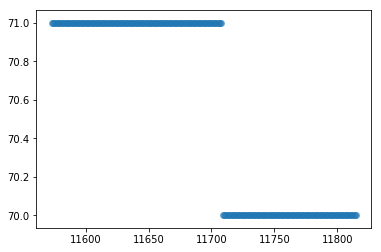

Number of Data Points in Bucket is :  243
Change in SOC WRT Time -0.00413


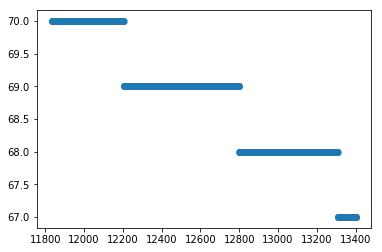

Number of Data Points in Bucket is :  1570
Change in SOC WRT Time -0.00191


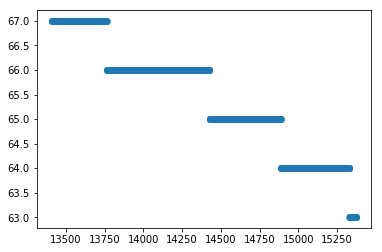

Number of Data Points in Bucket is :  1966
Change in SOC WRT Time -0.00204


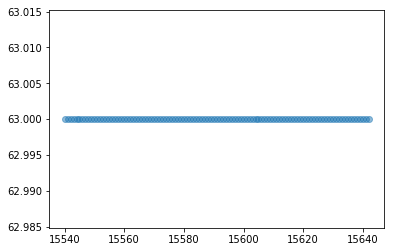

Number of Data Points in Bucket is :  103
Change in SOC WRT Time 0.00000


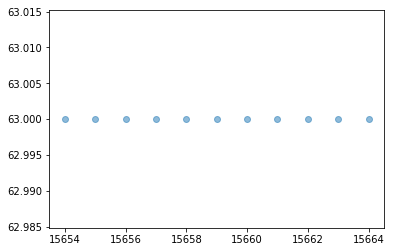

Number of Data Points in Bucket is :  11
Change in SOC WRT Time 0.00000


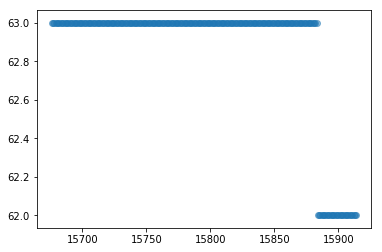

Number of Data Points in Bucket is :  239
Change in SOC WRT Time -0.00420


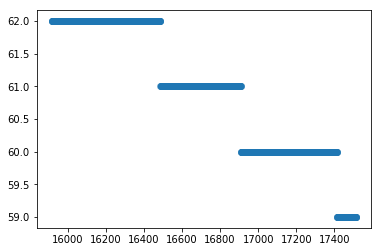

Number of Data Points in Bucket is :  1598
Change in SOC WRT Time -0.00188


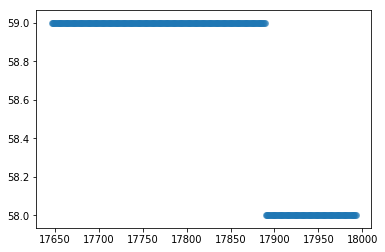

Number of Data Points in Bucket is :  348
Change in SOC WRT Time -0.00288


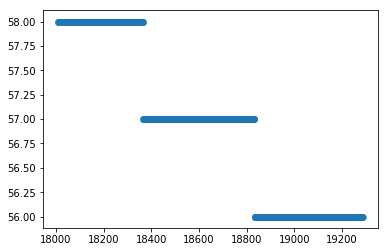

Number of Data Points in Bucket is :  1279
Change in SOC WRT Time -0.00156


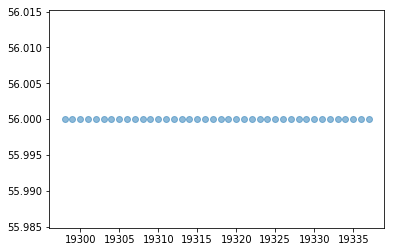

Number of Data Points in Bucket is :  40
Change in SOC WRT Time 0.00000


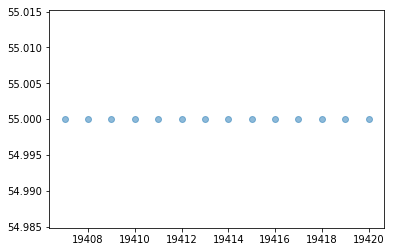

Number of Data Points in Bucket is :  14
Change in SOC WRT Time 0.00000


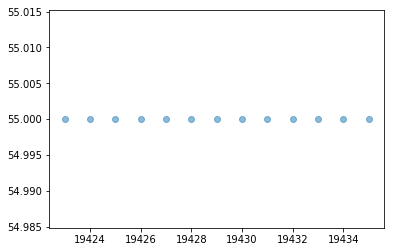

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


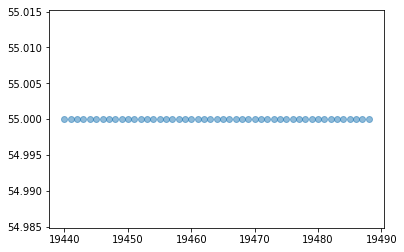

Number of Data Points in Bucket is :  49
Change in SOC WRT Time 0.00000


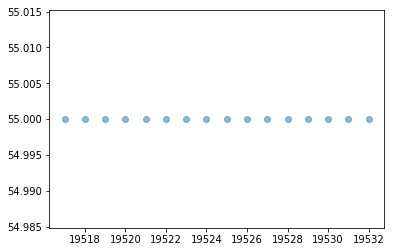

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


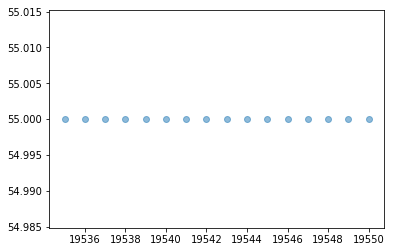

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


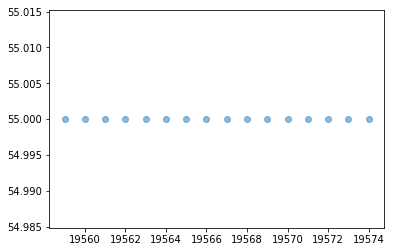

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


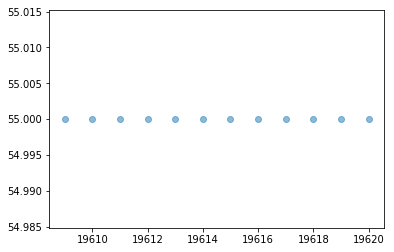

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


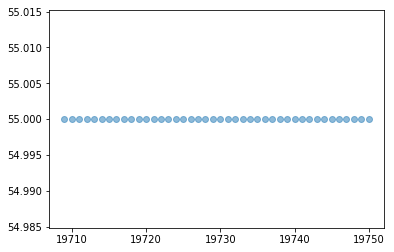

Number of Data Points in Bucket is :  42
Change in SOC WRT Time 0.00000


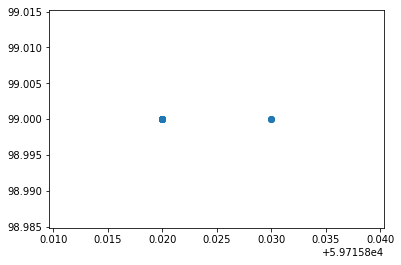

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


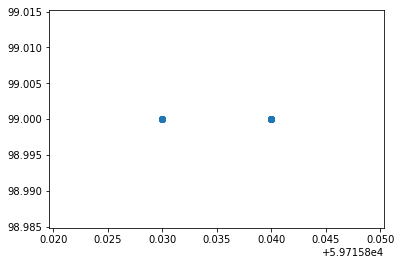

Number of Data Points in Bucket is :  29
Change in SOC WRT distance 0.00000


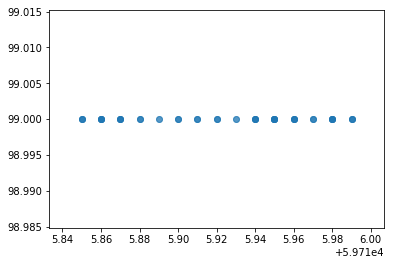

Number of Data Points in Bucket is :  61
Change in SOC WRT distance 0.00000


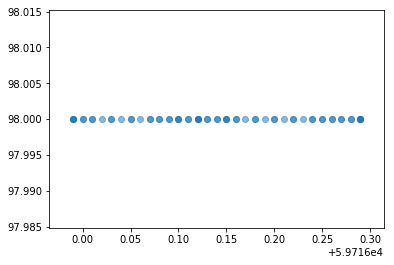

Number of Data Points in Bucket is :  64
Change in SOC WRT distance 0.00000


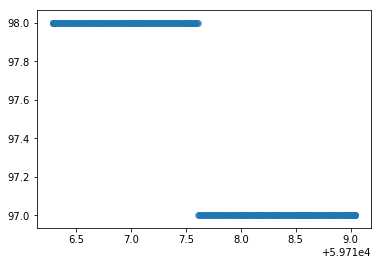

Number of Data Points in Bucket is :  442
Change in SOC WRT distance -0.36364
Change in distance WRT SOC -2.75000


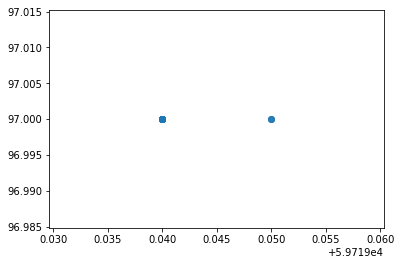

Number of Data Points in Bucket is :  20
Change in SOC WRT distance 0.00000


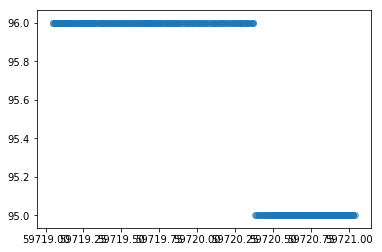

Number of Data Points in Bucket is :  382
Change in SOC WRT distance -0.50251
Change in distance WRT SOC -1.99000


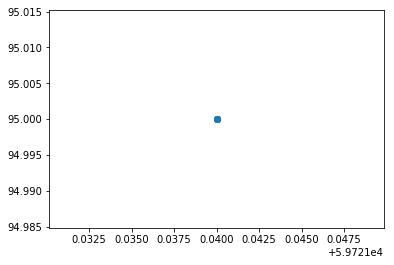

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


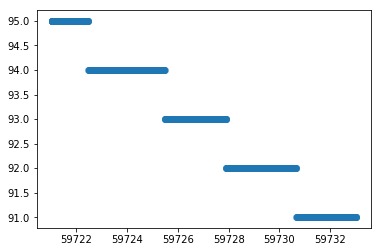

Number of Data Points in Bucket is :  1796
Change in SOC WRT distance -0.33389
Change in distance WRT SOC -2.99500


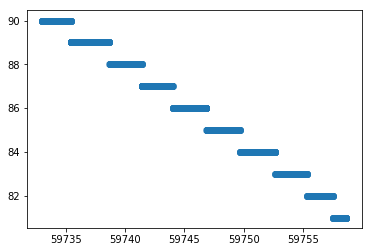

Number of Data Points in Bucket is :  3762
Change in SOC WRT distance -0.35129
Change in distance WRT SOC -2.84667


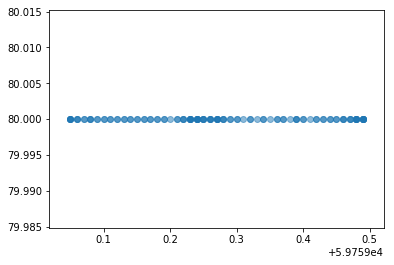

Number of Data Points in Bucket is :  118
Change in SOC WRT distance 0.00000


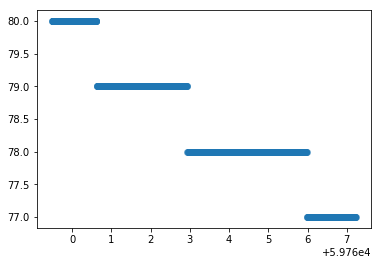

Number of Data Points in Bucket is :  1162
Change in SOC WRT distance -0.38760
Change in distance WRT SOC -2.58000


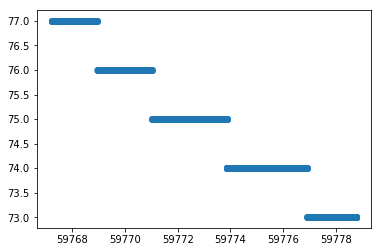

Number of Data Points in Bucket is :  1717
Change in SOC WRT distance -0.34662
Change in distance WRT SOC -2.88500


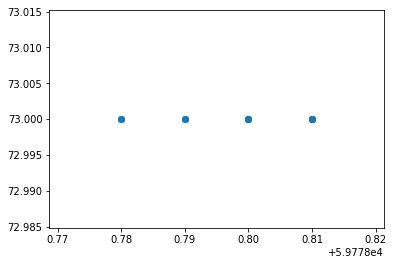

Number of Data Points in Bucket is :  32
Change in SOC WRT distance 0.00000


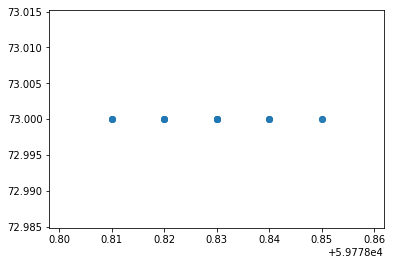

Number of Data Points in Bucket is :  28
Change in SOC WRT distance 0.00000


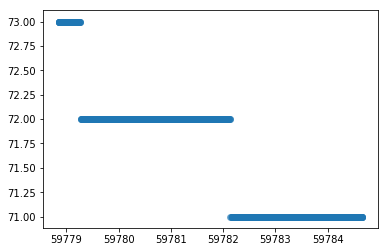

Number of Data Points in Bucket is :  847
Change in SOC WRT distance -0.34423
Change in distance WRT SOC -2.90500


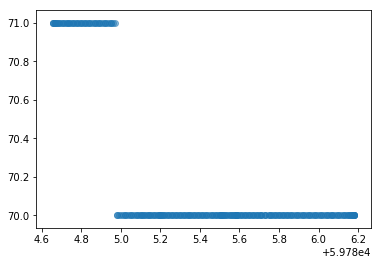

Number of Data Points in Bucket is :  243
Change in SOC WRT distance -0.65789
Change in distance WRT SOC -1.52000


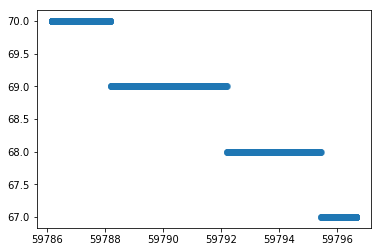

Number of Data Points in Bucket is :  1570
Change in SOC WRT distance -0.28681
Change in distance WRT SOC -3.48667


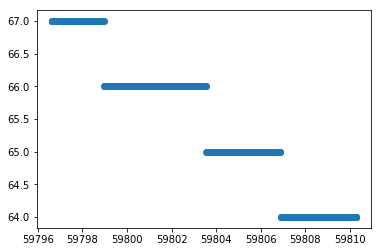

Number of Data Points in Bucket is :  1966
Change in SOC WRT distance -0.22010
Change in distance WRT SOC -4.54333


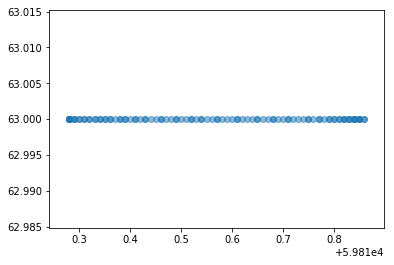

Number of Data Points in Bucket is :  103
Change in SOC WRT distance 0.00000


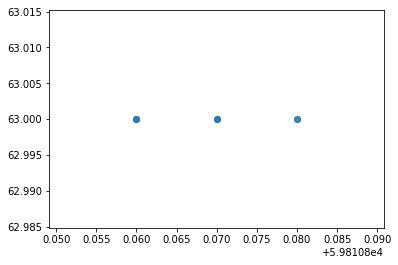

Number of Data Points in Bucket is :  11
Change in SOC WRT distance 0.00000


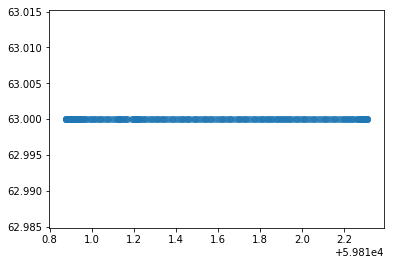

Number of Data Points in Bucket is :  239
Change in SOC WRT distance 0.00000


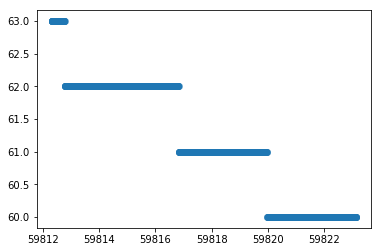

Number of Data Points in Bucket is :  1598
Change in SOC WRT distance -0.27675
Change in distance WRT SOC -3.61333


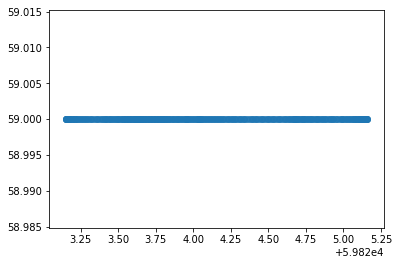

Number of Data Points in Bucket is :  348
Change in SOC WRT distance 0.00000


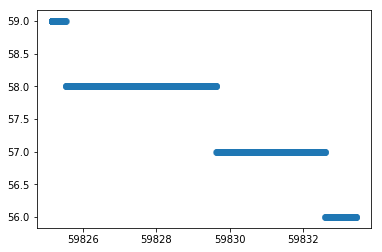

Number of Data Points in Bucket is :  1279
Change in SOC WRT distance -0.36276
Change in distance WRT SOC -2.75667


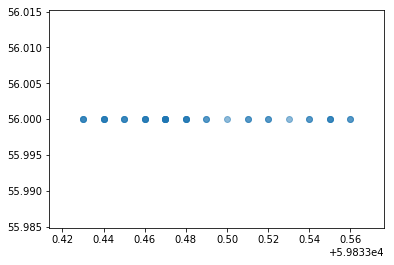

Number of Data Points in Bucket is :  40
Change in SOC WRT distance 0.00000


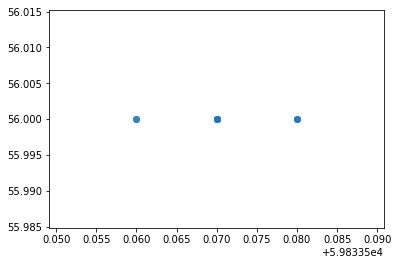

Number of Data Points in Bucket is :  14
Change in SOC WRT distance 0.00000


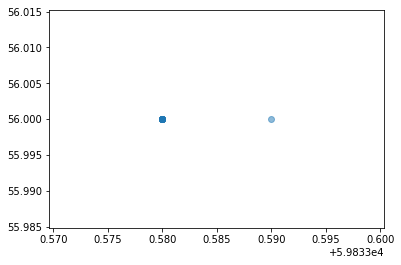

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


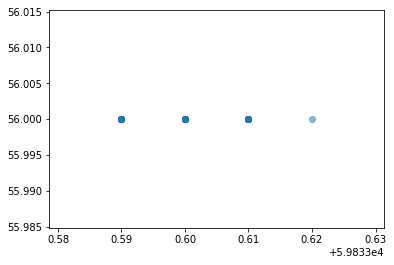

Number of Data Points in Bucket is :  49
Change in SOC WRT distance 0.00000


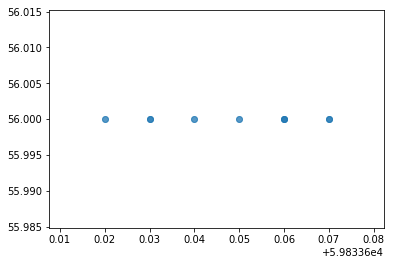

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


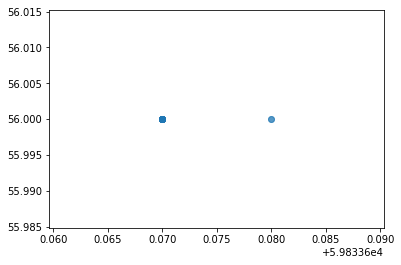

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


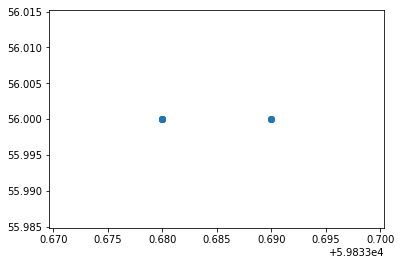

Number of Data Points in Bucket is :  16
Change in SOC WRT distance 0.00000


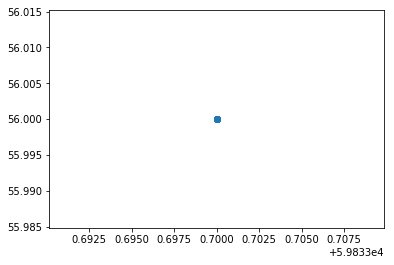

Number of Data Points in Bucket is :  12
Change in SOC WRT distance nan


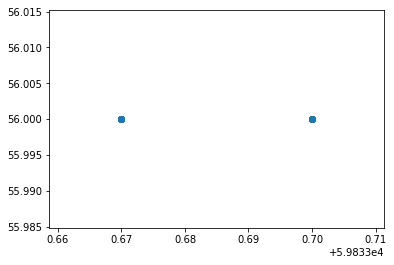

Number of Data Points in Bucket is :  42
Change in SOC WRT distance -0.00000


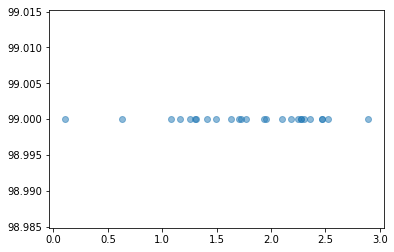

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


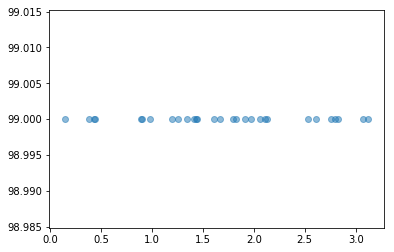

Number of Data Points in Bucket is :  29
Change in SOC WRT speed 0.00000


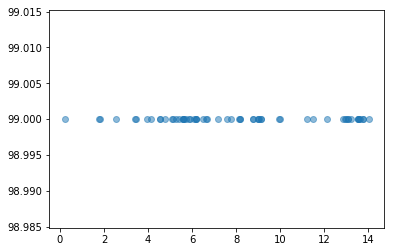

Number of Data Points in Bucket is :  61
Change in SOC WRT speed 0.00000


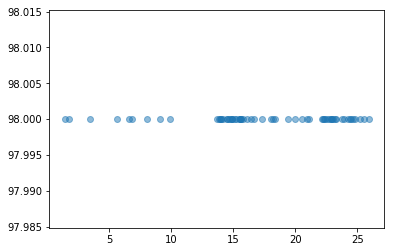

Number of Data Points in Bucket is :  64
Change in SOC WRT speed 0.00000


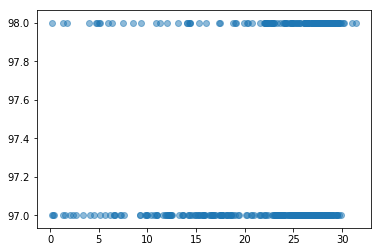

Number of Data Points in Bucket is :  442
Change in SOC WRT speed -0.76923


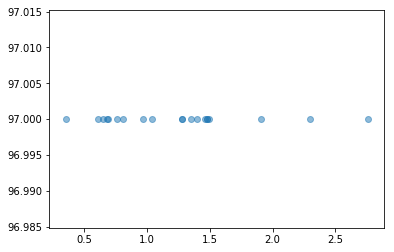

Number of Data Points in Bucket is :  20
Change in SOC WRT speed 0.00000


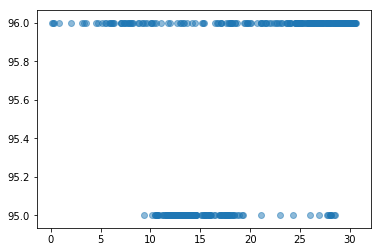

Number of Data Points in Bucket is :  382
Change in SOC WRT speed -0.11013


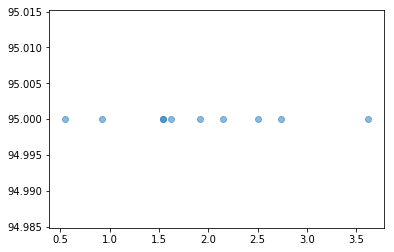

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


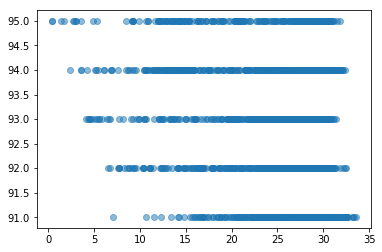

Number of Data Points in Bucket is :  1796
Change in SOC WRT speed -0.60423


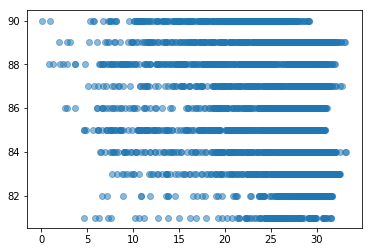

Number of Data Points in Bucket is :  3762
Change in SOC WRT speed -1.97802


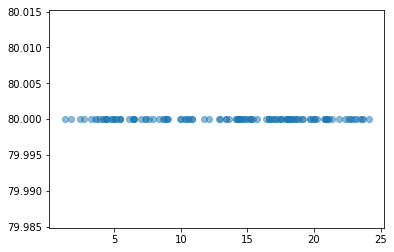

Number of Data Points in Bucket is :  118
Change in SOC WRT speed 0.00000


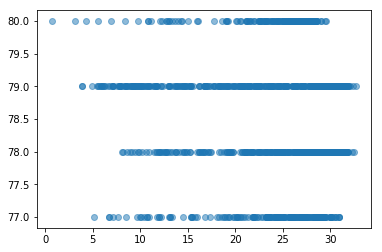

Number of Data Points in Bucket is :  1162
Change in SOC WRT speed -0.66815


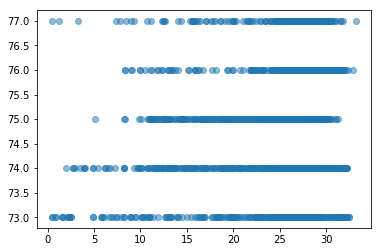

Number of Data Points in Bucket is :  1717
Change in SOC WRT speed -inf


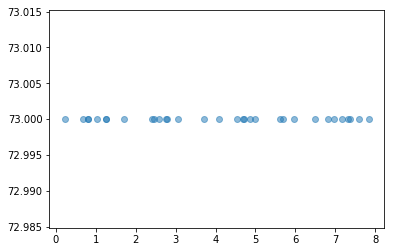

Number of Data Points in Bucket is :  32
Change in SOC WRT speed 0.00000


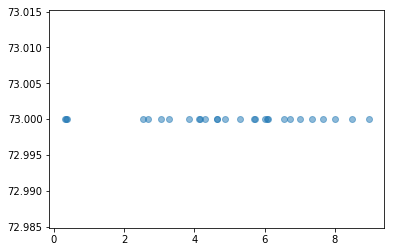

Number of Data Points in Bucket is :  28
Change in SOC WRT speed 0.00000


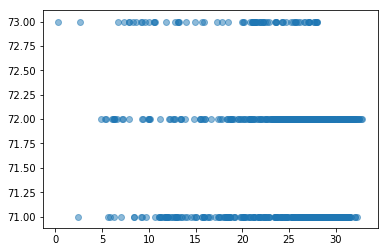

Number of Data Points in Bucket is :  847
Change in SOC WRT speed -0.93897


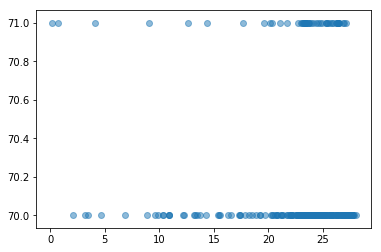

Number of Data Points in Bucket is :  243
Change in SOC WRT speed -0.50505


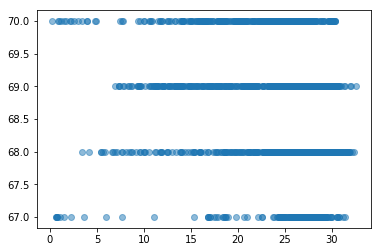

Number of Data Points in Bucket is :  1570
Change in SOC WRT speed -6.00000


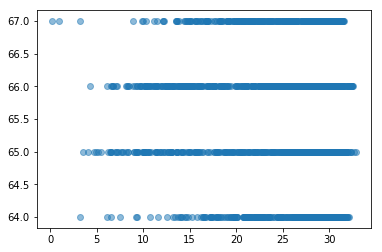

Number of Data Points in Bucket is :  1966
Change in SOC WRT speed -0.98039


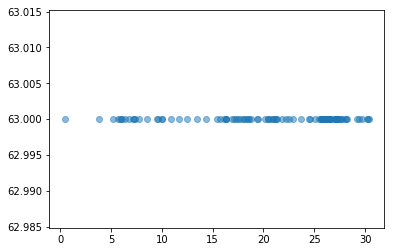

Number of Data Points in Bucket is :  103
Change in SOC WRT speed 0.00000


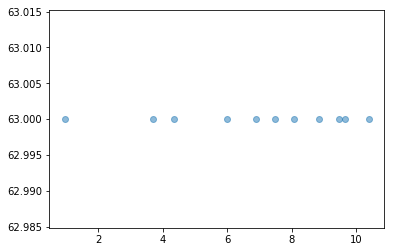

Number of Data Points in Bucket is :  11
Change in SOC WRT speed 0.00000


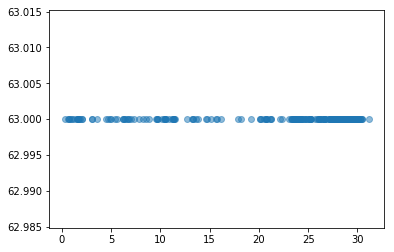

Number of Data Points in Bucket is :  239
Change in SOC WRT speed 0.00000


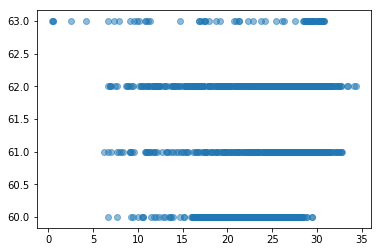

Number of Data Points in Bucket is :  1598
Change in SOC WRT speed -0.48544


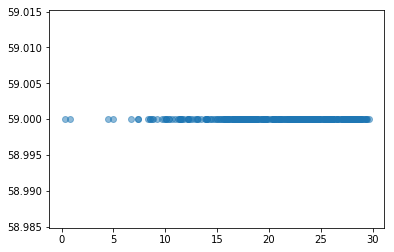

Number of Data Points in Bucket is :  348
Change in SOC WRT speed 0.00000


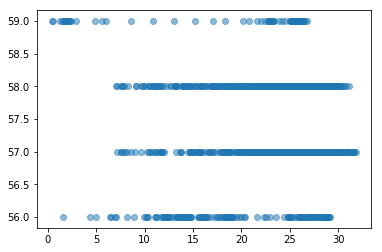

Number of Data Points in Bucket is :  1279
Change in SOC WRT speed -17.64706


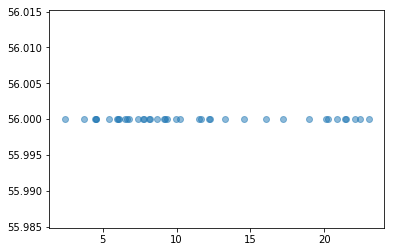

Number of Data Points in Bucket is :  40
Change in SOC WRT speed 0.00000


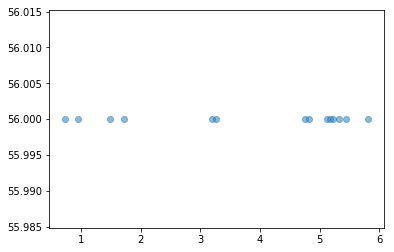

Number of Data Points in Bucket is :  14
Change in SOC WRT speed 0.00000


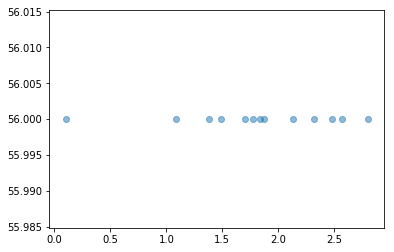

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


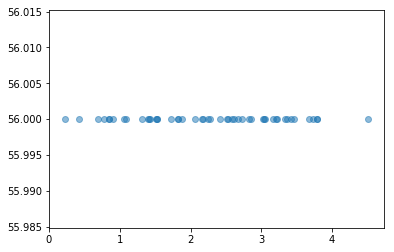

Number of Data Points in Bucket is :  49
Change in SOC WRT speed 0.00000


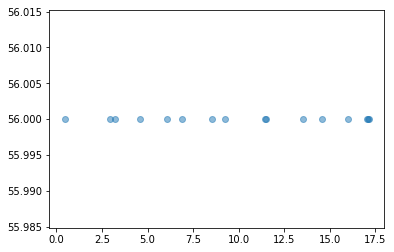

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


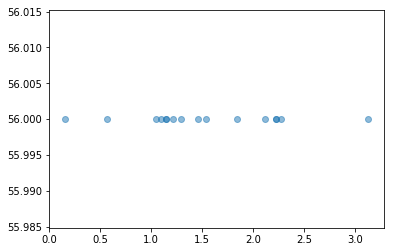

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


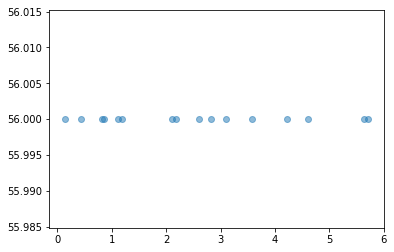

Number of Data Points in Bucket is :  16
Change in SOC WRT speed 0.00000


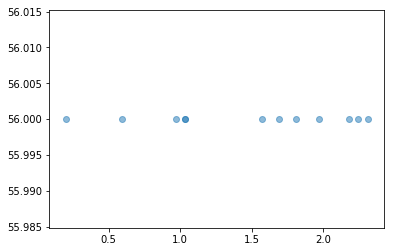

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


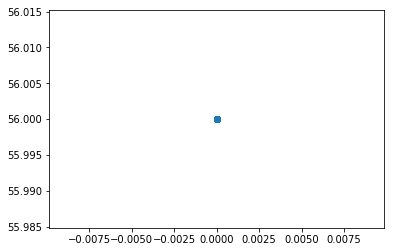

Number of Data Points in Bucket is :  42
Change in SOC WRT speed nan


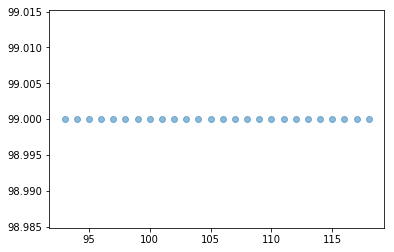

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


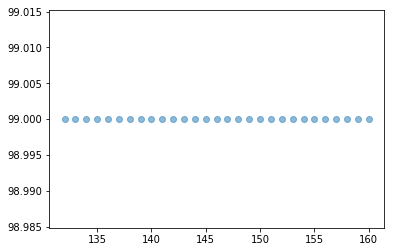

Number of Data Points in Bucket is :  29
Change in SOC WRT Time 0.00000


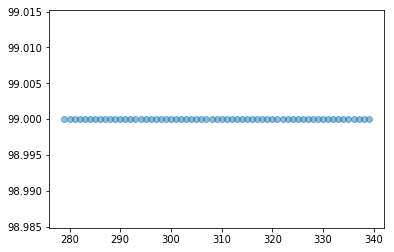

Number of Data Points in Bucket is :  61
Change in SOC WRT Time 0.00000


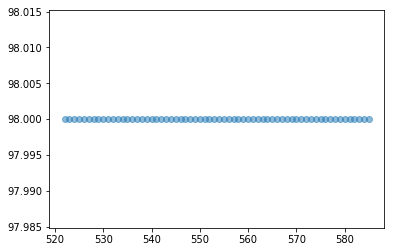

Number of Data Points in Bucket is :  64
Change in SOC WRT Time 0.00000


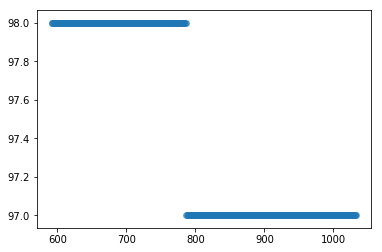

Number of Data Points in Bucket is :  442
Change in SOC WRT Time -0.00227


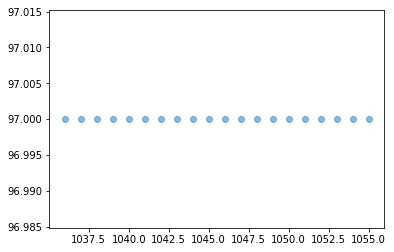

Number of Data Points in Bucket is :  20
Change in SOC WRT Time 0.00000


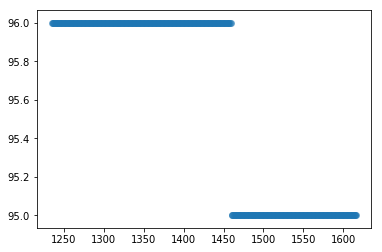

Number of Data Points in Bucket is :  382
Change in SOC WRT Time -0.00262


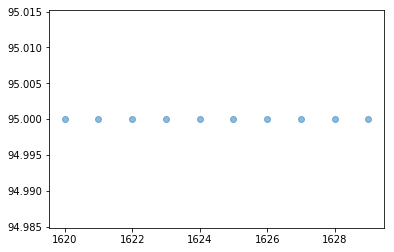

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


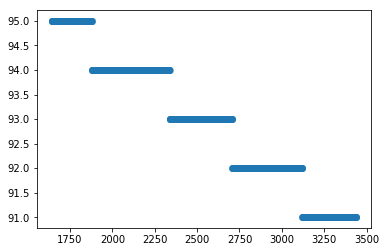

Number of Data Points in Bucket is :  1796
Change in SOC WRT Time -0.00223


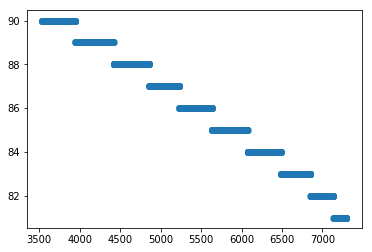

Number of Data Points in Bucket is :  3762
Change in SOC WRT Time -0.00239


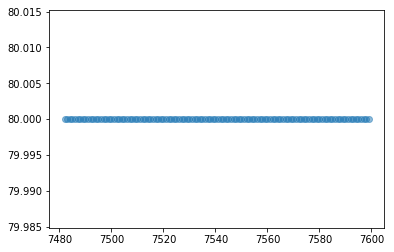

Number of Data Points in Bucket is :  118
Change in SOC WRT Time 0.00000


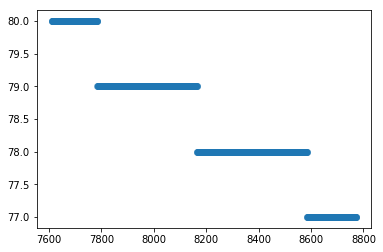

Number of Data Points in Bucket is :  1162
Change in SOC WRT Time -0.00258


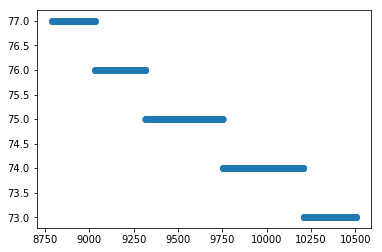

Number of Data Points in Bucket is :  1717
Change in SOC WRT Time -0.00233


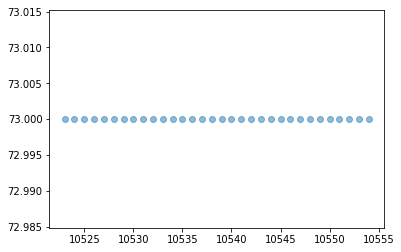

Number of Data Points in Bucket is :  32
Change in SOC WRT Time 0.00000


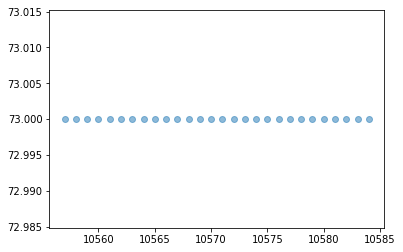

Number of Data Points in Bucket is :  28
Change in SOC WRT Time 0.00000


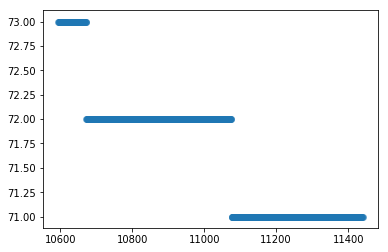

Number of Data Points in Bucket is :  847
Change in SOC WRT Time -0.00236


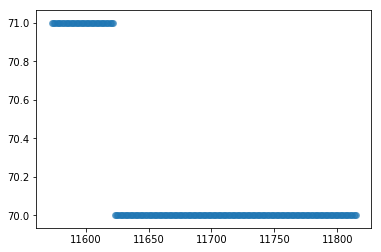

Number of Data Points in Bucket is :  243
Change in SOC WRT Time -0.00413


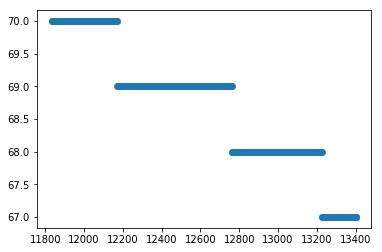

Number of Data Points in Bucket is :  1570
Change in SOC WRT Time -0.00191


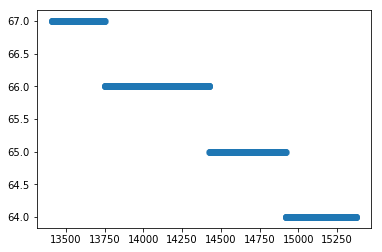

Number of Data Points in Bucket is :  1966
Change in SOC WRT Time -0.00153


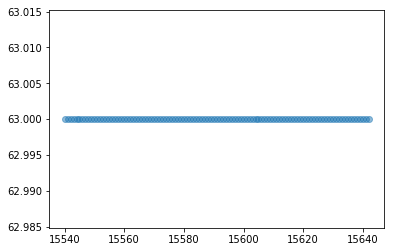

Number of Data Points in Bucket is :  103
Change in SOC WRT Time 0.00000


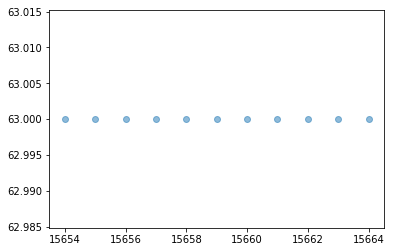

Number of Data Points in Bucket is :  11
Change in SOC WRT Time 0.00000


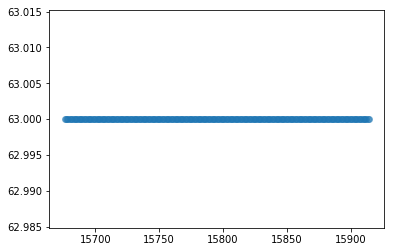

Number of Data Points in Bucket is :  239
Change in SOC WRT Time 0.00000


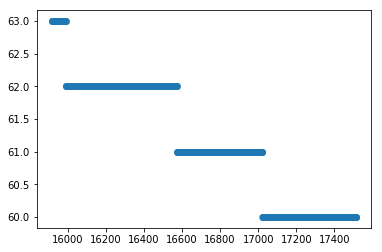

Number of Data Points in Bucket is :  1598
Change in SOC WRT Time -0.00188


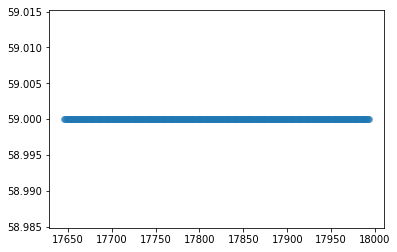

Number of Data Points in Bucket is :  348
Change in SOC WRT Time 0.00000


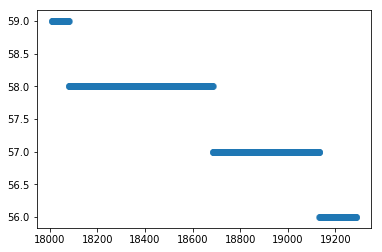

Number of Data Points in Bucket is :  1279
Change in SOC WRT Time -0.00235


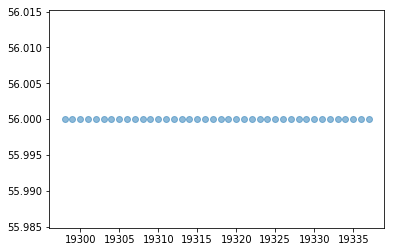

Number of Data Points in Bucket is :  40
Change in SOC WRT Time 0.00000


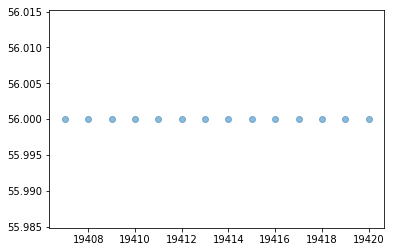

Number of Data Points in Bucket is :  14
Change in SOC WRT Time 0.00000


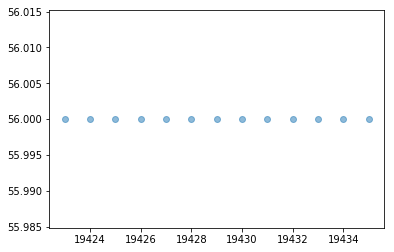

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


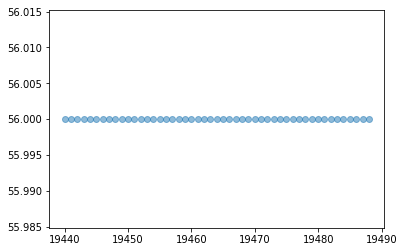

Number of Data Points in Bucket is :  49
Change in SOC WRT Time 0.00000


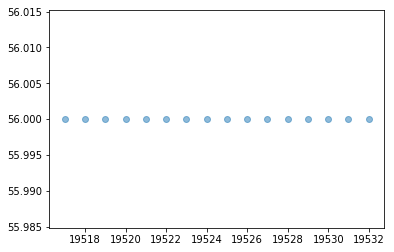

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


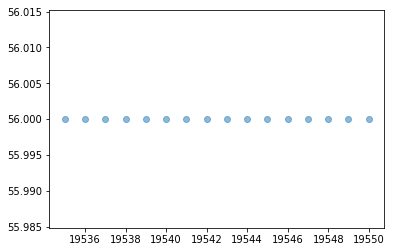

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


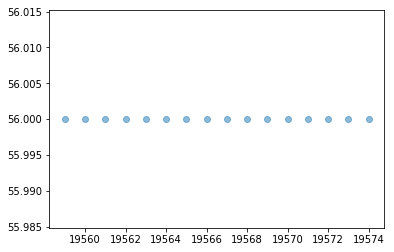

Number of Data Points in Bucket is :  16
Change in SOC WRT Time 0.00000


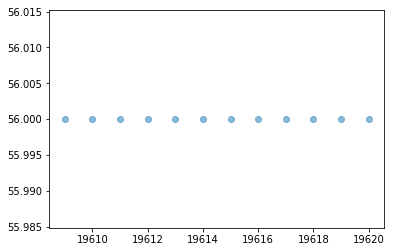

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


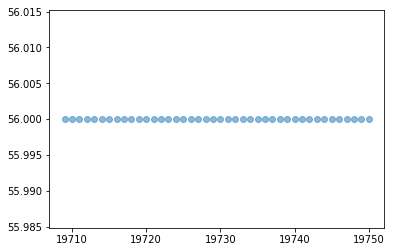

Number of Data Points in Bucket is :  42
Change in SOC WRT Time 0.00000


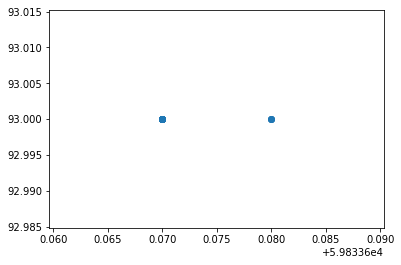

Number of Data Points in Bucket is :  23
Change in SOC WRT distance 0.00000


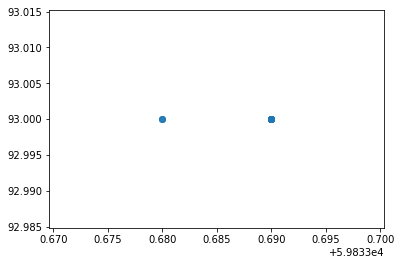

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


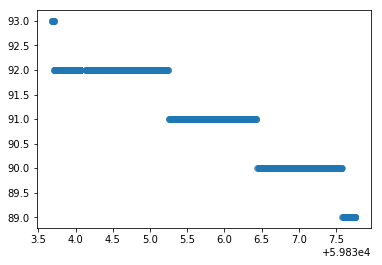

Number of Data Points in Bucket is :  710
Change in SOC WRT distance -0.98280
Change in distance WRT SOC -1.01750


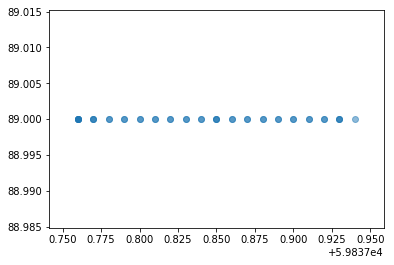

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


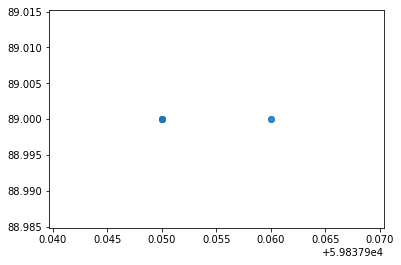

Number of Data Points in Bucket is :  10
Change in SOC WRT distance 0.00000


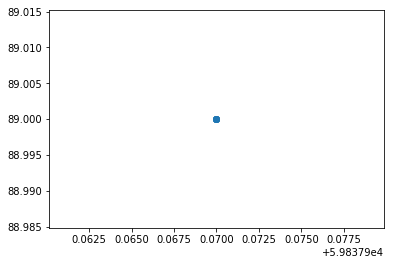

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


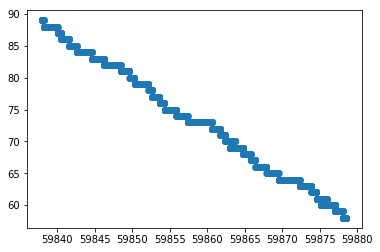

Number of Data Points in Bucket is :  5660
Change in SOC WRT distance -0.76430
Change in distance WRT SOC -1.30839


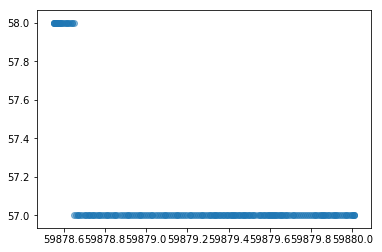

Number of Data Points in Bucket is :  212
Change in SOC WRT distance -0.68493
Change in distance WRT SOC -1.46000


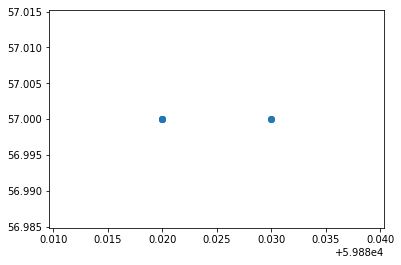

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


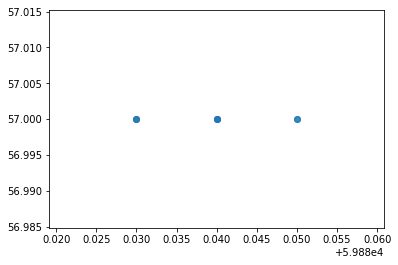

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


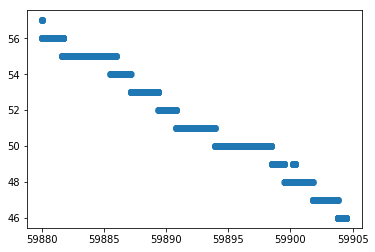

Number of Data Points in Bucket is :  3497
Change in SOC WRT distance -0.44990
Change in distance WRT SOC -2.22273


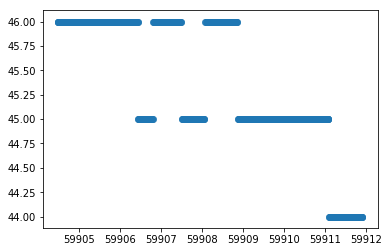

Number of Data Points in Bucket is :  1105
Change in SOC WRT distance -0.27027
Change in distance WRT SOC -3.70000


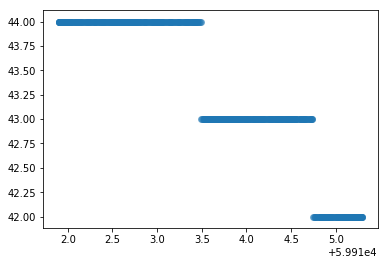

Number of Data Points in Bucket is :  494
Change in SOC WRT distance -0.58997
Change in distance WRT SOC -1.69500


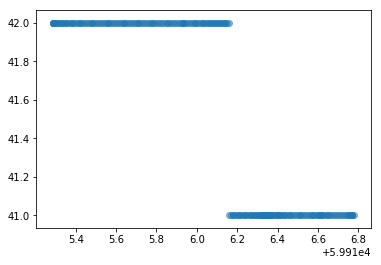

Number of Data Points in Bucket is :  212
Change in SOC WRT distance -0.67114
Change in distance WRT SOC -1.49000


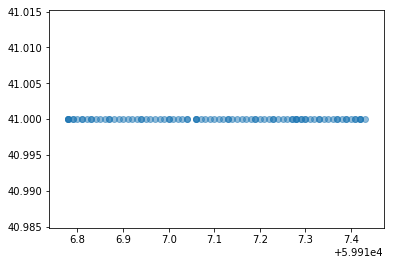

Number of Data Points in Bucket is :  91
Change in SOC WRT distance 0.00000


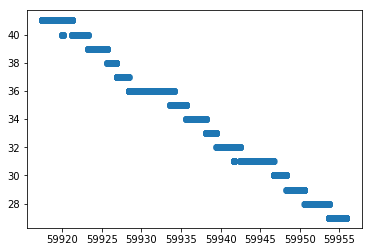

Number of Data Points in Bucket is :  5272
Change in SOC WRT distance -0.36383
Change in distance WRT SOC -2.74857


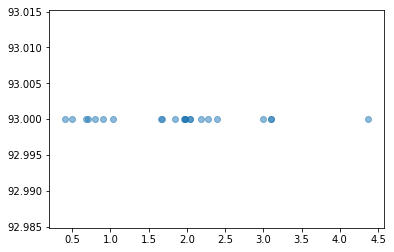

Number of Data Points in Bucket is :  23
Change in SOC WRT speed -0.00000


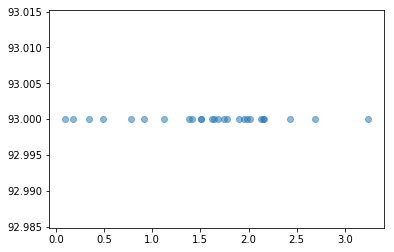

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


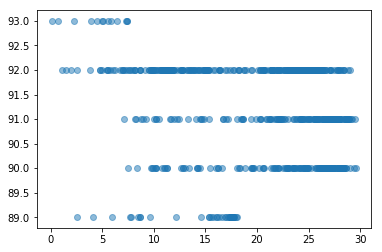

Number of Data Points in Bucket is :  710
Change in SOC WRT speed -1.61290


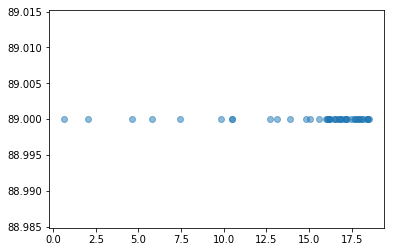

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


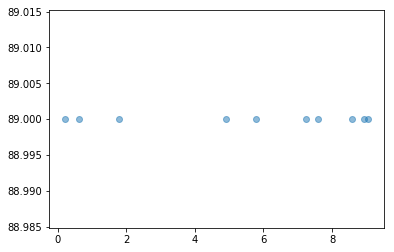

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


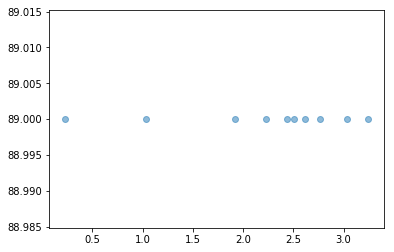

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


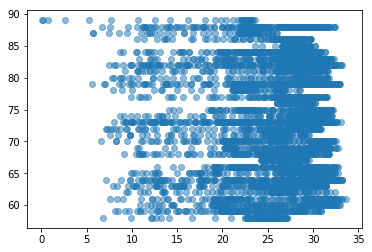

Number of Data Points in Bucket is :  5660
Change in SOC WRT speed -4.74006


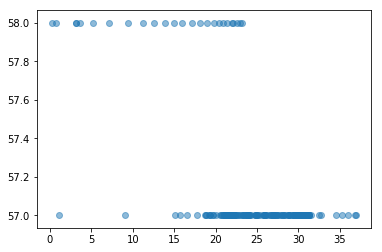

Number of Data Points in Bucket is :  212
Change in SOC WRT speed -1.08696


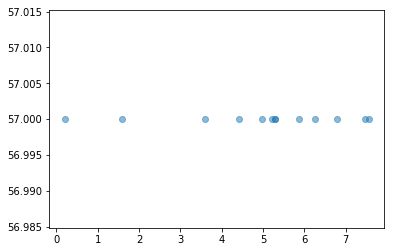

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


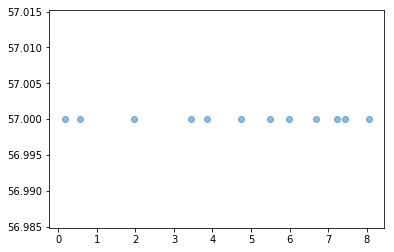

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


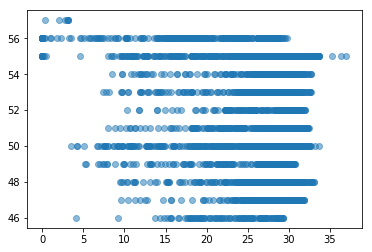

Number of Data Points in Bucket is :  3497
Change in SOC WRT speed -2.89474


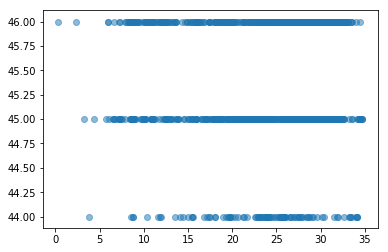

Number of Data Points in Bucket is :  1105
Change in SOC WRT speed -0.56980


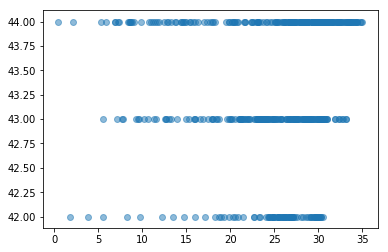

Number of Data Points in Bucket is :  494
Change in SOC WRT speed -1.53846


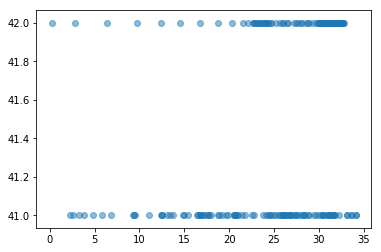

Number of Data Points in Bucket is :  212
Change in SOC WRT speed -0.17986


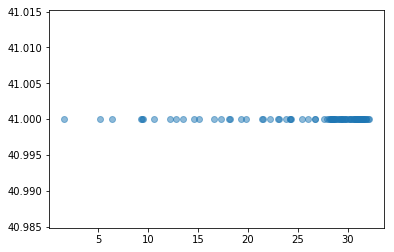

Number of Data Points in Bucket is :  91
Change in SOC WRT speed 0.00000


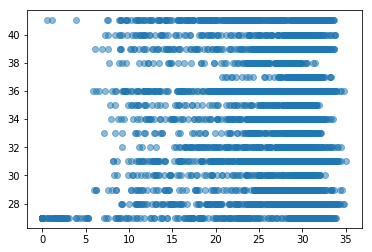

Number of Data Points in Bucket is :  5272
Change in SOC WRT speed 26.41509


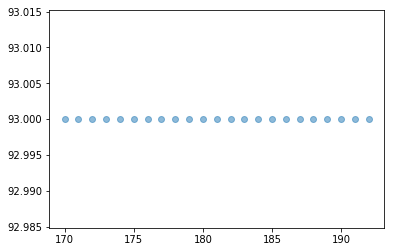

Number of Data Points in Bucket is :  23
Change in SOC WRT Time 0.00000


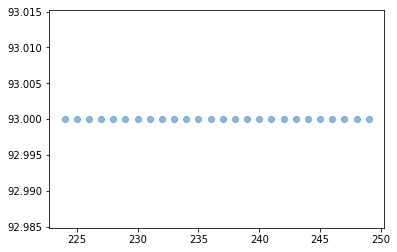

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


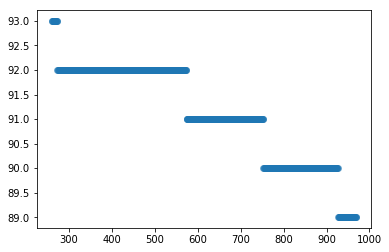

Number of Data Points in Bucket is :  710
Change in SOC WRT Time -0.00564


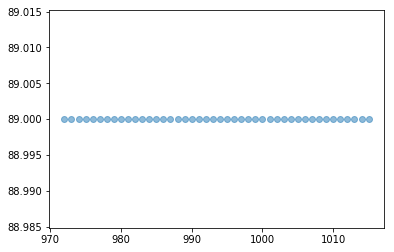

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


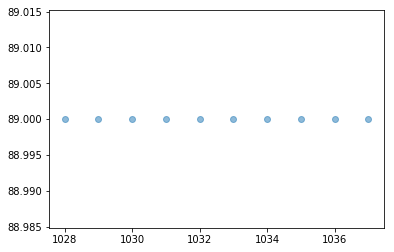

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


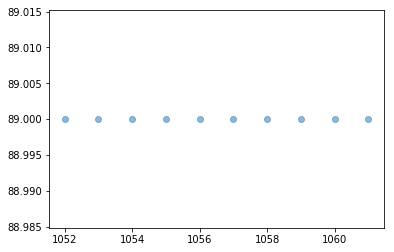

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


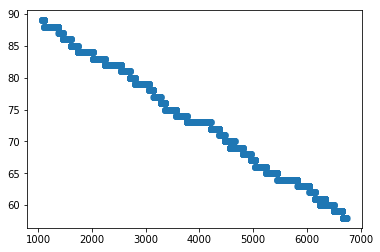

Number of Data Points in Bucket is :  5660
Change in SOC WRT Time -0.00548


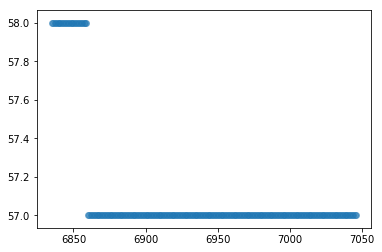

Number of Data Points in Bucket is :  212
Change in SOC WRT Time -0.00474


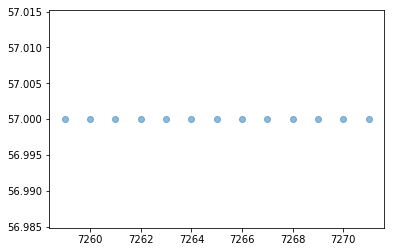

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


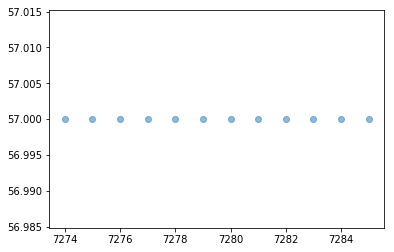

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


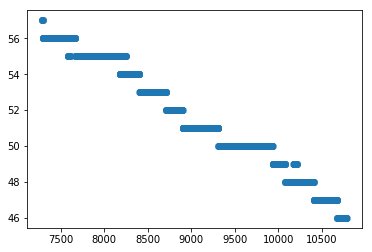

Number of Data Points in Bucket is :  3497
Change in SOC WRT Time -0.00315


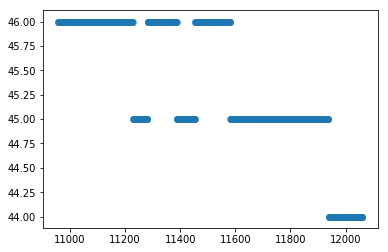

Number of Data Points in Bucket is :  1105
Change in SOC WRT Time -0.00181


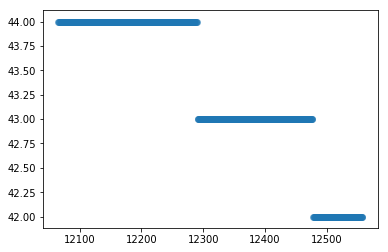

Number of Data Points in Bucket is :  494
Change in SOC WRT Time -0.00406


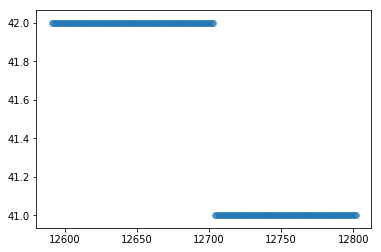

Number of Data Points in Bucket is :  212
Change in SOC WRT Time -0.00474


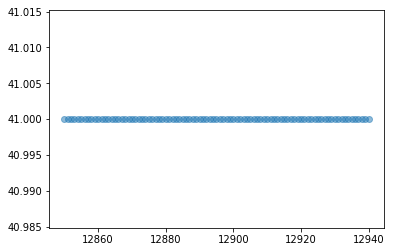

Number of Data Points in Bucket is :  91
Change in SOC WRT Time 0.00000


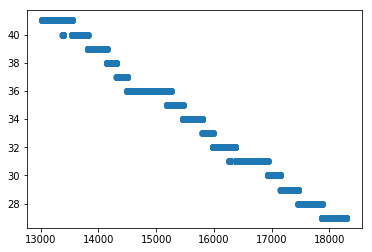

Number of Data Points in Bucket is :  5272
Change in SOC WRT Time -0.00266


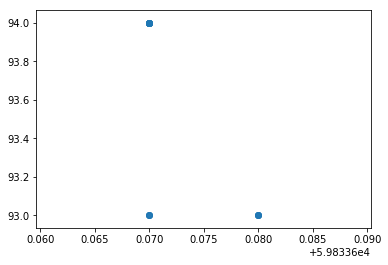

Number of Data Points in Bucket is :  23
Change in SOC WRT distance -100.00000
Change in distance WRT SOC -0.01000


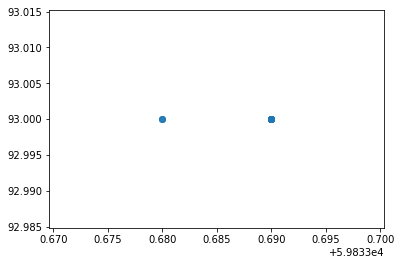

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


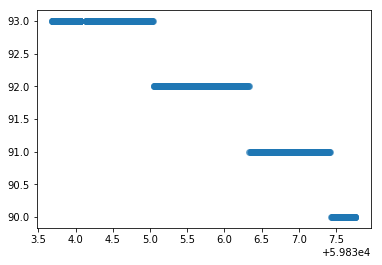

Number of Data Points in Bucket is :  710
Change in SOC WRT distance -0.73710
Change in distance WRT SOC -1.35667


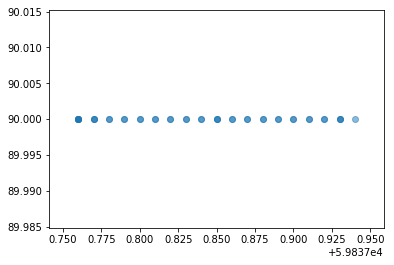

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


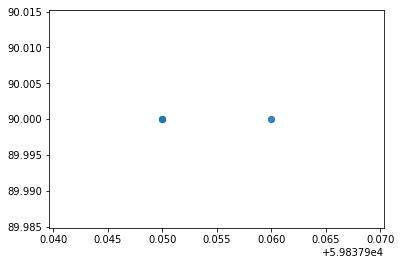

Number of Data Points in Bucket is :  10
Change in SOC WRT distance 0.00000


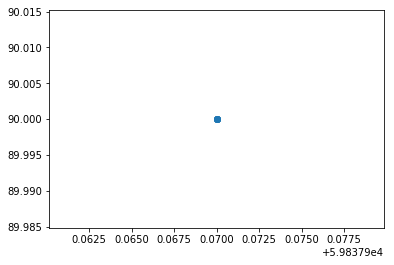

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


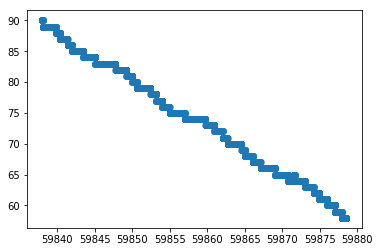

Number of Data Points in Bucket is :  5660
Change in SOC WRT distance -0.78895
Change in distance WRT SOC -1.26750


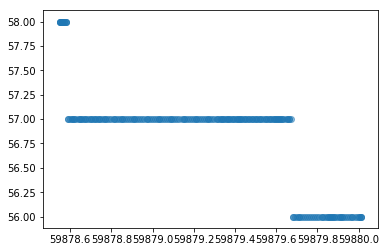

Number of Data Points in Bucket is :  212
Change in SOC WRT distance -1.36986
Change in distance WRT SOC -0.73000


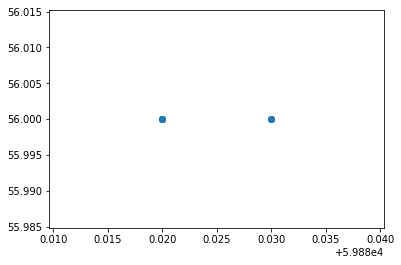

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


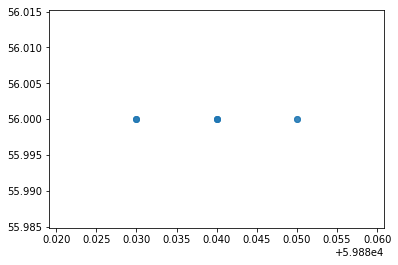

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


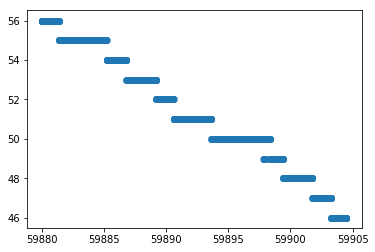

Number of Data Points in Bucket is :  3497
Change in SOC WRT distance -0.40900
Change in distance WRT SOC -2.44500


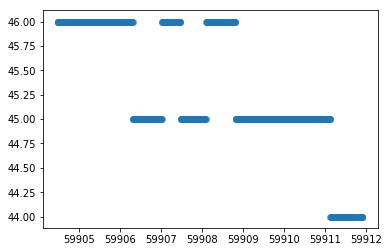

Number of Data Points in Bucket is :  1105
Change in SOC WRT distance -0.27027
Change in distance WRT SOC -3.70000


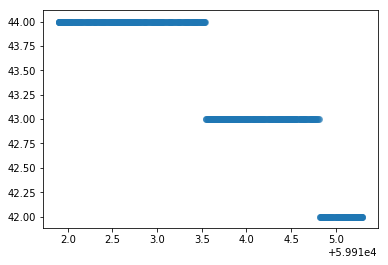

Number of Data Points in Bucket is :  494
Change in SOC WRT distance -0.58997
Change in distance WRT SOC -1.69500


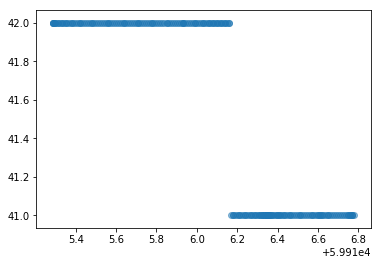

Number of Data Points in Bucket is :  212
Change in SOC WRT distance -0.67114
Change in distance WRT SOC -1.49000


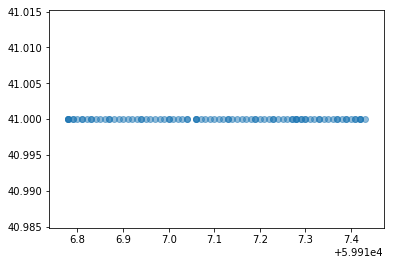

Number of Data Points in Bucket is :  91
Change in SOC WRT distance 0.00000


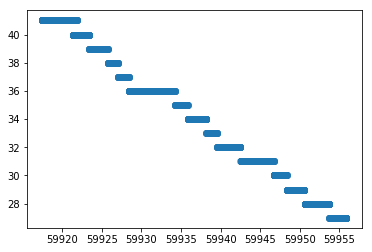

Number of Data Points in Bucket is :  5272
Change in SOC WRT distance -0.36383
Change in distance WRT SOC -2.74857


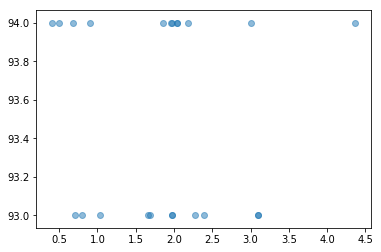

Number of Data Points in Bucket is :  23
Change in SOC WRT speed 10.00000


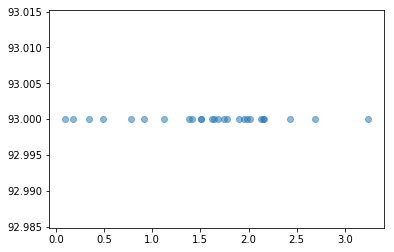

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


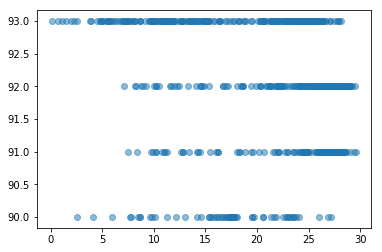

Number of Data Points in Bucket is :  710
Change in SOC WRT speed -1.20968


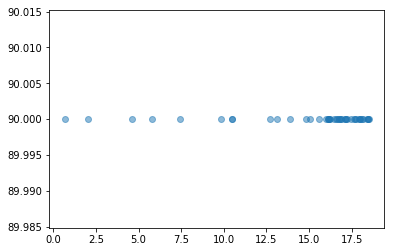

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


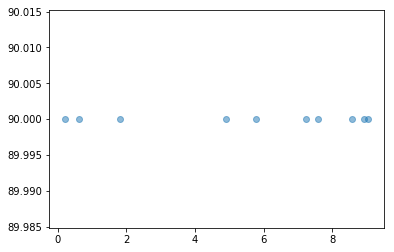

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


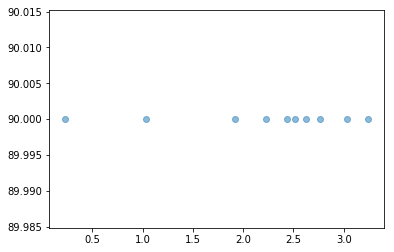

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


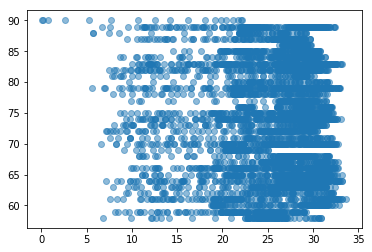

Number of Data Points in Bucket is :  5660
Change in SOC WRT speed -4.89297


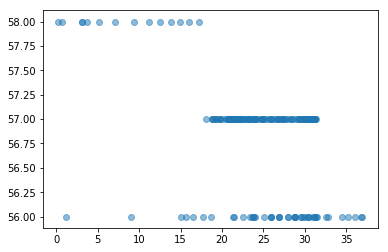

Number of Data Points in Bucket is :  212
Change in SOC WRT speed -2.17391


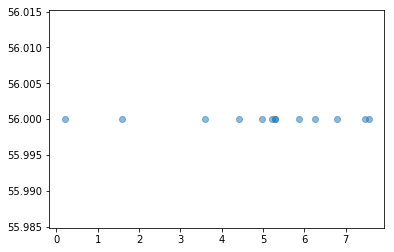

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


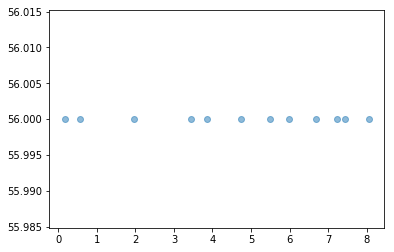

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


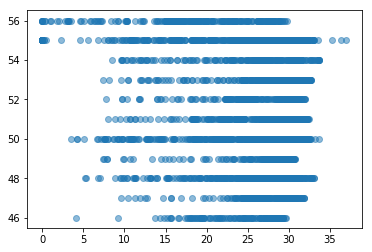

Number of Data Points in Bucket is :  3497
Change in SOC WRT speed -2.63158


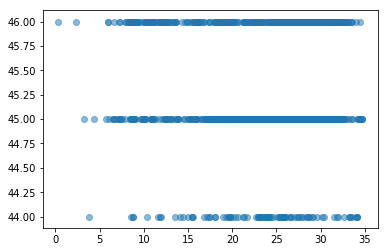

Number of Data Points in Bucket is :  1105
Change in SOC WRT speed -0.56980


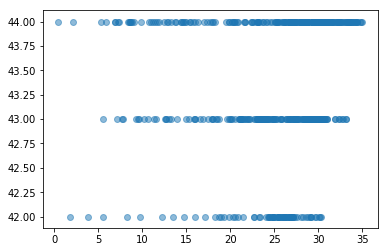

Number of Data Points in Bucket is :  494
Change in SOC WRT speed -1.53846


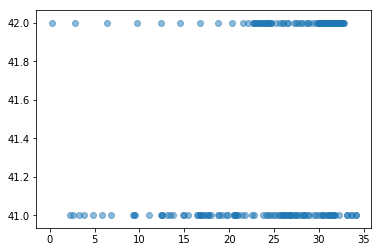

Number of Data Points in Bucket is :  212
Change in SOC WRT speed -0.17986


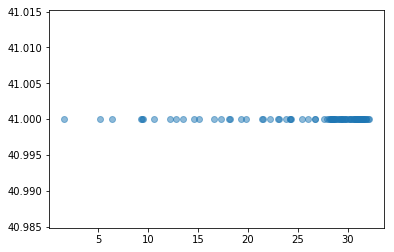

Number of Data Points in Bucket is :  91
Change in SOC WRT speed 0.00000


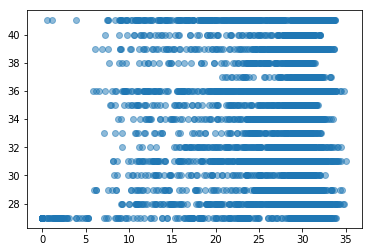

Number of Data Points in Bucket is :  5272
Change in SOC WRT speed 26.41509


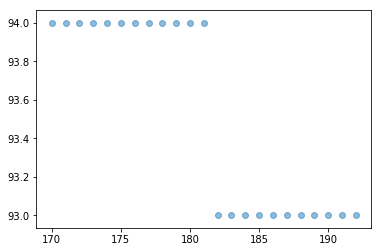

Number of Data Points in Bucket is :  23
Change in SOC WRT Time -0.04545


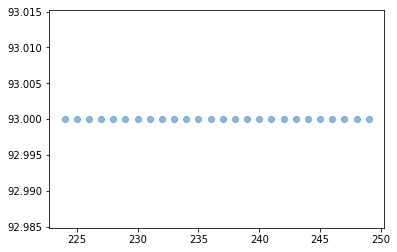

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


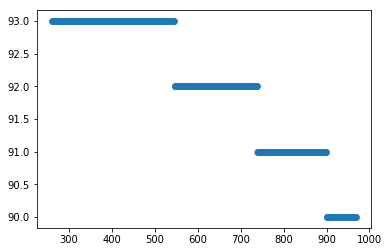

Number of Data Points in Bucket is :  710
Change in SOC WRT Time -0.00423


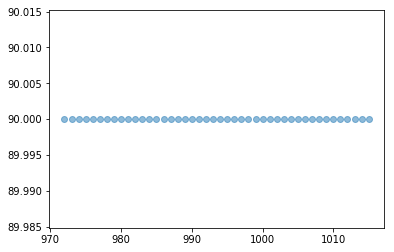

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


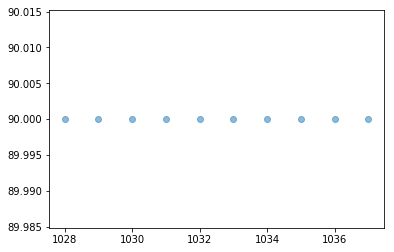

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


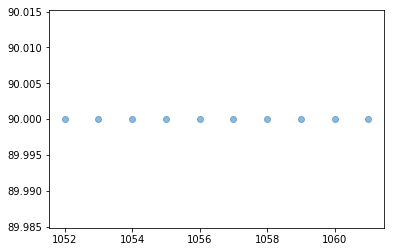

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


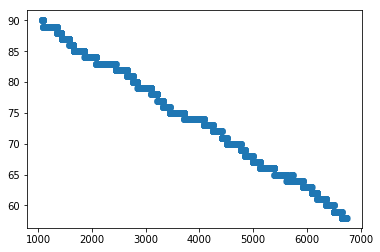

Number of Data Points in Bucket is :  5660
Change in SOC WRT Time -0.00565


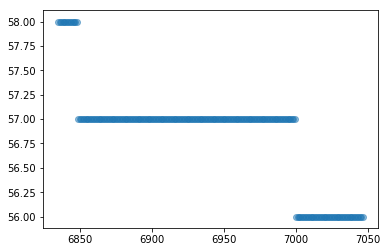

Number of Data Points in Bucket is :  212
Change in SOC WRT Time -0.00948


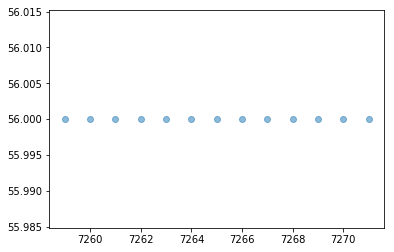

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


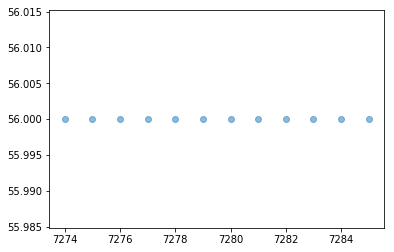

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


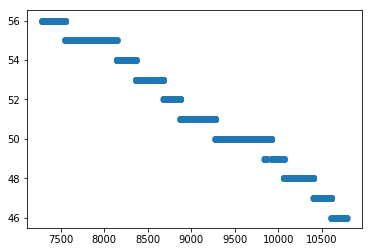

Number of Data Points in Bucket is :  3497
Change in SOC WRT Time -0.00286


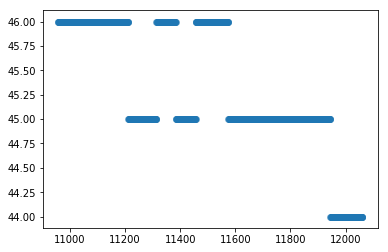

Number of Data Points in Bucket is :  1105
Change in SOC WRT Time -0.00181


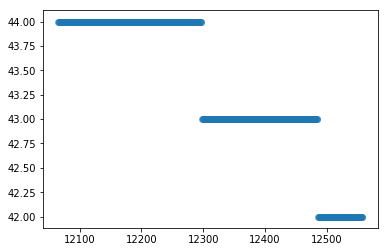

Number of Data Points in Bucket is :  494
Change in SOC WRT Time -0.00406


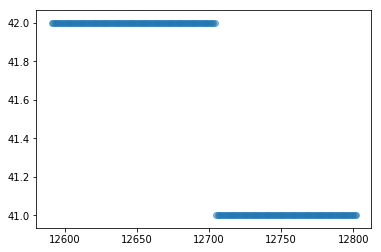

Number of Data Points in Bucket is :  212
Change in SOC WRT Time -0.00474


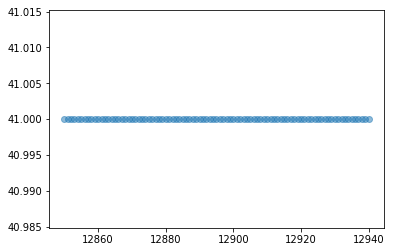

Number of Data Points in Bucket is :  91
Change in SOC WRT Time 0.00000


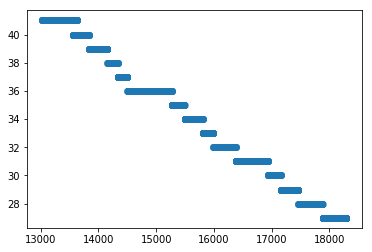

Number of Data Points in Bucket is :  5272
Change in SOC WRT Time -0.00266


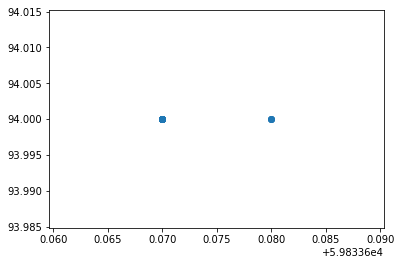

Number of Data Points in Bucket is :  23
Change in SOC WRT distance 0.00000


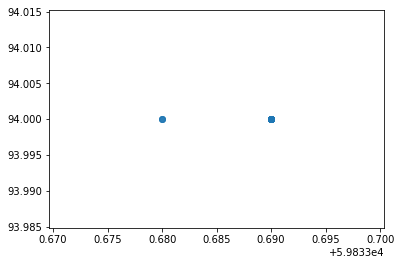

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


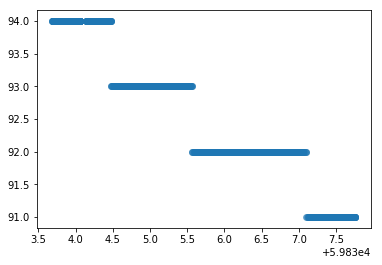

Number of Data Points in Bucket is :  710
Change in SOC WRT distance -0.73710
Change in distance WRT SOC -1.35667


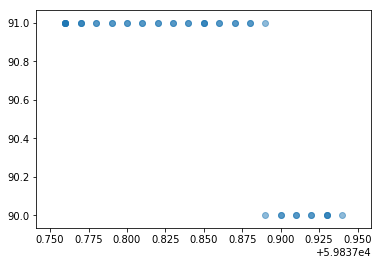

Number of Data Points in Bucket is :  44
Change in SOC WRT distance -5.55556
Change in distance WRT SOC -0.18000


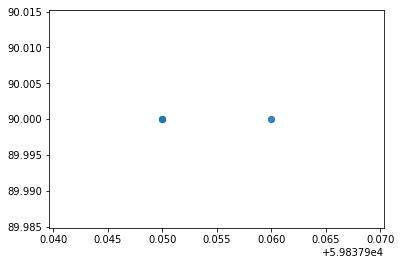

Number of Data Points in Bucket is :  10
Change in SOC WRT distance 0.00000


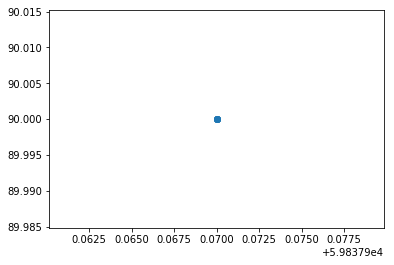

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


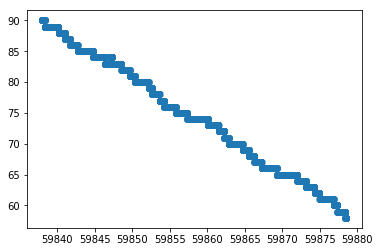

Number of Data Points in Bucket is :  5660
Change in SOC WRT distance -0.78895
Change in distance WRT SOC -1.26750


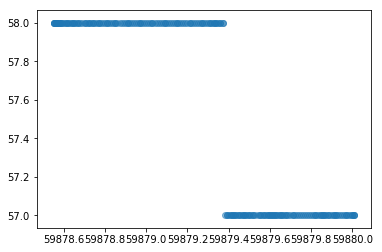

Number of Data Points in Bucket is :  212
Change in SOC WRT distance -0.68493
Change in distance WRT SOC -1.46000


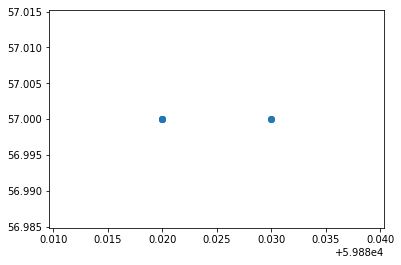

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


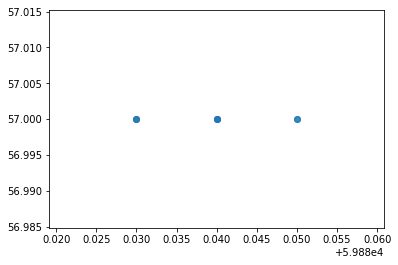

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


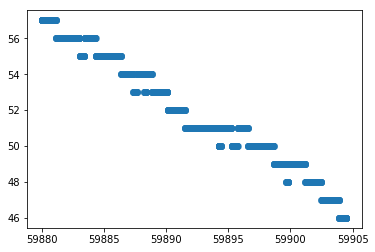

Number of Data Points in Bucket is :  3497
Change in SOC WRT distance -0.44990
Change in distance WRT SOC -2.22273


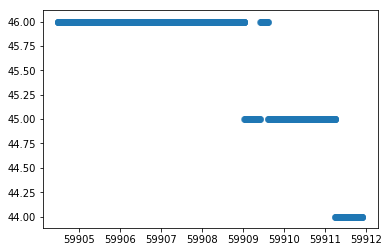

Number of Data Points in Bucket is :  1105
Change in SOC WRT distance -0.27027
Change in distance WRT SOC -3.70000


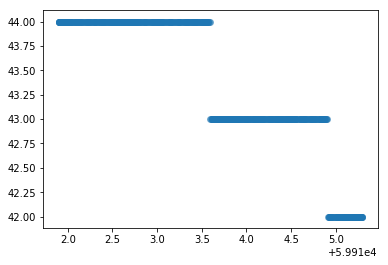

Number of Data Points in Bucket is :  494
Change in SOC WRT distance -0.58997
Change in distance WRT SOC -1.69500


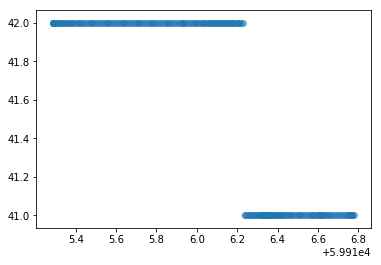

Number of Data Points in Bucket is :  212
Change in SOC WRT distance -0.67114
Change in distance WRT SOC -1.49000


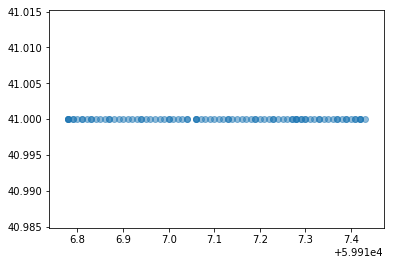

Number of Data Points in Bucket is :  91
Change in SOC WRT distance 0.00000


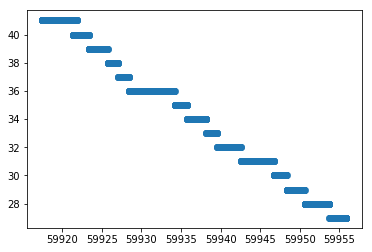

Number of Data Points in Bucket is :  5272
Change in SOC WRT distance -0.36383
Change in distance WRT SOC -2.74857


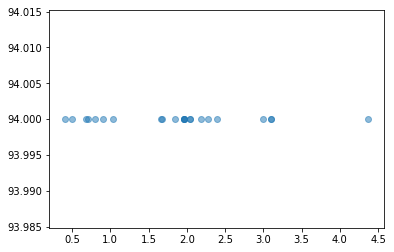

Number of Data Points in Bucket is :  23
Change in SOC WRT speed -0.00000


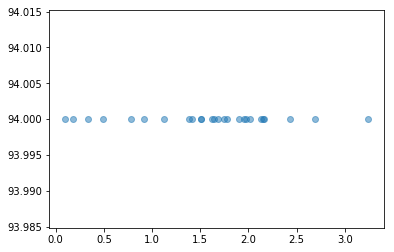

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


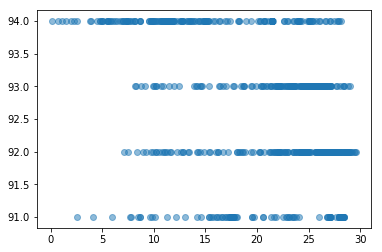

Number of Data Points in Bucket is :  710
Change in SOC WRT speed -1.20968


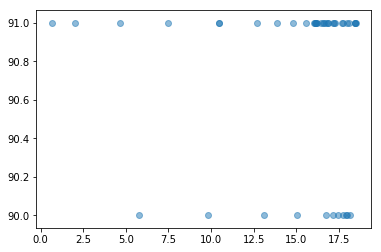

Number of Data Points in Bucket is :  44
Change in SOC WRT speed -0.19531


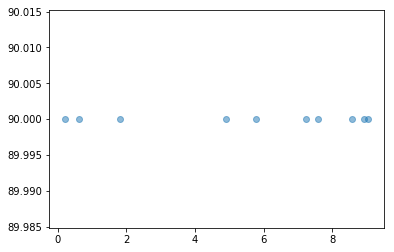

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


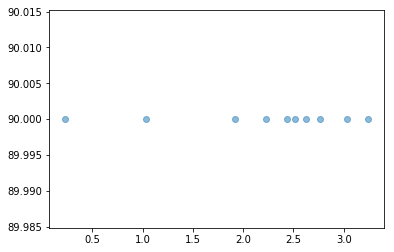

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


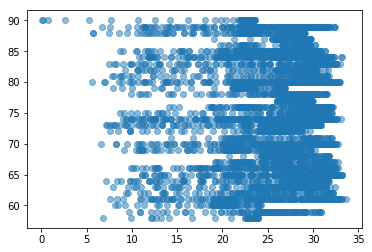

Number of Data Points in Bucket is :  5660
Change in SOC WRT speed -4.89297


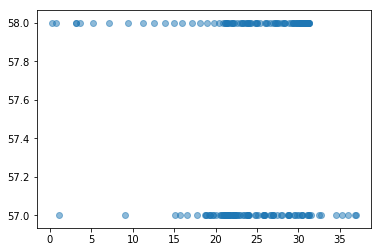

Number of Data Points in Bucket is :  212
Change in SOC WRT speed -1.08696


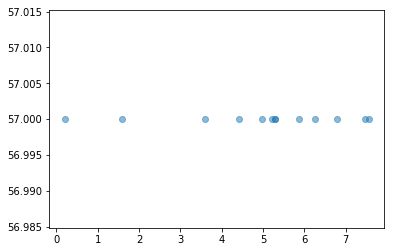

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


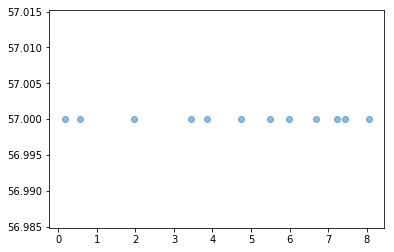

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


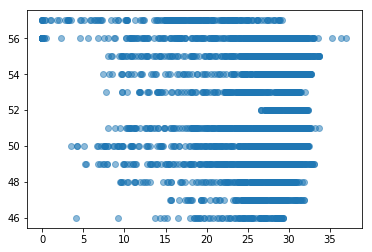

Number of Data Points in Bucket is :  3497
Change in SOC WRT speed -2.89474


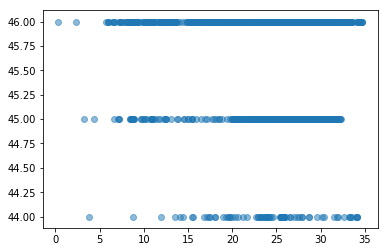

Number of Data Points in Bucket is :  1105
Change in SOC WRT speed -0.56980


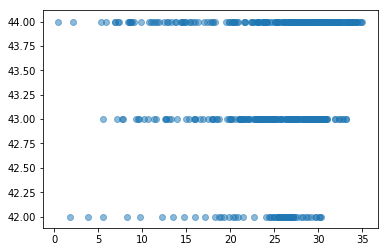

Number of Data Points in Bucket is :  494
Change in SOC WRT speed -1.53846


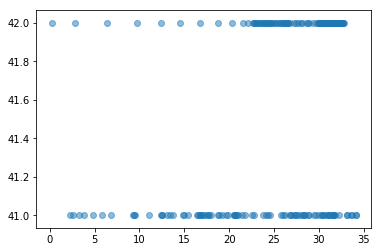

Number of Data Points in Bucket is :  212
Change in SOC WRT speed -0.17986


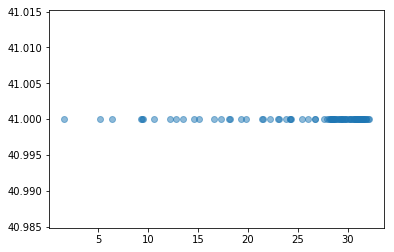

Number of Data Points in Bucket is :  91
Change in SOC WRT speed 0.00000


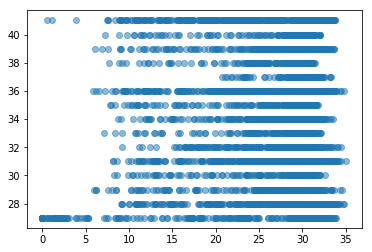

Number of Data Points in Bucket is :  5272
Change in SOC WRT speed 26.41509


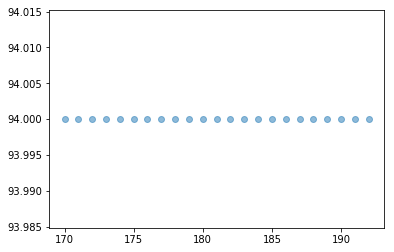

Number of Data Points in Bucket is :  23
Change in SOC WRT Time 0.00000


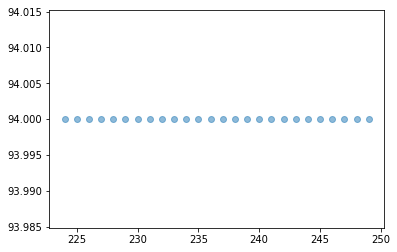

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


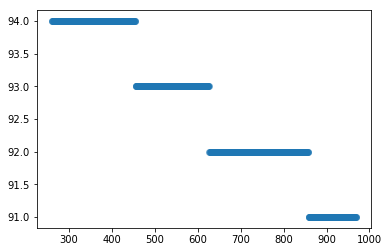

Number of Data Points in Bucket is :  710
Change in SOC WRT Time -0.00423


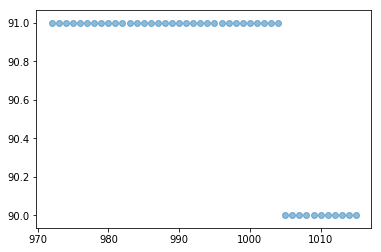

Number of Data Points in Bucket is :  44
Change in SOC WRT Time -0.02326


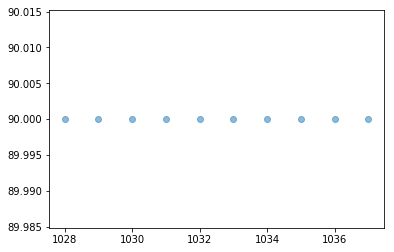

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


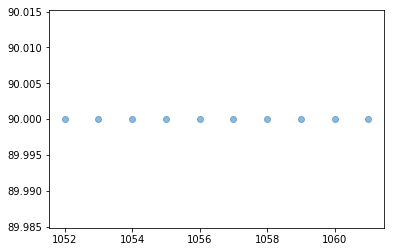

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


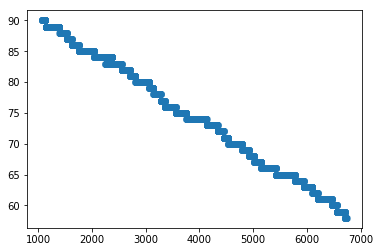

Number of Data Points in Bucket is :  5660
Change in SOC WRT Time -0.00565


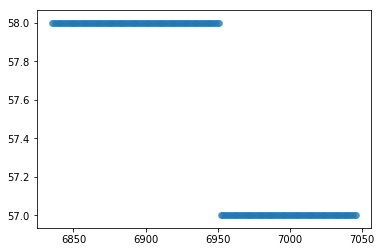

Number of Data Points in Bucket is :  212
Change in SOC WRT Time -0.00474


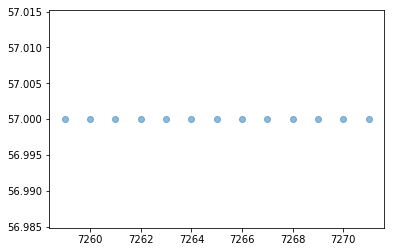

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


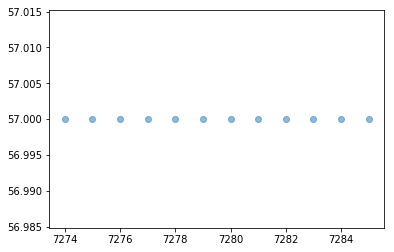

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


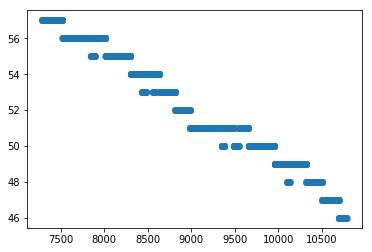

Number of Data Points in Bucket is :  3497
Change in SOC WRT Time -0.00315


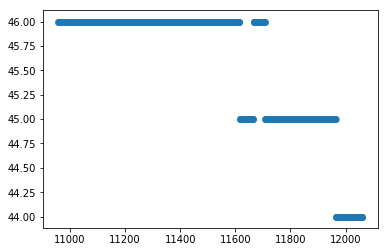

Number of Data Points in Bucket is :  1105
Change in SOC WRT Time -0.00181


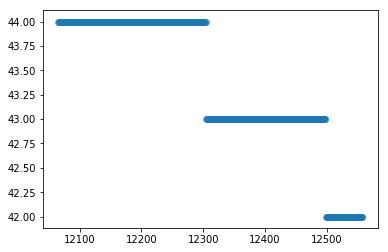

Number of Data Points in Bucket is :  494
Change in SOC WRT Time -0.00406


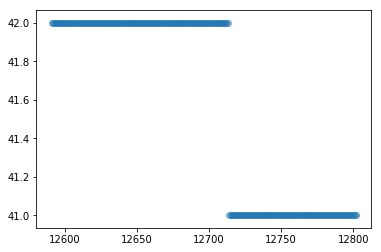

Number of Data Points in Bucket is :  212
Change in SOC WRT Time -0.00474


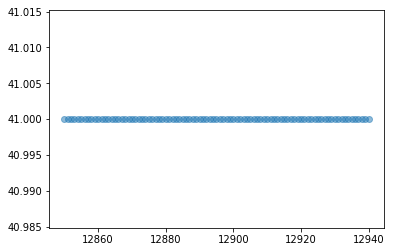

Number of Data Points in Bucket is :  91
Change in SOC WRT Time 0.00000


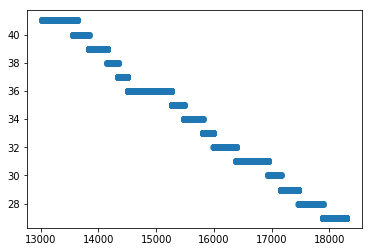

Number of Data Points in Bucket is :  5272
Change in SOC WRT Time -0.00266


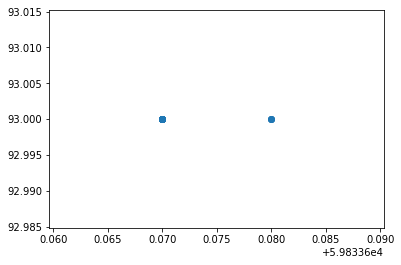

Number of Data Points in Bucket is :  23
Change in SOC WRT distance 0.00000


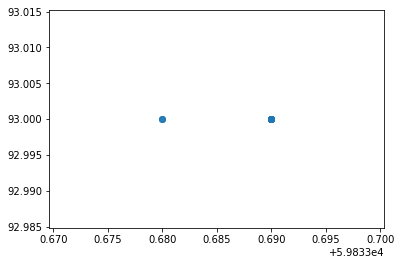

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


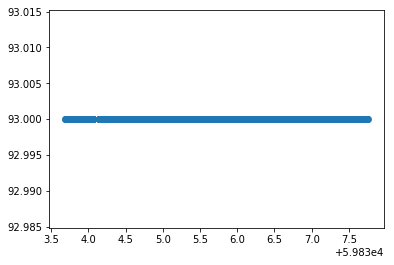

Number of Data Points in Bucket is :  710
Change in SOC WRT distance 0.00000


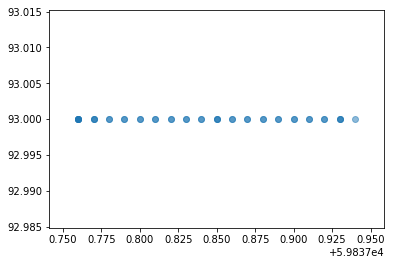

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


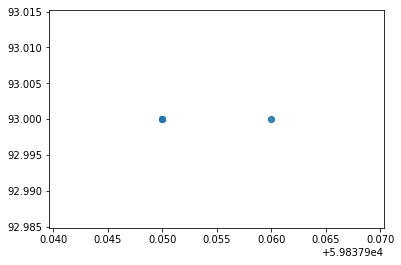

Number of Data Points in Bucket is :  10
Change in SOC WRT distance 0.00000


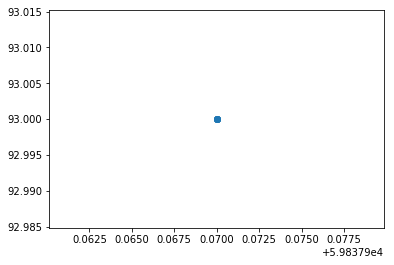

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


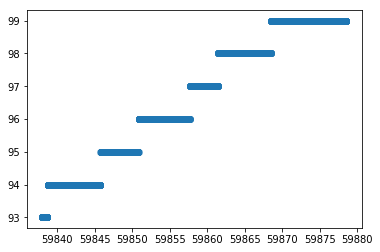

Number of Data Points in Bucket is :  5660
Change in SOC WRT distance 0.14793
Change in distance WRT SOC 6.76000


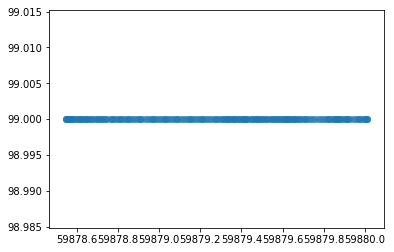

Number of Data Points in Bucket is :  212
Change in SOC WRT distance 0.00000


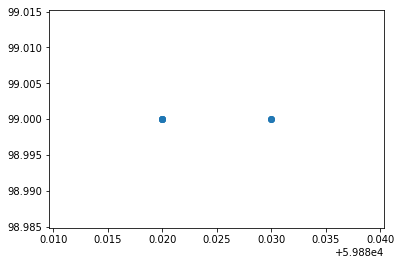

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


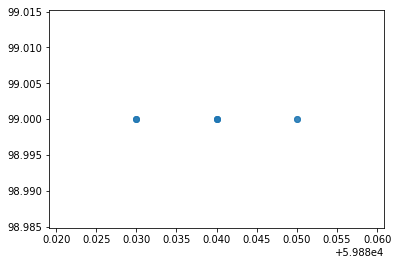

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


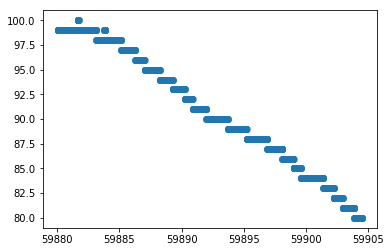

Number of Data Points in Bucket is :  3497
Change in SOC WRT distance -0.77710
Change in distance WRT SOC -1.28684


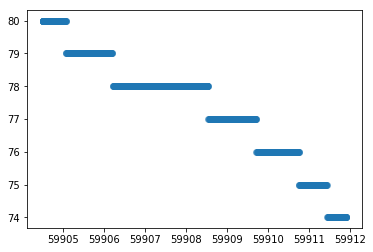

Number of Data Points in Bucket is :  1105
Change in SOC WRT distance -0.81081
Change in distance WRT SOC -1.23333


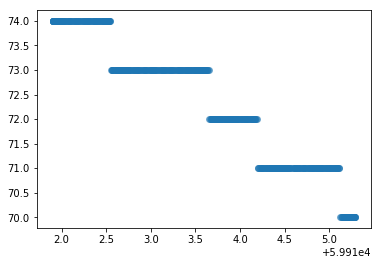

Number of Data Points in Bucket is :  494
Change in SOC WRT distance -1.17994
Change in distance WRT SOC -0.84750


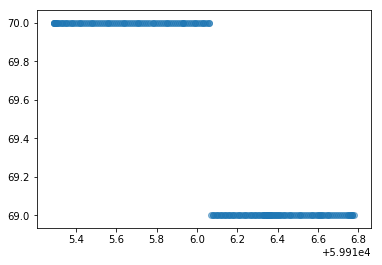

Number of Data Points in Bucket is :  212
Change in SOC WRT distance -0.67114
Change in distance WRT SOC -1.49000


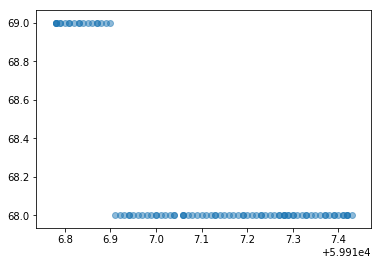

Number of Data Points in Bucket is :  91
Change in SOC WRT distance -1.53846
Change in distance WRT SOC -0.65000


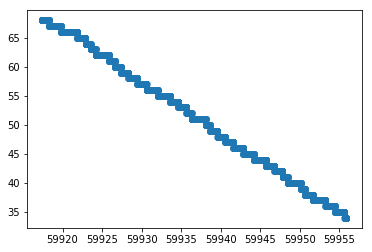

Number of Data Points in Bucket is :  5272
Change in SOC WRT distance -0.88358
Change in distance WRT SOC -1.13176


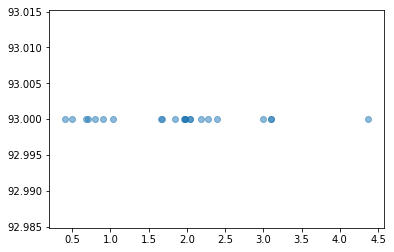

Number of Data Points in Bucket is :  23
Change in SOC WRT speed -0.00000


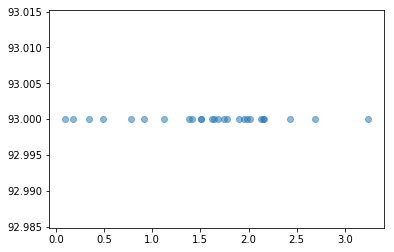

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


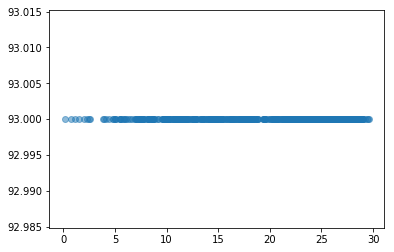

Number of Data Points in Bucket is :  710
Change in SOC WRT speed 0.00000


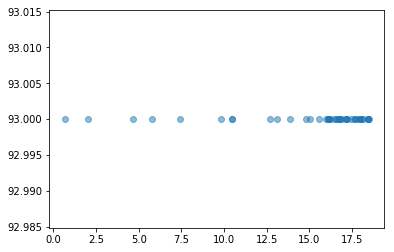

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


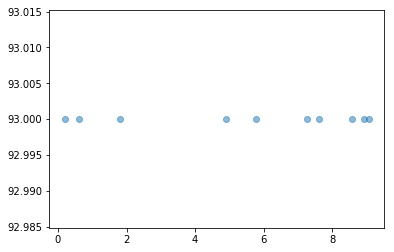

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


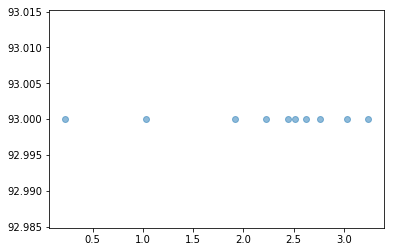

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


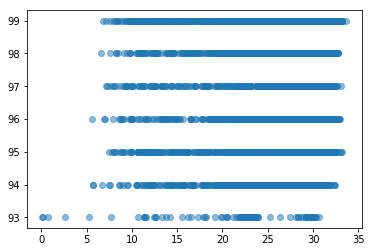

Number of Data Points in Bucket is :  5660
Change in SOC WRT speed 0.91743


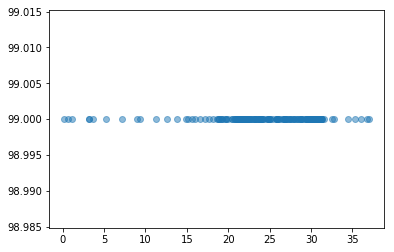

Number of Data Points in Bucket is :  212
Change in SOC WRT speed 0.00000


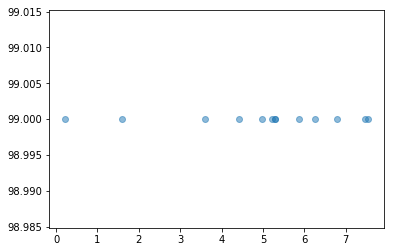

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


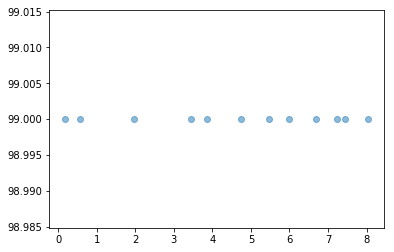

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


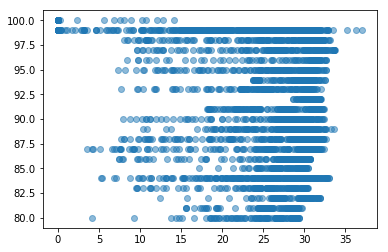

Number of Data Points in Bucket is :  3497
Change in SOC WRT speed -5.00000


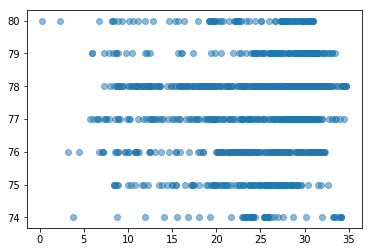

Number of Data Points in Bucket is :  1105
Change in SOC WRT speed -1.70940


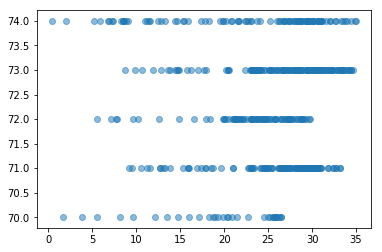

Number of Data Points in Bucket is :  494
Change in SOC WRT speed -3.07692


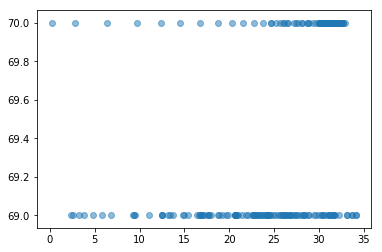

Number of Data Points in Bucket is :  212
Change in SOC WRT speed -0.17986


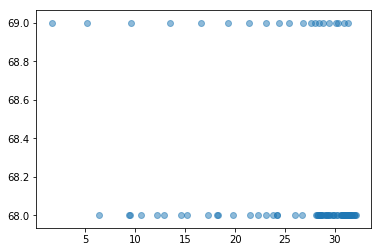

Number of Data Points in Bucket is :  91
Change in SOC WRT speed -0.20964


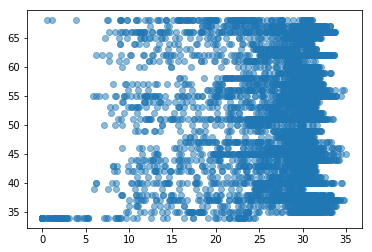

Number of Data Points in Bucket is :  5272
Change in SOC WRT speed 64.15094


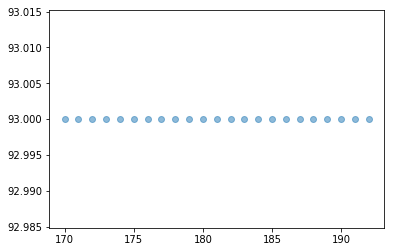

Number of Data Points in Bucket is :  23
Change in SOC WRT Time 0.00000


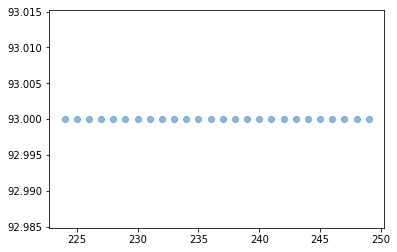

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


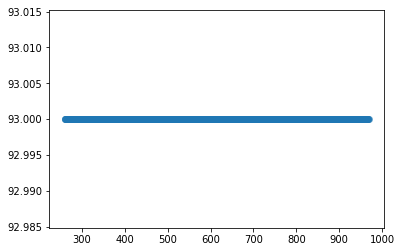

Number of Data Points in Bucket is :  710
Change in SOC WRT Time 0.00000


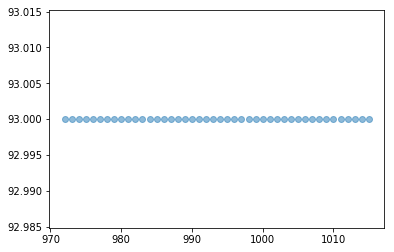

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


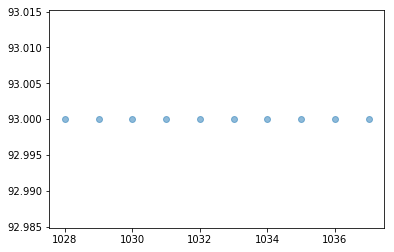

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


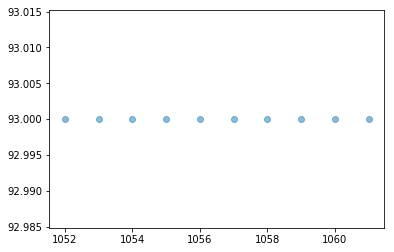

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


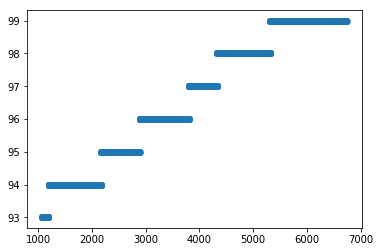

Number of Data Points in Bucket is :  5660
Change in SOC WRT Time 0.00106


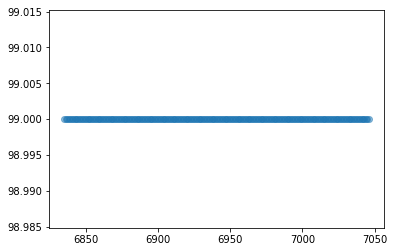

Number of Data Points in Bucket is :  212
Change in SOC WRT Time 0.00000


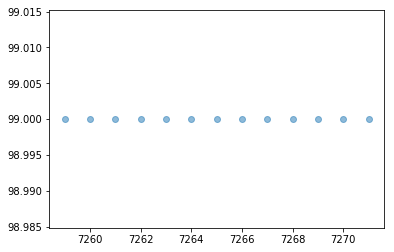

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


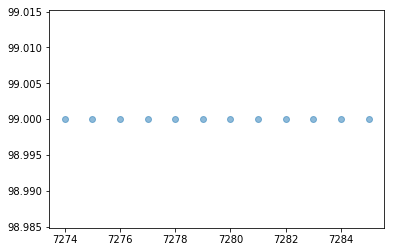

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


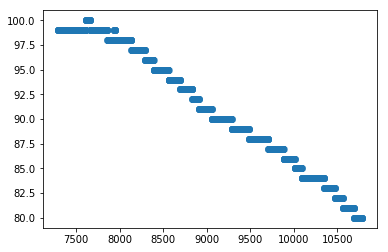

Number of Data Points in Bucket is :  3497
Change in SOC WRT Time -0.00543


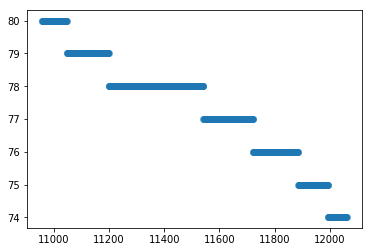

Number of Data Points in Bucket is :  1105
Change in SOC WRT Time -0.00543


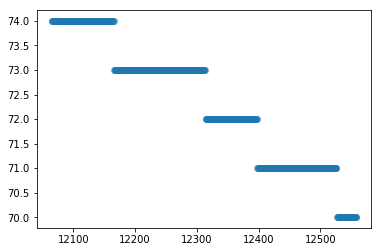

Number of Data Points in Bucket is :  494
Change in SOC WRT Time -0.00811


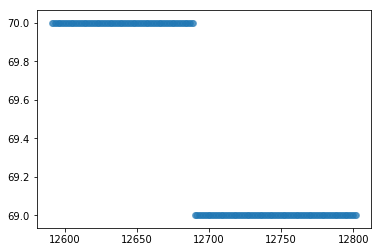

Number of Data Points in Bucket is :  212
Change in SOC WRT Time -0.00474


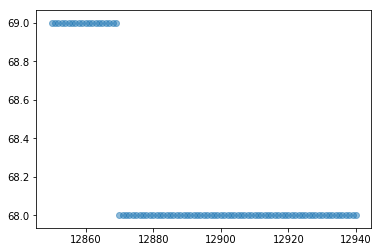

Number of Data Points in Bucket is :  91
Change in SOC WRT Time -0.01111


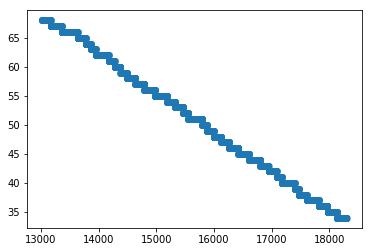

Number of Data Points in Bucket is :  5272
Change in SOC WRT Time -0.00645


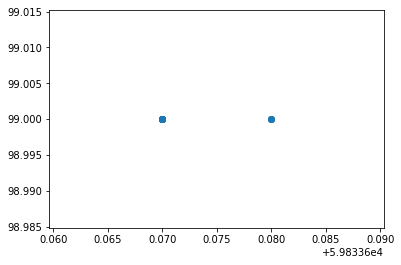

Number of Data Points in Bucket is :  23
Change in SOC WRT distance 0.00000


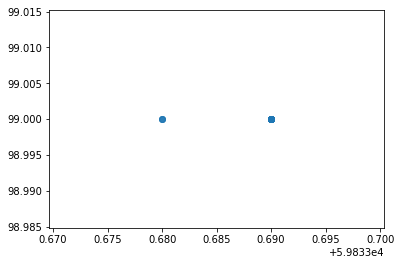

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


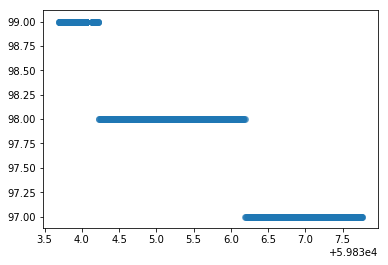

Number of Data Points in Bucket is :  710
Change in SOC WRT distance -0.49140
Change in distance WRT SOC -2.03500


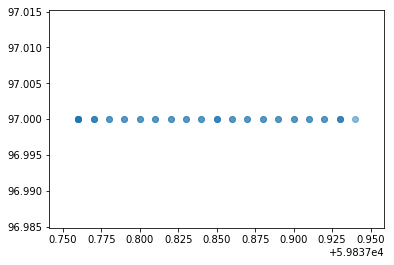

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


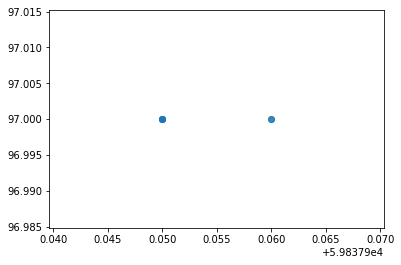

Number of Data Points in Bucket is :  10
Change in SOC WRT distance 0.00000


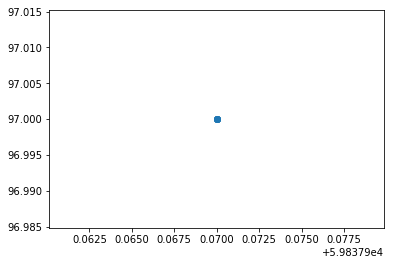

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


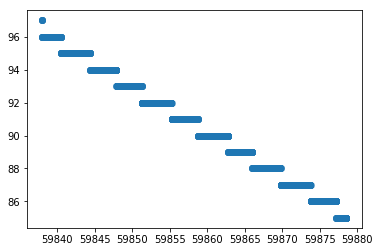

Number of Data Points in Bucket is :  5660
Change in SOC WRT distance -0.29586
Change in distance WRT SOC -3.38000


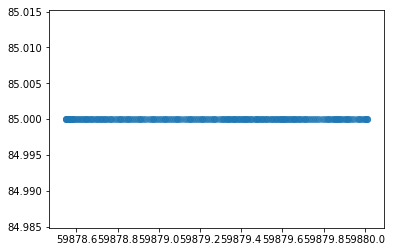

Number of Data Points in Bucket is :  212
Change in SOC WRT distance 0.00000


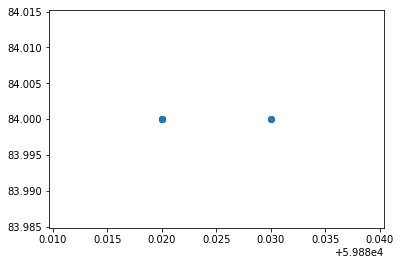

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


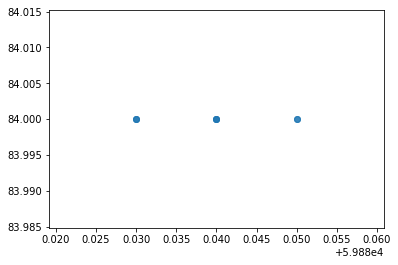

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


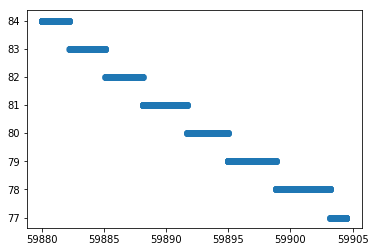

Number of Data Points in Bucket is :  3497
Change in SOC WRT distance -0.28630
Change in distance WRT SOC -3.49286


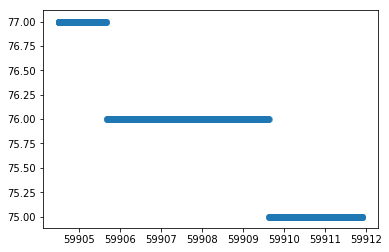

Number of Data Points in Bucket is :  1105
Change in SOC WRT distance -0.27027
Change in distance WRT SOC -3.70000


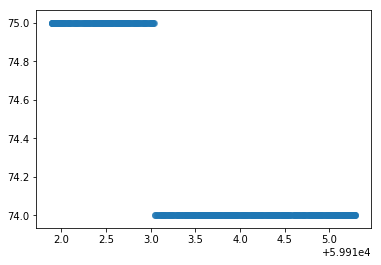

Number of Data Points in Bucket is :  494
Change in SOC WRT distance -0.29499
Change in distance WRT SOC -3.39000


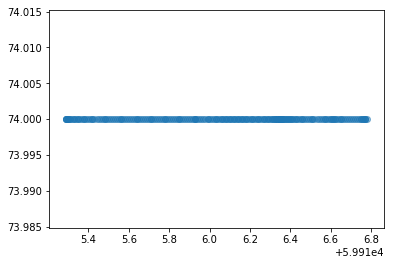

Number of Data Points in Bucket is :  212
Change in SOC WRT distance 0.00000


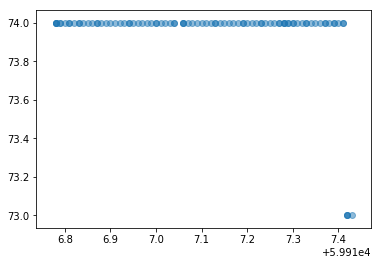

Number of Data Points in Bucket is :  91
Change in SOC WRT distance -1.53846
Change in distance WRT SOC -0.65000


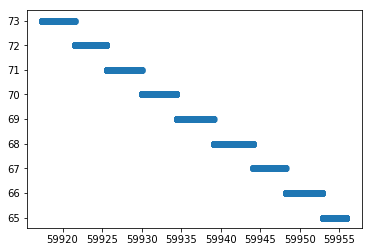

Number of Data Points in Bucket is :  5272
Change in SOC WRT distance -0.20790
Change in distance WRT SOC -4.81000


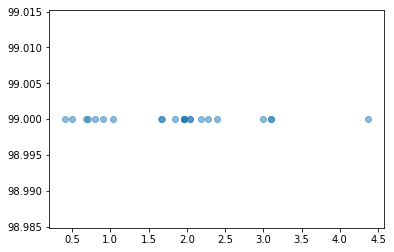

Number of Data Points in Bucket is :  23
Change in SOC WRT speed -0.00000


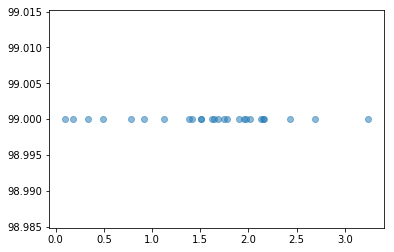

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


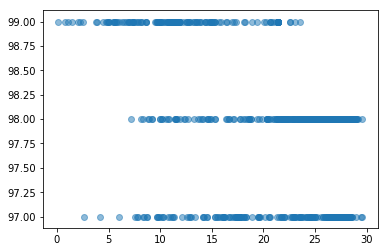

Number of Data Points in Bucket is :  710
Change in SOC WRT speed -0.80645


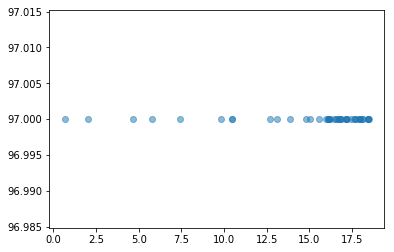

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


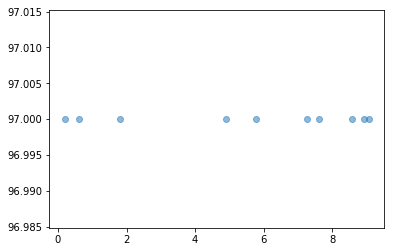

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


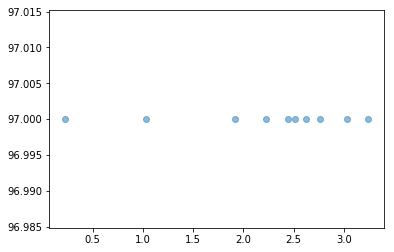

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


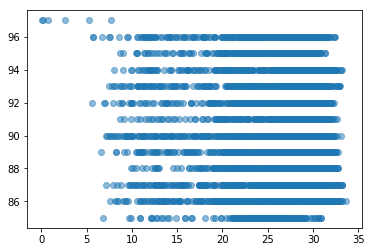

Number of Data Points in Bucket is :  5660
Change in SOC WRT speed -1.83486


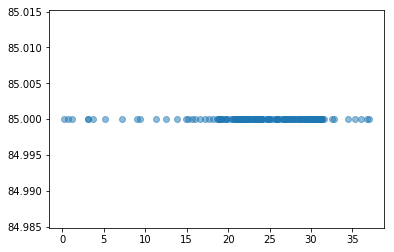

Number of Data Points in Bucket is :  212
Change in SOC WRT speed 0.00000


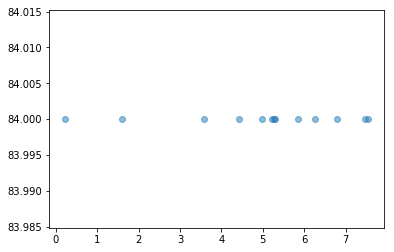

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


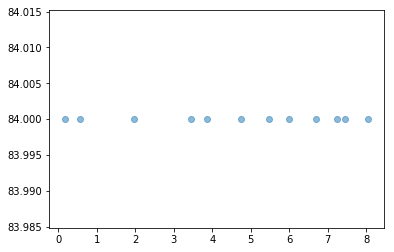

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


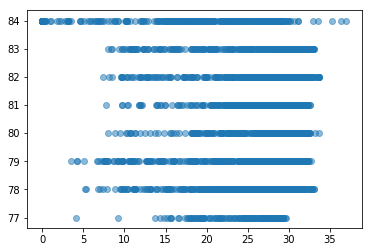

Number of Data Points in Bucket is :  3497
Change in SOC WRT speed -1.84211


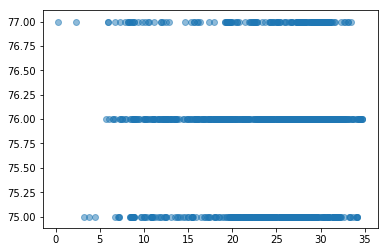

Number of Data Points in Bucket is :  1105
Change in SOC WRT speed -0.56980


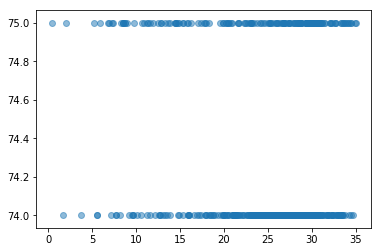

Number of Data Points in Bucket is :  494
Change in SOC WRT speed -0.76923


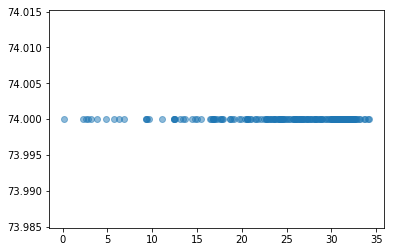

Number of Data Points in Bucket is :  212
Change in SOC WRT speed 0.00000


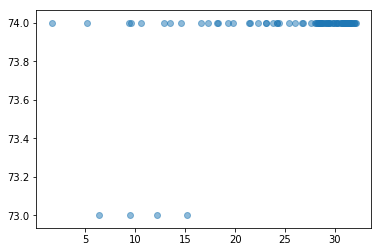

Number of Data Points in Bucket is :  91
Change in SOC WRT speed -0.20964


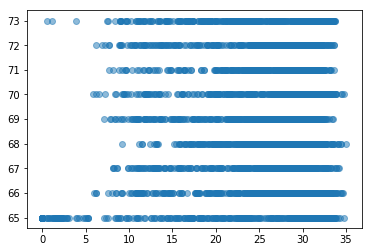

Number of Data Points in Bucket is :  5272
Change in SOC WRT speed 15.09434


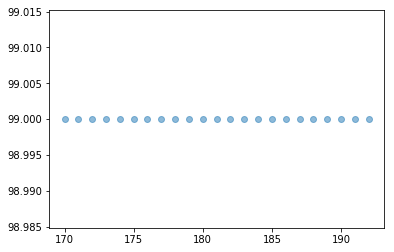

Number of Data Points in Bucket is :  23
Change in SOC WRT Time 0.00000


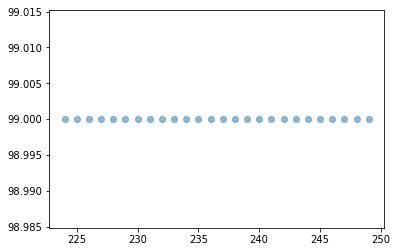

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


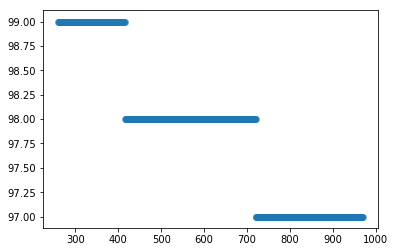

Number of Data Points in Bucket is :  710
Change in SOC WRT Time -0.00282


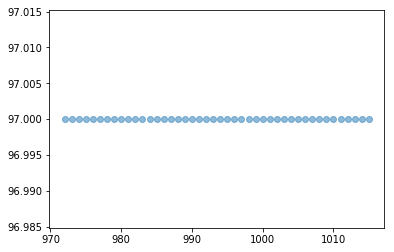

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


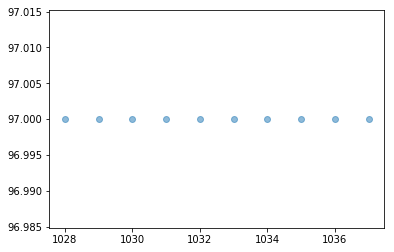

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


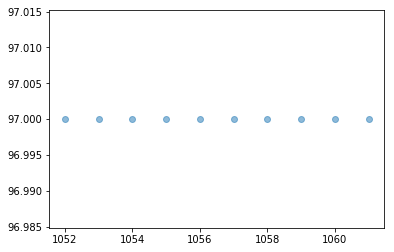

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


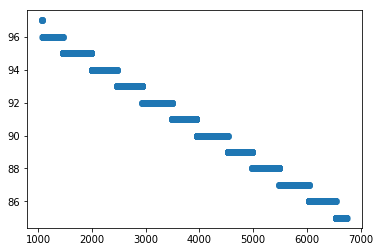

Number of Data Points in Bucket is :  5660
Change in SOC WRT Time -0.00212


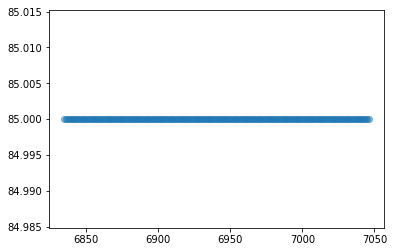

Number of Data Points in Bucket is :  212
Change in SOC WRT Time 0.00000


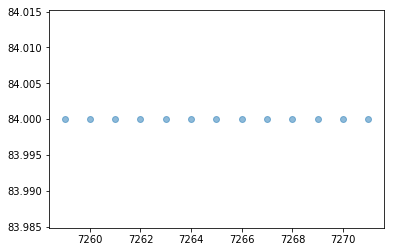

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


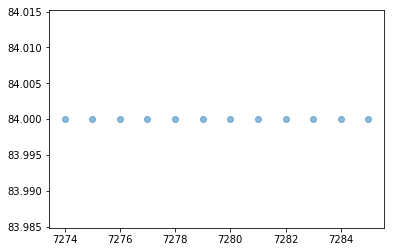

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


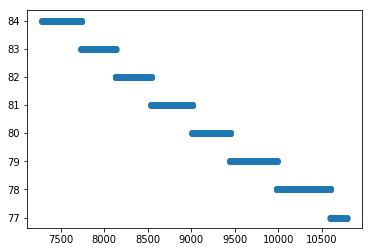

Number of Data Points in Bucket is :  3497
Change in SOC WRT Time -0.00200


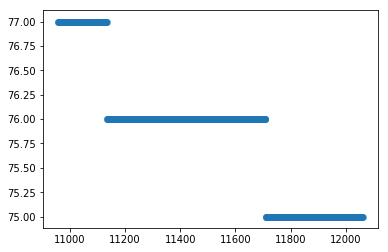

Number of Data Points in Bucket is :  1105
Change in SOC WRT Time -0.00181


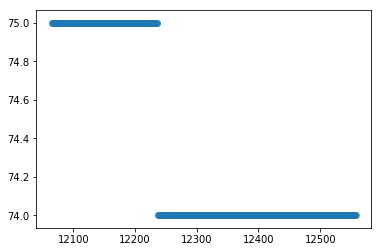

Number of Data Points in Bucket is :  494
Change in SOC WRT Time -0.00203


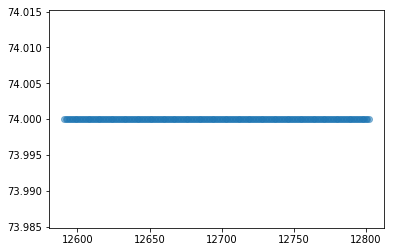

Number of Data Points in Bucket is :  212
Change in SOC WRT Time 0.00000


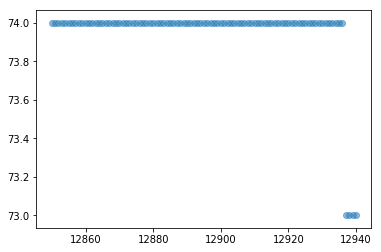

Number of Data Points in Bucket is :  91
Change in SOC WRT Time -0.01111


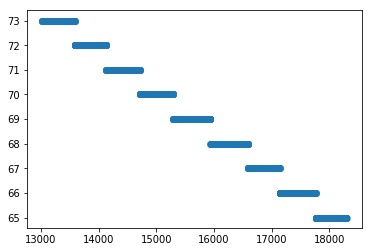

Number of Data Points in Bucket is :  5272
Change in SOC WRT Time -0.00152


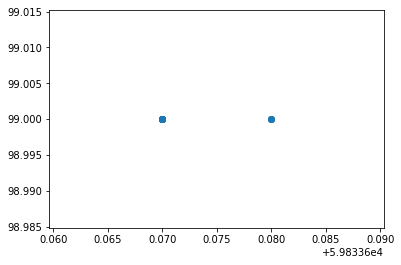

Number of Data Points in Bucket is :  23
Change in SOC WRT distance 0.00000


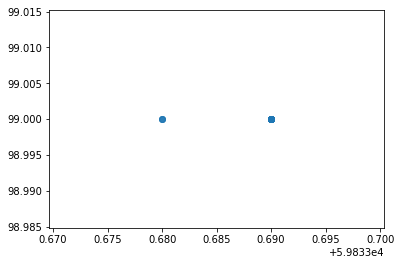

Number of Data Points in Bucket is :  26
Change in SOC WRT distance 0.00000


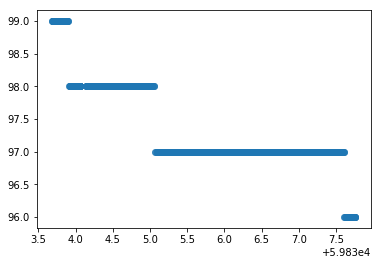

Number of Data Points in Bucket is :  710
Change in SOC WRT distance -0.73710
Change in distance WRT SOC -1.35667


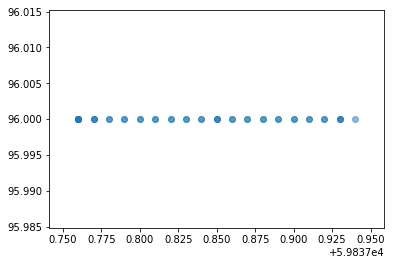

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


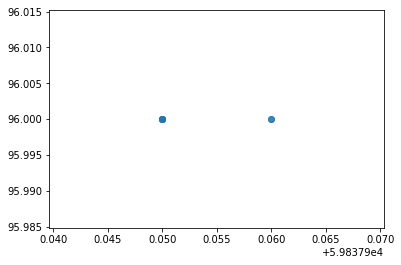

Number of Data Points in Bucket is :  10
Change in SOC WRT distance 0.00000


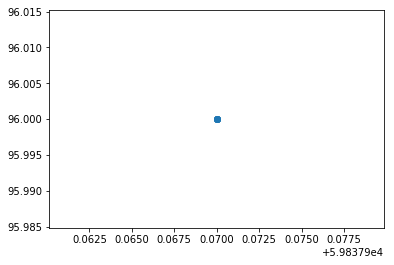

Number of Data Points in Bucket is :  10
Change in SOC WRT distance nan


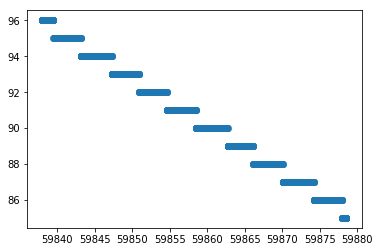

Number of Data Points in Bucket is :  5660
Change in SOC WRT distance -0.27120
Change in distance WRT SOC -3.68727


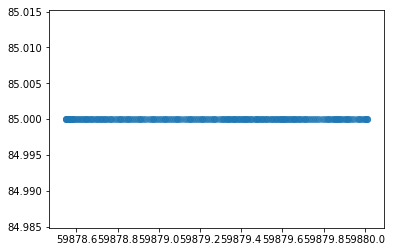

Number of Data Points in Bucket is :  212
Change in SOC WRT distance 0.00000


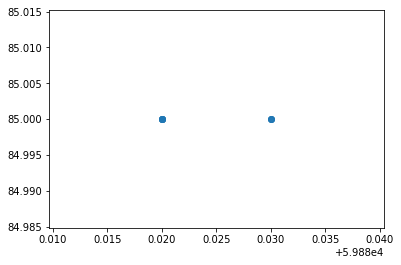

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


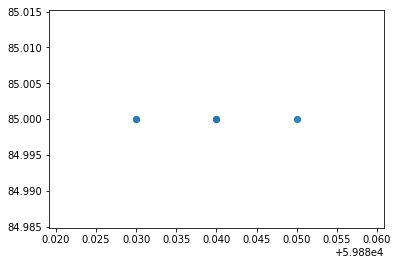

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


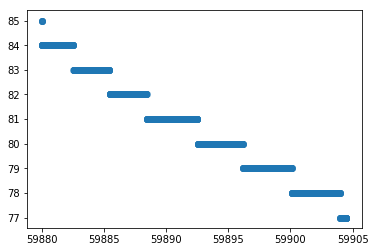

Number of Data Points in Bucket is :  3497
Change in SOC WRT distance -0.32720
Change in distance WRT SOC -3.05625


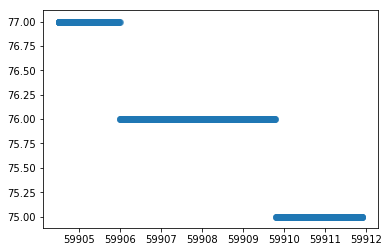

Number of Data Points in Bucket is :  1105
Change in SOC WRT distance -0.27027
Change in distance WRT SOC -3.70000


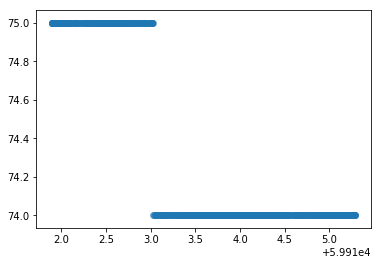

Number of Data Points in Bucket is :  494
Change in SOC WRT distance -0.29499
Change in distance WRT SOC -3.39000


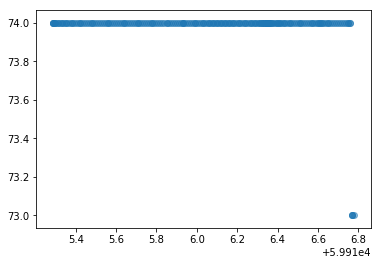

Number of Data Points in Bucket is :  212
Change in SOC WRT distance -0.67114
Change in distance WRT SOC -1.49000


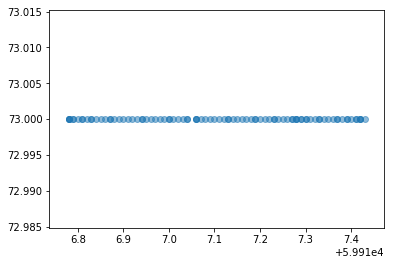

Number of Data Points in Bucket is :  91
Change in SOC WRT distance 0.00000


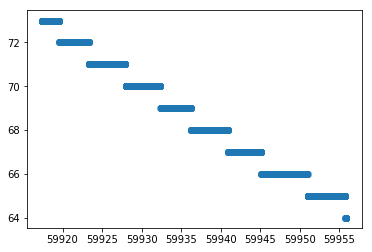

Number of Data Points in Bucket is :  5272
Change in SOC WRT distance -0.23389
Change in distance WRT SOC -4.27556


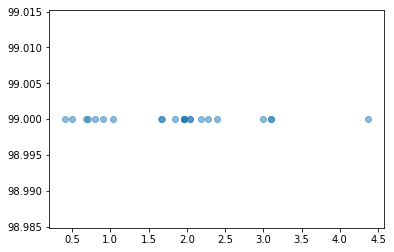

Number of Data Points in Bucket is :  23
Change in SOC WRT speed -0.00000


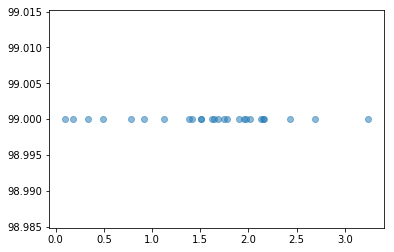

Number of Data Points in Bucket is :  26
Change in SOC WRT speed 0.00000


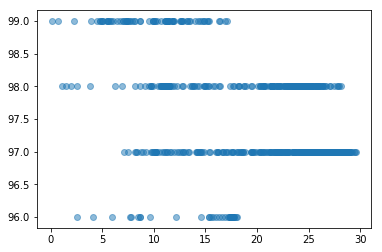

Number of Data Points in Bucket is :  710
Change in SOC WRT speed -1.20968


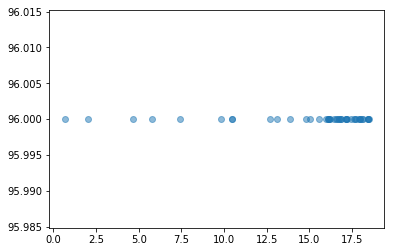

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


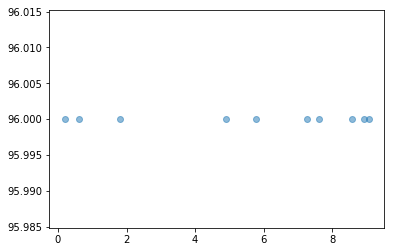

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


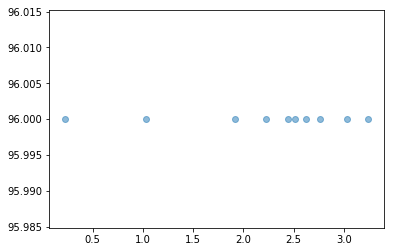

Number of Data Points in Bucket is :  10
Change in SOC WRT speed 0.00000


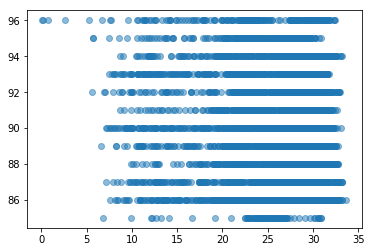

Number of Data Points in Bucket is :  5660
Change in SOC WRT speed -1.68196


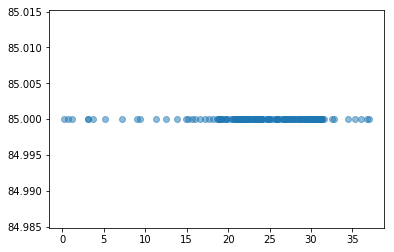

Number of Data Points in Bucket is :  212
Change in SOC WRT speed 0.00000


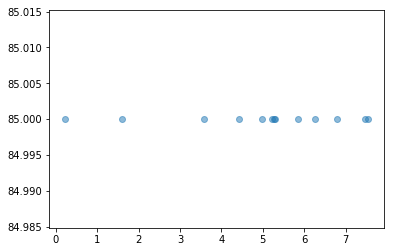

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


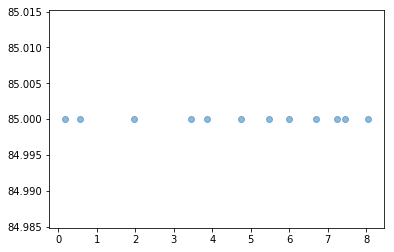

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


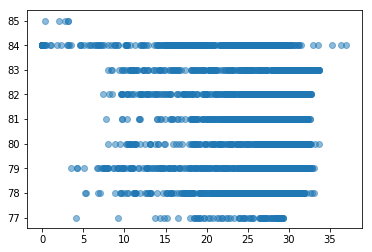

Number of Data Points in Bucket is :  3497
Change in SOC WRT speed -2.10526


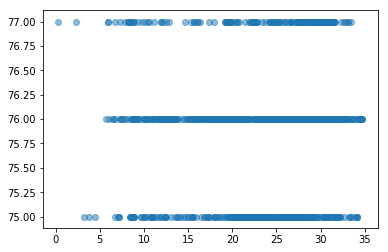

Number of Data Points in Bucket is :  1105
Change in SOC WRT speed -0.56980


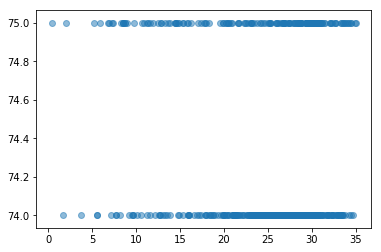

Number of Data Points in Bucket is :  494
Change in SOC WRT speed -0.76923


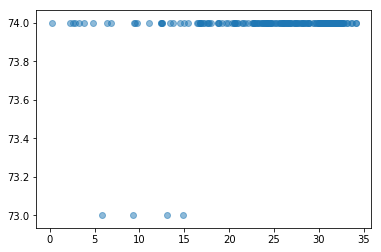

Number of Data Points in Bucket is :  212
Change in SOC WRT speed -0.17986


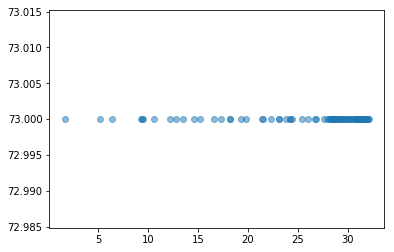

Number of Data Points in Bucket is :  91
Change in SOC WRT speed 0.00000


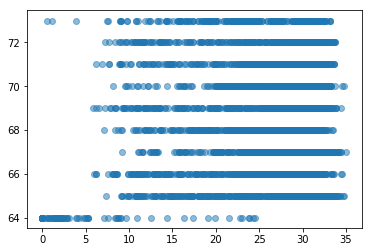

Number of Data Points in Bucket is :  5272
Change in SOC WRT speed 16.98113


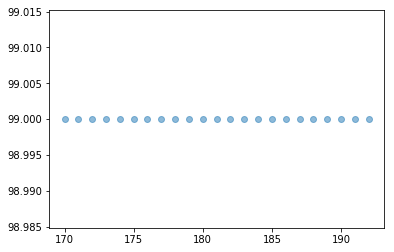

Number of Data Points in Bucket is :  23
Change in SOC WRT Time 0.00000


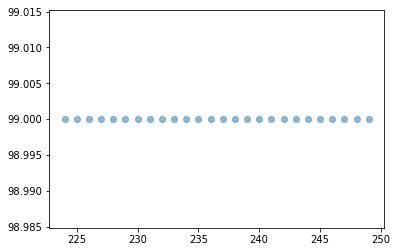

Number of Data Points in Bucket is :  26
Change in SOC WRT Time 0.00000


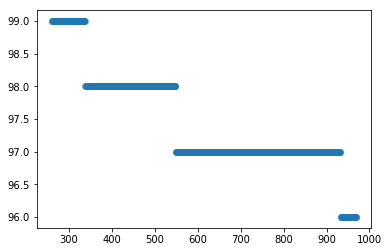

Number of Data Points in Bucket is :  710
Change in SOC WRT Time -0.00423


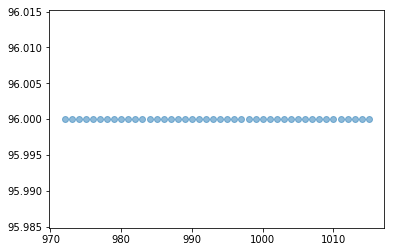

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


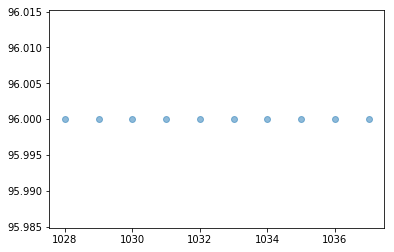

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


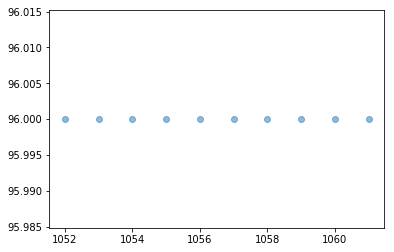

Number of Data Points in Bucket is :  10
Change in SOC WRT Time 0.00000


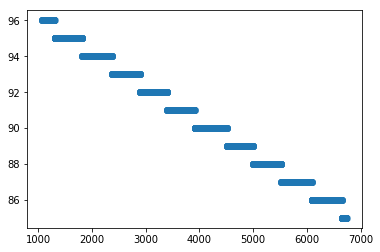

Number of Data Points in Bucket is :  5660
Change in SOC WRT Time -0.00194


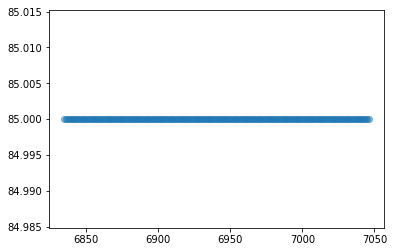

Number of Data Points in Bucket is :  212
Change in SOC WRT Time 0.00000


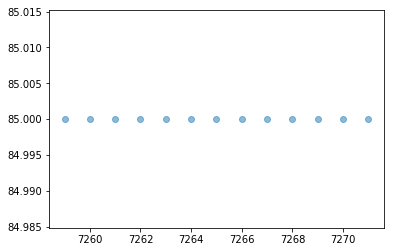

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


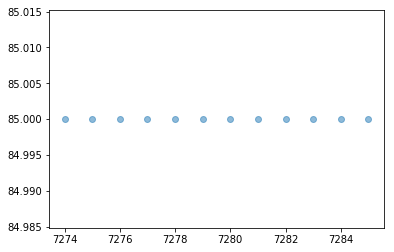

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


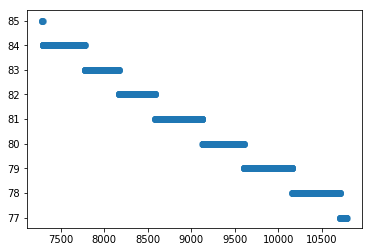

Number of Data Points in Bucket is :  3497
Change in SOC WRT Time -0.00229


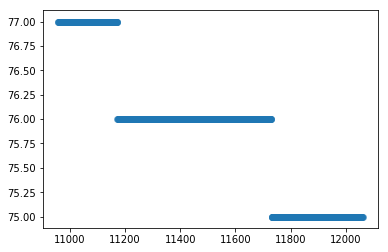

Number of Data Points in Bucket is :  1105
Change in SOC WRT Time -0.00181


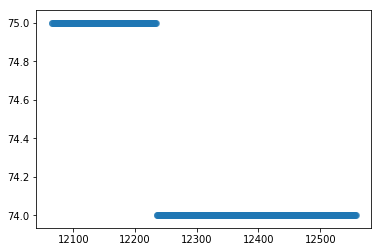

Number of Data Points in Bucket is :  494
Change in SOC WRT Time -0.00203


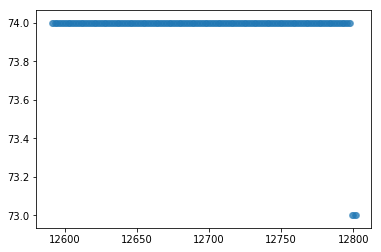

Number of Data Points in Bucket is :  212
Change in SOC WRT Time -0.00474


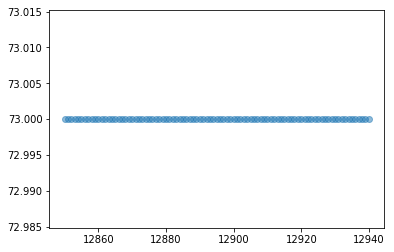

Number of Data Points in Bucket is :  91
Change in SOC WRT Time 0.00000


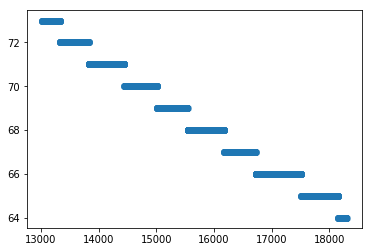

Number of Data Points in Bucket is :  5272
Change in SOC WRT Time -0.00171


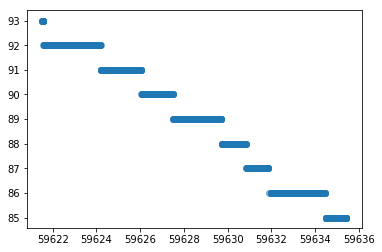

Number of Data Points in Bucket is :  2000
Change in SOC WRT distance -0.57595
Change in distance WRT SOC -1.73625


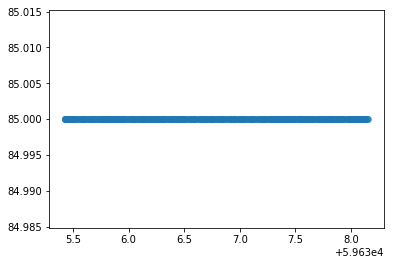

Number of Data Points in Bucket is :  400
Change in SOC WRT distance 0.00000


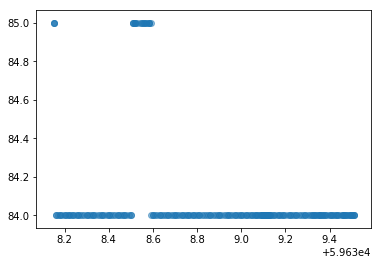

Number of Data Points in Bucket is :  221
Change in SOC WRT distance -0.73529
Change in distance WRT SOC -1.36000


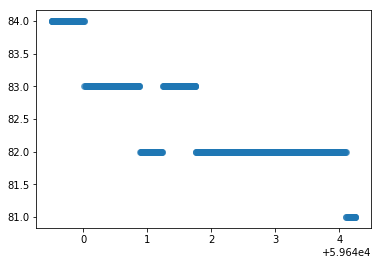

Number of Data Points in Bucket is :  706
Change in SOC WRT distance -0.63425
Change in distance WRT SOC -1.57667


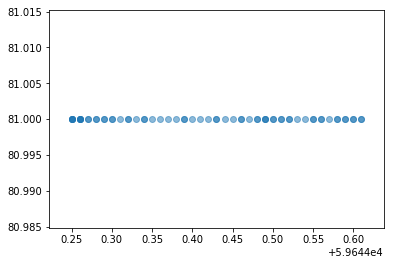

Number of Data Points in Bucket is :  66
Change in SOC WRT distance 0.00000


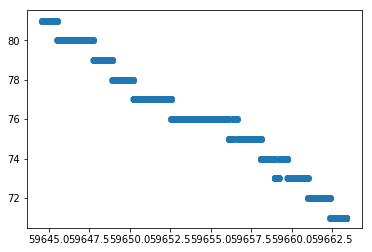

Number of Data Points in Bucket is :  2716
Change in SOC WRT distance -0.53305
Change in distance WRT SOC -1.87600


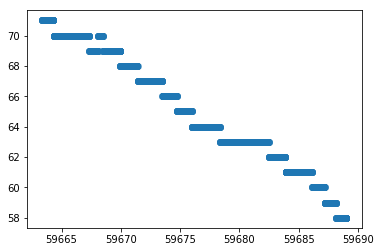

Number of Data Points in Bucket is :  3798
Change in SOC WRT distance -0.50663
Change in distance WRT SOC -1.97385


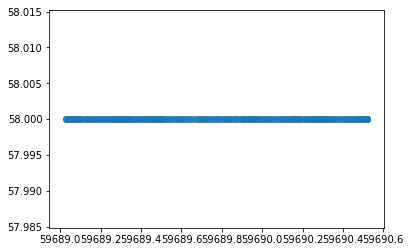

Number of Data Points in Bucket is :  264
Change in SOC WRT distance 0.00000


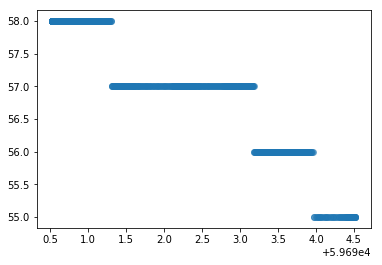

Number of Data Points in Bucket is :  590
Change in SOC WRT distance -0.75188
Change in distance WRT SOC -1.33000


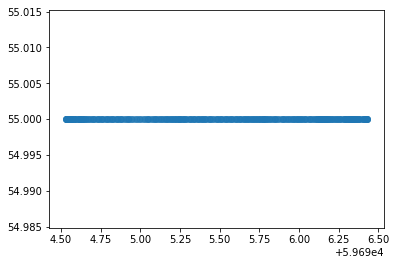

Number of Data Points in Bucket is :  305
Change in SOC WRT distance 0.00000


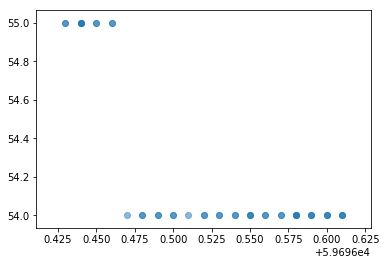

Number of Data Points in Bucket is :  44
Change in SOC WRT distance -5.55556
Change in distance WRT SOC -0.18000


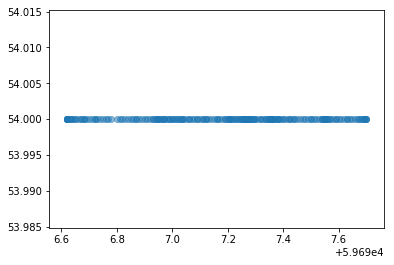

Number of Data Points in Bucket is :  191
Change in SOC WRT distance 0.00000


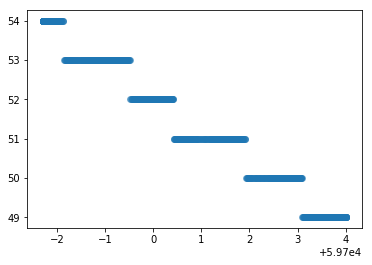

Number of Data Points in Bucket is :  712
Change in SOC WRT distance -0.79239
Change in distance WRT SOC -1.26200


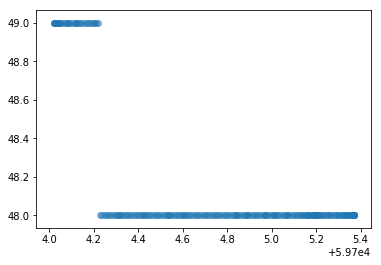

Number of Data Points in Bucket is :  175
Change in SOC WRT distance -0.74074
Change in distance WRT SOC -1.35000


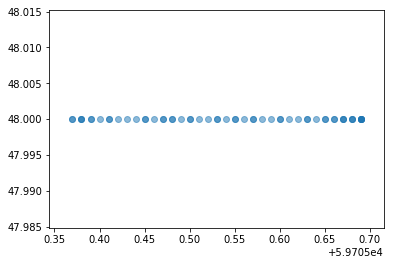

Number of Data Points in Bucket is :  58
Change in SOC WRT distance 0.00000


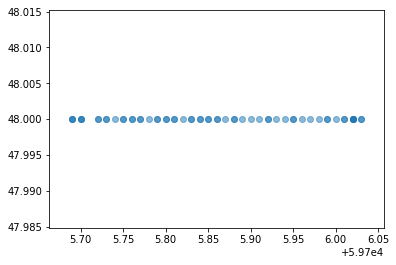

Number of Data Points in Bucket is :  60
Change in SOC WRT distance 0.00000


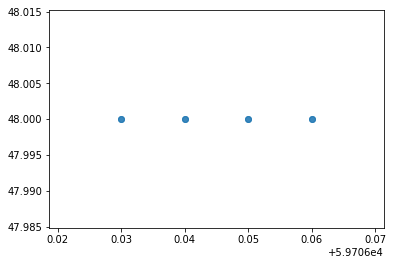

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


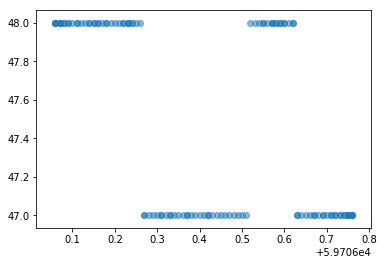

Number of Data Points in Bucket is :  113
Change in SOC WRT distance -1.42857
Change in distance WRT SOC -0.70000


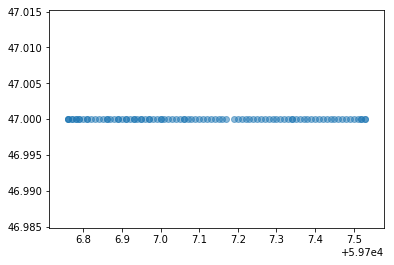

Number of Data Points in Bucket is :  94
Change in SOC WRT distance 0.00000


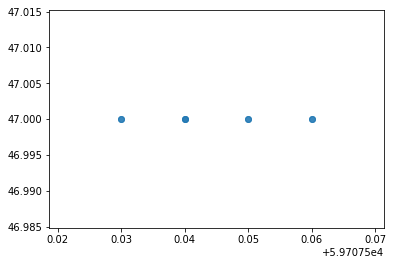

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


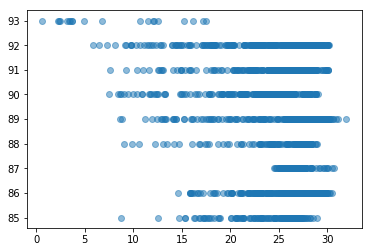

Number of Data Points in Bucket is :  2000
Change in SOC WRT speed -0.98160


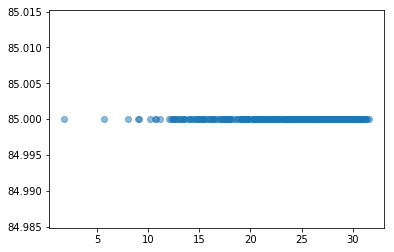

Number of Data Points in Bucket is :  400
Change in SOC WRT speed 0.00000


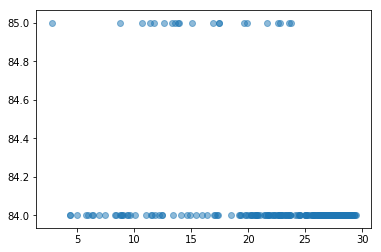

Number of Data Points in Bucket is :  221
Change in SOC WRT speed -0.23981


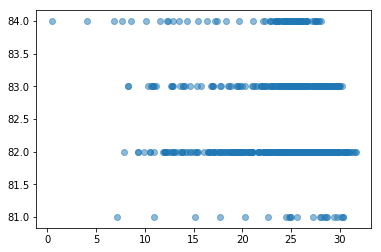

Number of Data Points in Bucket is :  706
Change in SOC WRT speed -0.44843


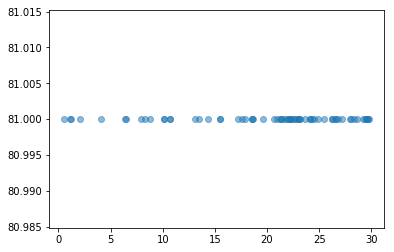

Number of Data Points in Bucket is :  66
Change in SOC WRT speed 0.00000


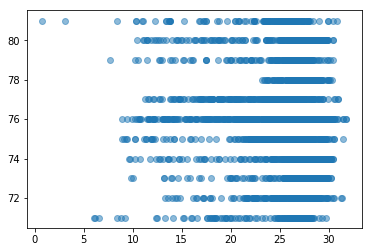

Number of Data Points in Bucket is :  2716
Change in SOC WRT speed -1.84162


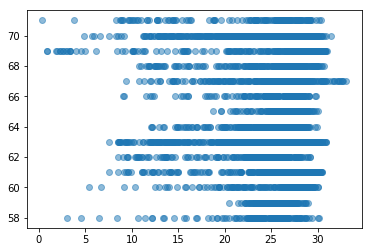

Number of Data Points in Bucket is :  3798
Change in SOC WRT speed -4.83271


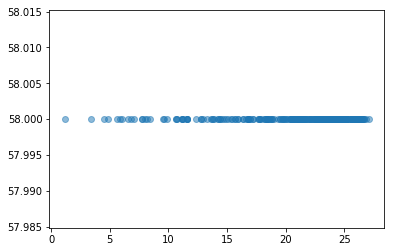

Number of Data Points in Bucket is :  264
Change in SOC WRT speed 0.00000


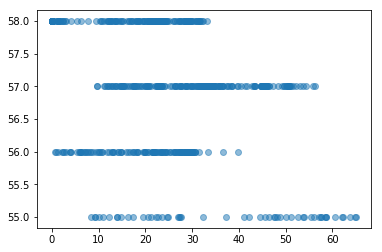

Number of Data Points in Bucket is :  590
Change in SOC WRT speed -0.32223


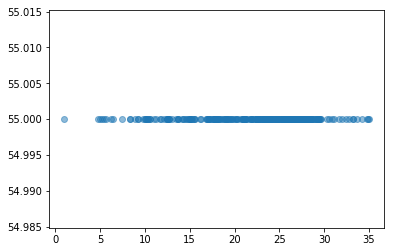

Number of Data Points in Bucket is :  305
Change in SOC WRT speed 0.00000


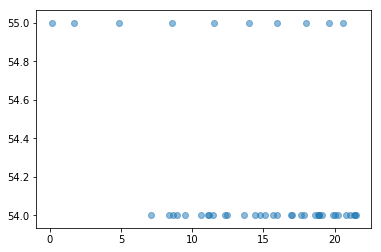

Number of Data Points in Bucket is :  44
Change in SOC WRT speed -0.14306


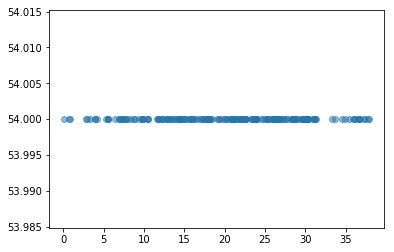

Number of Data Points in Bucket is :  191
Change in SOC WRT speed 0.00000


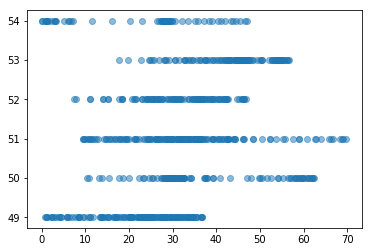

Number of Data Points in Bucket is :  712
Change in SOC WRT speed -7.57576


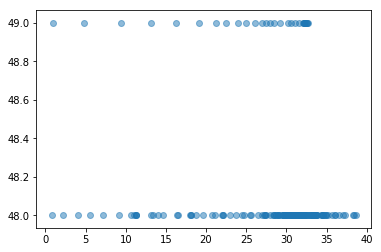

Number of Data Points in Bucket is :  175
Change in SOC WRT speed 4.76190


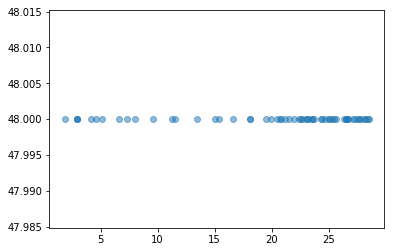

Number of Data Points in Bucket is :  58
Change in SOC WRT speed 0.00000


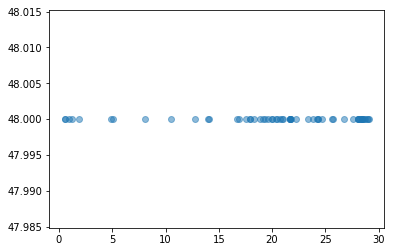

Number of Data Points in Bucket is :  60
Change in SOC WRT speed -0.00000


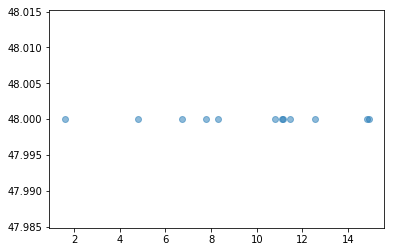

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


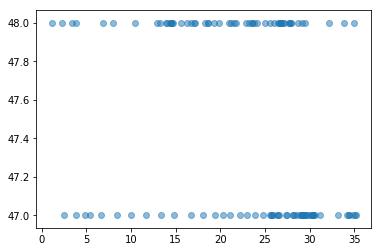

Number of Data Points in Bucket is :  113
Change in SOC WRT speed -0.74074


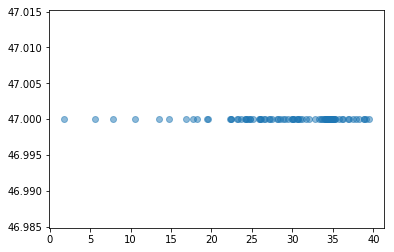

Number of Data Points in Bucket is :  94
Change in SOC WRT speed 0.00000


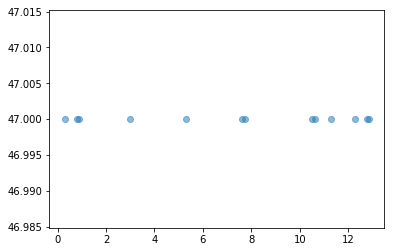

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


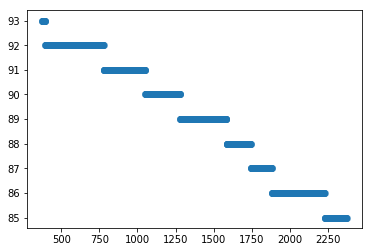

Number of Data Points in Bucket is :  2000
Change in SOC WRT Time -0.00400


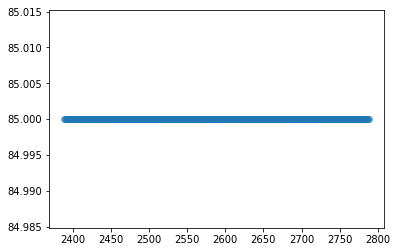

Number of Data Points in Bucket is :  400
Change in SOC WRT Time 0.00000


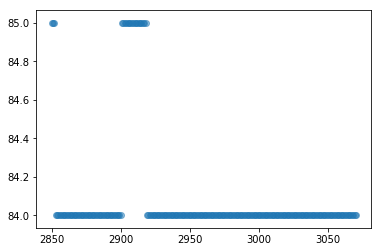

Number of Data Points in Bucket is :  221
Change in SOC WRT Time -0.00455


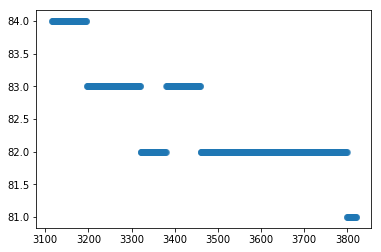

Number of Data Points in Bucket is :  706
Change in SOC WRT Time -0.00426


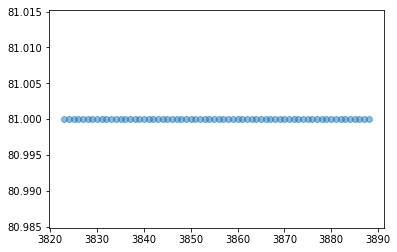

Number of Data Points in Bucket is :  66
Change in SOC WRT Time 0.00000


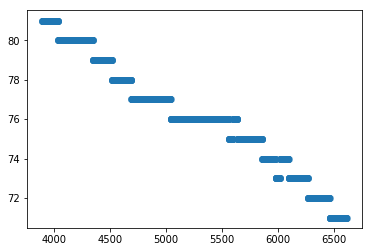

Number of Data Points in Bucket is :  2716
Change in SOC WRT Time -0.00368


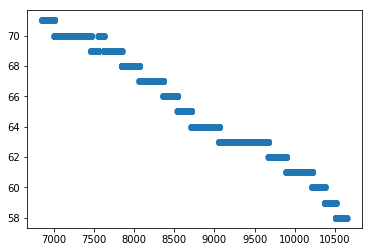

Number of Data Points in Bucket is :  3798
Change in SOC WRT Time -0.00342


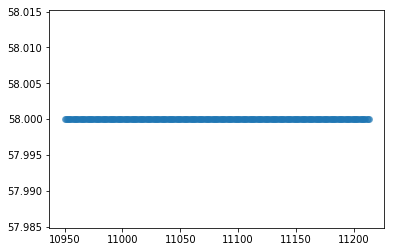

Number of Data Points in Bucket is :  264
Change in SOC WRT Time 0.00000


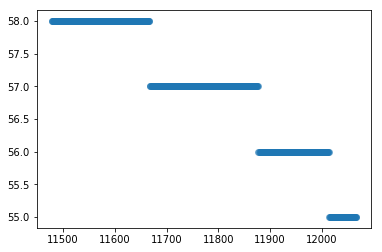

Number of Data Points in Bucket is :  590
Change in SOC WRT Time -0.00509


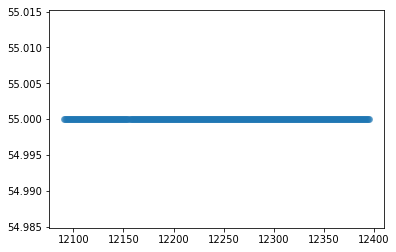

Number of Data Points in Bucket is :  305
Change in SOC WRT Time 0.00000


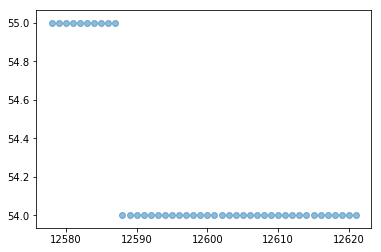

Number of Data Points in Bucket is :  44
Change in SOC WRT Time -0.02326


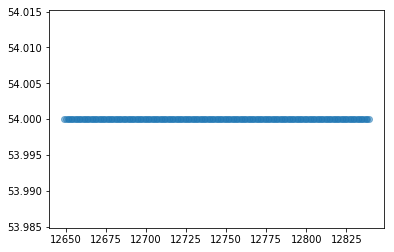

Number of Data Points in Bucket is :  191
Change in SOC WRT Time 0.00000


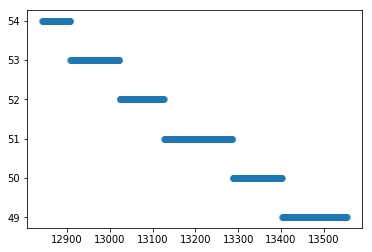

Number of Data Points in Bucket is :  712
Change in SOC WRT Time -0.00703


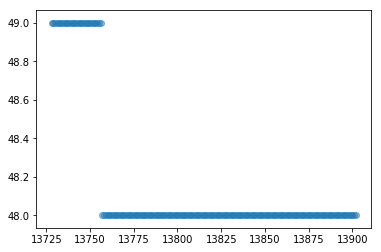

Number of Data Points in Bucket is :  175
Change in SOC WRT Time -0.00575


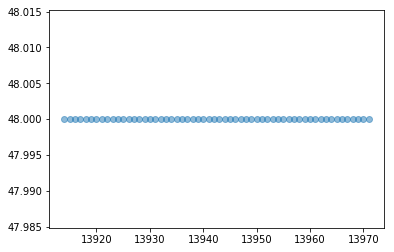

Number of Data Points in Bucket is :  58
Change in SOC WRT Time 0.00000


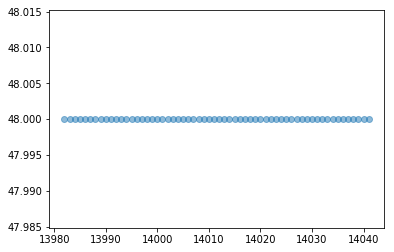

Number of Data Points in Bucket is :  60
Change in SOC WRT Time 0.00000


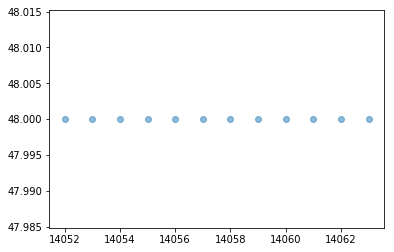

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


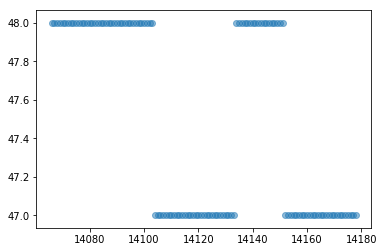

Number of Data Points in Bucket is :  113
Change in SOC WRT Time -0.00893


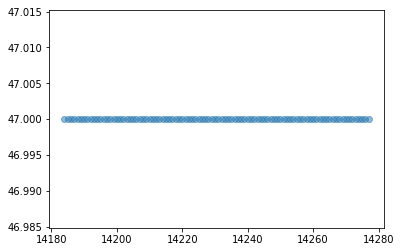

Number of Data Points in Bucket is :  94
Change in SOC WRT Time 0.00000


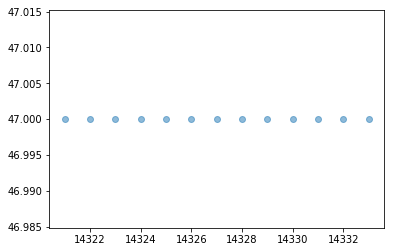

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


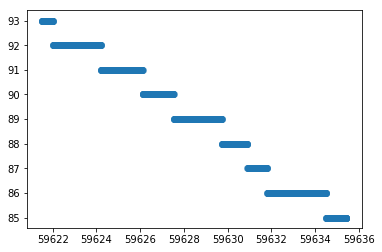

Number of Data Points in Bucket is :  2000
Change in SOC WRT distance -0.57595
Change in distance WRT SOC -1.73625


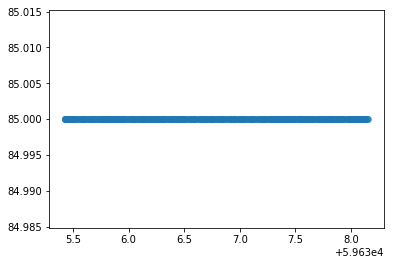

Number of Data Points in Bucket is :  400
Change in SOC WRT distance 0.00000


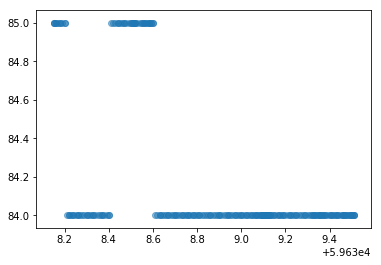

Number of Data Points in Bucket is :  221
Change in SOC WRT distance -0.73529
Change in distance WRT SOC -1.36000


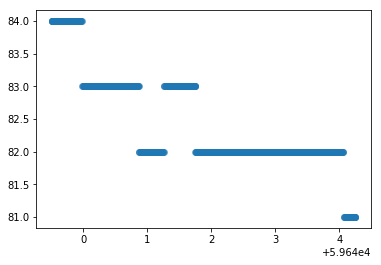

Number of Data Points in Bucket is :  706
Change in SOC WRT distance -0.63425
Change in distance WRT SOC -1.57667


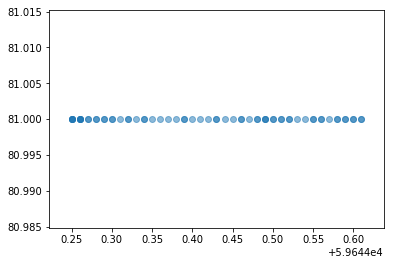

Number of Data Points in Bucket is :  66
Change in SOC WRT distance 0.00000


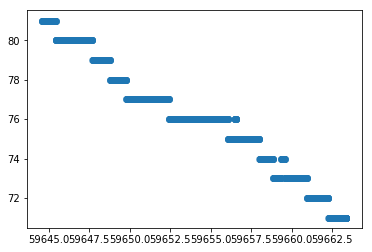

Number of Data Points in Bucket is :  2716
Change in SOC WRT distance -0.53305
Change in distance WRT SOC -1.87600


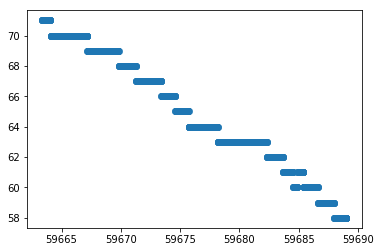

Number of Data Points in Bucket is :  3798
Change in SOC WRT distance -0.50663
Change in distance WRT SOC -1.97385


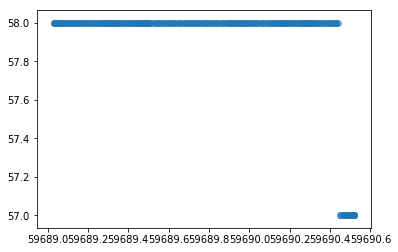

Number of Data Points in Bucket is :  264
Change in SOC WRT distance -0.67114
Change in distance WRT SOC -1.49000


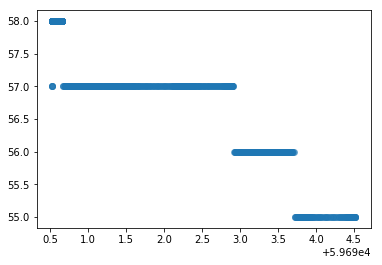

Number of Data Points in Bucket is :  590
Change in SOC WRT distance -0.50125
Change in distance WRT SOC -1.99500


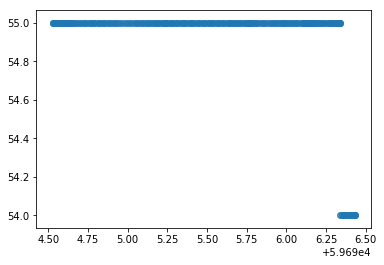

Number of Data Points in Bucket is :  305
Change in SOC WRT distance -0.52632
Change in distance WRT SOC -1.90000


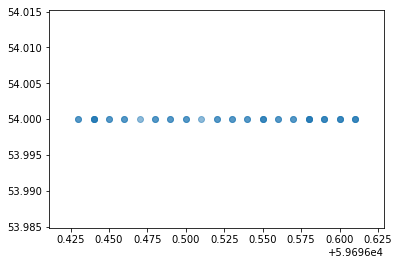

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


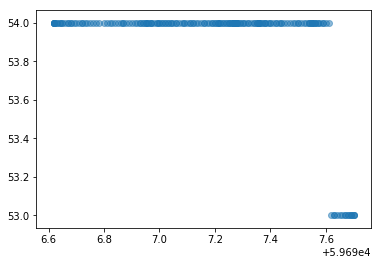

Number of Data Points in Bucket is :  191
Change in SOC WRT distance -0.92593
Change in distance WRT SOC -1.08000


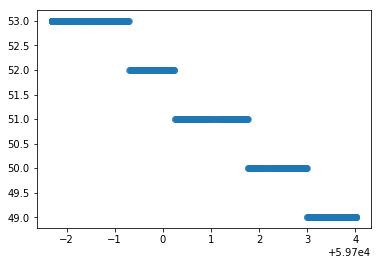

Number of Data Points in Bucket is :  712
Change in SOC WRT distance -0.63391
Change in distance WRT SOC -1.57750


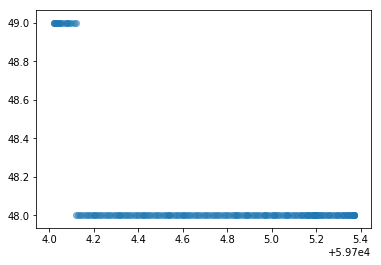

Number of Data Points in Bucket is :  175
Change in SOC WRT distance -0.74074
Change in distance WRT SOC -1.35000


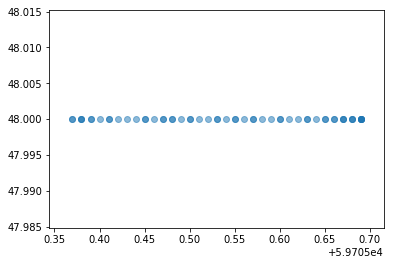

Number of Data Points in Bucket is :  58
Change in SOC WRT distance 0.00000


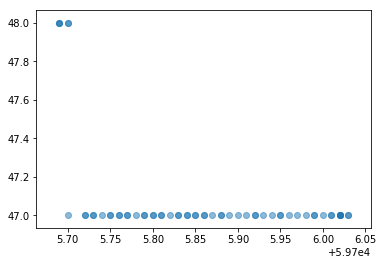

Number of Data Points in Bucket is :  60
Change in SOC WRT distance -2.94118
Change in distance WRT SOC -0.34000


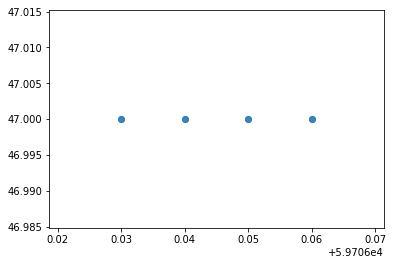

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


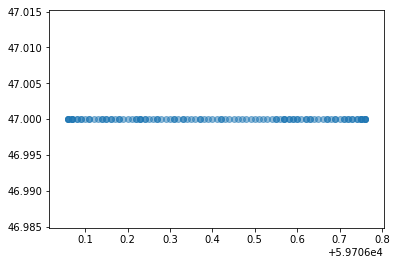

Number of Data Points in Bucket is :  113
Change in SOC WRT distance 0.00000


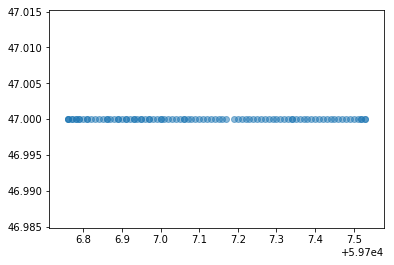

Number of Data Points in Bucket is :  94
Change in SOC WRT distance 0.00000


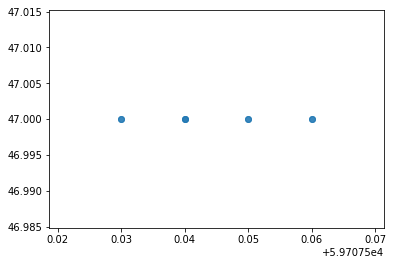

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


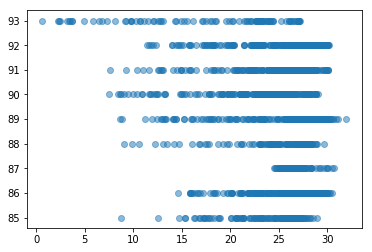

Number of Data Points in Bucket is :  2000
Change in SOC WRT speed -0.98160


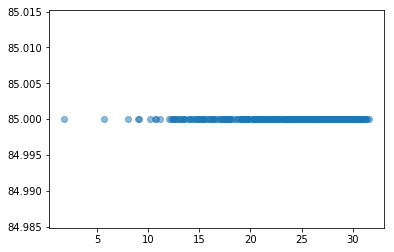

Number of Data Points in Bucket is :  400
Change in SOC WRT speed 0.00000


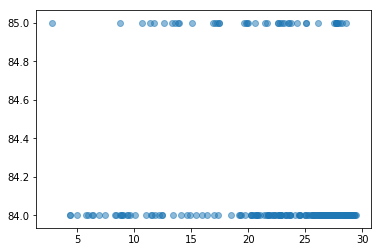

Number of Data Points in Bucket is :  221
Change in SOC WRT speed -0.23981


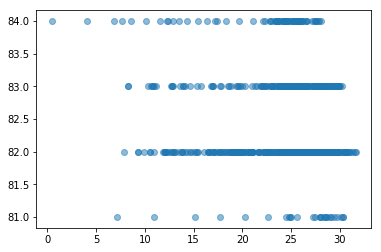

Number of Data Points in Bucket is :  706
Change in SOC WRT speed -0.44843


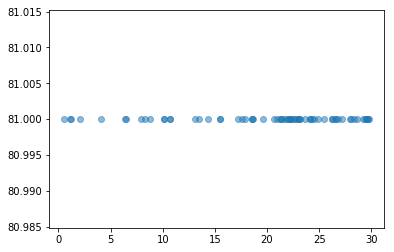

Number of Data Points in Bucket is :  66
Change in SOC WRT speed 0.00000


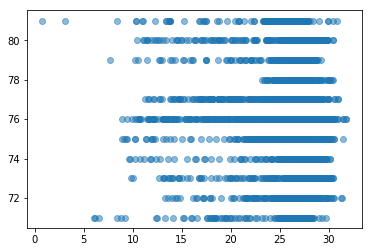

Number of Data Points in Bucket is :  2716
Change in SOC WRT speed -1.84162


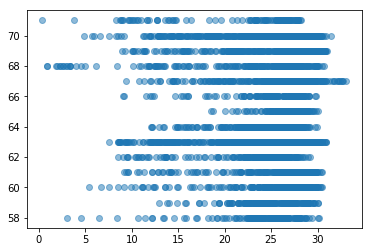

Number of Data Points in Bucket is :  3798
Change in SOC WRT speed -4.83271


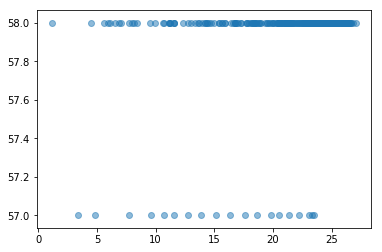

Number of Data Points in Bucket is :  264
Change in SOC WRT speed -0.44843


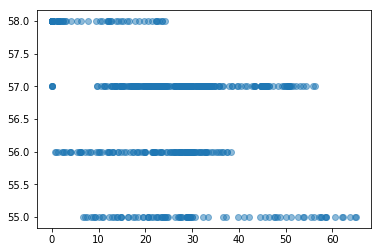

Number of Data Points in Bucket is :  590
Change in SOC WRT speed -0.21482


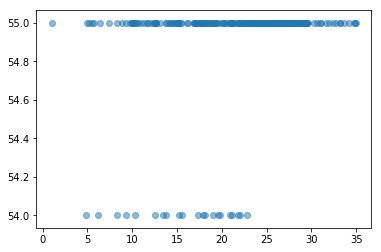

Number of Data Points in Bucket is :  305
Change in SOC WRT speed -0.26385


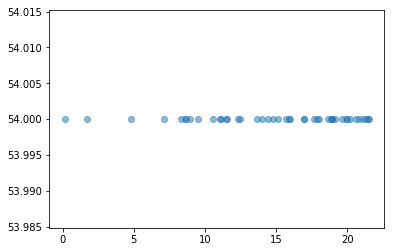

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


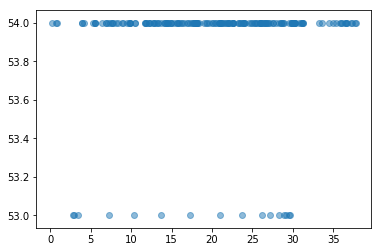

Number of Data Points in Bucket is :  191
Change in SOC WRT speed -0.36630


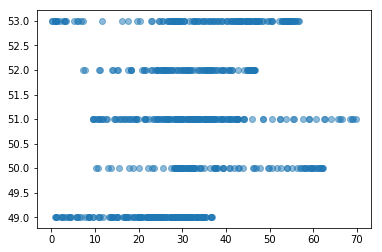

Number of Data Points in Bucket is :  712
Change in SOC WRT speed -6.06061


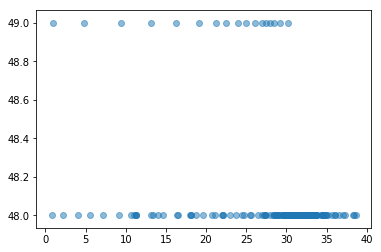

Number of Data Points in Bucket is :  175
Change in SOC WRT speed 4.76190


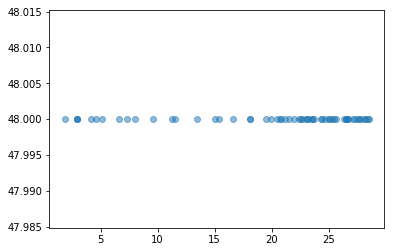

Number of Data Points in Bucket is :  58
Change in SOC WRT speed 0.00000


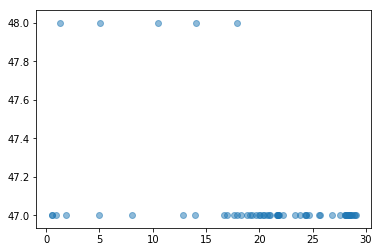

Number of Data Points in Bucket is :  60
Change in SOC WRT speed 1.35135


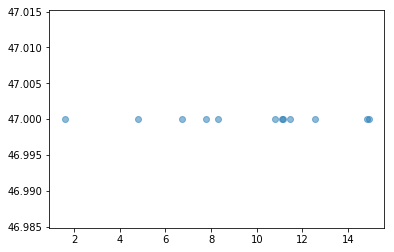

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


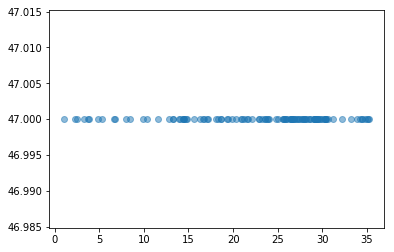

Number of Data Points in Bucket is :  113
Change in SOC WRT speed 0.00000


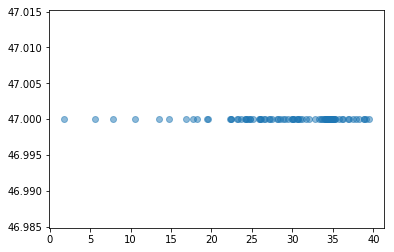

Number of Data Points in Bucket is :  94
Change in SOC WRT speed 0.00000


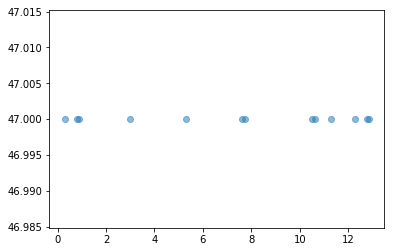

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


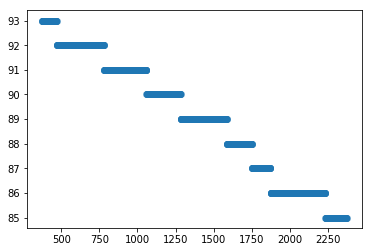

Number of Data Points in Bucket is :  2000
Change in SOC WRT Time -0.00400


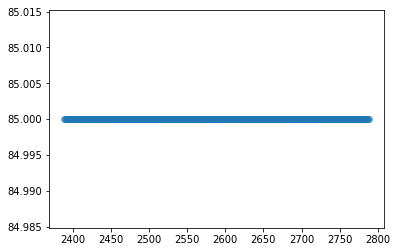

Number of Data Points in Bucket is :  400
Change in SOC WRT Time 0.00000


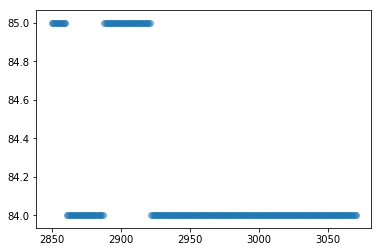

Number of Data Points in Bucket is :  221
Change in SOC WRT Time -0.00455


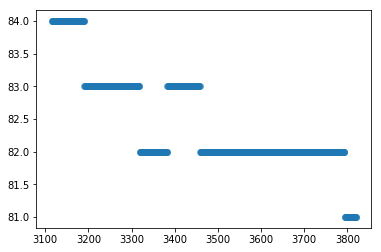

Number of Data Points in Bucket is :  706
Change in SOC WRT Time -0.00426


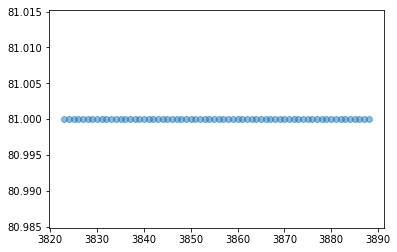

Number of Data Points in Bucket is :  66
Change in SOC WRT Time 0.00000


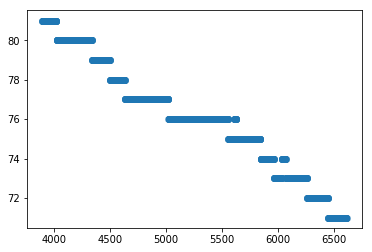

Number of Data Points in Bucket is :  2716
Change in SOC WRT Time -0.00368


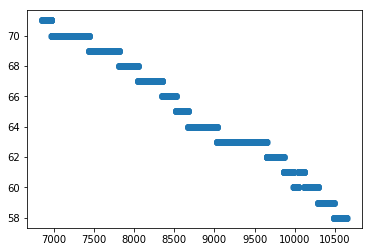

Number of Data Points in Bucket is :  3798
Change in SOC WRT Time -0.00342


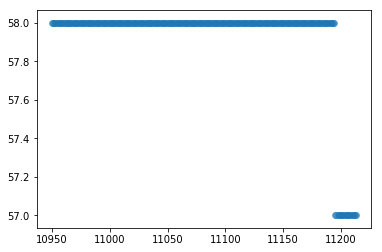

Number of Data Points in Bucket is :  264
Change in SOC WRT Time -0.00380


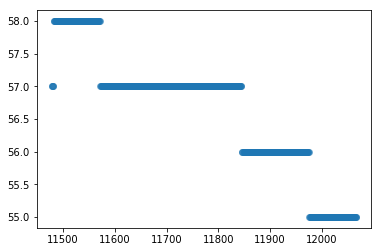

Number of Data Points in Bucket is :  590
Change in SOC WRT Time -0.00340


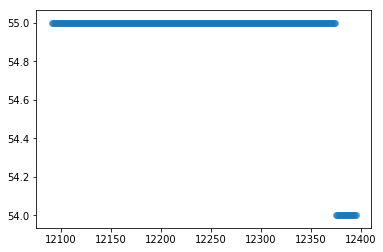

Number of Data Points in Bucket is :  305
Change in SOC WRT Time -0.00329


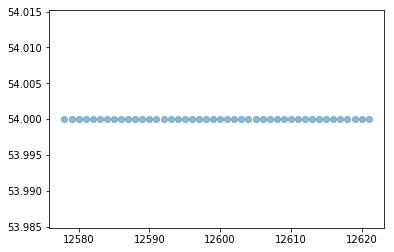

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


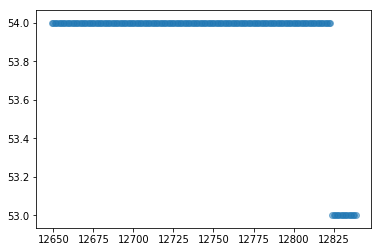

Number of Data Points in Bucket is :  191
Change in SOC WRT Time -0.00526


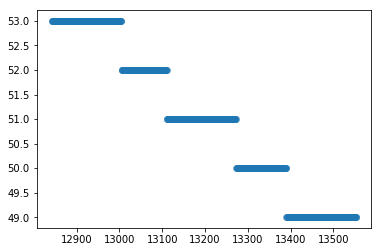

Number of Data Points in Bucket is :  712
Change in SOC WRT Time -0.00563


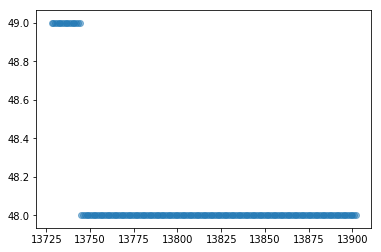

Number of Data Points in Bucket is :  175
Change in SOC WRT Time -0.00575


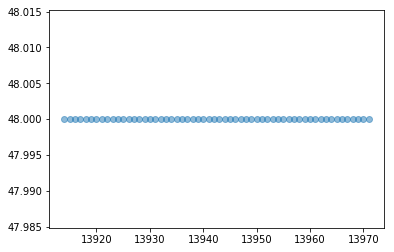

Number of Data Points in Bucket is :  58
Change in SOC WRT Time 0.00000


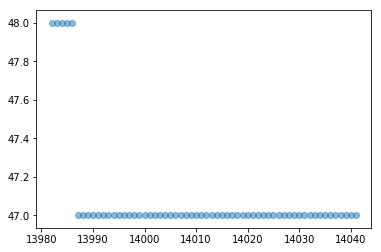

Number of Data Points in Bucket is :  60
Change in SOC WRT Time -0.01695


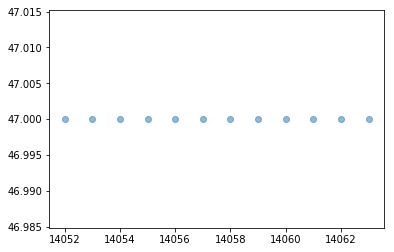

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


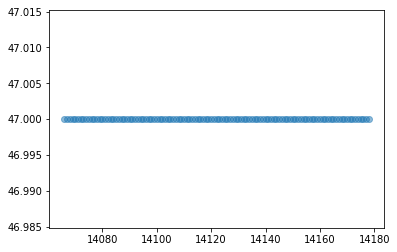

Number of Data Points in Bucket is :  113
Change in SOC WRT Time 0.00000


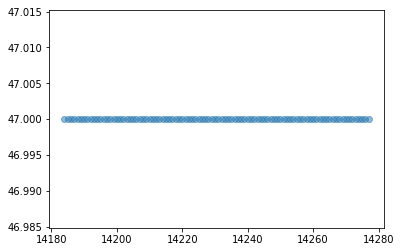

Number of Data Points in Bucket is :  94
Change in SOC WRT Time 0.00000


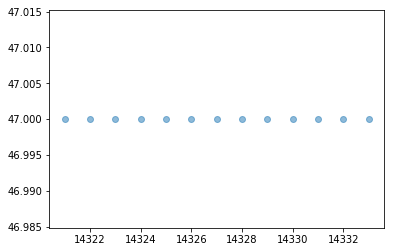

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


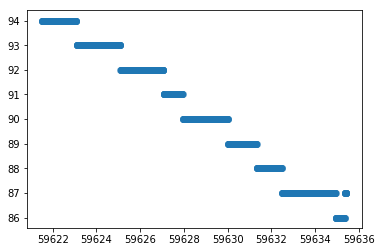

Number of Data Points in Bucket is :  2000
Change in SOC WRT distance -0.50396
Change in distance WRT SOC -1.98429


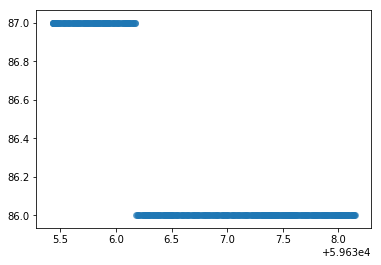

Number of Data Points in Bucket is :  400
Change in SOC WRT distance -0.36765
Change in distance WRT SOC -2.72000


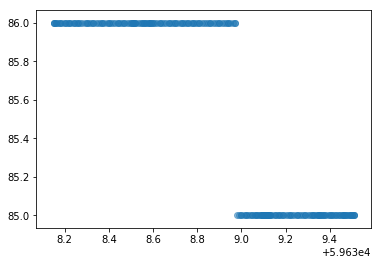

Number of Data Points in Bucket is :  221
Change in SOC WRT distance -0.73529
Change in distance WRT SOC -1.36000


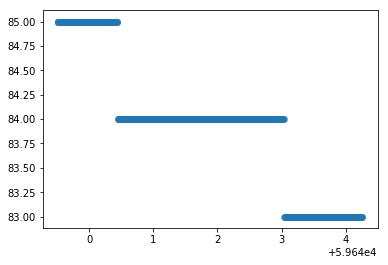

Number of Data Points in Bucket is :  706
Change in SOC WRT distance -0.42283
Change in distance WRT SOC -2.36500


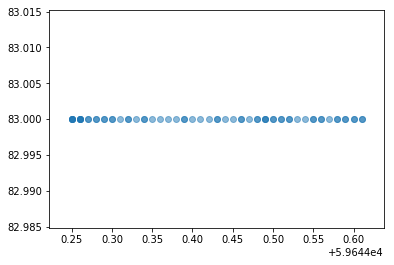

Number of Data Points in Bucket is :  66
Change in SOC WRT distance 0.00000


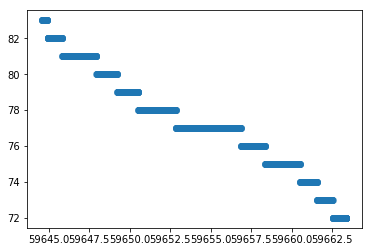

Number of Data Points in Bucket is :  2716
Change in SOC WRT distance -0.58635
Change in distance WRT SOC -1.70545


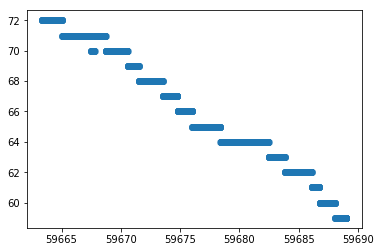

Number of Data Points in Bucket is :  3798
Change in SOC WRT distance -0.50663
Change in distance WRT SOC -1.97385


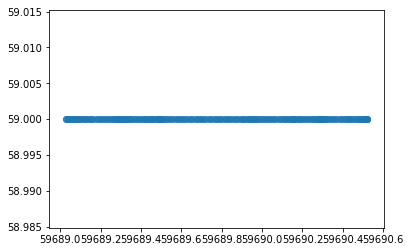

Number of Data Points in Bucket is :  264
Change in SOC WRT distance 0.00000


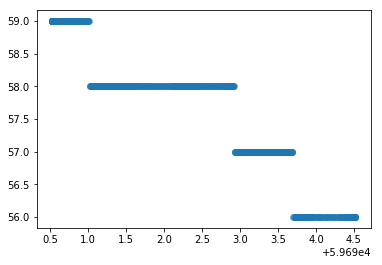

Number of Data Points in Bucket is :  590
Change in SOC WRT distance -0.75188
Change in distance WRT SOC -1.33000


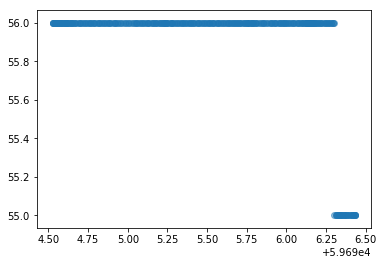

Number of Data Points in Bucket is :  305
Change in SOC WRT distance -0.52632
Change in distance WRT SOC -1.90000


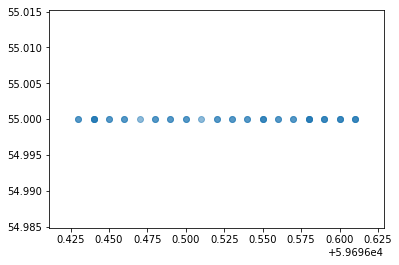

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


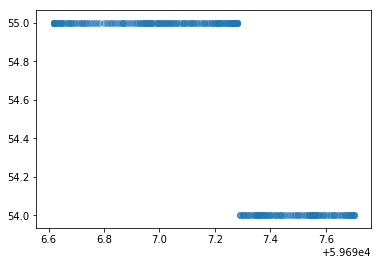

Number of Data Points in Bucket is :  191
Change in SOC WRT distance -0.92593
Change in distance WRT SOC -1.08000


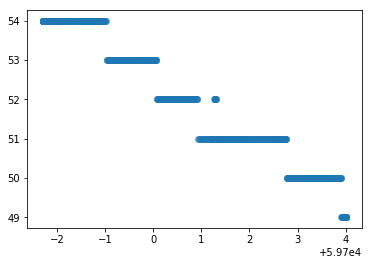

Number of Data Points in Bucket is :  712
Change in SOC WRT distance -0.79239
Change in distance WRT SOC -1.26200


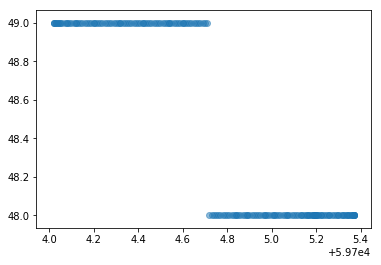

Number of Data Points in Bucket is :  175
Change in SOC WRT distance -0.74074
Change in distance WRT SOC -1.35000


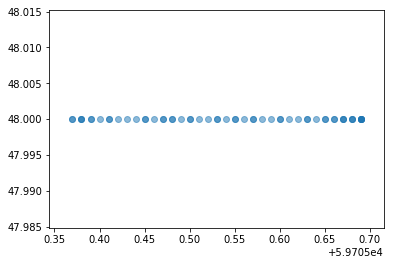

Number of Data Points in Bucket is :  58
Change in SOC WRT distance 0.00000


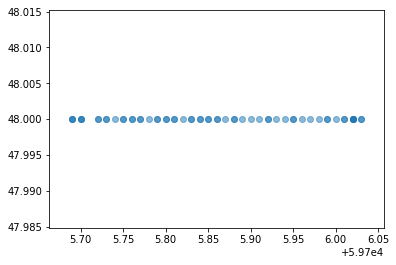

Number of Data Points in Bucket is :  60
Change in SOC WRT distance 0.00000


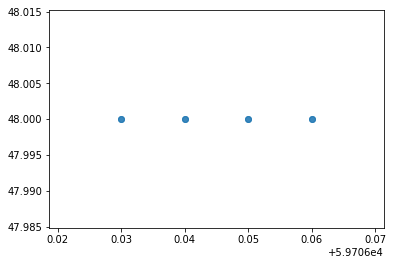

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


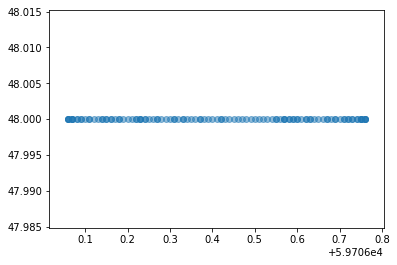

Number of Data Points in Bucket is :  113
Change in SOC WRT distance 0.00000


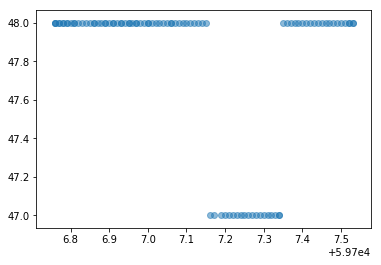

Number of Data Points in Bucket is :  94
Change in SOC WRT distance 0.00000


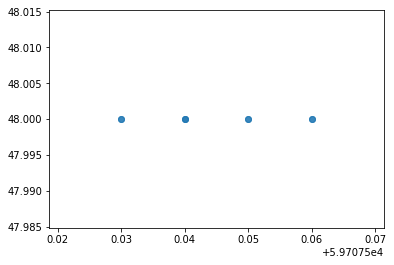

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


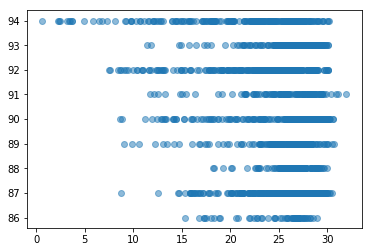

Number of Data Points in Bucket is :  2000
Change in SOC WRT speed -0.85890


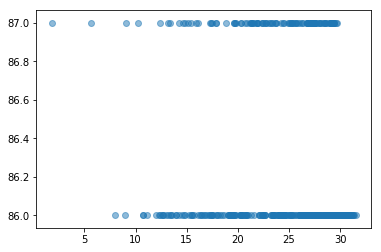

Number of Data Points in Bucket is :  400
Change in SOC WRT speed -0.13947


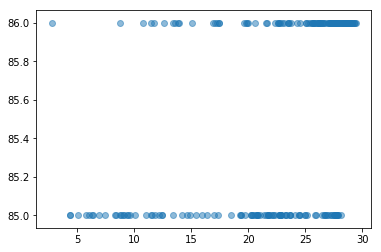

Number of Data Points in Bucket is :  221
Change in SOC WRT speed -0.23981


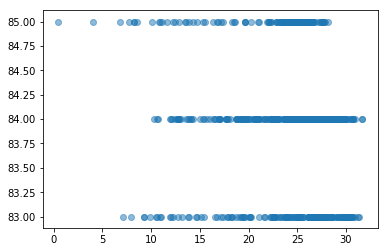

Number of Data Points in Bucket is :  706
Change in SOC WRT speed -0.29895


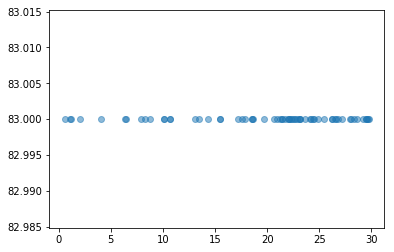

Number of Data Points in Bucket is :  66
Change in SOC WRT speed 0.00000


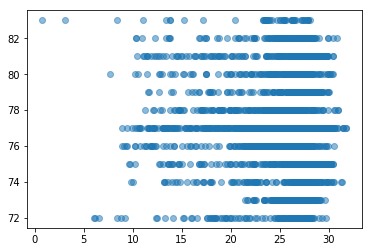

Number of Data Points in Bucket is :  2716
Change in SOC WRT speed -2.02578


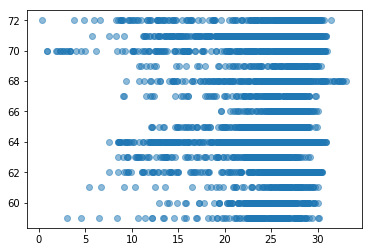

Number of Data Points in Bucket is :  3798
Change in SOC WRT speed -4.83271


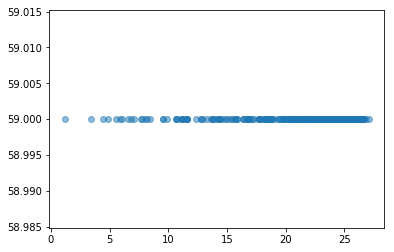

Number of Data Points in Bucket is :  264
Change in SOC WRT speed 0.00000


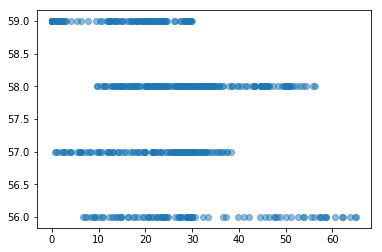

Number of Data Points in Bucket is :  590
Change in SOC WRT speed -0.32223


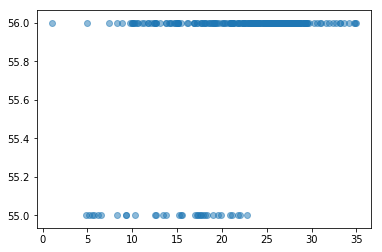

Number of Data Points in Bucket is :  305
Change in SOC WRT speed -0.26385


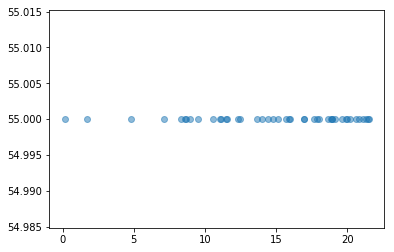

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


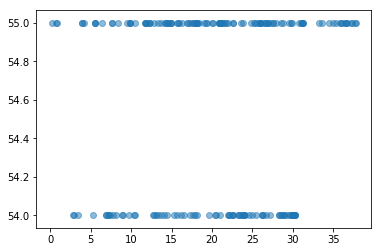

Number of Data Points in Bucket is :  191
Change in SOC WRT speed -0.36630


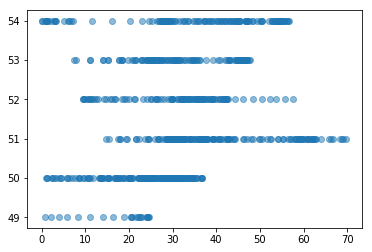

Number of Data Points in Bucket is :  712
Change in SOC WRT speed -7.57576


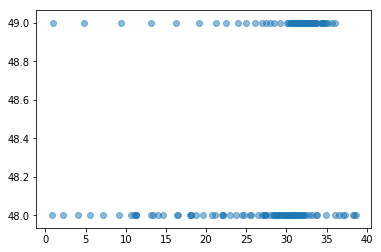

Number of Data Points in Bucket is :  175
Change in SOC WRT speed 4.76190


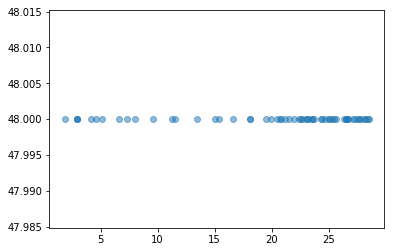

Number of Data Points in Bucket is :  58
Change in SOC WRT speed 0.00000


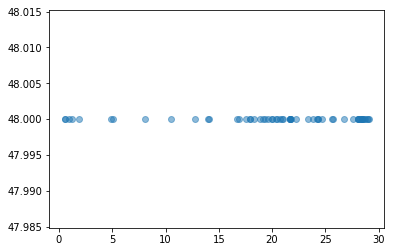

Number of Data Points in Bucket is :  60
Change in SOC WRT speed -0.00000


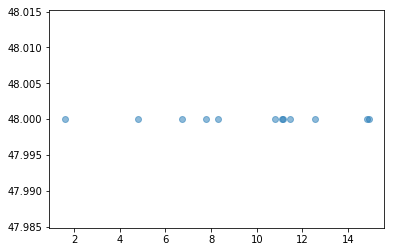

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


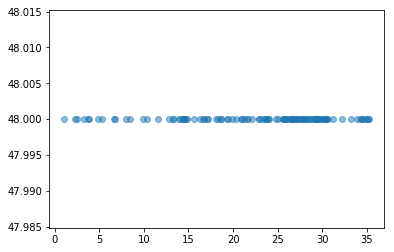

Number of Data Points in Bucket is :  113
Change in SOC WRT speed 0.00000


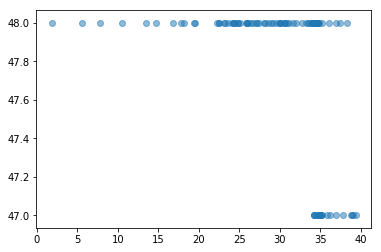

Number of Data Points in Bucket is :  94
Change in SOC WRT speed 0.00000


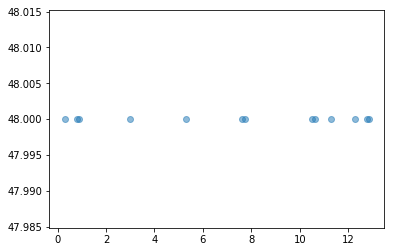

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


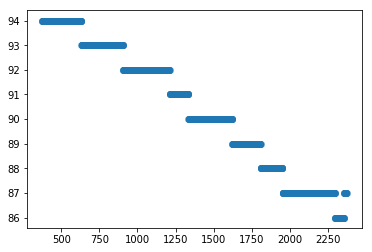

Number of Data Points in Bucket is :  2000
Change in SOC WRT Time -0.00350


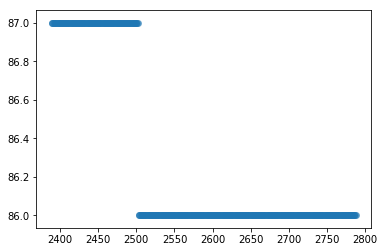

Number of Data Points in Bucket is :  400
Change in SOC WRT Time -0.00251


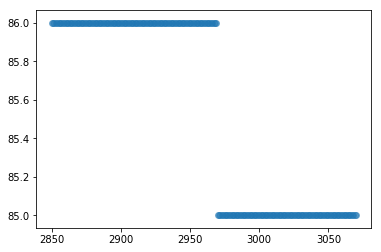

Number of Data Points in Bucket is :  221
Change in SOC WRT Time -0.00455


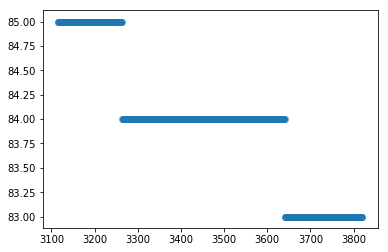

Number of Data Points in Bucket is :  706
Change in SOC WRT Time -0.00284


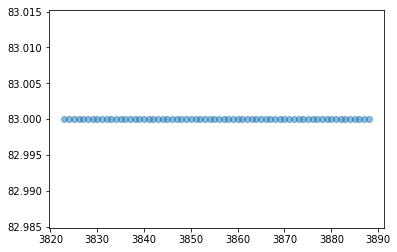

Number of Data Points in Bucket is :  66
Change in SOC WRT Time 0.00000


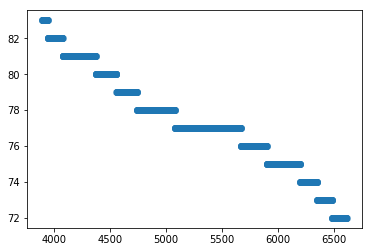

Number of Data Points in Bucket is :  2716
Change in SOC WRT Time -0.00405


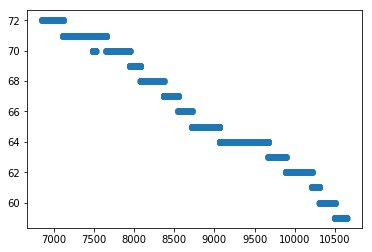

Number of Data Points in Bucket is :  3798
Change in SOC WRT Time -0.00342


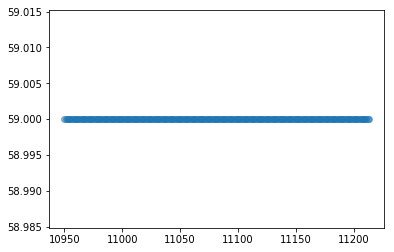

Number of Data Points in Bucket is :  264
Change in SOC WRT Time 0.00000


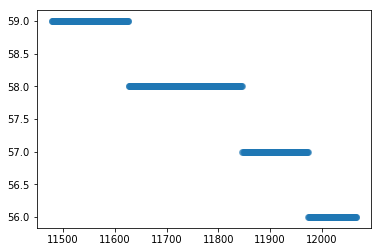

Number of Data Points in Bucket is :  590
Change in SOC WRT Time -0.00509


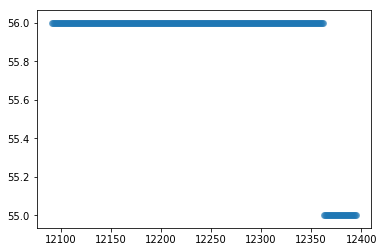

Number of Data Points in Bucket is :  305
Change in SOC WRT Time -0.00329


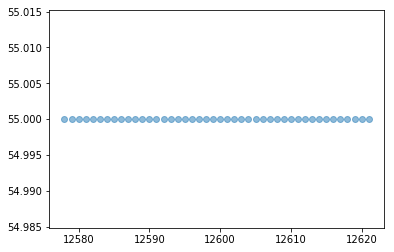

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


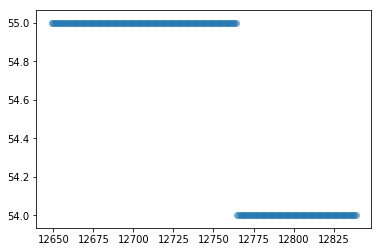

Number of Data Points in Bucket is :  191
Change in SOC WRT Time -0.00526


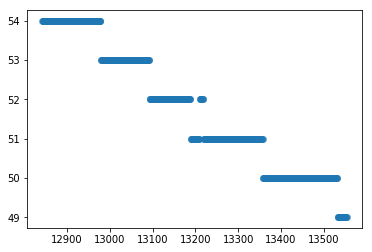

Number of Data Points in Bucket is :  712
Change in SOC WRT Time -0.00703


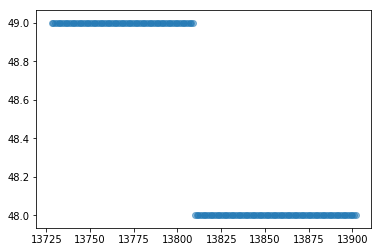

Number of Data Points in Bucket is :  175
Change in SOC WRT Time -0.00575


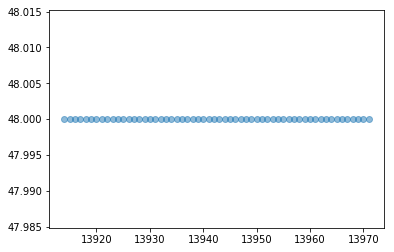

Number of Data Points in Bucket is :  58
Change in SOC WRT Time 0.00000


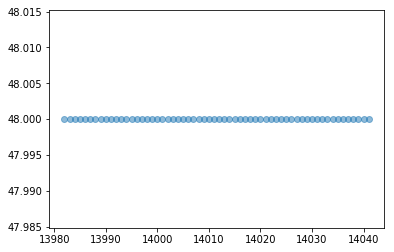

Number of Data Points in Bucket is :  60
Change in SOC WRT Time 0.00000


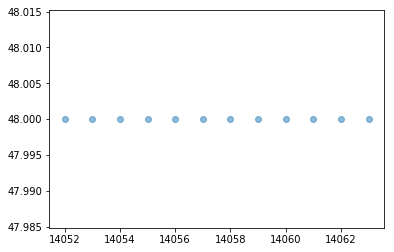

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


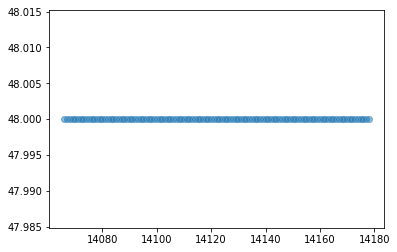

Number of Data Points in Bucket is :  113
Change in SOC WRT Time 0.00000


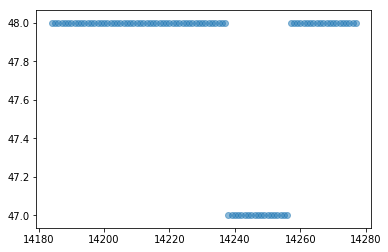

Number of Data Points in Bucket is :  94
Change in SOC WRT Time 0.00000


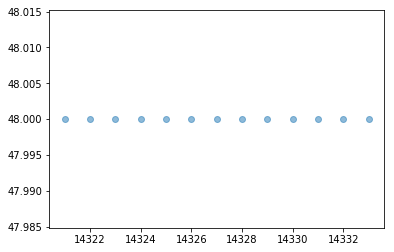

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


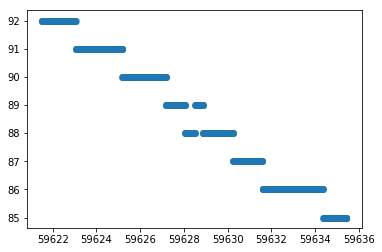

Number of Data Points in Bucket is :  2000
Change in SOC WRT distance -0.50396
Change in distance WRT SOC -1.98429


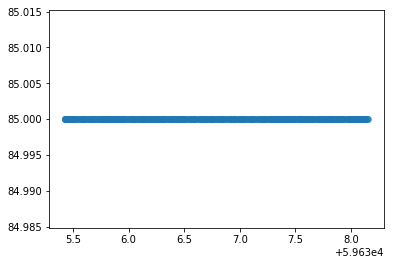

Number of Data Points in Bucket is :  400
Change in SOC WRT distance 0.00000


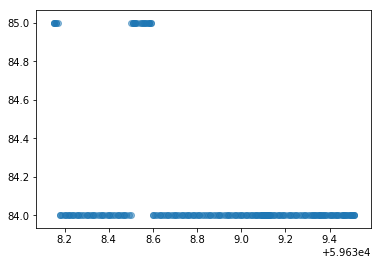

Number of Data Points in Bucket is :  221
Change in SOC WRT distance -0.73529
Change in distance WRT SOC -1.36000


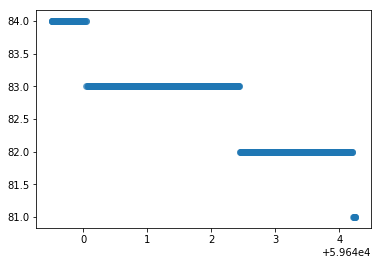

Number of Data Points in Bucket is :  706
Change in SOC WRT distance -0.63425
Change in distance WRT SOC -1.57667


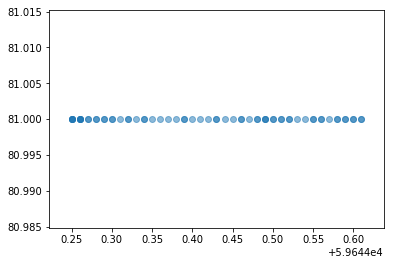

Number of Data Points in Bucket is :  66
Change in SOC WRT distance 0.00000


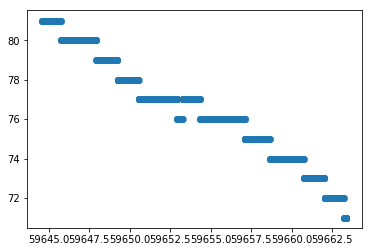

Number of Data Points in Bucket is :  2716
Change in SOC WRT distance -0.53305
Change in distance WRT SOC -1.87600


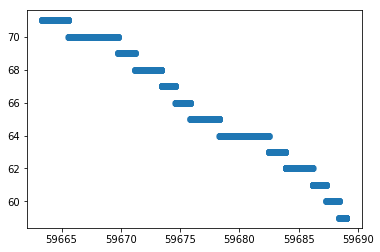

Number of Data Points in Bucket is :  3798
Change in SOC WRT distance -0.46765
Change in distance WRT SOC -2.13833


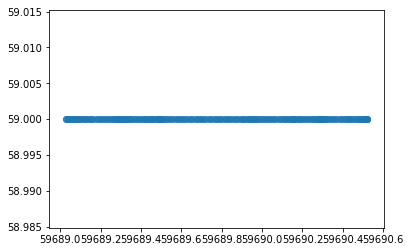

Number of Data Points in Bucket is :  264
Change in SOC WRT distance 0.00000


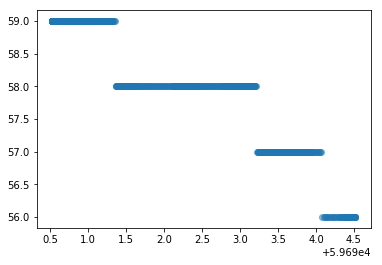

Number of Data Points in Bucket is :  590
Change in SOC WRT distance -0.75188
Change in distance WRT SOC -1.33000


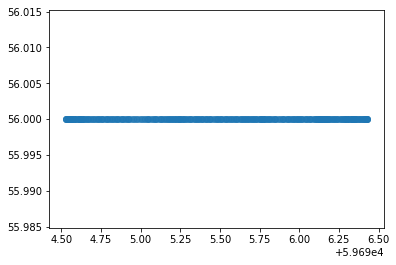

Number of Data Points in Bucket is :  305
Change in SOC WRT distance 0.00000


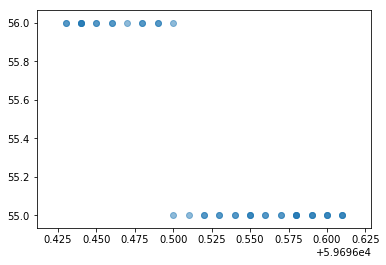

Number of Data Points in Bucket is :  44
Change in SOC WRT distance -5.55556
Change in distance WRT SOC -0.18000


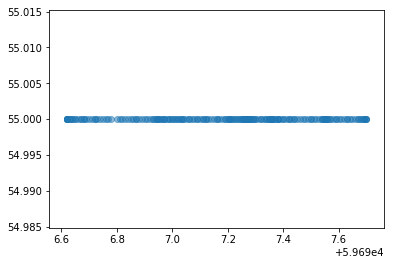

Number of Data Points in Bucket is :  191
Change in SOC WRT distance 0.00000


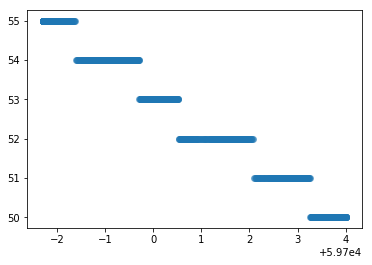

Number of Data Points in Bucket is :  712
Change in SOC WRT distance -0.79239
Change in distance WRT SOC -1.26200


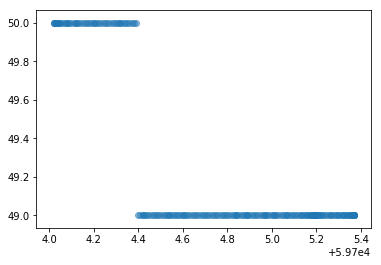

Number of Data Points in Bucket is :  175
Change in SOC WRT distance -0.74074
Change in distance WRT SOC -1.35000


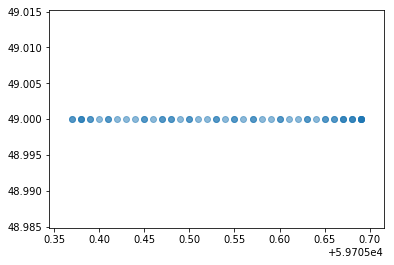

Number of Data Points in Bucket is :  58
Change in SOC WRT distance 0.00000


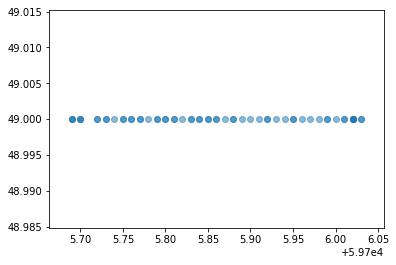

Number of Data Points in Bucket is :  60
Change in SOC WRT distance 0.00000


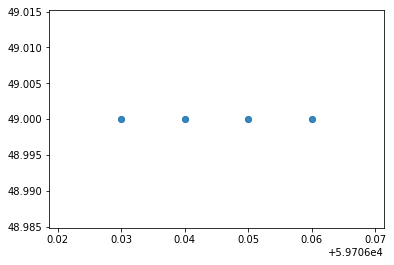

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


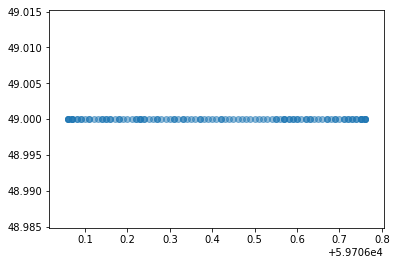

Number of Data Points in Bucket is :  113
Change in SOC WRT distance 0.00000


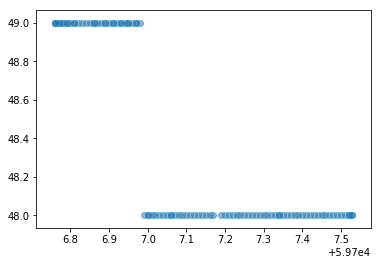

Number of Data Points in Bucket is :  94
Change in SOC WRT distance -1.29870
Change in distance WRT SOC -0.77000


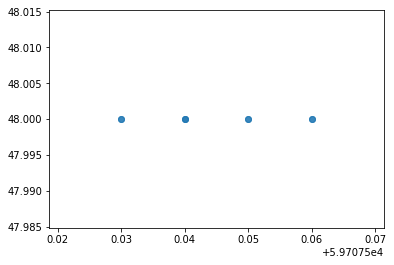

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


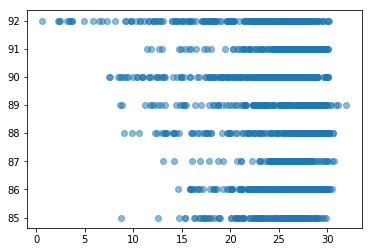

Number of Data Points in Bucket is :  2000
Change in SOC WRT speed -0.85890


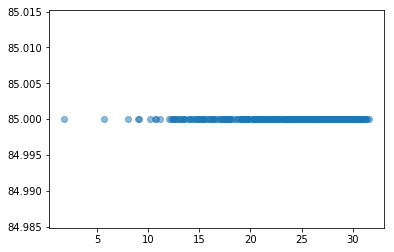

Number of Data Points in Bucket is :  400
Change in SOC WRT speed 0.00000


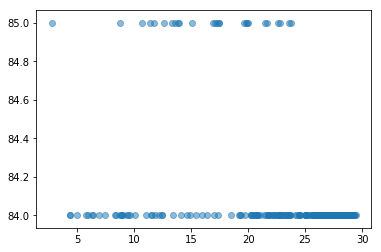

Number of Data Points in Bucket is :  221
Change in SOC WRT speed -0.23981


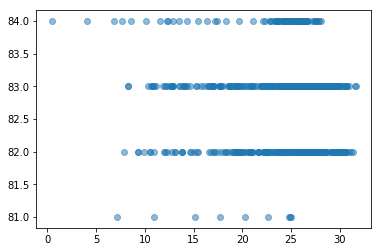

Number of Data Points in Bucket is :  706
Change in SOC WRT speed -0.44843


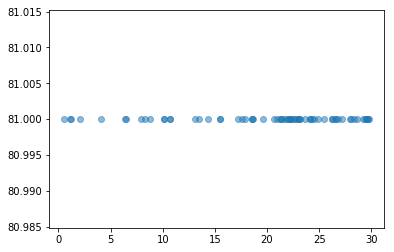

Number of Data Points in Bucket is :  66
Change in SOC WRT speed 0.00000


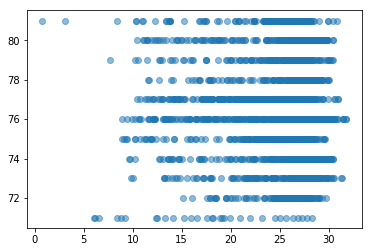

Number of Data Points in Bucket is :  2716
Change in SOC WRT speed -1.84162


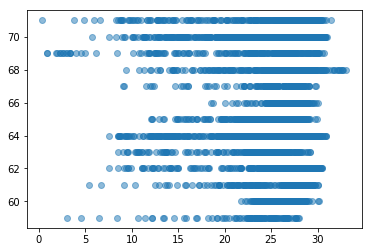

Number of Data Points in Bucket is :  3798
Change in SOC WRT speed -4.46097


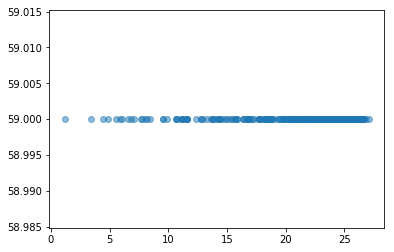

Number of Data Points in Bucket is :  264
Change in SOC WRT speed 0.00000


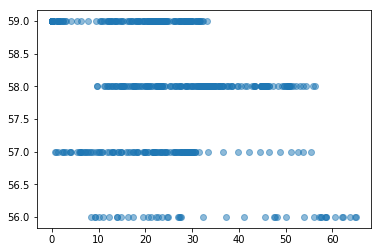

Number of Data Points in Bucket is :  590
Change in SOC WRT speed -0.32223


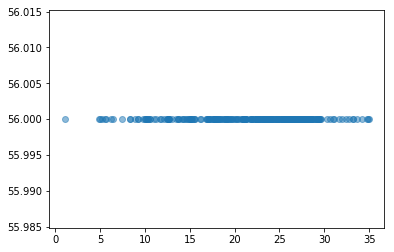

Number of Data Points in Bucket is :  305
Change in SOC WRT speed 0.00000


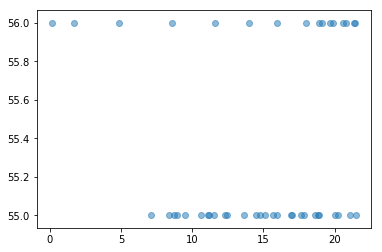

Number of Data Points in Bucket is :  44
Change in SOC WRT speed -0.14306


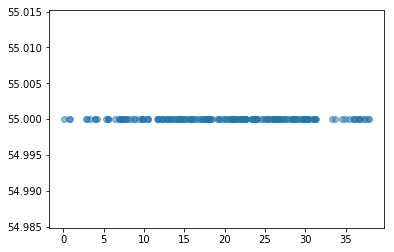

Number of Data Points in Bucket is :  191
Change in SOC WRT speed 0.00000


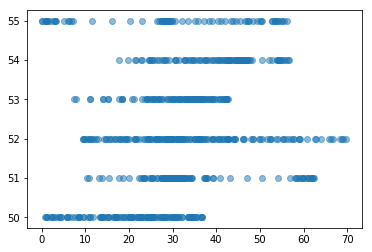

Number of Data Points in Bucket is :  712
Change in SOC WRT speed -7.57576


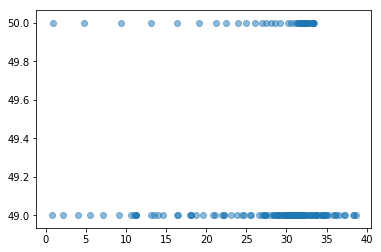

Number of Data Points in Bucket is :  175
Change in SOC WRT speed 4.76190


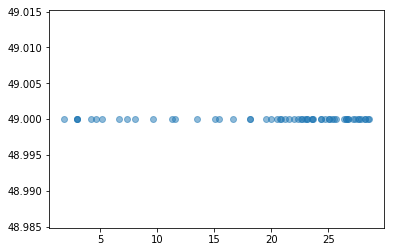

Number of Data Points in Bucket is :  58
Change in SOC WRT speed 0.00000


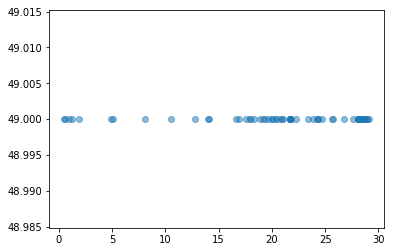

Number of Data Points in Bucket is :  60
Change in SOC WRT speed -0.00000


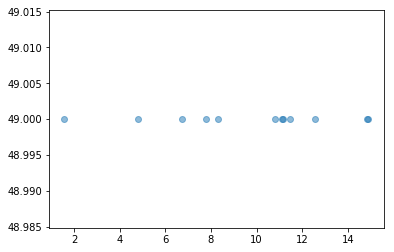

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


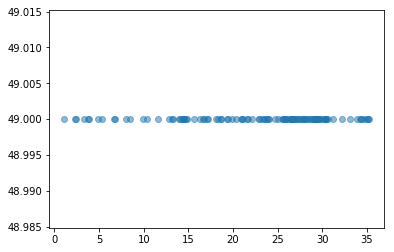

Number of Data Points in Bucket is :  113
Change in SOC WRT speed 0.00000


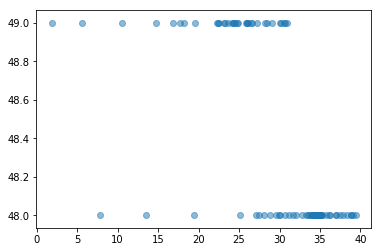

Number of Data Points in Bucket is :  94
Change in SOC WRT speed -0.16722


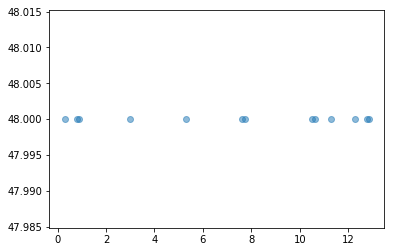

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


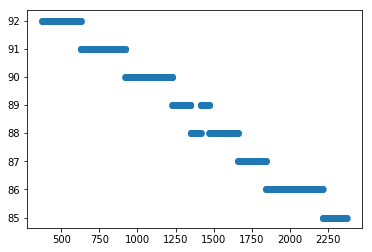

Number of Data Points in Bucket is :  2000
Change in SOC WRT Time -0.00350


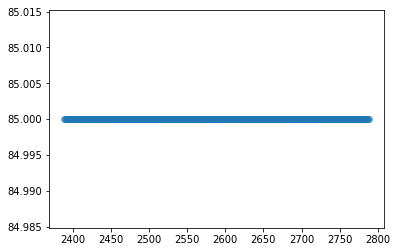

Number of Data Points in Bucket is :  400
Change in SOC WRT Time 0.00000


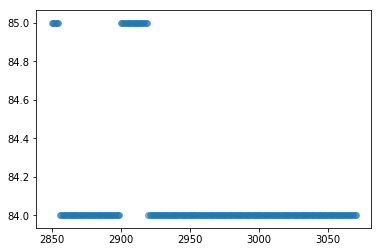

Number of Data Points in Bucket is :  221
Change in SOC WRT Time -0.00455


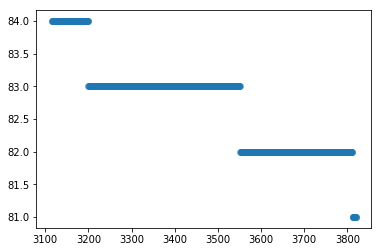

Number of Data Points in Bucket is :  706
Change in SOC WRT Time -0.00426


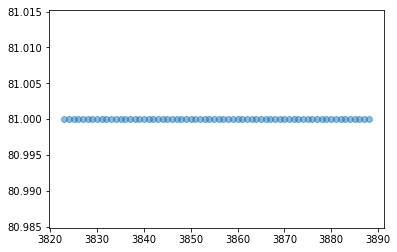

Number of Data Points in Bucket is :  66
Change in SOC WRT Time 0.00000


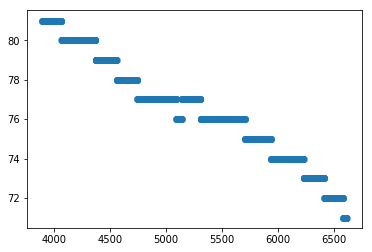

Number of Data Points in Bucket is :  2716
Change in SOC WRT Time -0.00368


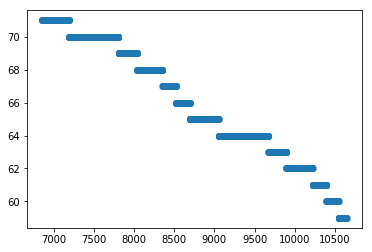

Number of Data Points in Bucket is :  3798
Change in SOC WRT Time -0.00316


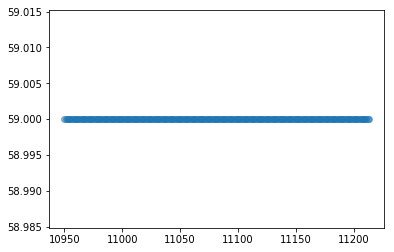

Number of Data Points in Bucket is :  264
Change in SOC WRT Time 0.00000


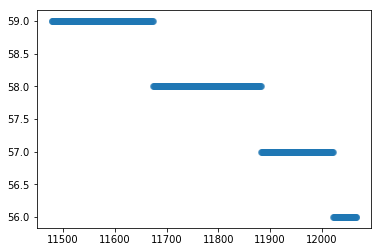

Number of Data Points in Bucket is :  590
Change in SOC WRT Time -0.00509


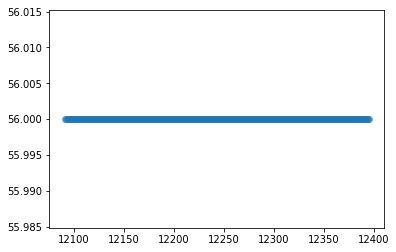

Number of Data Points in Bucket is :  305
Change in SOC WRT Time 0.00000


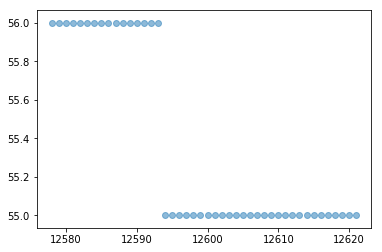

Number of Data Points in Bucket is :  44
Change in SOC WRT Time -0.02326


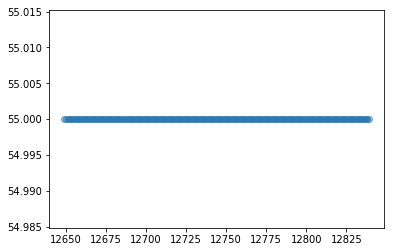

Number of Data Points in Bucket is :  191
Change in SOC WRT Time 0.00000


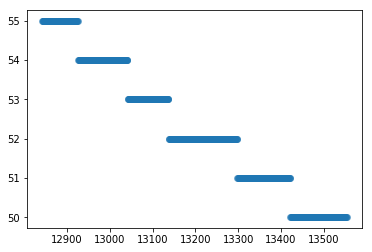

Number of Data Points in Bucket is :  712
Change in SOC WRT Time -0.00703


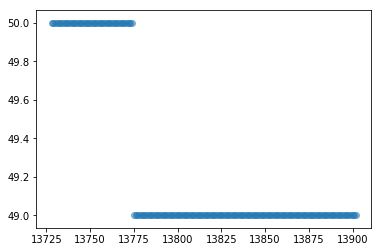

Number of Data Points in Bucket is :  175
Change in SOC WRT Time -0.00575


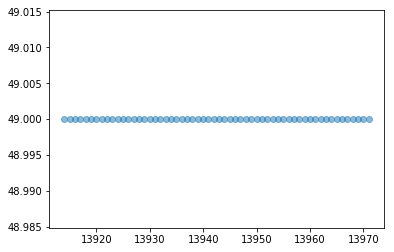

Number of Data Points in Bucket is :  58
Change in SOC WRT Time 0.00000


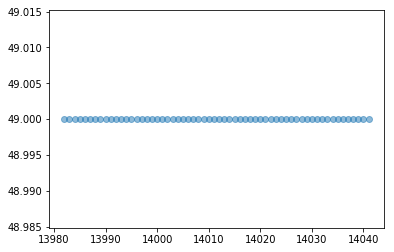

Number of Data Points in Bucket is :  60
Change in SOC WRT Time 0.00000


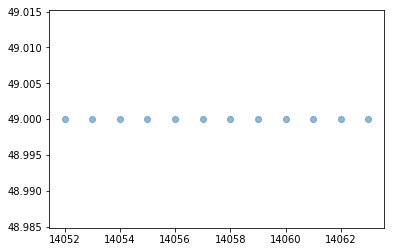

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


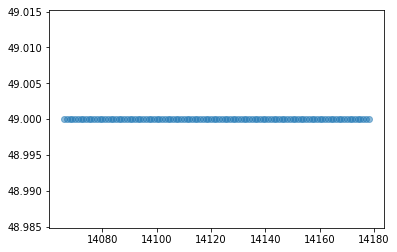

Number of Data Points in Bucket is :  113
Change in SOC WRT Time 0.00000


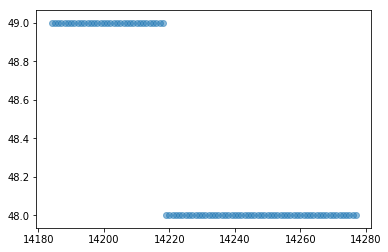

Number of Data Points in Bucket is :  94
Change in SOC WRT Time -0.01075


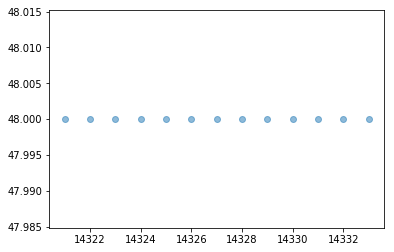

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


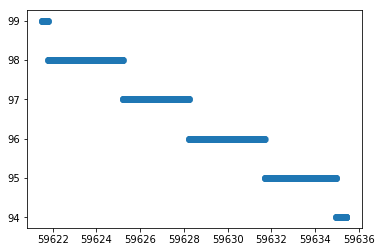

Number of Data Points in Bucket is :  2000
Change in SOC WRT distance -0.35997
Change in distance WRT SOC -2.77800


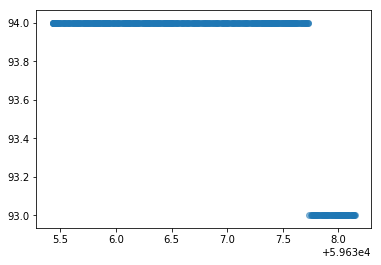

Number of Data Points in Bucket is :  400
Change in SOC WRT distance -0.36765
Change in distance WRT SOC -2.72000


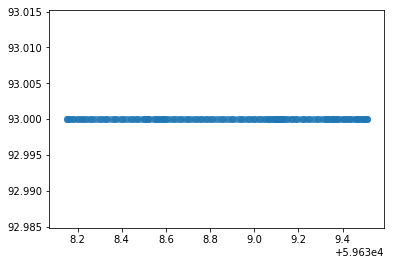

Number of Data Points in Bucket is :  221
Change in SOC WRT distance 0.00000


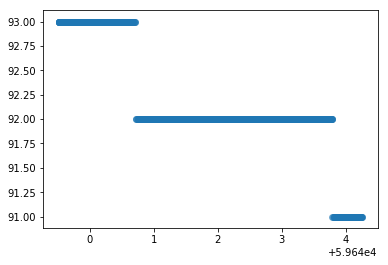

Number of Data Points in Bucket is :  706
Change in SOC WRT distance -0.42283
Change in distance WRT SOC -2.36500


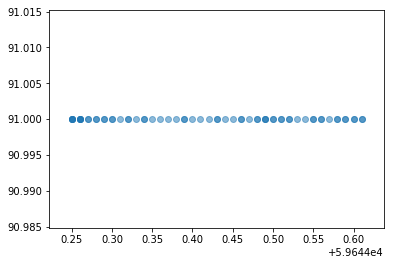

Number of Data Points in Bucket is :  66
Change in SOC WRT distance 0.00000


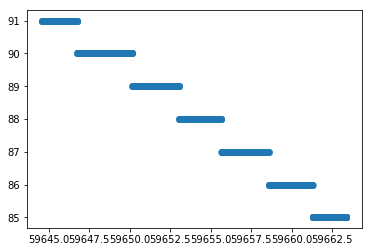

Number of Data Points in Bucket is :  2716
Change in SOC WRT distance -0.31983
Change in distance WRT SOC -3.12667


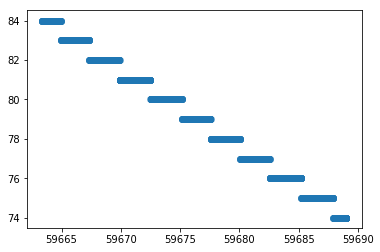

Number of Data Points in Bucket is :  3798
Change in SOC WRT distance -0.38971
Change in distance WRT SOC -2.56600


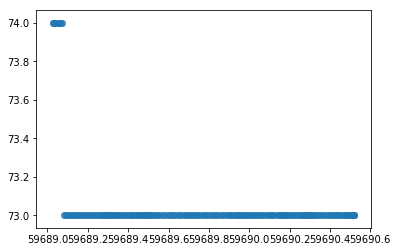

Number of Data Points in Bucket is :  264
Change in SOC WRT distance -0.67114
Change in distance WRT SOC -1.49000


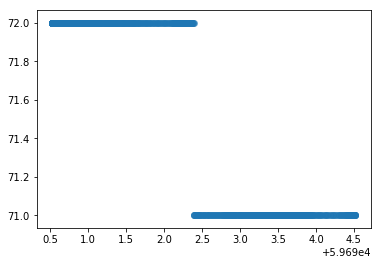

Number of Data Points in Bucket is :  590
Change in SOC WRT distance -0.25063
Change in distance WRT SOC -3.99000


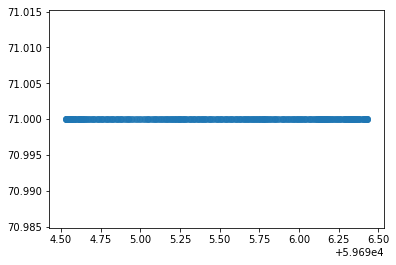

Number of Data Points in Bucket is :  305
Change in SOC WRT distance 0.00000


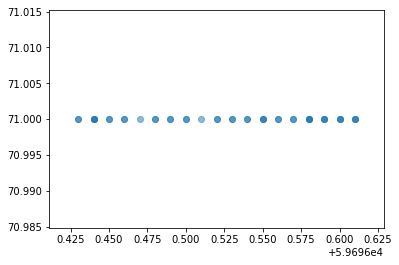

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


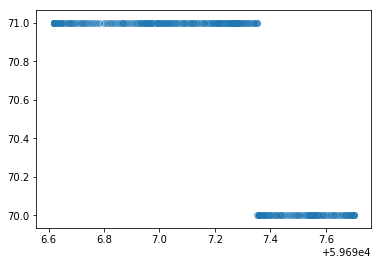

Number of Data Points in Bucket is :  191
Change in SOC WRT distance -0.92593
Change in distance WRT SOC -1.08000


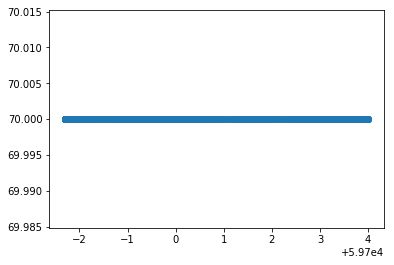

Number of Data Points in Bucket is :  712
Change in SOC WRT distance 0.00000


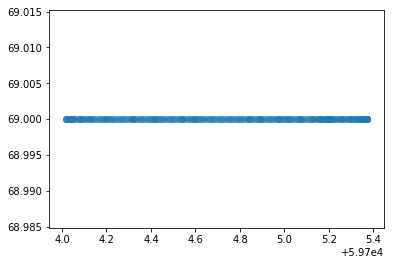

Number of Data Points in Bucket is :  175
Change in SOC WRT distance 0.00000


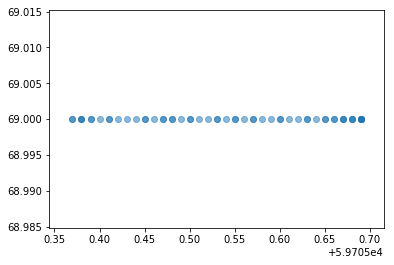

Number of Data Points in Bucket is :  58
Change in SOC WRT distance 0.00000


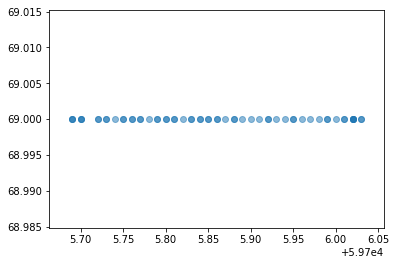

Number of Data Points in Bucket is :  60
Change in SOC WRT distance 0.00000


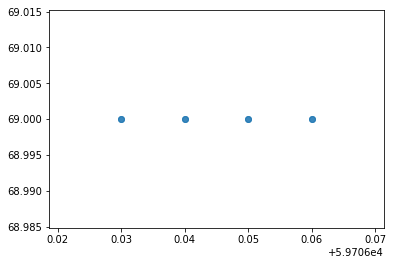

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


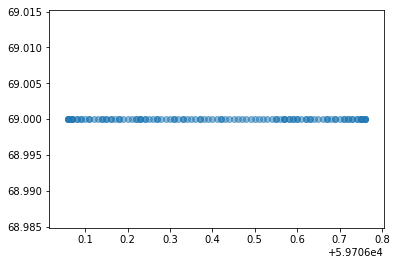

Number of Data Points in Bucket is :  113
Change in SOC WRT distance 0.00000


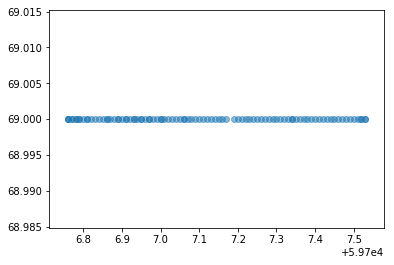

Number of Data Points in Bucket is :  94
Change in SOC WRT distance 0.00000


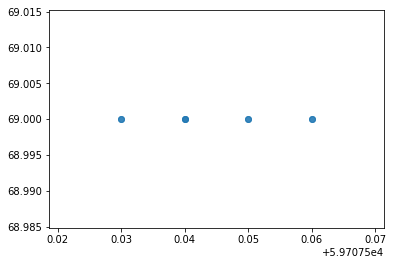

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


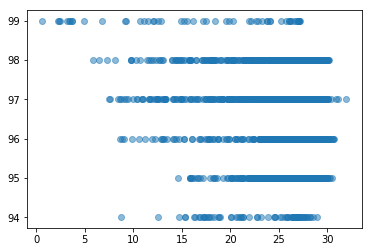

Number of Data Points in Bucket is :  2000
Change in SOC WRT speed -0.61350


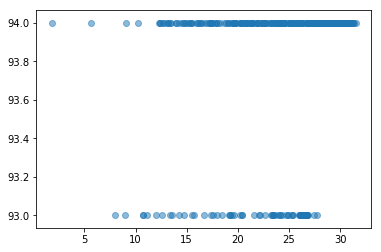

Number of Data Points in Bucket is :  400
Change in SOC WRT speed -0.13947


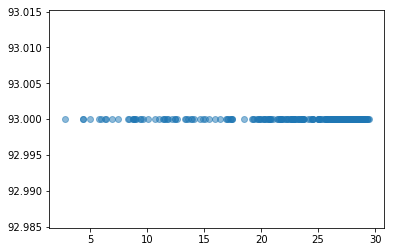

Number of Data Points in Bucket is :  221
Change in SOC WRT speed 0.00000


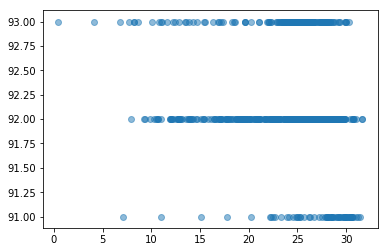

Number of Data Points in Bucket is :  706
Change in SOC WRT speed -0.29895


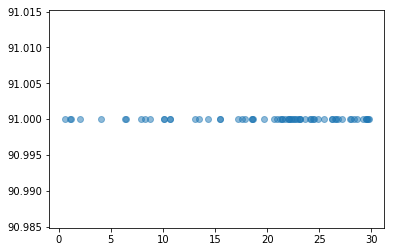

Number of Data Points in Bucket is :  66
Change in SOC WRT speed 0.00000


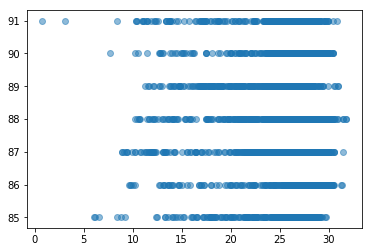

Number of Data Points in Bucket is :  2716
Change in SOC WRT speed -1.10497


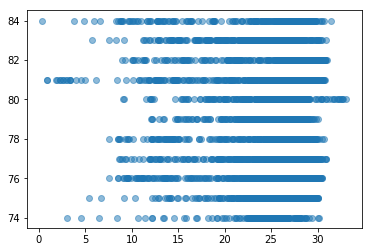

Number of Data Points in Bucket is :  3798
Change in SOC WRT speed -3.71747


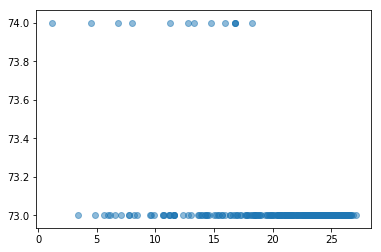

Number of Data Points in Bucket is :  264
Change in SOC WRT speed -0.44843


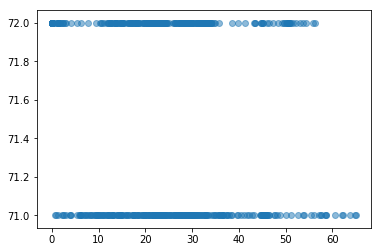

Number of Data Points in Bucket is :  590
Change in SOC WRT speed -0.10741


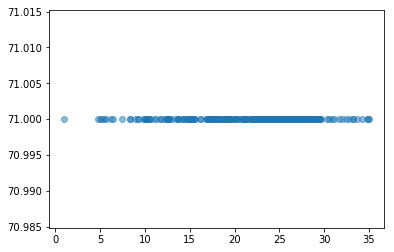

Number of Data Points in Bucket is :  305
Change in SOC WRT speed 0.00000


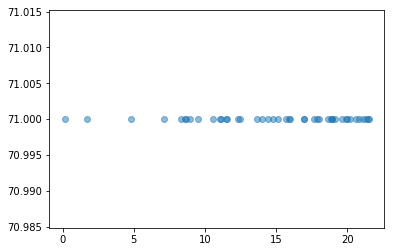

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


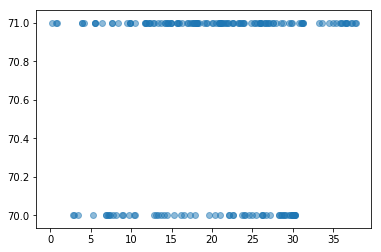

Number of Data Points in Bucket is :  191
Change in SOC WRT speed -0.36630


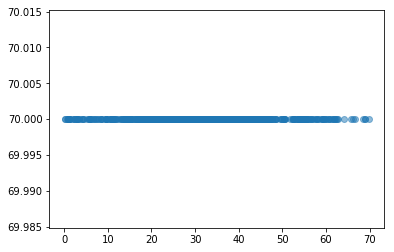

Number of Data Points in Bucket is :  712
Change in SOC WRT speed 0.00000


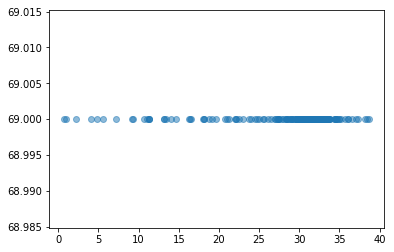

Number of Data Points in Bucket is :  175
Change in SOC WRT speed -0.00000


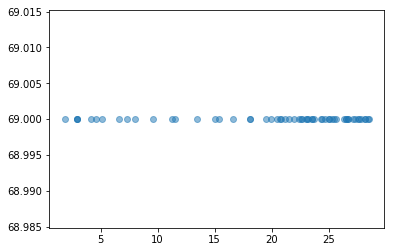

Number of Data Points in Bucket is :  58
Change in SOC WRT speed 0.00000


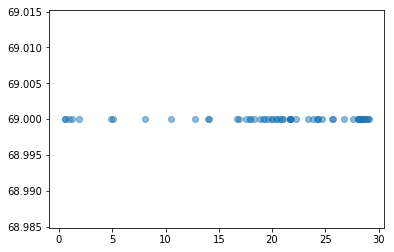

Number of Data Points in Bucket is :  60
Change in SOC WRT speed -0.00000


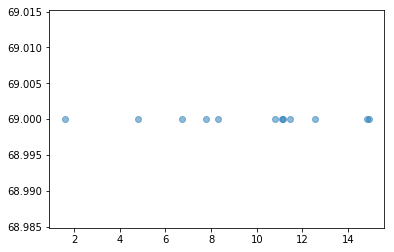

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


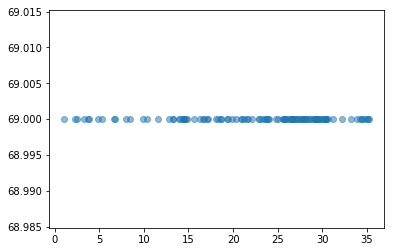

Number of Data Points in Bucket is :  113
Change in SOC WRT speed 0.00000


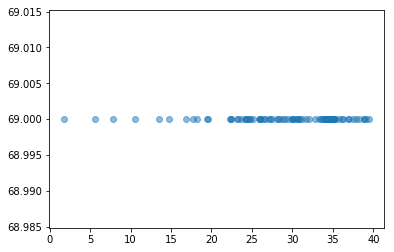

Number of Data Points in Bucket is :  94
Change in SOC WRT speed 0.00000


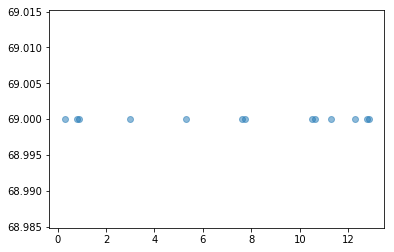

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


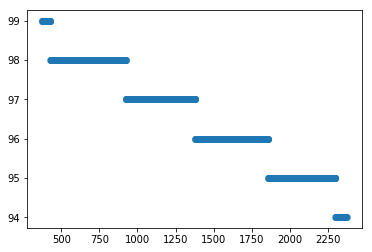

Number of Data Points in Bucket is :  2000
Change in SOC WRT Time -0.00250


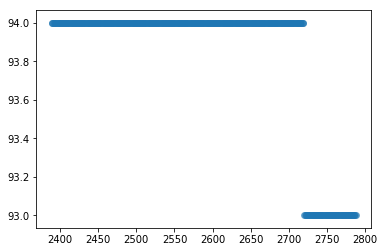

Number of Data Points in Bucket is :  400
Change in SOC WRT Time -0.00251


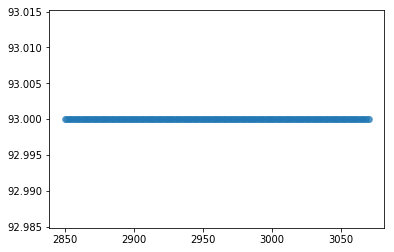

Number of Data Points in Bucket is :  221
Change in SOC WRT Time 0.00000


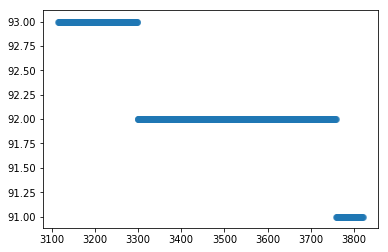

Number of Data Points in Bucket is :  706
Change in SOC WRT Time -0.00284


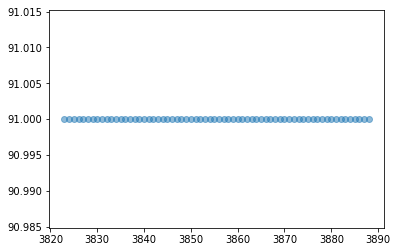

Number of Data Points in Bucket is :  66
Change in SOC WRT Time 0.00000


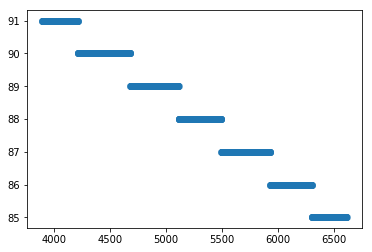

Number of Data Points in Bucket is :  2716
Change in SOC WRT Time -0.00221


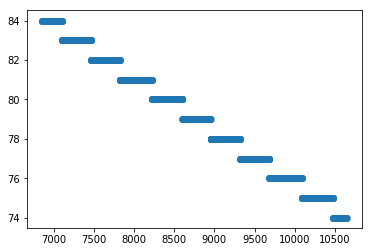

Number of Data Points in Bucket is :  3798
Change in SOC WRT Time -0.00263


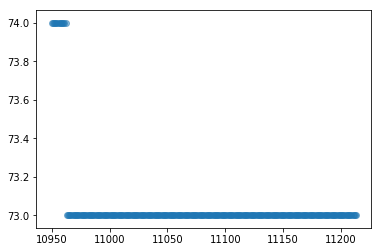

Number of Data Points in Bucket is :  264
Change in SOC WRT Time -0.00380


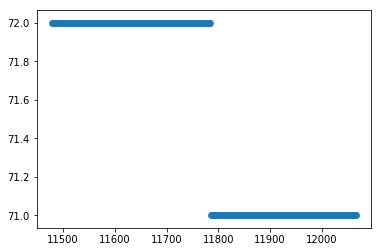

Number of Data Points in Bucket is :  590
Change in SOC WRT Time -0.00170


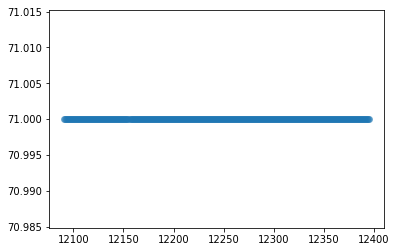

Number of Data Points in Bucket is :  305
Change in SOC WRT Time 0.00000


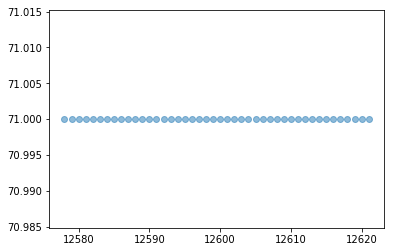

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


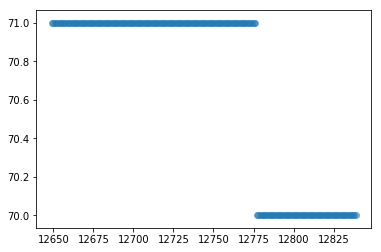

Number of Data Points in Bucket is :  191
Change in SOC WRT Time -0.00526


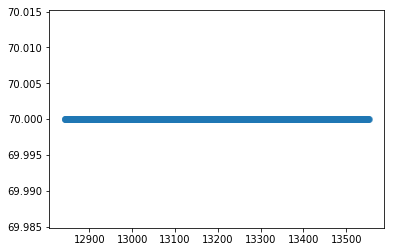

Number of Data Points in Bucket is :  712
Change in SOC WRT Time 0.00000


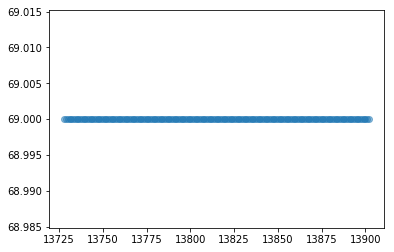

Number of Data Points in Bucket is :  175
Change in SOC WRT Time 0.00000


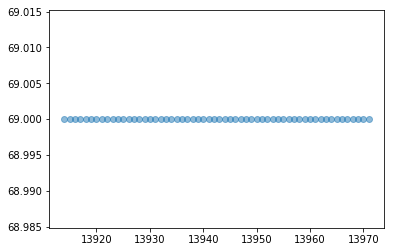

Number of Data Points in Bucket is :  58
Change in SOC WRT Time 0.00000


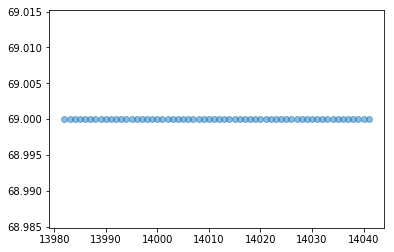

Number of Data Points in Bucket is :  60
Change in SOC WRT Time 0.00000


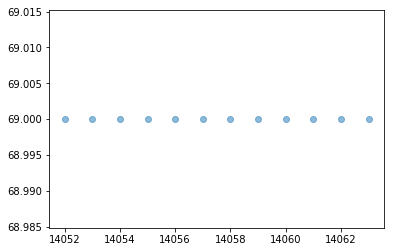

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


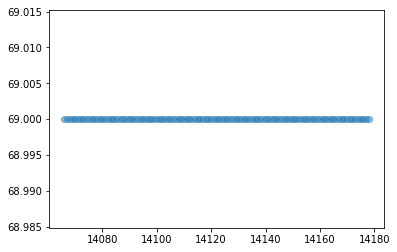

Number of Data Points in Bucket is :  113
Change in SOC WRT Time 0.00000


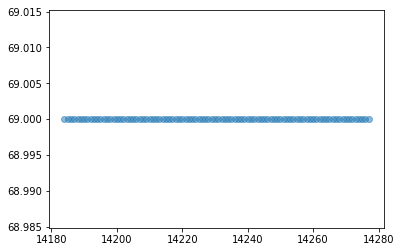

Number of Data Points in Bucket is :  94
Change in SOC WRT Time 0.00000


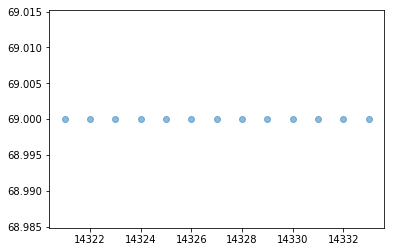

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000


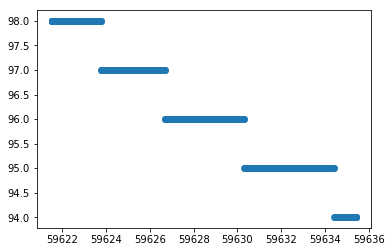

Number of Data Points in Bucket is :  2000
Change in SOC WRT distance -0.28798
Change in distance WRT SOC -3.47250


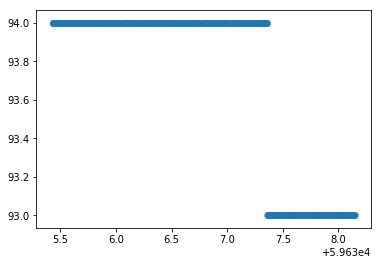

Number of Data Points in Bucket is :  400
Change in SOC WRT distance -0.36765
Change in distance WRT SOC -2.72000


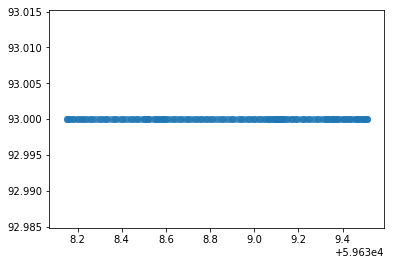

Number of Data Points in Bucket is :  221
Change in SOC WRT distance 0.00000


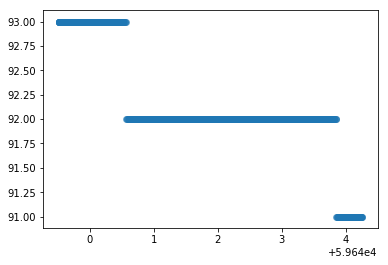

Number of Data Points in Bucket is :  706
Change in SOC WRT distance -0.42283
Change in distance WRT SOC -2.36500


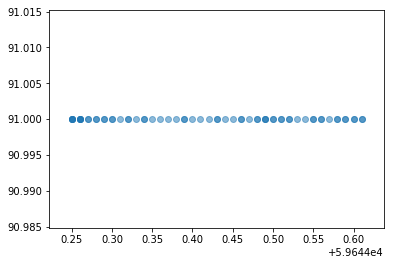

Number of Data Points in Bucket is :  66
Change in SOC WRT distance 0.00000


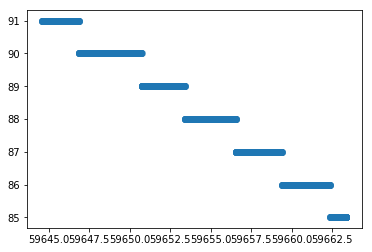

Number of Data Points in Bucket is :  2716
Change in SOC WRT distance -0.31983
Change in distance WRT SOC -3.12667


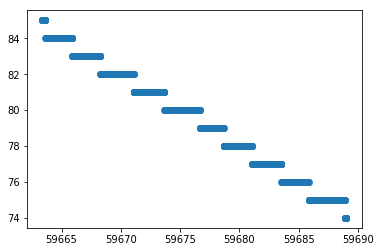

Number of Data Points in Bucket is :  3798
Change in SOC WRT distance -0.42868
Change in distance WRT SOC -2.33273


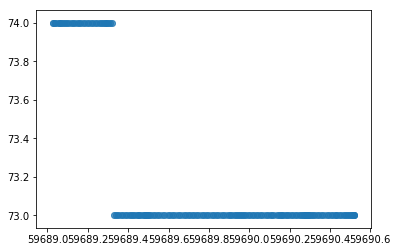

Number of Data Points in Bucket is :  264
Change in SOC WRT distance -0.67114
Change in distance WRT SOC -1.49000


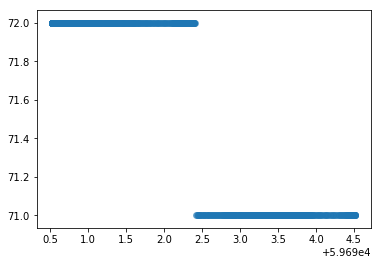

Number of Data Points in Bucket is :  590
Change in SOC WRT distance -0.25063
Change in distance WRT SOC -3.99000


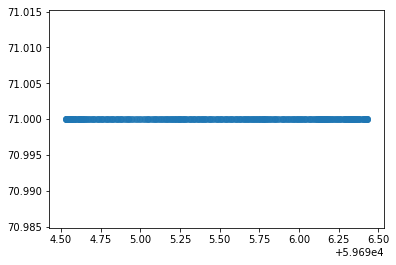

Number of Data Points in Bucket is :  305
Change in SOC WRT distance 0.00000


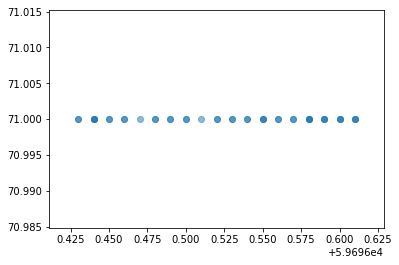

Number of Data Points in Bucket is :  44
Change in SOC WRT distance 0.00000


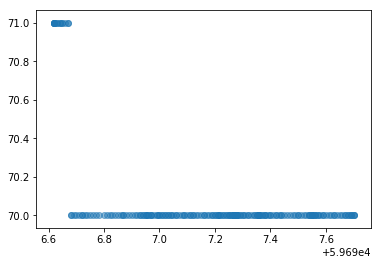

Number of Data Points in Bucket is :  191
Change in SOC WRT distance -0.92593
Change in distance WRT SOC -1.08000


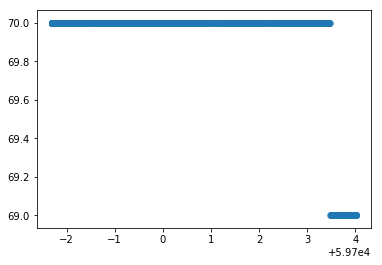

Number of Data Points in Bucket is :  712
Change in SOC WRT distance -0.15848
Change in distance WRT SOC -6.31000


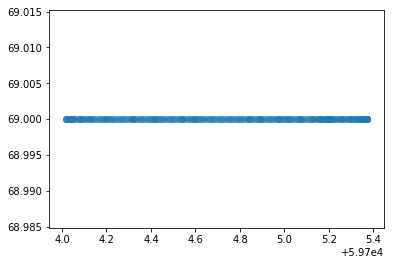

Number of Data Points in Bucket is :  175
Change in SOC WRT distance 0.00000


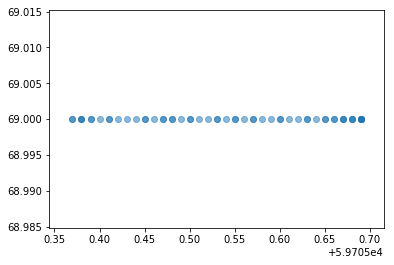

Number of Data Points in Bucket is :  58
Change in SOC WRT distance 0.00000


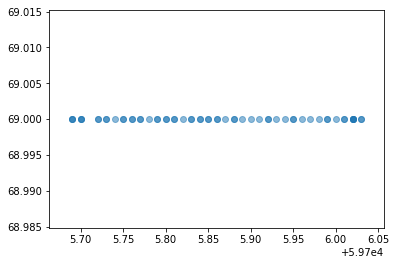

Number of Data Points in Bucket is :  60
Change in SOC WRT distance 0.00000


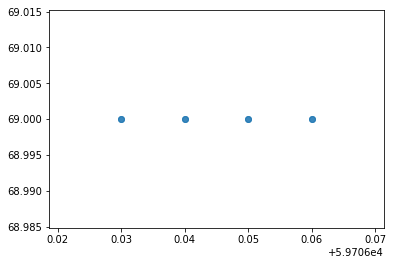

Number of Data Points in Bucket is :  12
Change in SOC WRT distance 0.00000


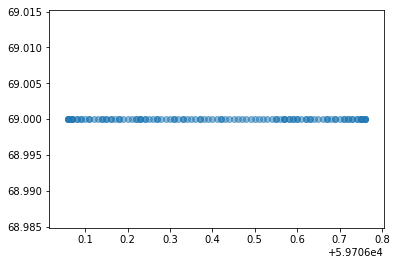

Number of Data Points in Bucket is :  113
Change in SOC WRT distance 0.00000


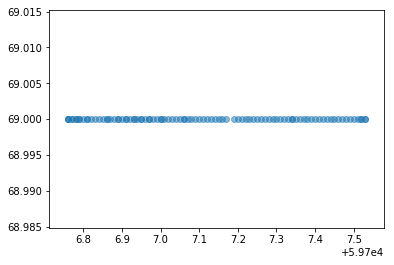

Number of Data Points in Bucket is :  94
Change in SOC WRT distance 0.00000


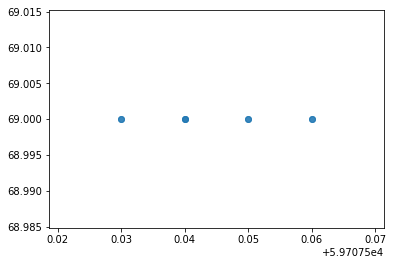

Number of Data Points in Bucket is :  13
Change in SOC WRT distance 0.00000


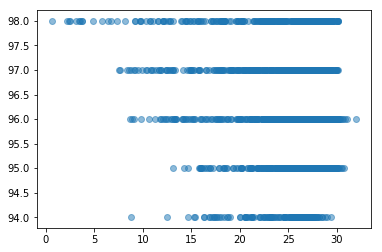

Number of Data Points in Bucket is :  2000
Change in SOC WRT speed -0.49080


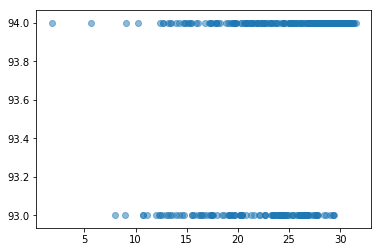

Number of Data Points in Bucket is :  400
Change in SOC WRT speed -0.13947


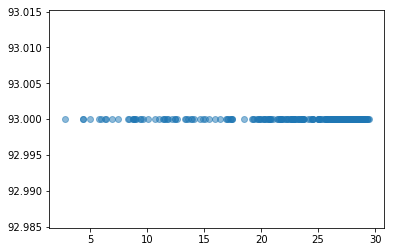

Number of Data Points in Bucket is :  221
Change in SOC WRT speed 0.00000


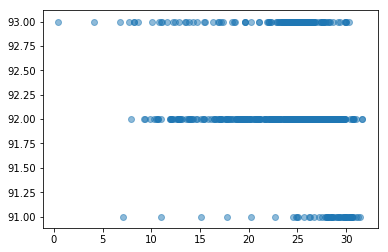

Number of Data Points in Bucket is :  706
Change in SOC WRT speed -0.29895


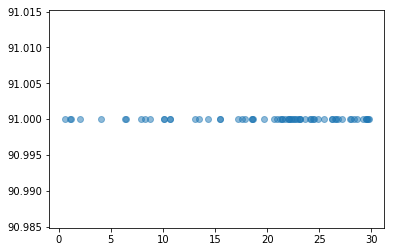

Number of Data Points in Bucket is :  66
Change in SOC WRT speed 0.00000


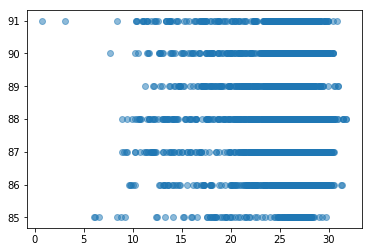

Number of Data Points in Bucket is :  2716
Change in SOC WRT speed -1.10497


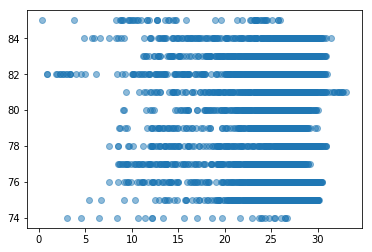

Number of Data Points in Bucket is :  3798
Change in SOC WRT speed -4.08922


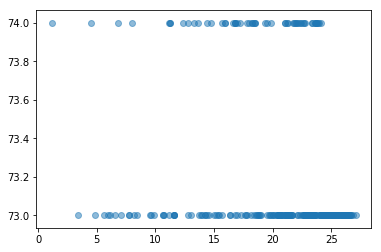

Number of Data Points in Bucket is :  264
Change in SOC WRT speed -0.44843


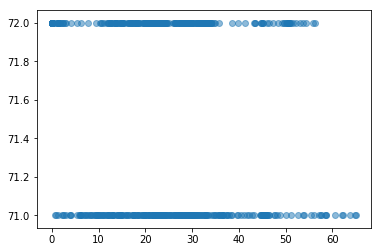

Number of Data Points in Bucket is :  590
Change in SOC WRT speed -0.10741


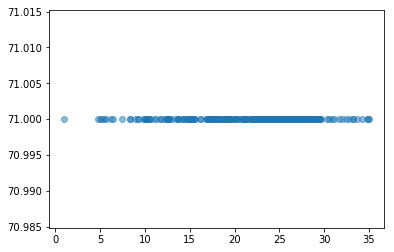

Number of Data Points in Bucket is :  305
Change in SOC WRT speed 0.00000


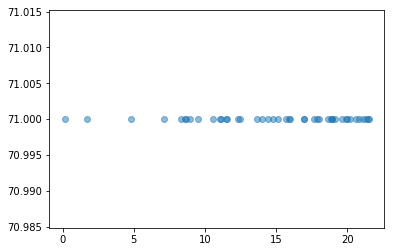

Number of Data Points in Bucket is :  44
Change in SOC WRT speed 0.00000


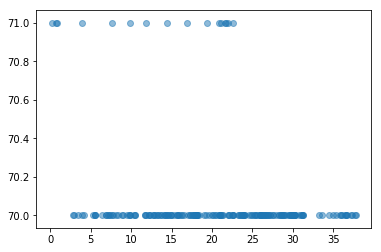

Number of Data Points in Bucket is :  191
Change in SOC WRT speed -0.36630


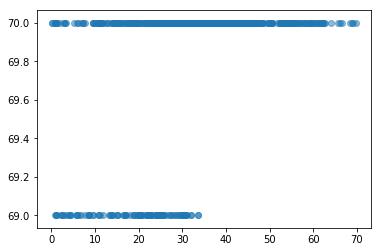

Number of Data Points in Bucket is :  712
Change in SOC WRT speed -1.51515


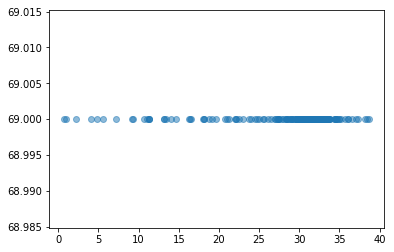

Number of Data Points in Bucket is :  175
Change in SOC WRT speed -0.00000


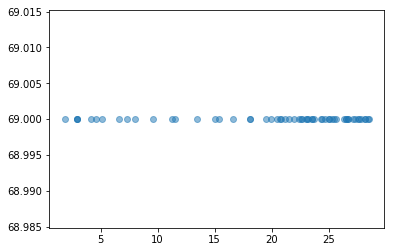

Number of Data Points in Bucket is :  58
Change in SOC WRT speed 0.00000


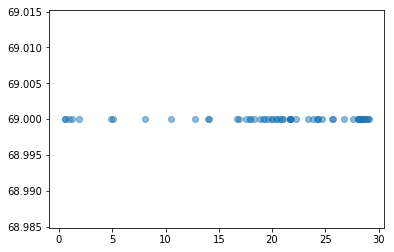

Number of Data Points in Bucket is :  60
Change in SOC WRT speed -0.00000


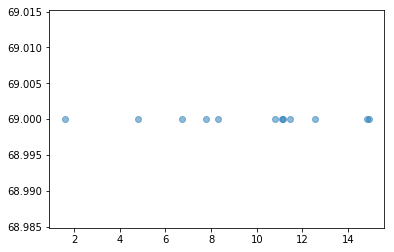

Number of Data Points in Bucket is :  12
Change in SOC WRT speed 0.00000


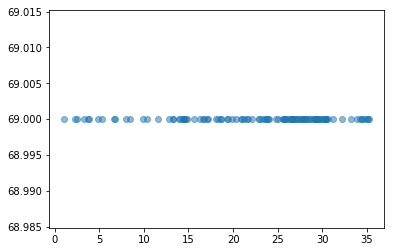

Number of Data Points in Bucket is :  113
Change in SOC WRT speed 0.00000


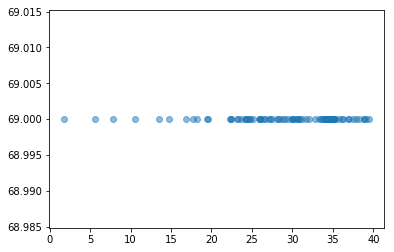

Number of Data Points in Bucket is :  94
Change in SOC WRT speed 0.00000


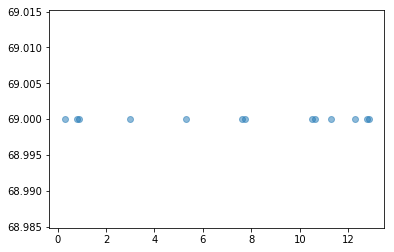

Number of Data Points in Bucket is :  13
Change in SOC WRT speed 0.00000


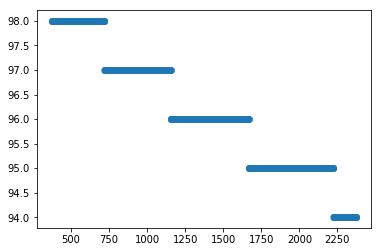

Number of Data Points in Bucket is :  2000
Change in SOC WRT Time -0.00200


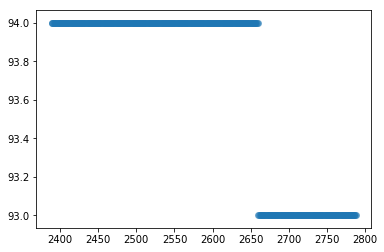

Number of Data Points in Bucket is :  400
Change in SOC WRT Time -0.00251


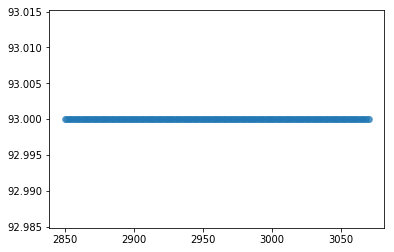

Number of Data Points in Bucket is :  221
Change in SOC WRT Time 0.00000


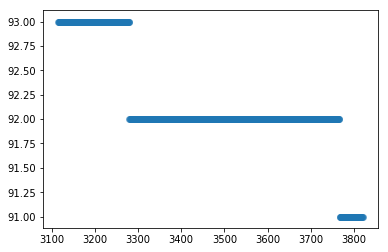

Number of Data Points in Bucket is :  706
Change in SOC WRT Time -0.00284


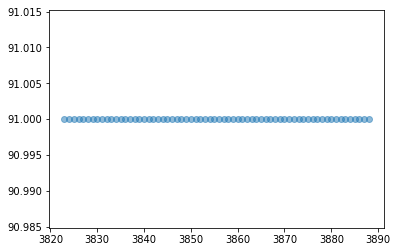

Number of Data Points in Bucket is :  66
Change in SOC WRT Time 0.00000


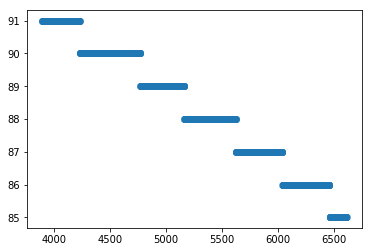

Number of Data Points in Bucket is :  2716
Change in SOC WRT Time -0.00221


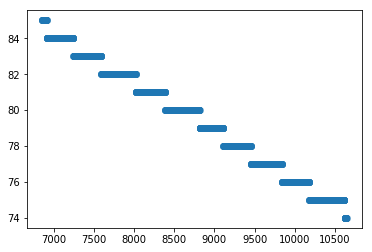

Number of Data Points in Bucket is :  3798
Change in SOC WRT Time -0.00290


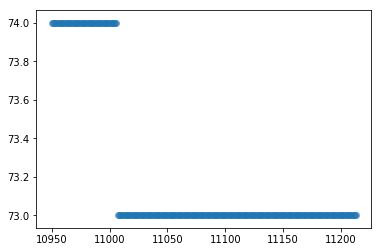

Number of Data Points in Bucket is :  264
Change in SOC WRT Time -0.00380


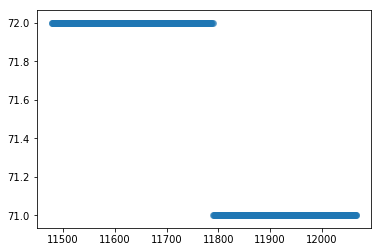

Number of Data Points in Bucket is :  590
Change in SOC WRT Time -0.00170


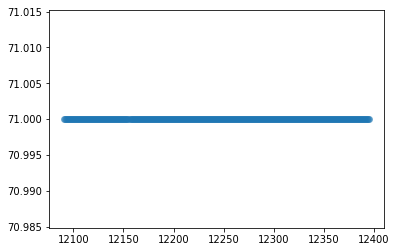

Number of Data Points in Bucket is :  305
Change in SOC WRT Time 0.00000


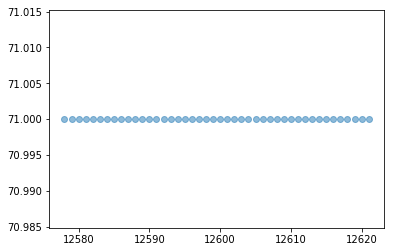

Number of Data Points in Bucket is :  44
Change in SOC WRT Time 0.00000


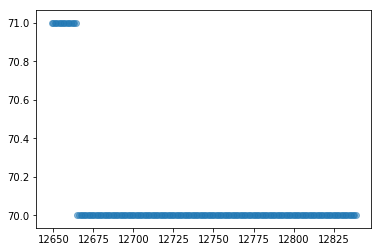

Number of Data Points in Bucket is :  191
Change in SOC WRT Time -0.00526


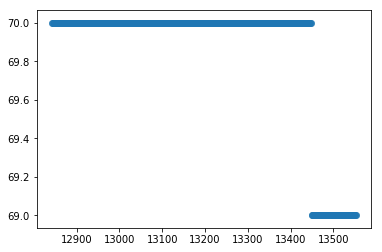

Number of Data Points in Bucket is :  712
Change in SOC WRT Time -0.00141


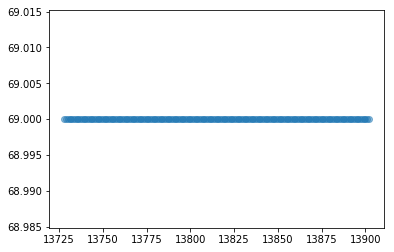

Number of Data Points in Bucket is :  175
Change in SOC WRT Time 0.00000


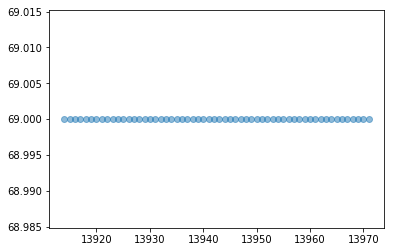

Number of Data Points in Bucket is :  58
Change in SOC WRT Time 0.00000


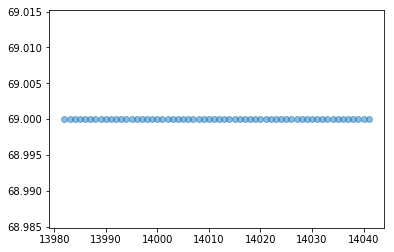

Number of Data Points in Bucket is :  60
Change in SOC WRT Time 0.00000


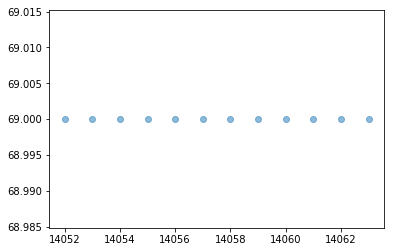

Number of Data Points in Bucket is :  12
Change in SOC WRT Time 0.00000


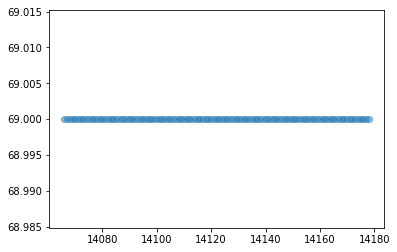

Number of Data Points in Bucket is :  113
Change in SOC WRT Time 0.00000


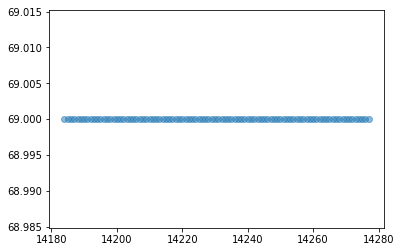

Number of Data Points in Bucket is :  94
Change in SOC WRT Time 0.00000


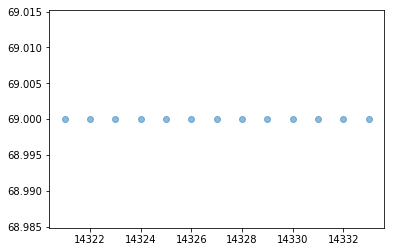

Number of Data Points in Bucket is :  13
Change in SOC WRT Time 0.00000
[19.31 26.12 28.55]
[19.31 26.12 28.55]
pie
[0.54484399 0.33471917 0.12043684]
Transition Matrix
[[0.15478136 0.05082527 0.79439337]
 [0.69280316 0.26289874 0.04429809]
 [0.83216941 0.06081098 0.10701961]]
Emmission Matrix
[[0.09547673 0.57417546 0.33034781]
 [0.18618232 0.35058354 0.46323414]
 [0.09744891 0.59837921 0.30417188]]


In [ ]:
for directorys in os.listdir():

    os.chdir(parent_dir+'//'+directorys)
    drive=[]
    charge=[]
    drive_df=[]
    charging_df=[]
    
    for i in os.listdir():
        if "Drive" in i:
            drive.append(i)
            
        else:
            charge.append(i)
    
    for i in drive:
        drive_df.append(pd.read_csv(i))
        
    for i in charge:
        charging_df.append(pd.read_csv(i))
        
    for i in range(len(drive_df)):
        z=cleaning(drive_df[i],list,hmm2)
        drive_df[i]=z.cleaned()
    for i in range(len(charging_df)):
        z=cleaning(charging_df[i],list,hmm2)
        charging_df[i]=z.cleaned()    
    
    
    def report(drive_df):
        for i in range(len(drive_df)):
            pre1=os.getcwd()
            newdir=drive[i].split('.')[0]
            os.mkdir(newdir)
            os.chdir(pre1+'\\'+newdir)
        
            for soc in list3:
                pre2=os.getcwd()
                os.mkdir(soc)
                os.chdir(pre2+'\\'+soc)
            
                k=VA_DRIVE(drive_df[i],soc)
            
                k1,k2=k.graph_SOC_DISTACE()
            
                k3=k.graph_SOC_SPEED()
                k4=k.graph_SOC_TIME()
            
                number_points=[]
            
                soc_dist=[]
                soc_speed=[]
                dist_soc=[]
                
                mean=[]
                std_dev=[]
                
                soc_time=[]
                
                
                
            
                for pt in k1:
                    number_points.append(pt[0])
                    soc_dist.append(pt[1])
                    mean.append(pt[2])
                    std_dev.append(pt[3])
                d={"# of points in Bucket":number_points,"SOC_DIST":soc_dist,"Mean":mean,"Std_dev":std_dev}
                df=pd.DataFrame(d)
            
                df.to_csv('graph_SOC_DISTACE.csv')
            
            
                number_points=[]
                mean=[]
                std_dev=[]
                high=[]
                medium=[]
                low=[]
            
                for pt in k2:
                    number_points.append(pt[0])
                    dist_soc.append(pt[1])
                    mean.append(pt[2])
                    std_dev.append(pt[3])
                    high.append(pt[4]*100)
                    medium.append(pt[5]*100)
                    low.append(pt[6]*100)
            
                d={"# of points in Bucket":number_points,"DIST_SOC":dist_soc,"Mean":mean,"Std_dev":std_dev,"TRAFFIC_HIGH":high,"TRAFFIC_MEDIUM":medium,"TRAFFIC_LOW":low}
                df=pd.DataFrame(d)
                df.to_csv('graph_DISTANCE_SOC.csv')
            
                number_points=[]
                mean=[]
                std_dev=[]
                high=[]
                medium=[]
                low=[]
                
                for pt in k3:
                    number_points.append(pt[0])
                    soc_speed.append(pt[1])
                    mean.append(pt[2])
                    std_dev.append(pt[3])
                    high.append(pt[4]*100)
                    medium.append(pt[5]*100)
                    low.append(pt[6]*100)
            
                d={"# of points in Bucket":number_points,"SOC_SPEED":soc_speed,"Mean":mean,"Std_dev":std_dev,"TRAFFIC_HIGH":high,"TRAFFIC_MEDIUM":medium,"TRAFFIC_LOW":low}
                df=pd.DataFrame(d)
                df.to_csv('graph_SOC_SPEED.csv')
            
                number_points=[]
                mean=[]
                std_dev=[]
                high=[]
                medium=[]
                low=[]
            
                for pt in k4:
                    number_points.append(pt[0])
                    soc_time.append(pt[1])
                    mean.append(pt[2])
                    std_dev.append(pt[3])
                    high.append(pt[4]*100)
                    medium.append(pt[5]*100)
                    low.append(pt[6]*100)
            
                d={"# of points in Bucket":number_points,"SOC_TIME":soc_time,"Mean":mean,"Std_dev":std_dev,"TRAFFIC_HIGH":high,"TRAFFIC_MEDIUM":medium,"TRAFFIC_LOW":low}
                df=pd.DataFrame(d)
                df.to_csv('graph_SOC_TIME.csv')
            
                os.chdir(pre2)
            
            os.chdir(pre1)
        
    
    report(drive_df)
    
    def report_charge(charging_df,charge):
        for i in range(len(charging_df)):
            pre1=os.getcwd()
            newdir=charge[i].split('.')[0]
            os.mkdir(newdir)
            os.chdir(pre1+'\\'+newdir)
        
            for soc in list3:
                pre2=os.getcwd()
                os.mkdir(soc)
                os.chdir(pre2+'\\'+soc)
            
            
                k=VA_CHARGE(charging_df[i],soc)
                j1=k.analysis()
                k.describe()
                time_stored=[]
                charge_stored=[]
                for z1 in range(len(j1)):
                    charge_stored.append(j1[z1][0])
                    time_stored.append(j1[z1][1])
                d={"# of points in Buckets":charge_stored,"Time Required":time_stored}
                df=pd.DataFrame(d)
                df.to_csv("CHARGING_TIME.csv")
            
            
                os.chdir(pre2)
            os.chdir(pre1)
            
            
    report_charge(charging_df,charge)
    os.chdir(parent_dir)

C:\Users\GauravS21\Desktop\KPIT WORK\temp
